# Compound Matrix Method Evans Function

### Note: Define all needed symbols outside the class

In [85]:
from sympy import *
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy import linalg as la
from time import time

In [2]:
from IPython.display import display, Markdown, Latex

In [3]:
plt.rcParams['figure.figsize'] = 15, 5

In [216]:
class SystemSolve():
    def __init__(self,dim,terms,A,deriv,e_val, e_vec,print_on=True, comp=False):
        self.dim = dim
        self.terms = terms
        self.A = A
        self.deriv = deriv
        self._createB()
        self.p = print_on
        self.comp = comp
        self._setEigs(e_val, e_vec)
        return
    
    def _createB(self):
        self.B = []
        for i in range(self.terms):
            b = []
            for j in range(1,self.dim+1):
                b.append(sympify('B{}_{}'.format(i,j)))
            self.B.append(b)
        return
    
    def _setEigs(self, e_val, e_vec):
        self.e_val = e_val
        self.B_tups = []
        b_tups = []
        for i in range(self.dim):
            b_tups.append((self.B[0][i],e_vec[i]))
        
        self.B_tups = b_tups
        #self.B_tups.append(b_tups)
        return
    
    def createSys(self):
        W = []
        W_deriv = []

        for j in range(self.dim):
            w = sympify(0)
            for i in range(self.terms):
                w += self.B[i][j]*sigma**i
            w_deriv = diff(w, sigma)

            W.append(w)
            W_deriv.append(w_deriv)

        # Store W and W' as numpy arrays
        self.W = np.array(W)
        self.W_deriv = np.array(W_deriv)

        # Replace matrix A by A-lam*I
        Anew = self.A - np.eye(self.dim)*self.e_val
        
        # Define system of equations from each row of A
        eqs = []
        for i in range(self.dim):
            eq = np.dot(Anew[i],self.W)-self.W_deriv[i]*self.deriv
            eqs.append(eq)
   
        # Isolate coefficients for each power of sigma
        eq_der = [eq.copy() for eq in eqs]
        heqs = []

        for i in range(self.terms):
            if i==0: prod = 1
            else: 
                prod *= i

            if self.p: print('\n\npower = {}'.format(i)) 
            res = [eqd.subs(sigma,0)/prod for eqd in eq_der]

            if self.p:
                for r in res:
                    print('\n')
                    print(r)

            heqs.append(res)    
            eq_der = [diff(eqd,sigma) for eqd in eq_der]

        # Solve for the coefficients of W
        up = 1
        stop = True
        start = time()
        for j in range(len(heqs)):
            if j == len(heqs)-1 and stop:
                break
            if self.p:
                p1 = '-'*21+'\nsystem when sigma = '
                p2 = str(j)+'\n'+'-'*21+'\n'
                print(p1+p2)
                
            if j == 0:
                try: 
                    matrix, vector = linear_eq_to_matrix(heqs[j],self.B[j+up])
                    soln = matrix.LUsolve(vector)
                    #print('made it here')
                except: 
                    #print('failed')
                    up = 0
                    stop = False
            
            matrix, vector = linear_eq_to_matrix(heqs[j],self.B[j+up])
            
            if self.comp:
                vector = np.array([complex(vector[i].subs(self.B_tups)) for i in range(self.dim)])
                matrix = np.array([[complex(matrix[i,j].subs(self.B_tups)) for j in range(self.dim)] for i in range(self.dim)])
            
            #matrix = np.array(matrix.tolist()).astype(complex)
            #vector = np.array(vector.tolist()).astype(complex)

            if self.comp:
                soln = np.linalg.solve(matrix,vector)
            else:
                soln = matrix.LUsolve(vector)

            for i in range(self.dim):
                if self.comp: 
                    val = soln[i]
                    val = complex(val)
                else:
                    val = soln[i].subs(self.B_tups)
                
                if j != 0 or stop: 
                    self.B_tups.append((self.B[j+up][i],val))
                if self.p: 
                    val = str(self.B[j+up][i]) +' = '+str(val)
                    print(val,'\n\n')

    def evalW(self, sig_val):
        to_sub = self.B_tups + [(sigma,sig_val)]
        
        W_vals = []
        
        for i in range(self.dim):
            val = self.W[i].subs(self.B_tups).subs(sigma,sig_val)
            if self.comp: val = complex(val)
            W_vals.append(val)
        return W_vals
    
    def checkBNorms(self):
        norms = []
        for b in self.B:
            norm = sympify(0)
            for i in b:
                norm = norm + Abs(i)
            norm = (norm)**(1/2)
            
            norm = norm.subs(self.B_tups)
            print(norm)
            norms.append(norm)

        return norms

## Evans Function

In [217]:
# this is for 2 dimension
"""def lift_A(a):
    A_lift = np.array([[a[0,0] + a[1,1], a[1,2], a[1,3], a[1,4], -a[0,2], -a[0,3], -a[0,4], 0, 0, 0],\
             [a[2,1], a[0,0] + a[2,2], a[2,3], a[2,4], a[0,1], 0, 0, -a[0,3], -a[0,4], 0],\
             [a[3,1], a[3,2], a[0,0] + a[3,3], a[3,4], 0, a[0,1], 0, a[0,2], 0, -a[0,4]],\
             [a[4,1], a[4,2], a[4,3], a[0,0] + a[4,4], 0, 0, a[0,1], 0, a[0,2], a[0,3]],\
             [-a[2,0], a[1,0], 0, 0, a[1,1] + a[2,2], a[2,3], a[2,4], -a[1,3], -a[1,4], 0],\
             [-a[3,0], 0, a[1,0], 0, a[3,2], a[1,1] + a[3,3], a[3,4], a[1,2], 0, -a[1,4]],\
             [-a[4,0], 0, 0, a[1,0], a[4,2], a[4,3], a[1,1] + a[4,4], 0, a[1,2], a[1,3]],\
             [0, -a[3,0], a[2,0], 0, -a[3,1], a[2,1], 0, a[2,2] + a[3,3], a[3,4], -a[2,4]],\
             [0, -a[4,0], 0, a[2,0], -a[4,1], 0, a[2,1], a[4,3], a[2,2] + a[4,4], a[2,3]],\
             [0, 0, -a[4,0], a[3,0], 0, -a[4,1], a[3,1], -a[4,2], a[3,2], a[3,3] + a[4,4]]])
    return A_lift"""



# for this one the eigenvalue matches
def lift_A(a):
    to_return = [[a[0,0] + a[1,1] + a[2,2], a[2,3], a[2,4], -a[1,3], -a[1,4], 0, a[0,3], a[0,4], 0, 0],\
                 [a[3,2], a[0,0] + a[1,1] + a[3,3], a[3,4], a[1,2], 0, -a[1,4], -a[0,2], 0, a[0,4], 0],\
                 [a[4,2], a[4,3], a[0,0] + a[1,1] + a[4,4], 0, a[1,2], a[1,3], 0, -a[0,2], -a[0,3], 0],\
                 [-a[3,1], a[2,1], 0, a[0,0] + a[2,2] + a[3,3], a[3,4], -a[2,4], a[0,1], 0, 0, a[0,4]],\
                 [-a[4,1], 0, a[2,1], a[4,3], a[0,0] + a[2,2] + a[4,4], a[2,3], 0, a[0,1], 0, -a[0,3]],\
                 [0, -a[4,1], a[3,1], -a[4,2], a[3,2], a[0,0] + a[3,3] + a[4,4], 0, 0, a[0,1], a[0,2]],\
                 [a[3,0], -a[2,0], 0, a[1,0], 0, 0, a[1,1] + a[2,2] + a[3,3], a[3,4], -a[2,4], a[1,4]],\
                 [a[4,0], 0, -a[2,0], 0, a[1,0], 0, a[4,3], a[1,1] + a[2,2] + a[4,4], a[2,3], -a[1,3]],\
                 [0, a[4,0], -a[3,0], 0, 0, a[1,0], -a[4,2], a[3,2], a[1,1] + a[3,3] + a[4,4], a[1,2]],\
                 [0, 0, 0, a[4,0], -a[3,0], a[2,0], a[4,1], -a[3,1], a[2,1], a[2,2] + a[3,3] + a[4,4]]]
    return to_return

# this is the one from Taylor but eigenvalue doesn't match
def lift_A1(a):
    to_return = [[a[0,0] + a[1,1], a[1,2], a[1,3], a[1,4], -a[0,2], -a[0,3], -a[0,4], 0, 0, 0],\
              [a[2,1], a[0,0] + a[2,2], a[2,3], a[2,4], a[0,1], 0, 0, -a[0,3], -a[0,4], 0],\
              [a[3,1], a[3,2], a[0,0] + a[3,3], a[3,4], 0, a[0,1], 0, a[0,2], 0, -a[0,4]],\
              [a[4,1], a[4,2], a[4,3], a[0,0] + a[4,4], 0, 0, a[0,1], 0, a[0,2], a[0,3]],\
              [-a[2,0], a[1,0], 0, 0, a[1,1] + a[2,2], a[2,3], a[2,4], -a[1,3], -a[1,4], 0],\
              [-a[3,0], 0, a[1,0], 0, a[3,2], a[1,1] + a[3,3], a[3,4], a[1,2], 0, -a[1,4]],\
              [-a[4,0], 0, 0, a[1,0], a[4,2], a[4,3], a[1,1] + a[4,4], 0, a[1,2], a[1,3]],\
              [0, -a[3,0], a[2,0], 0, -a[3,1], a[2,1], 0, a[2,2] + a[3,3], a[3,4], -a[2,4]],\
              [0, -a[4,0], 0, a[2,0], -a[4,1], 0, a[2,1], a[4,3], a[2,2] + a[4,4], a[2,3]],\
              [0, 0, -a[4,0], a[3,0], 0, -a[4,1], a[3,1], -a[4,2], a[3,2], a[3,3] + a[4,4]]]
    return to_return

In [218]:
# define symbols
sigma, alpha = symbols('sigma, alpha') 

In [219]:
def get_e_min(A):
    #A_plus = A.copy()
    A_minus = A.copy()
    for i in range(5):
        for j in range(5):
            try:
                #A_plus[i][j] = A_plus[i][j].subs(sigma,sp)
                #A_plus[i][j] = float(A_plus[i][j])
                A_minus[i][j] = A_minus[i][j].subs(sigma,sm)
                A_minus[i][j] = float(A_minus[i][j])
            except:
                pass

    #A_plus = np.array(A_plus, dtype=float)
    A_minus = np.array(A_minus, dtype=complex)

    #e_plus,v_plus = np.linalg.eig(A_plus)
    #print(e_plus)
    #eval_p = e_plus[np.argsort(e_plus)[:3]].sum()
    #print(eval_p)

    e_minus,v_minus = np.linalg.eig(A_minus)
    #print(e_minus)
    eval_m = e_minus[np.argsort(e_minus)[:3]].sum()
    #print(eval_m)
    return eval_m

In [231]:
def solve_lifted_evans(lam, G=5/3, nu=.1):
    # define parameters
    #G = 5/3
    mu = 1
    #nu = .1
    vp = G/(G+2)
    ep = 2/((G+2)**2)
    dim = 10
    
    # define e(sigma)
    a0 = ep
    a1 = (mu*vp - 2*nu*vp + nu - (4*G*a0*mu*nu - 6*G*mu*nu*vp**2 + 8*G*mu*nu*vp - \
          2*G*mu*nu + mu**2*vp**2 - 4*mu*nu*vp**2 + 2*mu*nu*vp + 4*nu**2*vp**2 - 4*nu**2*vp + nu**2)**(1/2))/(2*G*nu)
    a2 = (a1*mu - a1*nu - 3*mu*vp/2 + mu)/(3*G*a1*nu - mu*vp + 4*nu*vp - 2*nu)
    a3 = (2*G*a2**2*nu + a2*mu - 2*a2*nu - mu/2)/(4*G*a1*nu - mu*vp + 6*nu*vp - 3*nu)
    a4 = (5*G*a2*a3*nu + a3*mu - 3*a3*nu)/(5*G*a1*nu - mu*vp + 8*nu*vp - 4*nu)
    a5 = (6*G*a2*a4*nu - 3*G*a3**2*nu + a4*mu - 4*a4*nu)/(6*G*a1*nu - mu*vp + 10*nu*vp - 5*nu)
    e_coeffs = [a0,a1,a2,a3,a4,a5]
    e = sympify(0)
    for j in range(0,len(e_coeffs)):
        e = e+e_coeffs[j]*sigma**j
    e_deriv = diff(e,sigma)
    
    
    v = sigma + vp
    vx = (v*(v-1)+G*e)/mu
    ex = v*(-.5*(v-1)**2+e)/nu
    ux = vx
    uxx = (vx*(2*v-1)+G*ex)/mu

    g = (G*e-(nu+1)*ux)/nu
    h = -ex/v
    f = 2*v - 1

    A = np.array([[0,1,0,0,0],\
                  [lam*v/nu,v/nu,v*ux/nu-uxx,lam*g,g-h],\
                  [0,0,0,lam,1],\
                  [0,0,0,0,1],\
                  [0,G,lam*v+G*ux,lam*v,f-lam]])
    
    A_lift = lift_A(A)
    
    A_lift_lim = A_lift.copy()
    A_lift = np.array(A_lift)
    for i in range(10):
        for j in range(10):
            try:
                A_lift_lim[i][j] = A_lift_lim[i][j].subs(sigma,0)
                A_lift_lim[i][j] = float(A_lift_lim[i][j])
            except:
                pass
                #A_lift_lim[i][j] = A_lift[i][j]
            #print(type(A_lift_lim[i][j]))

    A_lift_lim = np.array(A_lift_lim, dtype=complex)
    e,v = np.linalg.eig(A_lift_lim)
    which = np.argmin(e)
    e_val_ = e[which]
    e_vec_ = v[:,which]
    
    #print(np.linalg.norm(A_lift_lim @ e_vec_ - e_val_*e_vec_))
    
    # compute eigenpair for A+
    A_lim_det = -alpha*((vp/nu-alpha)*(-alpha*(-alpha*(2*vp-1-lam-alpha)-lam*vp)+\
                lam*vp*(lam+alpha))-G*(alpha*(lam*G*ep/nu+alpha*G*ep/nu))) -\
                (lam*vp/nu)*(-alpha*(-alpha*(2*vp-1-lam-alpha)-lam*vp)+lam*vp*(lam+alpha))
    A_lim_det = Poly(A_lim_det, alpha)
    
    cfs = A_lim_det.coeffs()

    if isinstance(lam, complex):
        cfs = [complex(cfs_) for cfs_ in cfs]

    e_vals = np.roots(cfs)
    e_locs = np.argsort(e_vals)[:3]
    
    e_vecs = [[G*ep*(lam+e_val)/(nu*e_val**2-vp*(lam+e_val)),\
               e_val*G*ep*(lam+e_val)/(nu*e_val**2-vp*(lam+e_val)),\
               (lam+e_val)/e_val,1,e_val] for e_val in e_vals]
    e_vecs = [[el/np.linalg.norm(np.array(e_vec)) for el in e_vec] for e_vec in e_vecs]
    
    e_vals = e_vals[e_locs].sum()
    #print(e_vals)
    e_min = get_e_min(A)
    #to_cross = [e_vecs[j] for j in e_locs]
    #e_vecs = np.cross(to_cross[0],np.cross(to_cross[1],to_cross[2]))
    #print(np.linalg.norm(A_lift_lim-A1))
    return A_lift, ux, e_val_, e_vec_, e_min

In [221]:
G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

In [36]:
A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(400)
print(e_vals)

2.28981925068e-13
-454.259542424
-454.259542424


In [37]:
print(e_min)

-477.949182783


In [38]:
A_plus = A_orig.copy()
A_minus = A_orig.copy()
for i in range(5):
    for j in range(5):
        try:
            A_plus[i][j] = A_plus[i][j].subs(sigma,sp)
            A_plus[i][j] = float(A_plus[i][j])
            A_minus[i][j] = A_minus[i][j].subs(sigma,sm)
            A_minus[i][j] = float(A_minus[i][j])
        except:
            pass
        
A_plus = np.array(A_plus, dtype=float)
A_minus = np.array(A_minus, dtype=float)

e_plus,v_plus = np.linalg.eig(A_plus)
print(e_plus)
eval_p = e_plus[np.argsort(e_plus)[:3]].sum()
print(eval_p)

e_minus,v_minus = np.linalg.eig(A_minus)
print(e_minus)
eval_m = e_minus[np.argsort(e_minus)[:3]].sum()
print(eval_m)

[-400.54546775   45.02703795  -40.48156289   13.68704993  -13.23251178]
-454.259542424
[-400.00002669   68.44288555  -58.44285639   20.50629723  -19.5062997 ]
-477.949182783


In [22]:
df = e_vals + sigma*(eval_m - e_vals)/sm
print(df)

sys1 = SystemSolve(10, 5, A, u_x, df, e_vecs)
sys1.createSys()

-43.4310073245926*sigma - 454.259542424005


power = 0


458.80499696946*B0_1 + 400*B0_2 + B0_3 - 991.735537190082*B0_4 - 2.47933884297521*B0_5


458.80499696946*B0_2 + B0_3 - 2.47933884297521*B0_6


181.818181818182*B0_1 + 181.818181818182*B0_2 + 58.7140878785507*B0_3 + 991.735537190082*B0_6


454.259542424005*B0_4 + B0_5 - B0_6 + B0_7


-1.66666666666667*B0_1 + 181.818181818182*B0_4 + 54.1686333330962*B0_5 + 400*B0_6 + B0_8


-1.66666666666667*B0_2 - 181.818181818182*B0_4 + 54.1686333330962*B0_6 + B0_9


2.47933884297521*B0_10 + 1818.18181818182*B0_4 + 458.80499696946*B0_7 + B0_8 - B0_9


-991.735537190082*B0_10 + 1818.18181818182*B0_5 + 181.818181818182*B0_7 + 58.7140878785507*B0_8 + 400*B0_9


1818.18181818182*B0_6 - 181.818181818182*B0_7 + 58.7140878785507*B0_9


54.1686333330962*B0_10 + 1.66666666666667*B0_7


power = 1


53.4310073245926*B0_1 - 706.012209608118*B0_4 - 2.62939283444398*B0_5 + 459.660936584389*B1_1 + 400*B1_2 + B1_3 - 991.735537190082*B1_4 - 2.47933884297521*B1_5


In [23]:
sigmas1 = np.linspace(sp,sm,5)
W1 = np.zeros((10,len(sigmas1)))
for i,sig in tqdm(enumerate(sigmas1)):
    w_val = sys1.evalW(sig)
    W1[:,i] = w_val

5it [00:04,  1.12it/s]


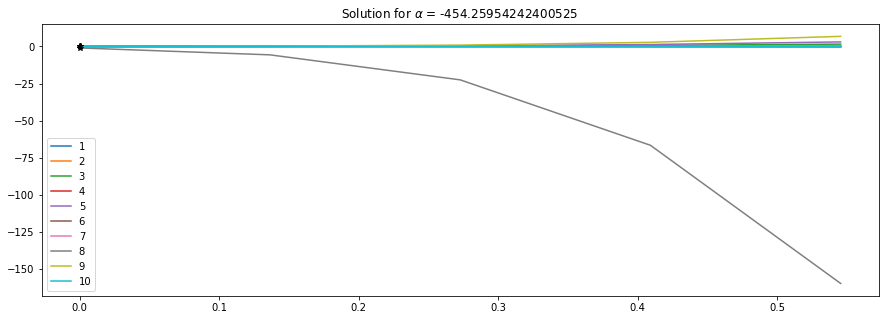

In [24]:
for i in range(len(W1[:,0])):
    plt.plot(sigmas1[:], -W1[i][:],label=i+1)
    plt.plot(0,-e_vecs[i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals))
plt.show()



power = 0


458.80499696946*B0_1 + 400*B0_2 + B0_3 - 991.735537190082*B0_4 - 2.47933884297521*B0_5


458.80499696946*B0_2 + B0_3 - 2.47933884297521*B0_6


181.818181818182*B0_1 + 181.818181818182*B0_2 + 58.7140878785507*B0_3 + 991.735537190082*B0_6


454.259542424005*B0_4 + B0_5 - B0_6 + B0_7


-1.66666666666667*B0_1 + 181.818181818182*B0_4 + 54.1686333330962*B0_5 + 400*B0_6 + B0_8


-1.66666666666667*B0_2 - 181.818181818182*B0_4 + 54.1686333330962*B0_6 + B0_9


2.47933884297521*B0_10 + 1818.18181818182*B0_4 + 458.80499696946*B0_7 + B0_8 - B0_9


-991.735537190082*B0_10 + 1818.18181818182*B0_5 + 181.818181818182*B0_7 + 58.7140878785507*B0_8 + 400*B0_9


1818.18181818182*B0_6 - 181.818181818182*B0_7 + 58.7140878785507*B0_9


54.1686333330962*B0_10 + 1.66666666666667*B0_7


power = 1


53.4310073245926*B0_1 - 706.012209608118*B0_4 - 2.62939283444398*B0_5 + 459.660936584389*B1_1 + 400*B1_2 + B1_3 - 991.735537190082*B1_4 - 2.47933884297521*B1_5


53.4310073245926*B0_2 - 4.62326723772085*

0it [00:00, ?it/s]

B9_10 = -0.0290941266486388 




5it [00:32,  6.56s/it]


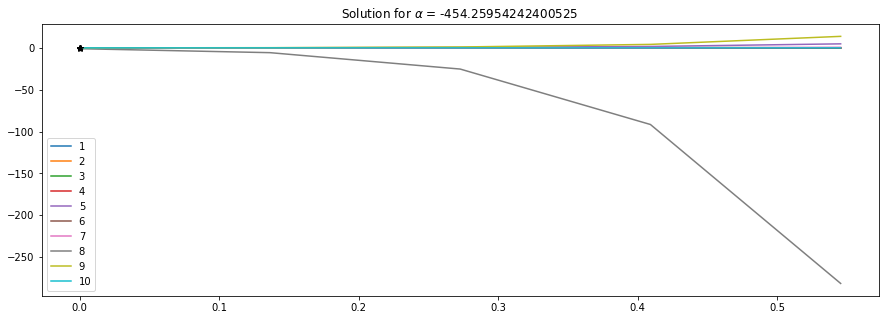

In [25]:
sys2 = SystemSolve(10, 10, A, u_x, df, e_vecs)
sys2.createSys()

sigmas2 = np.linspace(sp,sm,5)
W2 = np.zeros((10,len(sigmas2)))
for i,sig in tqdm(enumerate(sigmas2)):
    w_val = sys2.evalW(sig)
    W2[:,i] = w_val
    
for i in range(len(W2[:,0])):
    plt.plot(sigmas2[:], -W2[i][:],label=i+1)
    plt.plot(0,-e_vecs[i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals))
plt.show()

In [26]:
W2[:,-1]

array([  4.66942172e-04,  -6.99180464e-05,   1.74500268e-02,
         1.20132972e-02,  -4.80526630e+00,   2.34845132e-01,
        -7.03541282e-01,   2.81414164e+02,  -1.37540044e+01,
         1.48206394e-02])

In [27]:
W1[:,-1]

array([ -3.79307324e-04,   3.93240874e-03,  -1.56623353e+00,
         7.63691637e-03,  -3.05641701e+00,   1.31917303e-01,
        -3.98861090e-01,   1.59637139e+02,  -6.80315961e+00,
         9.45823033e-03])



power = 0


458.80499696946*B0_1 + 400*B0_2 + B0_3 - 991.735537190082*B0_4 - 2.47933884297521*B0_5


458.80499696946*B0_2 + B0_3 - 2.47933884297521*B0_6


181.818181818182*B0_1 + 181.818181818182*B0_2 + 58.7140878785507*B0_3 + 991.735537190082*B0_6


454.259542424005*B0_4 + B0_5 - B0_6 + B0_7


-1.66666666666667*B0_1 + 181.818181818182*B0_4 + 54.1686333330962*B0_5 + 400*B0_6 + B0_8


-1.66666666666667*B0_2 - 181.818181818182*B0_4 + 54.1686333330962*B0_6 + B0_9


2.47933884297521*B0_10 + 1818.18181818182*B0_4 + 458.80499696946*B0_7 + B0_8 - B0_9


-991.735537190082*B0_10 + 1818.18181818182*B0_5 + 181.818181818182*B0_7 + 58.7140878785507*B0_8 + 400*B0_9


1818.18181818182*B0_6 - 181.818181818182*B0_7 + 58.7140878785507*B0_9


54.1686333330962*B0_10 + 1.66666666666667*B0_7


power = 1


53.4310073245926*B0_1 - 706.012209608118*B0_4 - 2.62939283444398*B0_5 + 459.660936584389*B1_1 + 400*B1_2 + B1_3 - 991.735537190082*B1_4 - 2.47933884297521*B1_5


53.4310073245926*B0_2 - 4.62326723772085*

0it [00:00, ?it/s]

B2_8 = 88.0046285767137 


B2_9 = -3.38143699047501 


B2_10 = 0.00576953527526795 




5it [00:01,  2.60it/s]


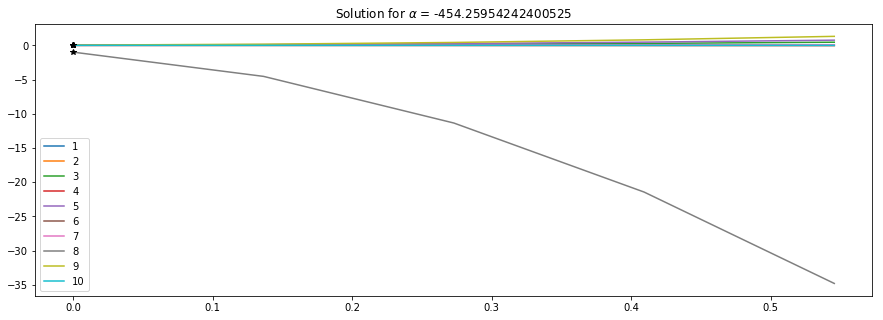

In [28]:
sys3 = SystemSolve(10, 3, A, u_x, df, e_vecs)
sys3.createSys()

sigmas3 = np.linspace(sp,sm,5)
W3 = np.zeros((10,len(sigmas3)))
for i,sig in tqdm(enumerate(sigmas3)):
    w_val = sys3.evalW(sig)
    W3[:,i] = w_val
    
for i in range(len(W3[:,0])):
    plt.plot(sigmas3[:], -W3[i][:],label=i+1)
    plt.plot(0,-e_vecs[i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals))
plt.show()



power = 0


458.80499696946*B0_1 + 400*B0_2 + B0_3 - 991.735537190082*B0_4 - 2.47933884297521*B0_5


458.80499696946*B0_2 + B0_3 - 2.47933884297521*B0_6


181.818181818182*B0_1 + 181.818181818182*B0_2 + 58.7140878785507*B0_3 + 991.735537190082*B0_6


454.259542424005*B0_4 + B0_5 - B0_6 + B0_7


-1.66666666666667*B0_1 + 181.818181818182*B0_4 + 54.1686333330962*B0_5 + 400*B0_6 + B0_8


-1.66666666666667*B0_2 - 181.818181818182*B0_4 + 54.1686333330962*B0_6 + B0_9


2.47933884297521*B0_10 + 1818.18181818182*B0_4 + 458.80499696946*B0_7 + B0_8 - B0_9


-991.735537190082*B0_10 + 1818.18181818182*B0_5 + 181.818181818182*B0_7 + 58.7140878785507*B0_8 + 400*B0_9


1818.18181818182*B0_6 - 181.818181818182*B0_7 + 58.7140878785507*B0_9


54.1686333330962*B0_10 + 1.66666666666667*B0_7


power = 1


53.4310073245926*B0_1 - 706.012209608118*B0_4 - 2.62939283444398*B0_5 + 459.660936584389*B1_1 + 400*B1_2 + B1_3 - 991.735537190082*B1_4 - 2.47933884297521*B1_5


53.4310073245926*B0_2 - 4.62326723772085*

0it [00:00, ?it/s]

B1_8 = 13.9801518075901 


B1_9 = -0.497402471422769 


B1_10 = 0.000994060455988707 




5it [00:00, 11.96it/s]


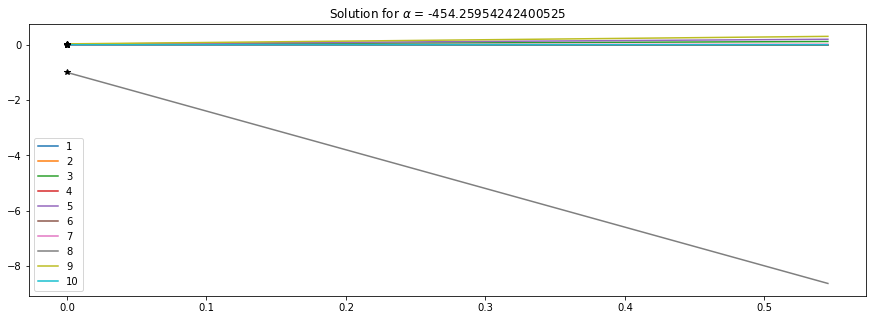

In [29]:
sys4 = SystemSolve(10, 2, A, u_x, df, e_vecs)
sys4.createSys()

sigmas4 = np.linspace(sp,sm,5)
W4 = np.zeros((10,len(sigmas4)))
for i,sig in tqdm(enumerate(sigmas4)):
    w_val = sys4.evalW(sig)
    W4[:,i] = w_val
    
for i in range(len(W4[:,0])):
    plt.plot(sigmas4[:], -W4[i][:],label=i+1)
    plt.plot(0,-e_vecs[i],'*k')
plt.legend()
plt.title(r'Solution for $\alpha$ = {}'.format(e_vals))
plt.show()

In [30]:
W4[:,-1]

array([ -2.71125751e-05,   2.95972287e-04,  -1.18165338e-01,
         4.97701625e-04,  -1.99310069e-01,   7.07297830e-03,
        -2.15364946e-02,   8.62458457e+00,  -3.04382736e-01,
         6.18960618e-04])

In [31]:
W2[:,-1]

array([  4.66942172e-04,  -6.99180464e-05,   1.74500268e-02,
         1.20132972e-02,  -4.80526630e+00,   2.34845132e-01,
        -7.03541282e-01,   2.81414164e+02,  -1.37540044e+01,
         1.48206394e-02])

# $\Lambda$ = 398.6

3.28256383519e-13
(-14.408954127+412.376342342j)


### $\lambda$ = -398.6j

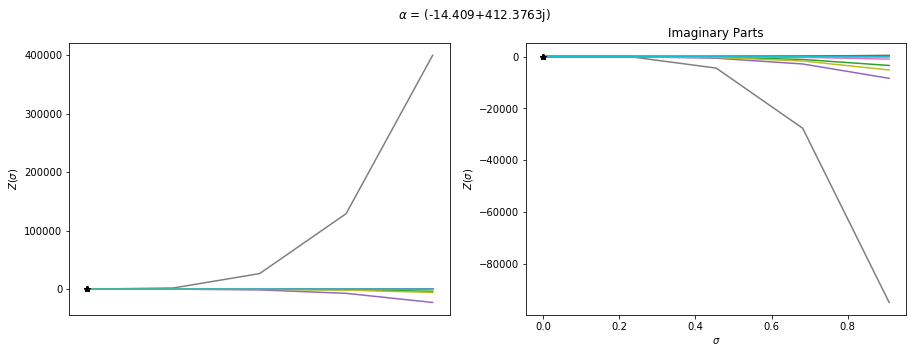

3.16868092267e-13
(-300.483892544+289.308461911j)


### $\lambda$ = (281.8528-281.8528j)

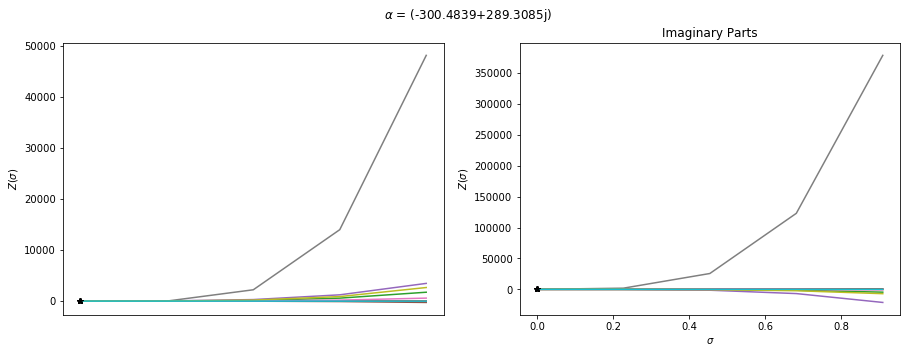

9.74927568165e-13
(-418.713762055+0j)


### $\lambda$ = (398.6+0j)

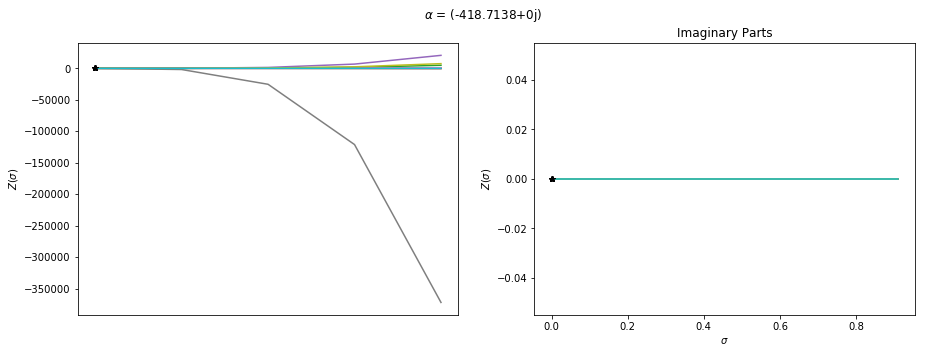

3.16868092267e-13
(-300.483892544-289.308461911j)


### $\lambda$ = (281.8528+281.8528j)

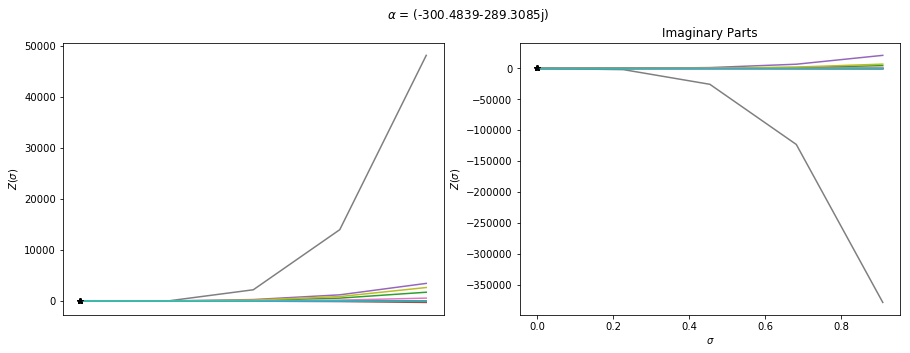

3.28256383519e-13
(-14.408954127-412.376342342j)


### $\lambda$ = 398.6j

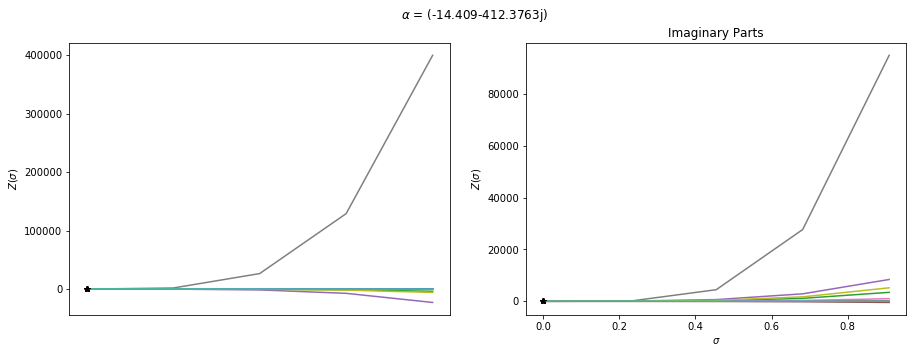

# $\Lambda$ = 388.8

5.41377197636e-13
(-10.9181888968+398.95272158j)


### $\lambda$ = -388.8j

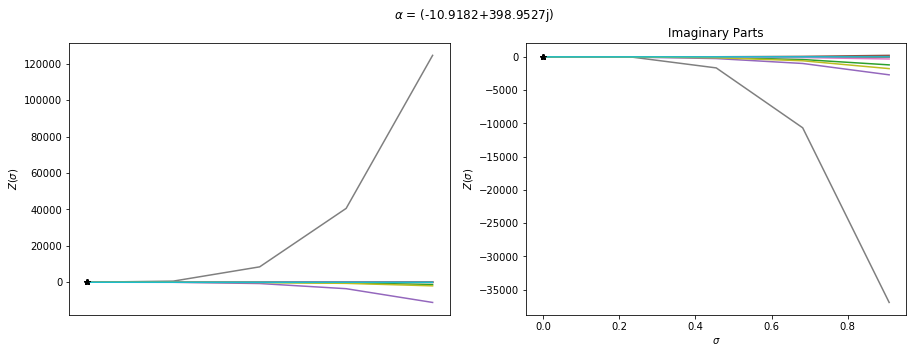

6.06843067672e-13
(-288.951541137+280.417724586j)


### $\lambda$ = (274.9231-274.9231j)

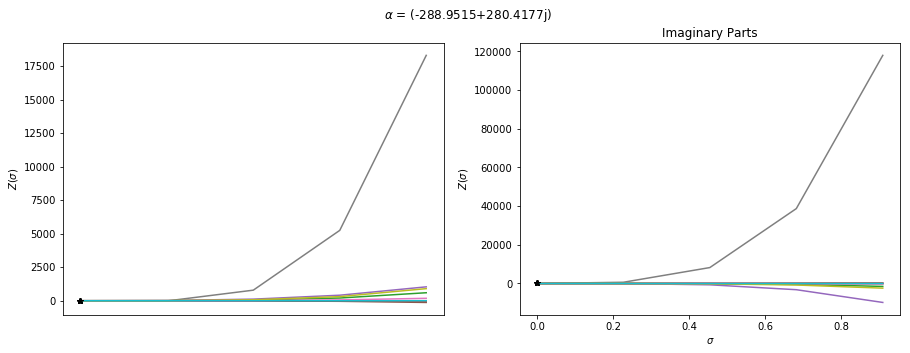

4.42424811096e-13
(-403.920596392+0j)


### $\lambda$ = (388.8+0j)

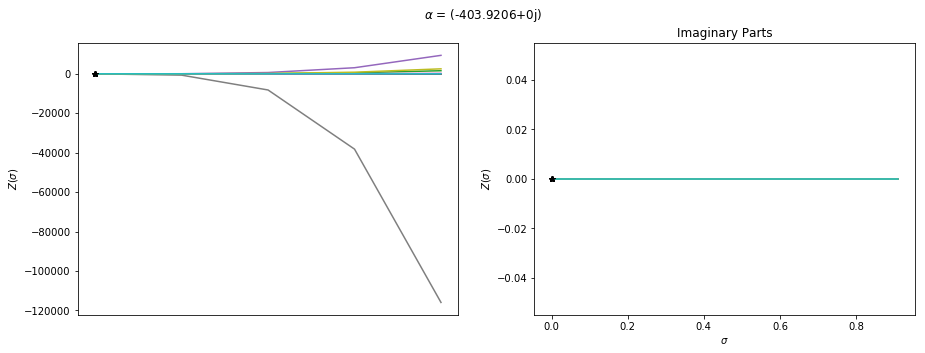

6.06843067672e-13
(-288.951541137-280.417724586j)


### $\lambda$ = (274.9231+274.9231j)

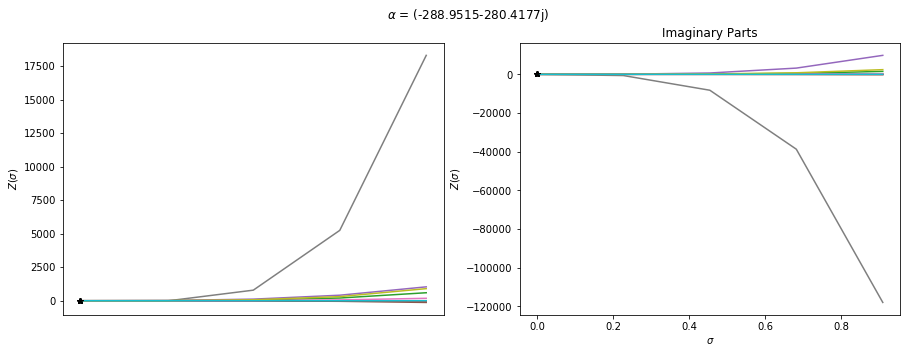

5.41377197636e-13
(-10.9181888968-398.95272158j)


### $\lambda$ = 388.8j

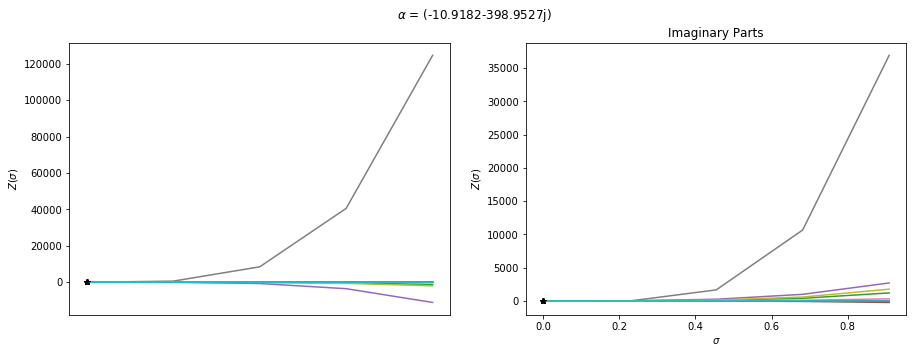

# $\Lambda$ = 385.3

4.57023878113e-13
(-9.18383695122+393.674047867j)


### $\lambda$ = -385.3j

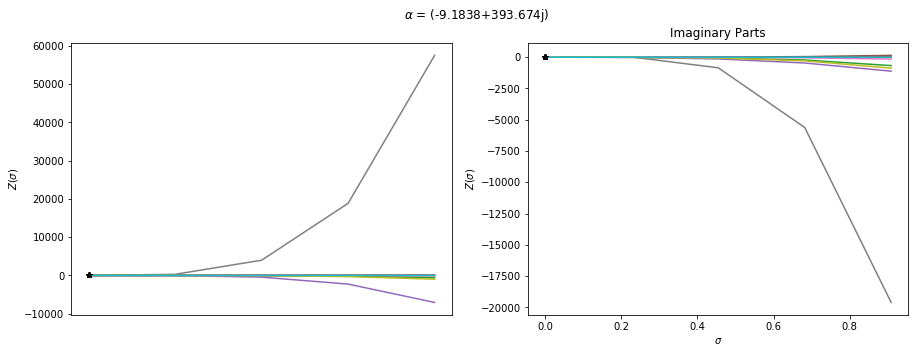

5.82362762812e-13
(-284.19669419+276.980238985j)


### $\lambda$ = (272.4482-272.4482j)

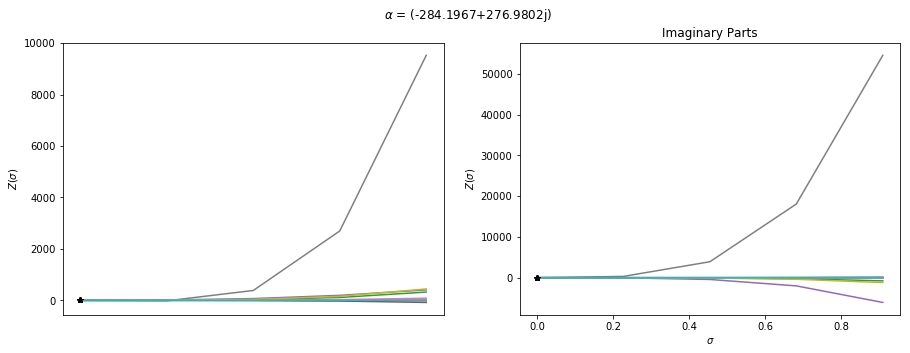

5.86327119366e-13
(-397.949026713+3.73824565441e-16j)


### $\lambda$ = (385.3+0j)

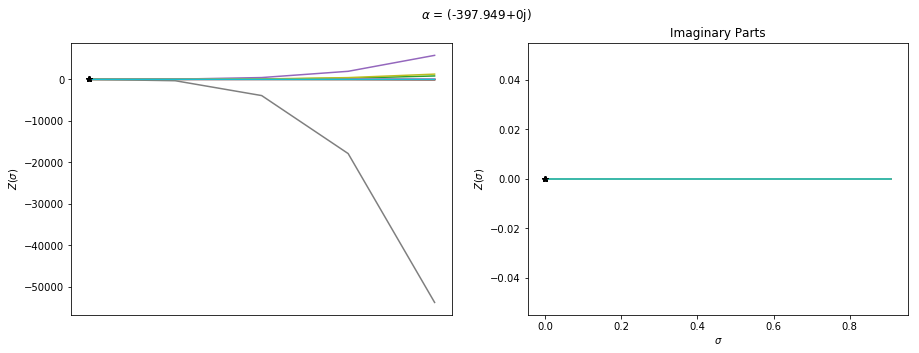

5.82362762812e-13
(-284.19669419-276.980238985j)


### $\lambda$ = (272.4482+272.4482j)

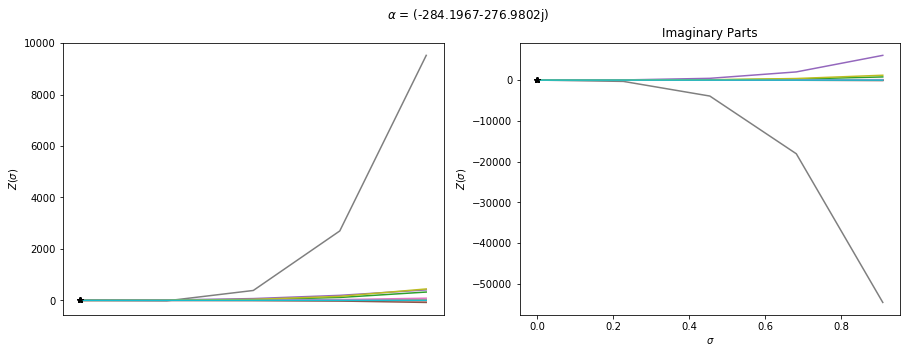

4.57023878113e-13
(-9.18383695122-393.674047867j)


### $\lambda$ = 385.3j

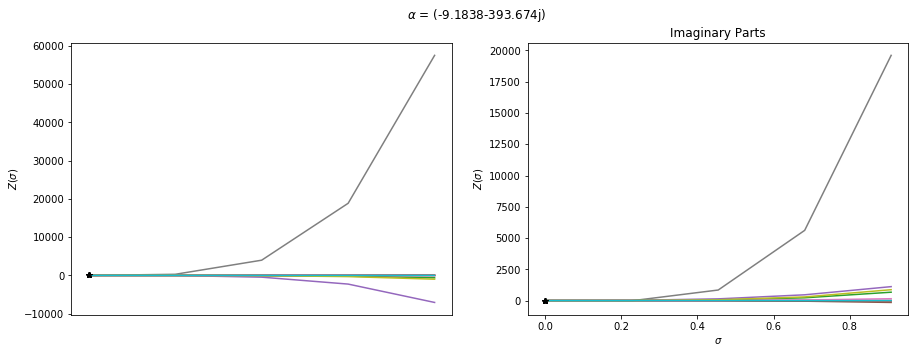

# $\Lambda$ = 733.8

2.01205906689e-12
(-10.6967802066+743.662364762j)


### $\lambda$ = -733.8j

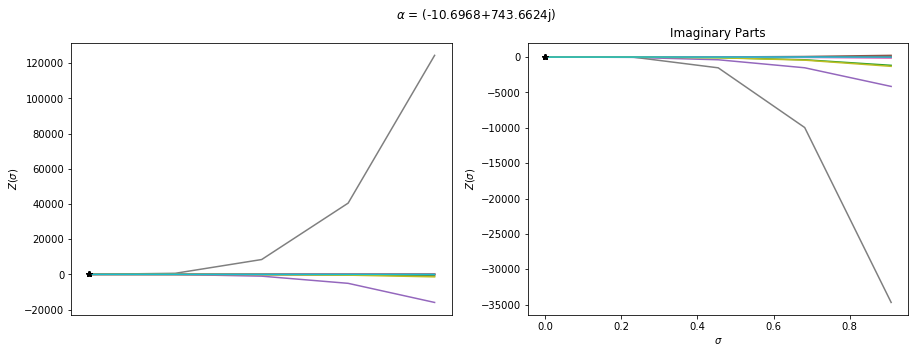

6.99262847372e-13
(-532.593187114+524.212427012j)


### $\lambda$ = (518.875-518.875j)

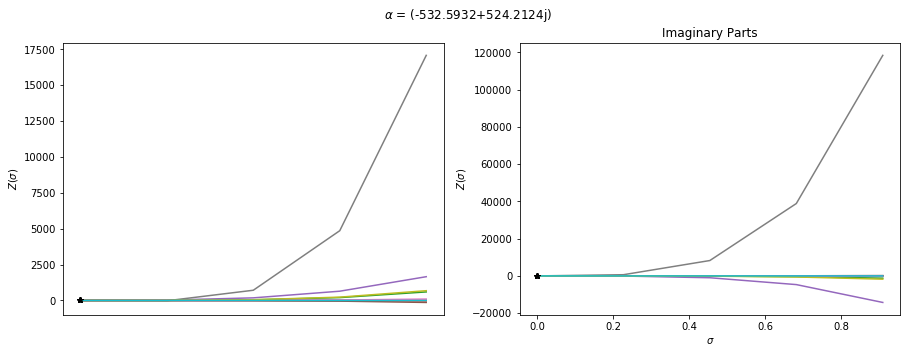

5.91965264211e-13
(-748.579224542+0j)


### $\lambda$ = (733.8+0j)

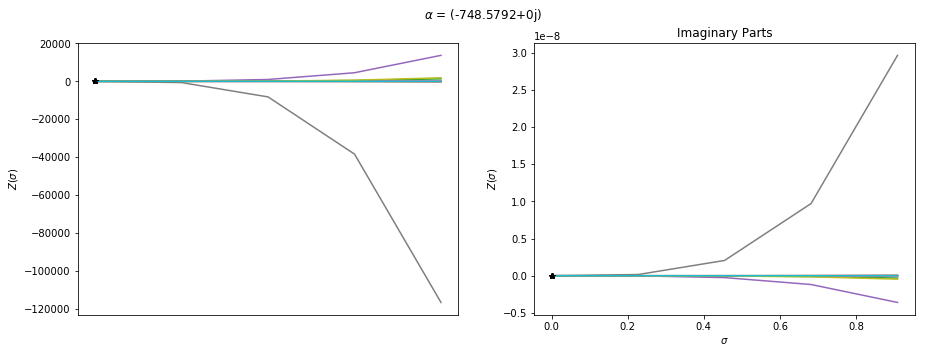

6.99262847372e-13
(-532.593187114-524.212427012j)


### $\lambda$ = (518.875+518.875j)

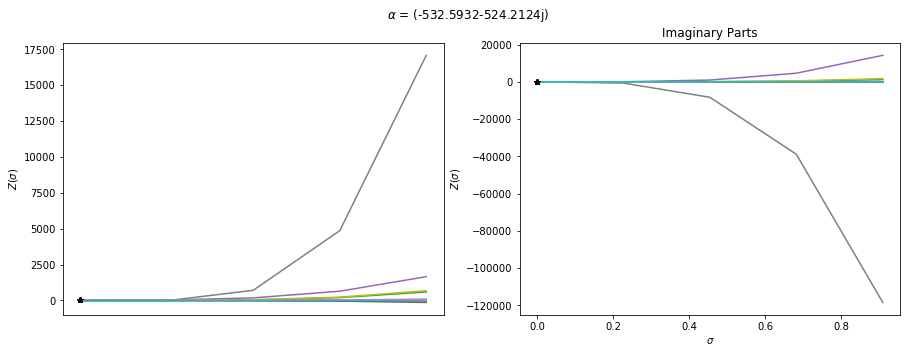

2.01205906689e-12
(-10.6967802066-743.662364762j)


### $\lambda$ = 733.8j

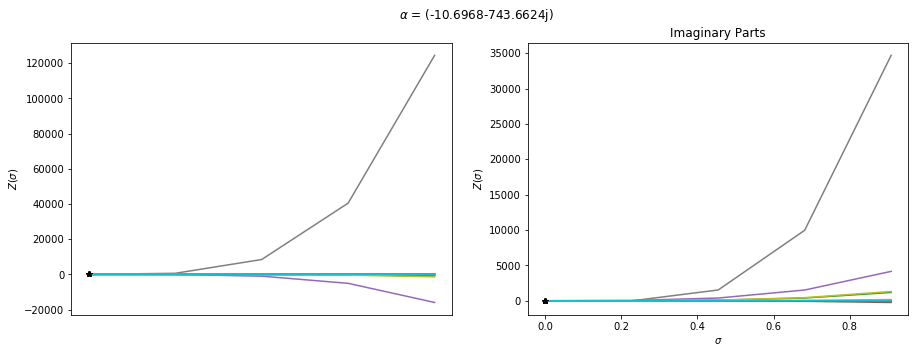

# $\Lambda$ = 1755.6

1.88702639432e-12
(-13.7804400605+1768.53026651j)


### $\lambda$ = -1755.6j

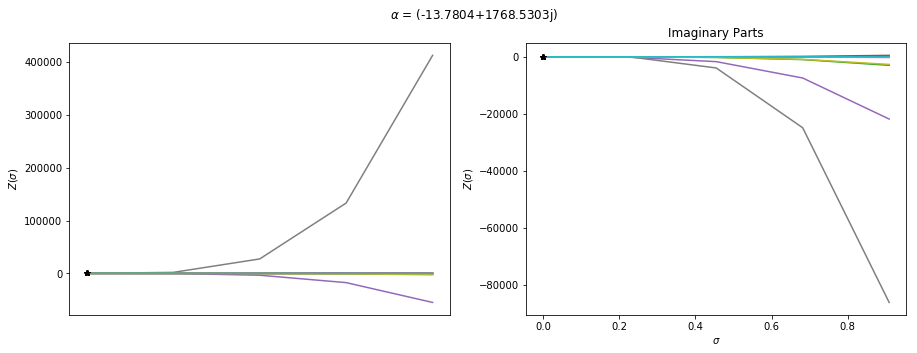

1.4097771295e-12
(-1259.13970732+1248.39447419j)


### $\lambda$ = (1241.3967-1241.3967j)

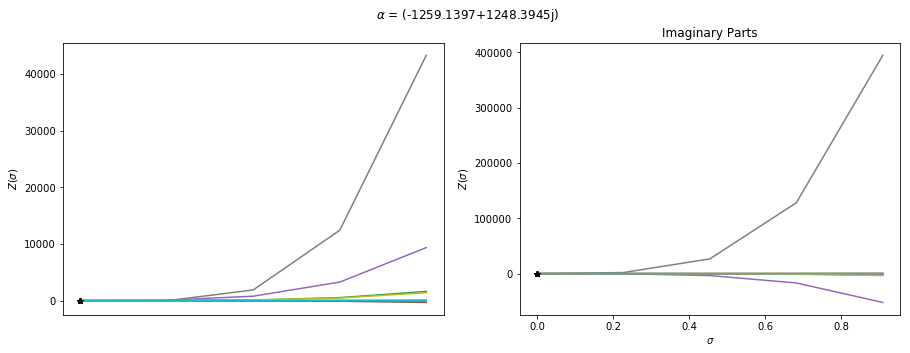

1.4863728761e-12
(-1774.7345234+0j)


### $\lambda$ = (1755.6+0j)

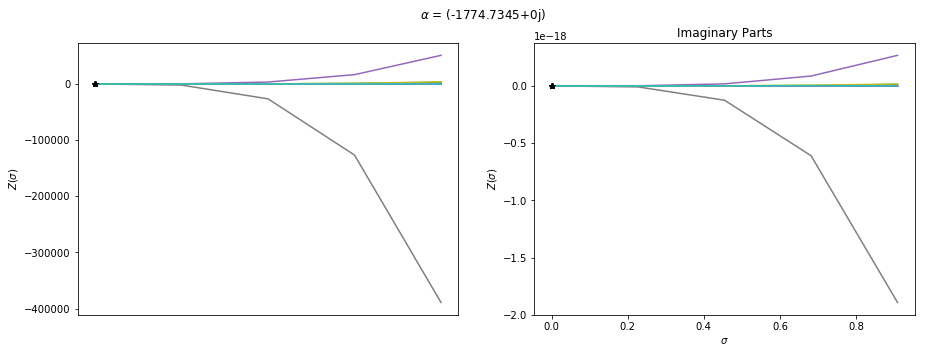

1.4097771295e-12
(-1259.13970732-1248.39447419j)


### $\lambda$ = (1241.3967+1241.3967j)

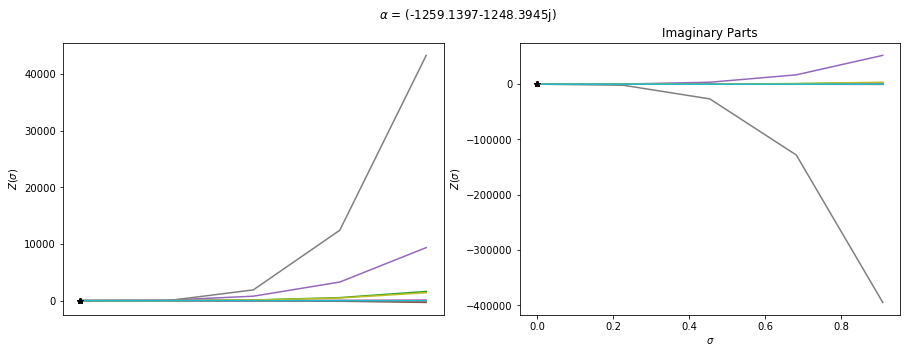

1.88702639432e-12
(-13.7804400605-1768.53026651j)


### $\lambda$ = 1755.6j

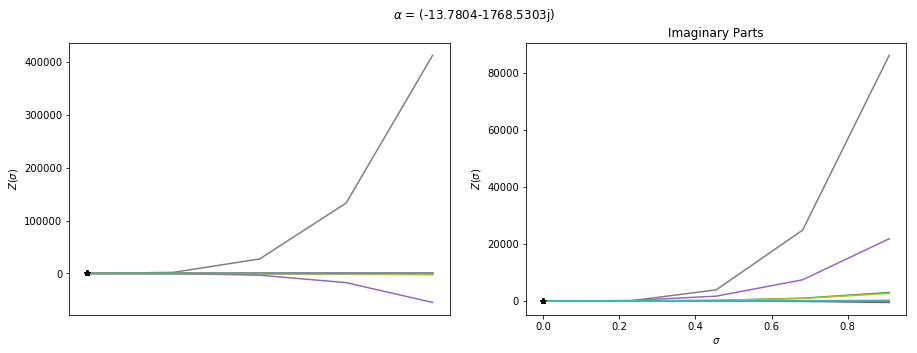

# $\Lambda$ = 211.7

1.82413629193e-13
(-13.9273346885+225.290248566j)


### $\lambda$ = -211.7j

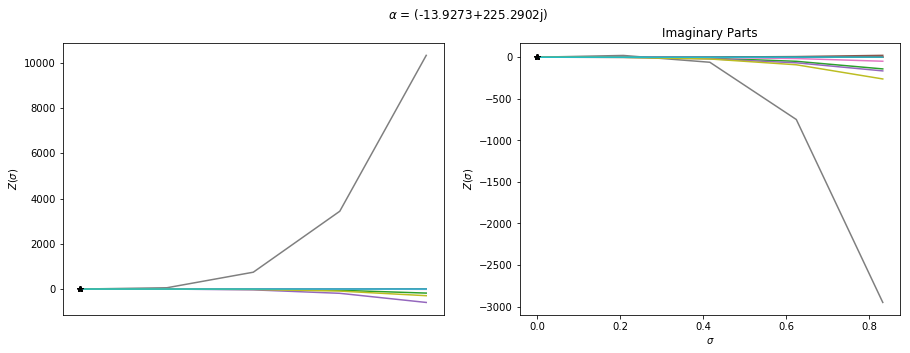

4.57291630617e-13
(-167.789262896+157.049492414j)


### $\lambda$ = (149.6945-149.6945j)

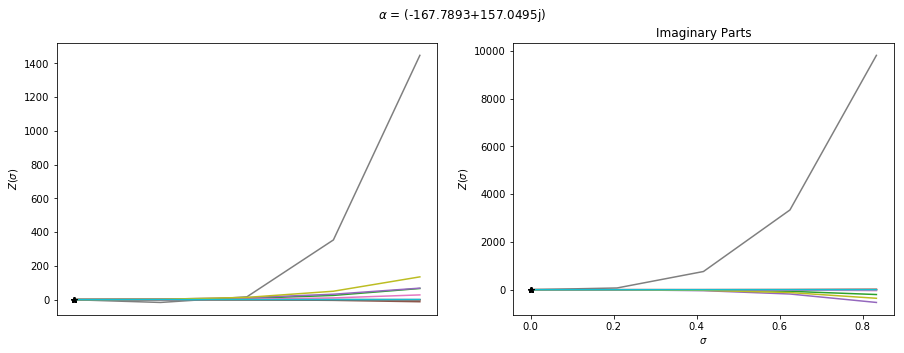

5.15765864521e-14
(-231.25816292+0j)


### $\lambda$ = (211.7+0j)

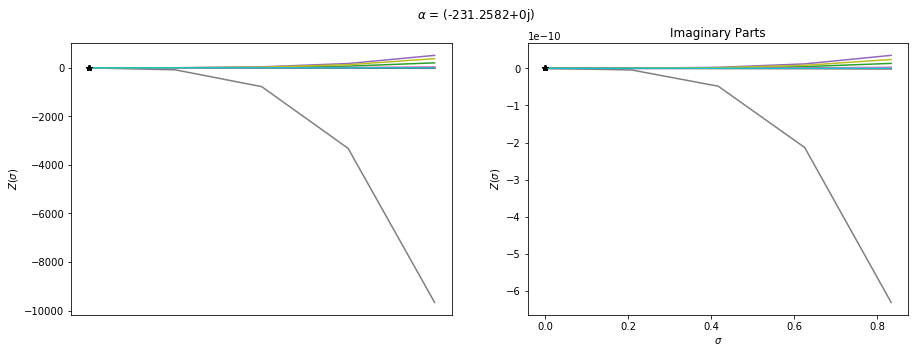

4.57291630617e-13
(-167.789262896-157.049492414j)


### $\lambda$ = (149.6945+149.6945j)

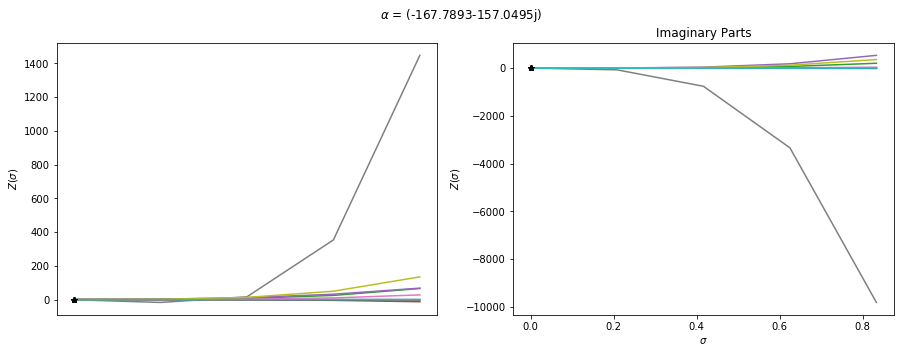

1.82413629193e-13
(-13.9273346885-225.290248566j)


### $\lambda$ = 211.7j

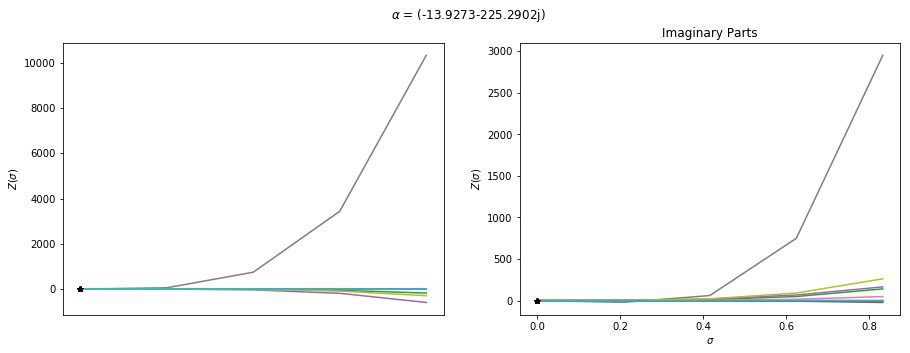

# $\Lambda$ = 182.3

2.85103674662e-13
(-9.98882056031+191.713989145j)


### $\lambda$ = -182.3j

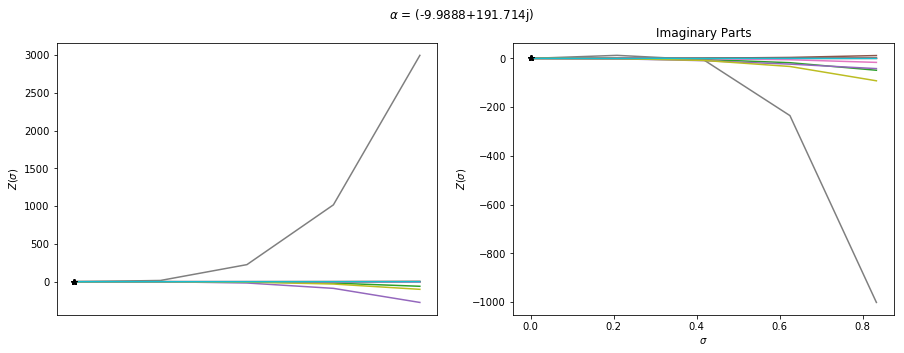

5.581734428e-13
(-141.777794929+134.000366565j)


### $\lambda$ = (128.9056-128.9056j)

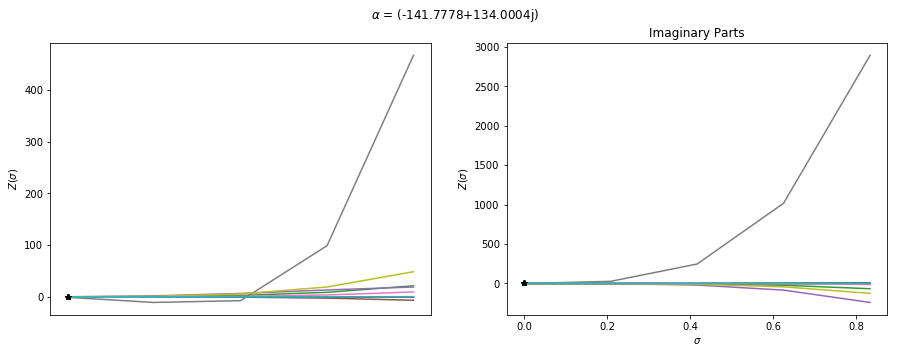

5.47476582221e-13
(-196.184752879+0j)


### $\lambda$ = (182.3+0j)

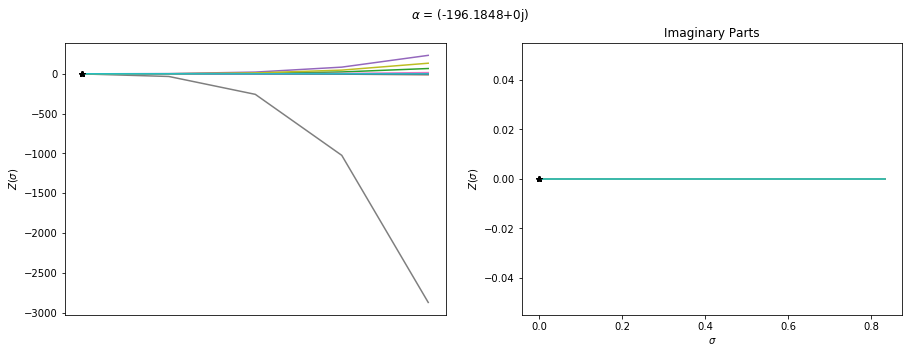

5.581734428e-13
(-141.777794929-134.000366565j)


### $\lambda$ = (128.9056+128.9056j)

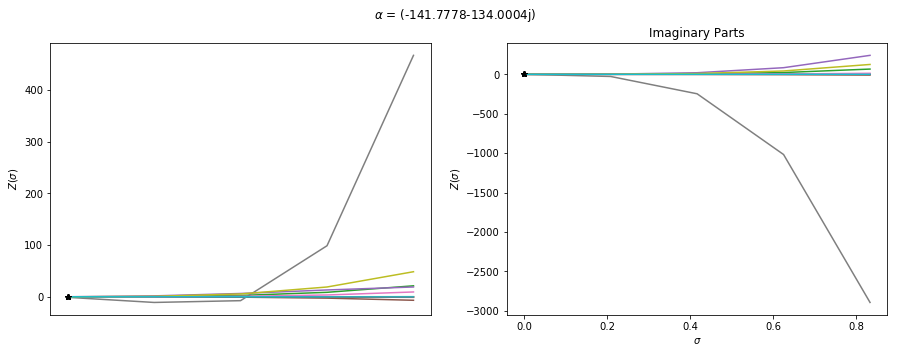

2.85103674662e-13
(-9.98882056031-191.713989145j)


### $\lambda$ = 182.3j

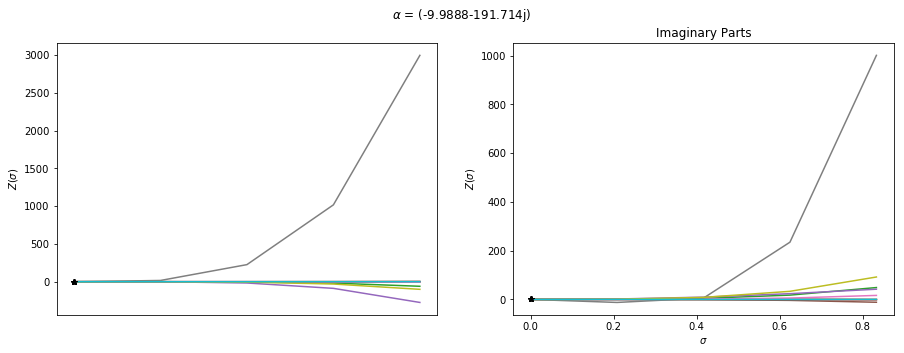

# $\Lambda$ = 175.1

1.47501887342e-13
(-8.30008692922+182.746144695j)


### $\lambda$ = -175.1j

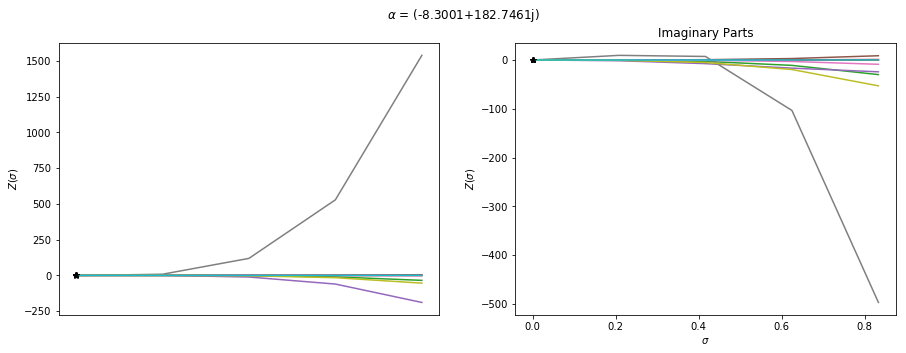

2.5808878749e-13
(-134.454654964+127.952442378j)


### $\lambda$ = (123.8144-123.8144j)

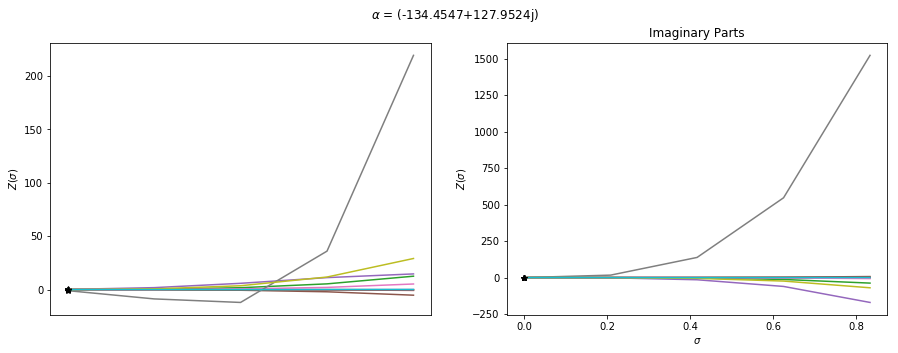

2.97567423057e-13
(-186.562024015+8.80225882994e-17j)


### $\lambda$ = (175.1+0j)

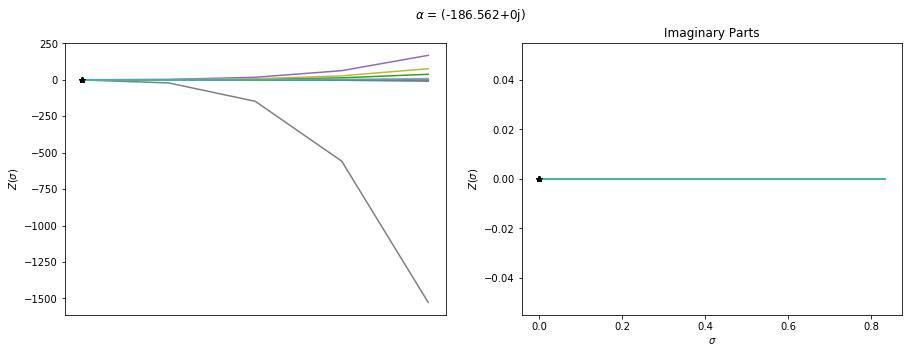

2.5808878749e-13
(-134.454654964-127.952442378j)


### $\lambda$ = (123.8144+123.8144j)

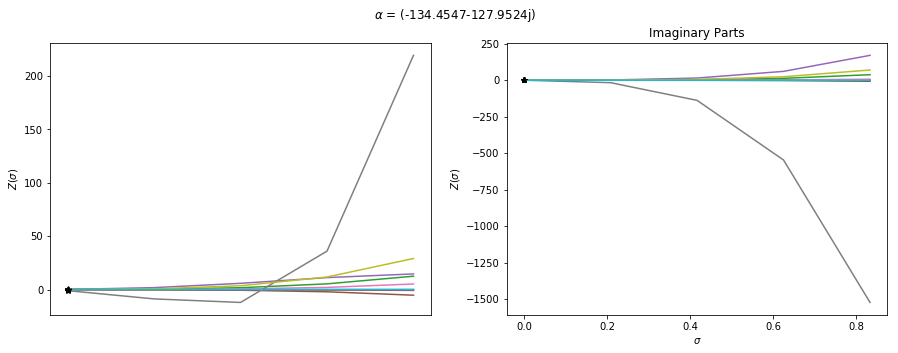

1.47501887342e-13
(-8.30008692922-182.746144695j)


### $\lambda$ = 175.1j

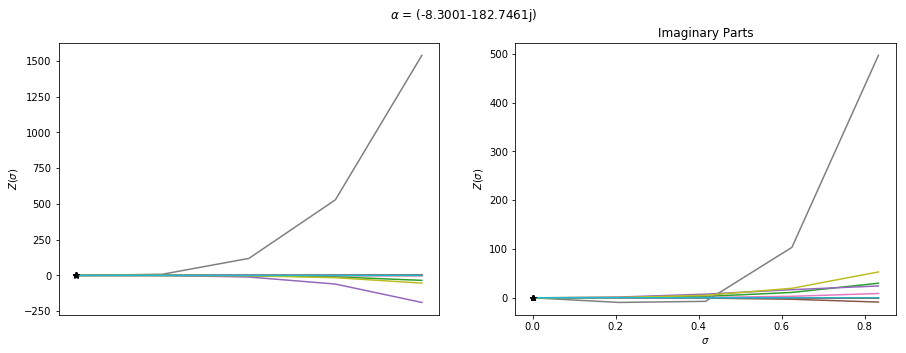

# $\Lambda$ = 325.0

3.10960593948e-13
(-9.58694868261+333.889492443j)


### $\lambda$ = -325j

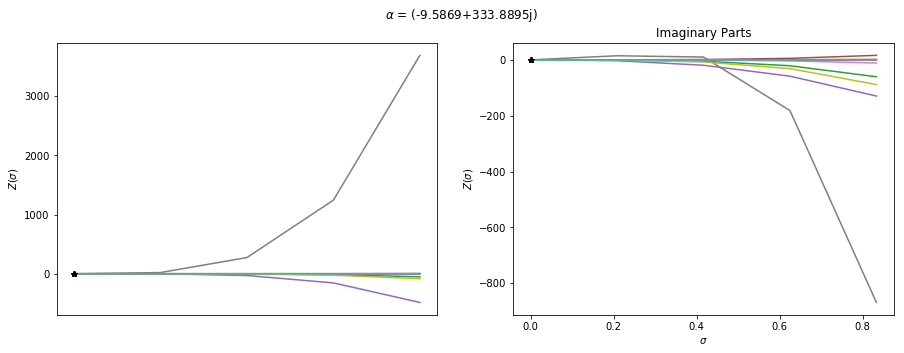

6.33139407399e-13
(-242.118528212+234.620654061j)


### $\lambda$ = (229.8097-229.8097j)

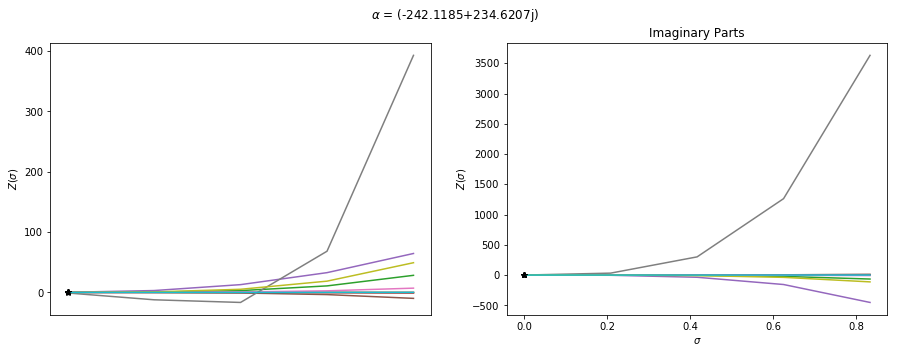

5.59509623085e-13
(-338.264623505+0j)


### $\lambda$ = (325+0j)

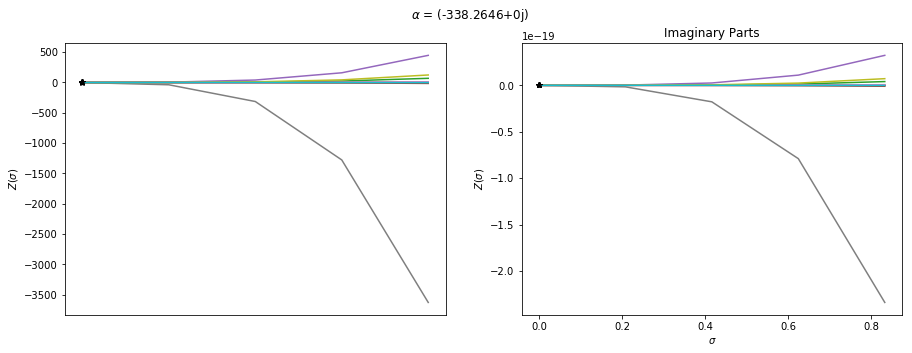

6.33139407399e-13
(-242.118528212-234.620654061j)


### $\lambda$ = (229.8097+229.8097j)

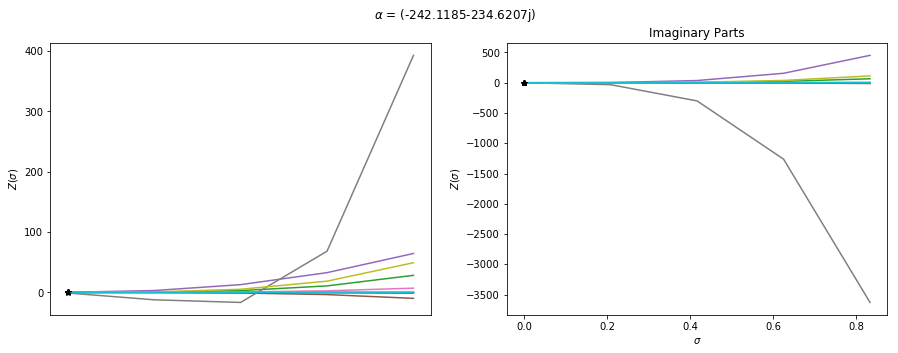

3.10960593948e-13
(-9.58694868261-333.889492443j)


### $\lambda$ = 325j

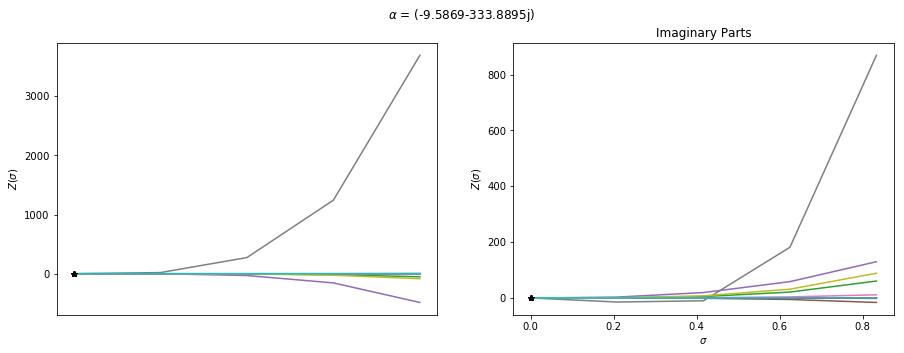

# $\Lambda$ = 762.0

5.14523863738e-13
(-12.2618454735+773.536270266j)


### $\lambda$ = -762j

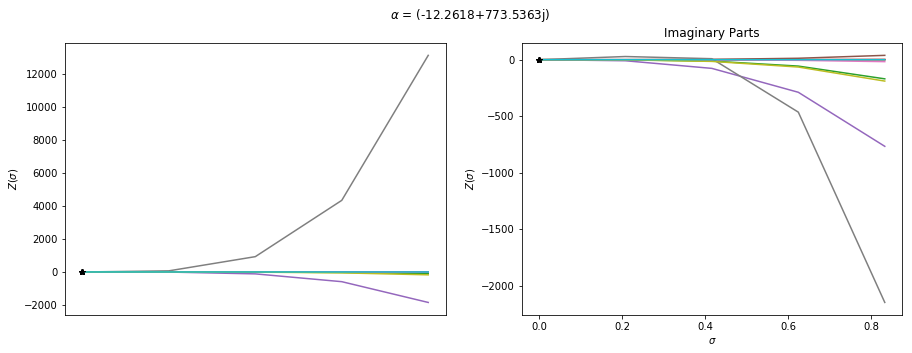

1.13828267506e-12
(-554.611433953+545.058749157j)


### $\lambda$ = (538.8154-538.8154j)

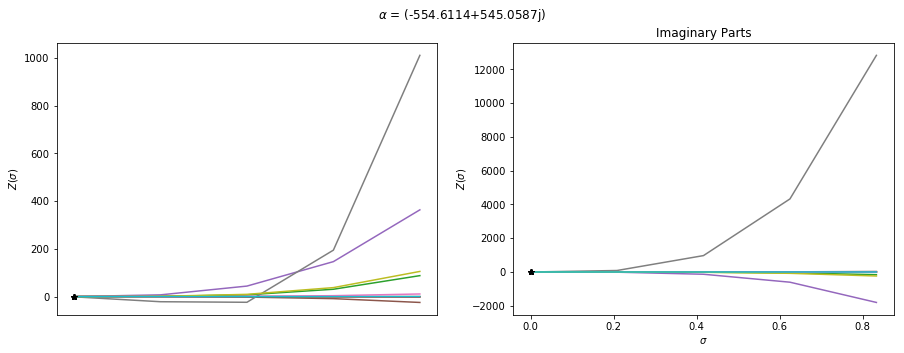

1.19320235917e-12
(-779.037121239+0j)


### $\lambda$ = (762+0j)

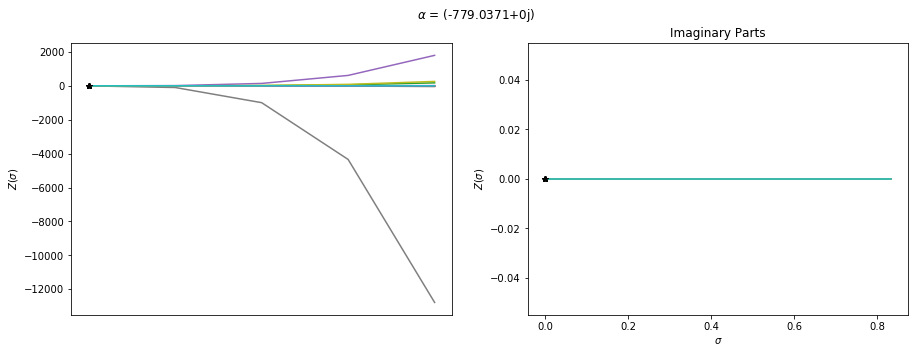

1.13828267506e-12
(-554.611433953-545.058749157j)


### $\lambda$ = (538.8154+538.8154j)

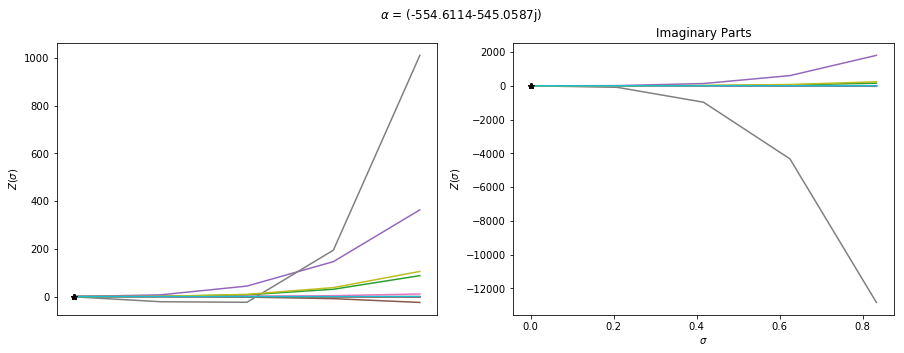

5.14523863738e-13
(-12.2618454735-773.536270266j)


### $\lambda$ = 762j

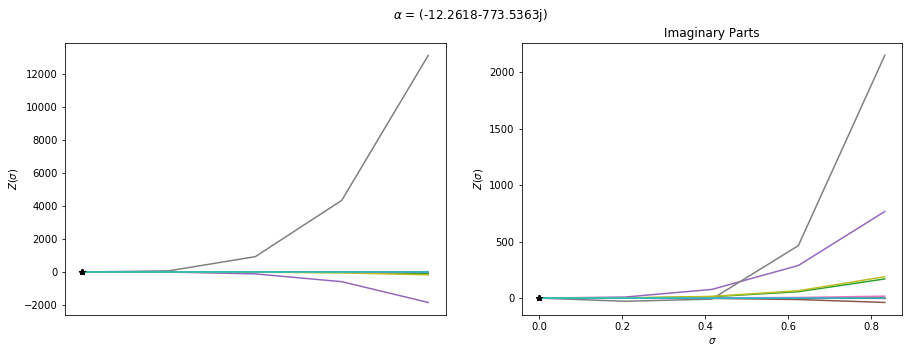

# $\Lambda$ = 222.5

4.41362063369e-13
(-16.4810011652+238.889356161j)


### $\lambda$ = -222.5j

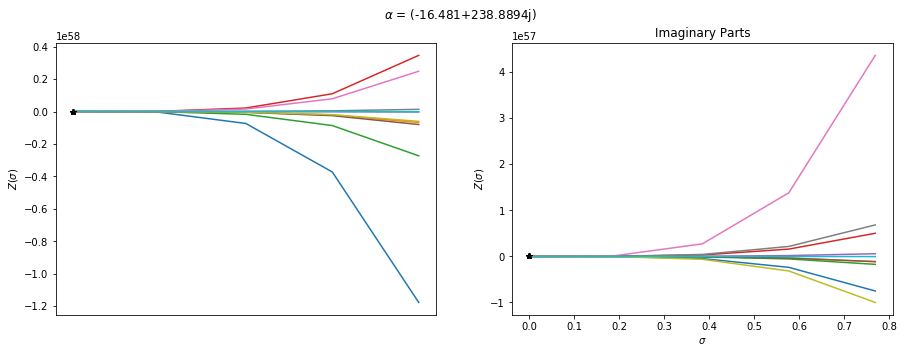

3.30451617512e-13
(-178.841122368+166.201121743j)


### $\lambda$ = (157.3313-157.3313j)

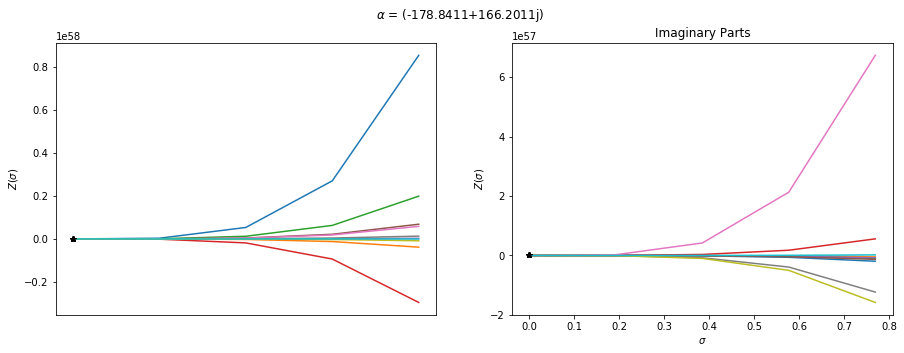

2.93687453525e-13
(-245.775762555+0j)


### $\lambda$ = (222.5+0j)

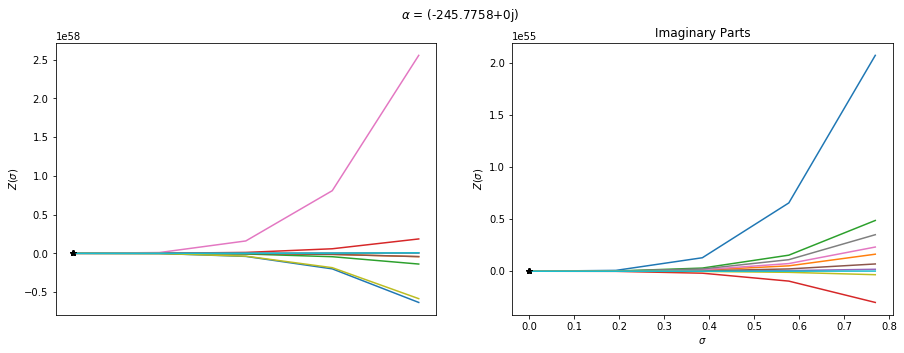

3.30451617512e-13
(-178.841122368-166.201121743j)


### $\lambda$ = (157.3313+157.3313j)

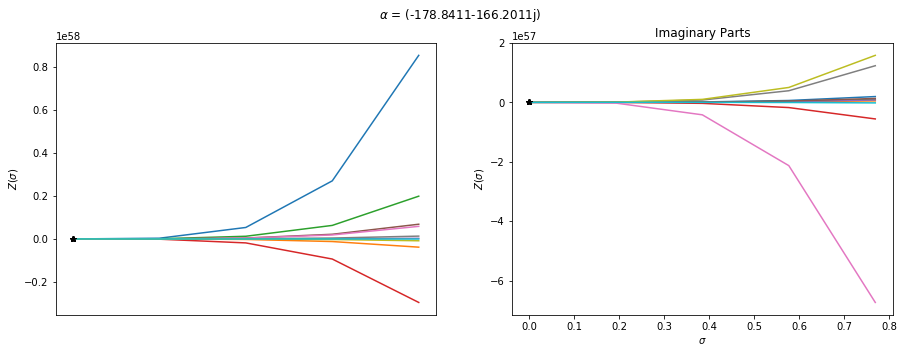

4.41362063369e-13
(-16.4810011652-238.889356161j)


### $\lambda$ = 222.5j

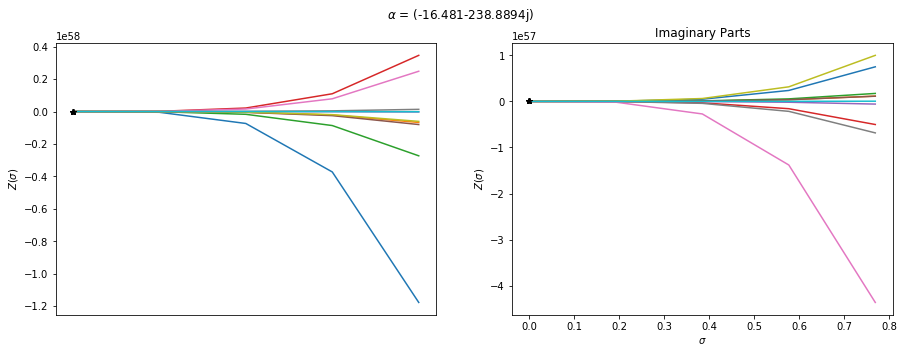

# $\Lambda$ = 123.4

8.08088036164e-14
(-9.5302837344+132.512283669j)


### $\lambda$ = -123.4j

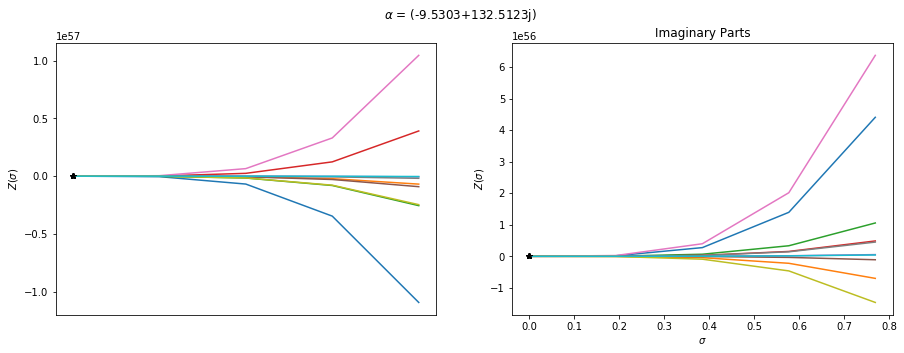

9.57627832076e-14
(-99.5792313098+92.1884931129j)


### $\lambda$ = (87.257-87.257j)

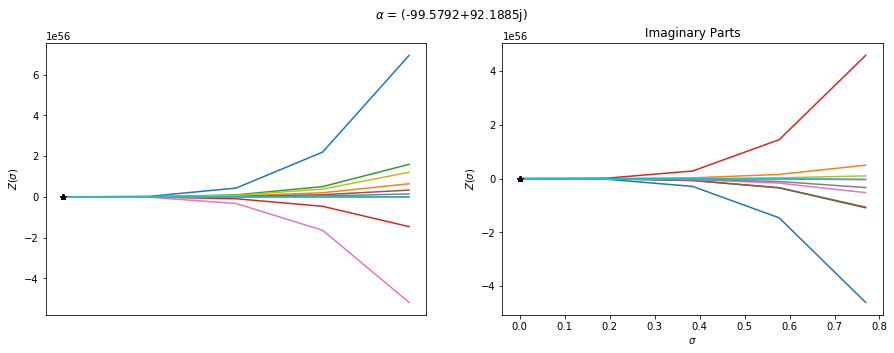

8.40589661524e-14
(-136.702671254+0j)


### $\lambda$ = (123.4+0j)

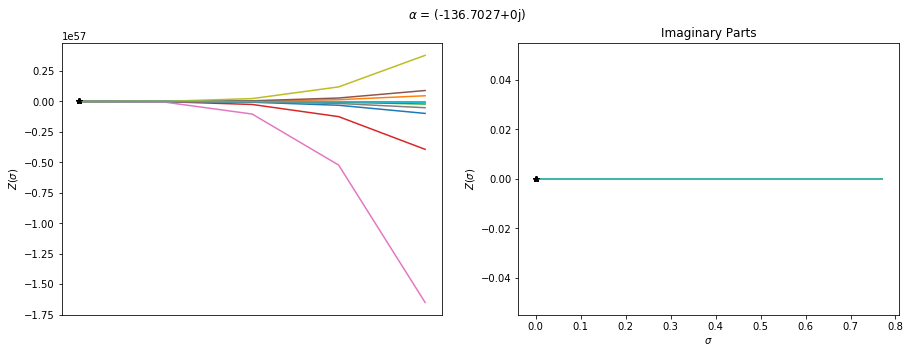

9.57627832076e-14
(-99.5792313098-92.1884931129j)


### $\lambda$ = (87.257+87.257j)

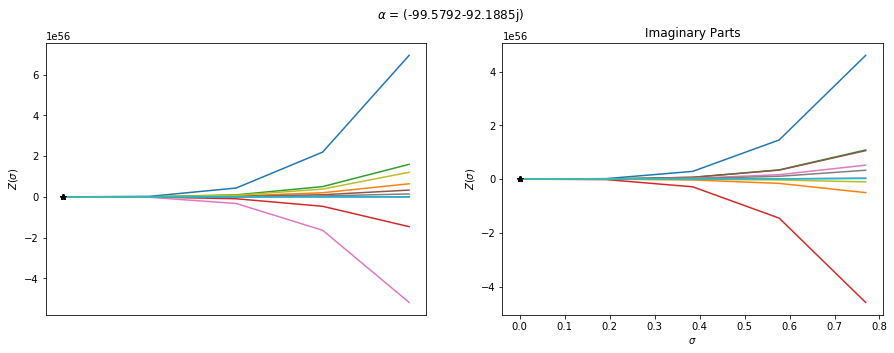

8.08088036164e-14
(-9.5302837344-132.512283669j)


### $\lambda$ = 123.4j

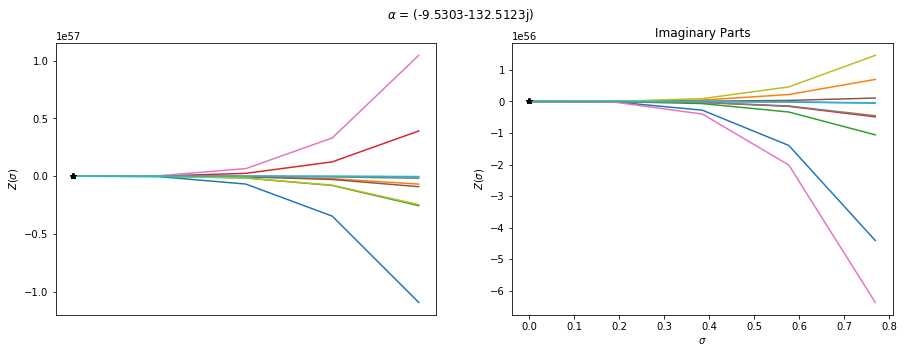

# $\Lambda$ = 111.5

1.60065319236e-13
(-7.70528487905+118.680430631j)


### $\lambda$ = -111.5j

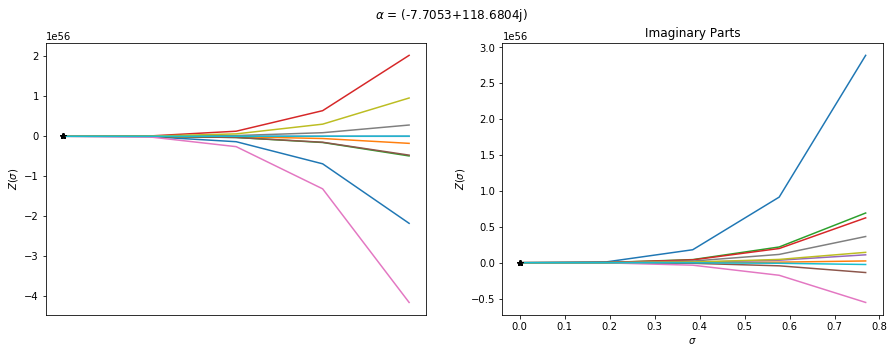

1.15517946356e-13
(-88.7448516965+82.7283961268j)


### $\lambda$ = (78.8424-78.8424j)

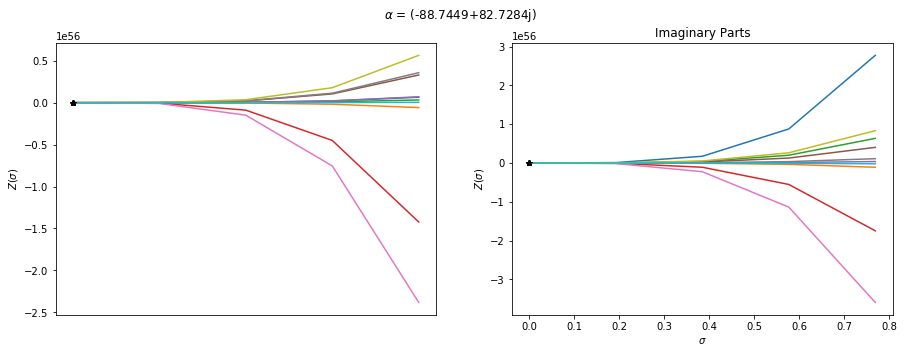

9.05113508325e-14
(-122.173998626+0j)


### $\lambda$ = (111.5+0j)

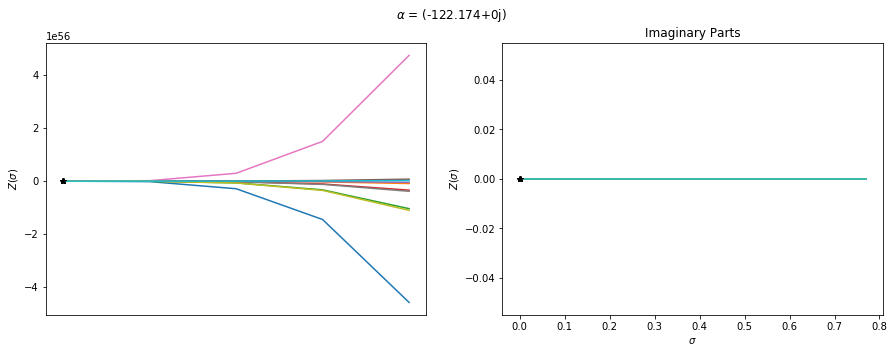

1.15517946356e-13
(-88.7448516965-82.7283961268j)


### $\lambda$ = (78.8424+78.8424j)

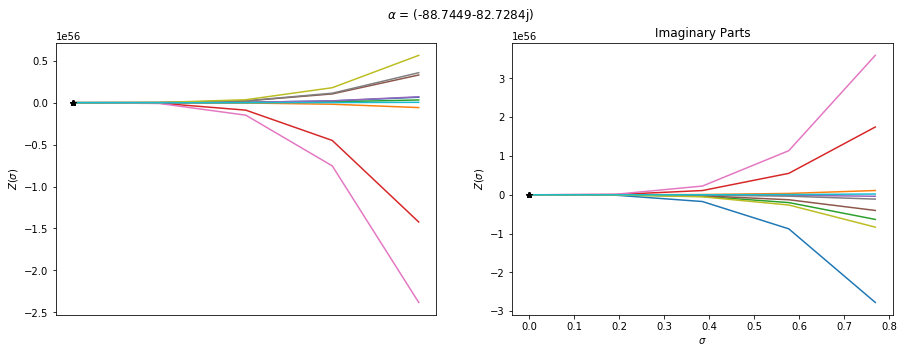

1.60065319236e-13
(-7.70528487905-118.680430631j)


### $\lambda$ = 111.5j

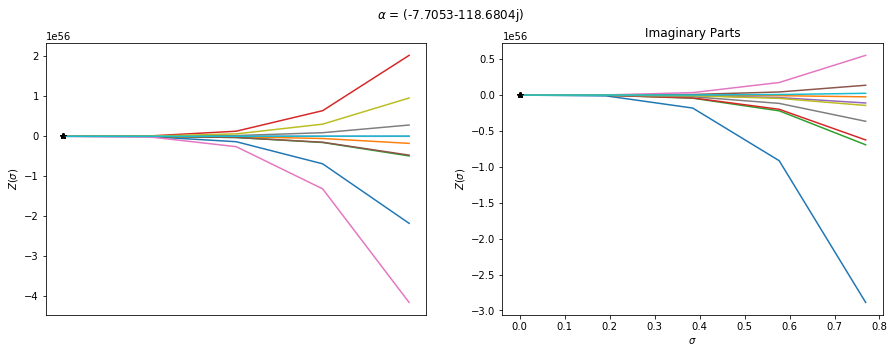

# $\Lambda$ = 198.4

5.56764227825e-13
(-8.75723543101+206.574487716j)


### $\lambda$ = -198.4j

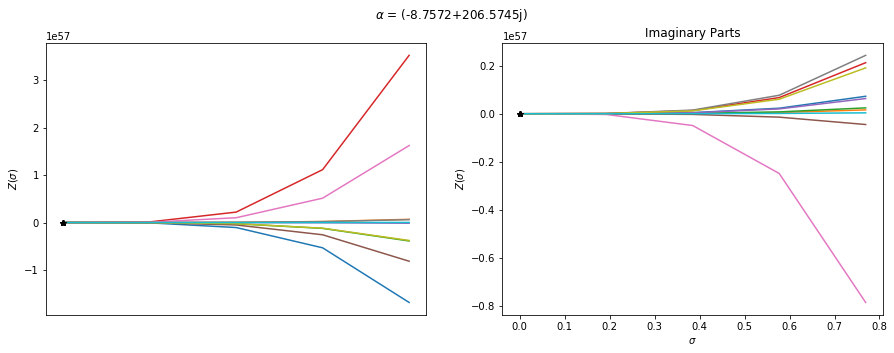

4.81681701087e-13
(-151.549147241+144.71396989j)


### $\lambda$ = (140.29-140.29j)

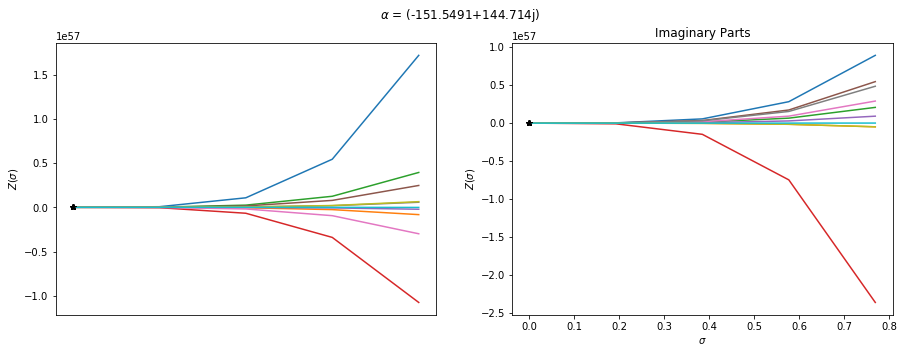

1.6937427228e-13
(-210.537728368+0j)


### $\lambda$ = (198.4+0j)

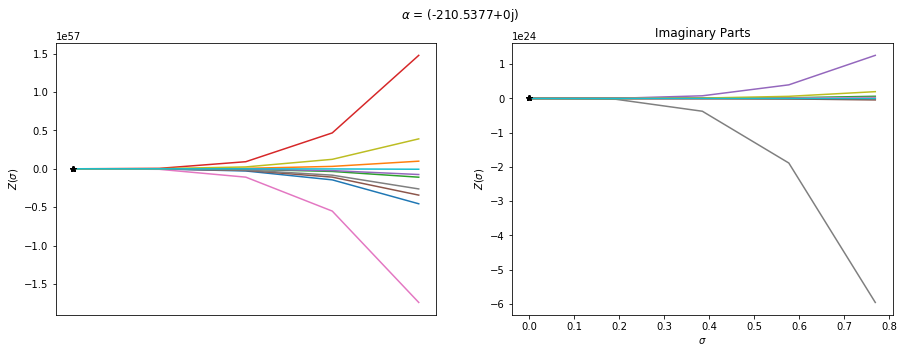

4.81681701087e-13
(-151.549147241-144.71396989j)


### $\lambda$ = (140.29+140.29j)

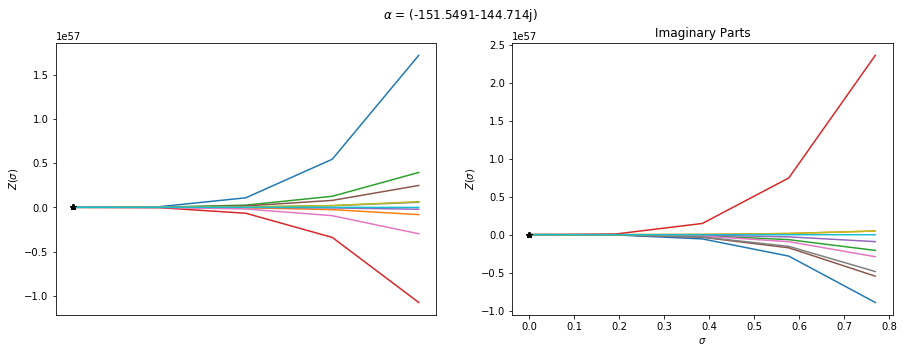

5.56764227825e-13
(-8.75723543101-206.574487716j)


### $\lambda$ = 198.4j

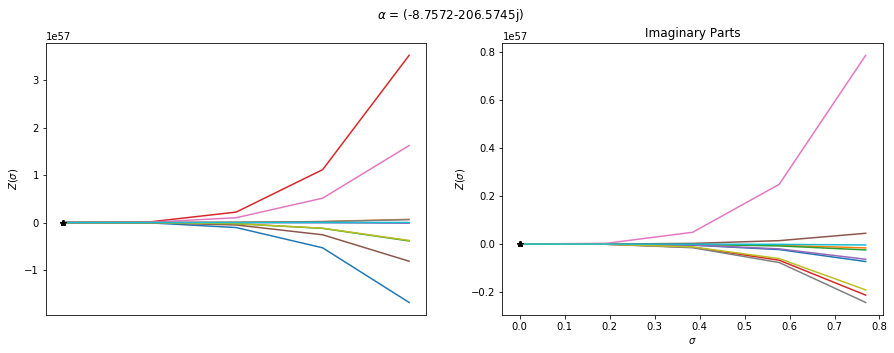

# $\Lambda$ = 449.8

4.73888038316e-13
(-11.0515820703+460.231104574j)


### $\lambda$ = -449.8j

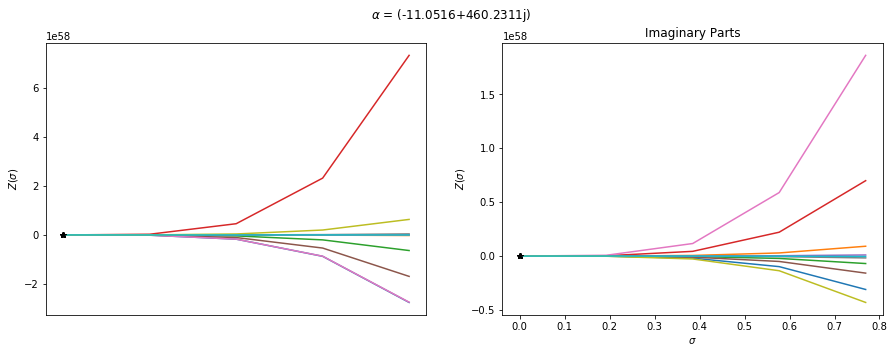

4.79232233828e-13
(-332.302861256+323.701897755j)


### $\lambda$ = (318.0566-318.0566j)

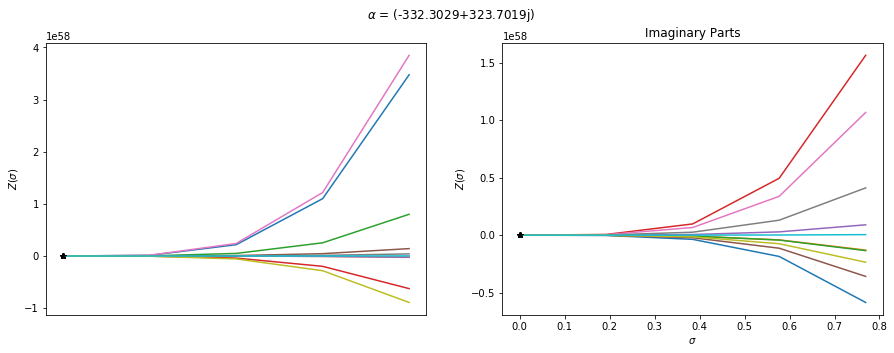

6.90076718613e-13
(-465.168044957+0j)


### $\lambda$ = (449.8+0j)

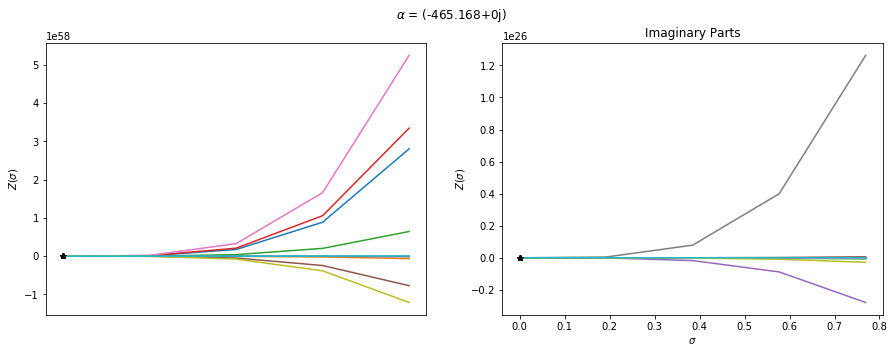

4.79232233828e-13
(-332.302861256-323.701897755j)


### $\lambda$ = (318.0566+318.0566j)

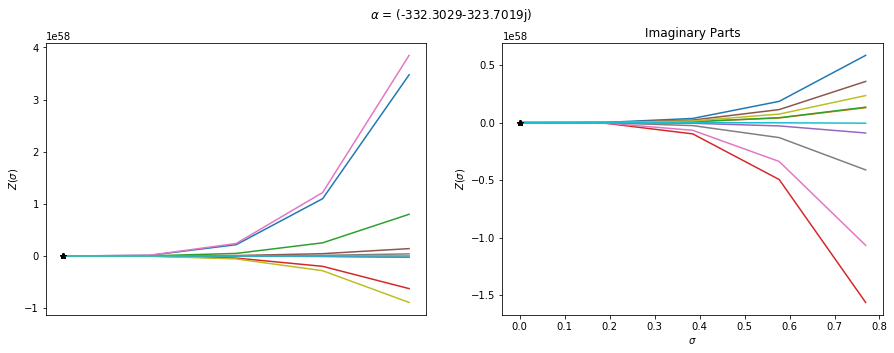

4.73888038316e-13
(-11.0515820703-460.231104574j)


### $\lambda$ = 449.8j

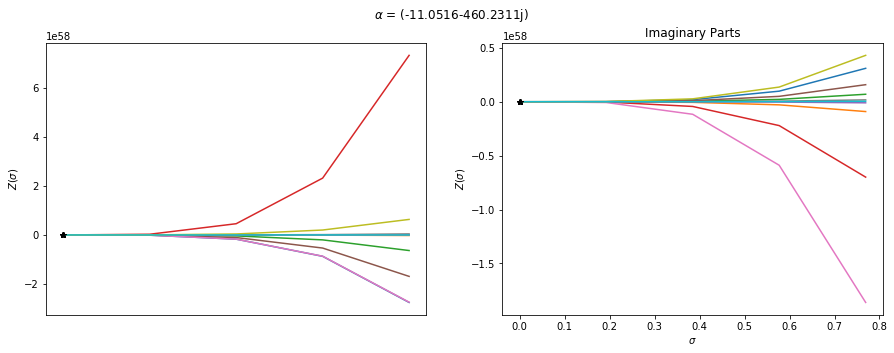

# $\Lambda$ = 226.8

1.70901332199e-13
(-17.2395680245+244.021169897j)


### $\lambda$ = -226.8j

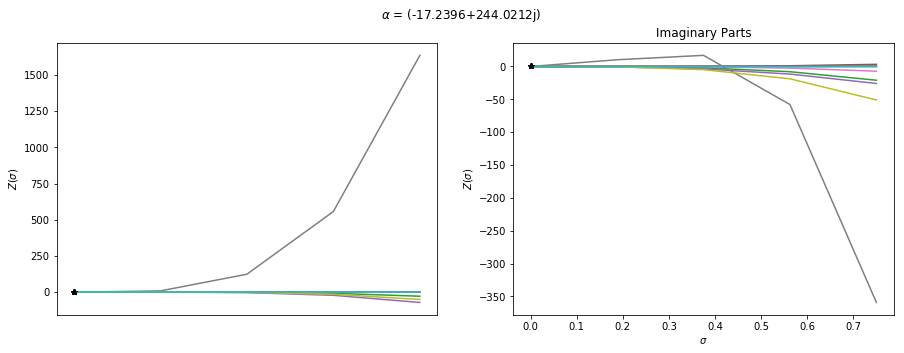

3.28086508758e-13
(-182.896370229+169.691858547j)


### $\lambda$ = (160.3718-160.3718j)

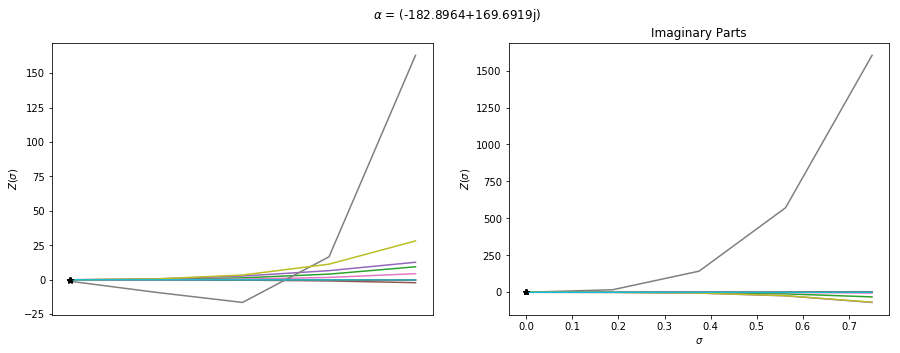

3.23693032528e-13
(-251.180387949+0j)


### $\lambda$ = (226.8+0j)

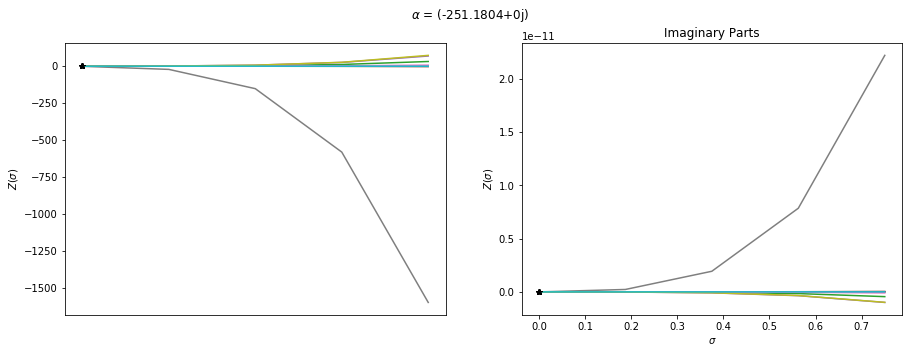

3.28086508758e-13
(-182.896370229-169.691858547j)


### $\lambda$ = (160.3718+160.3718j)

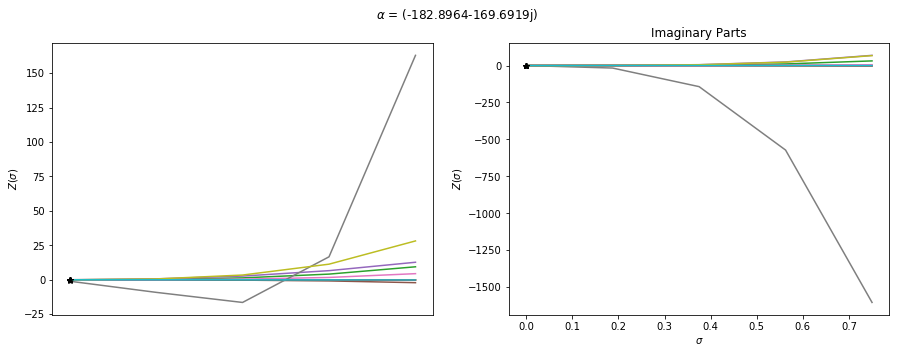

1.70901332199e-13
(-17.2395680245-244.021169897j)


### $\lambda$ = 226.8j

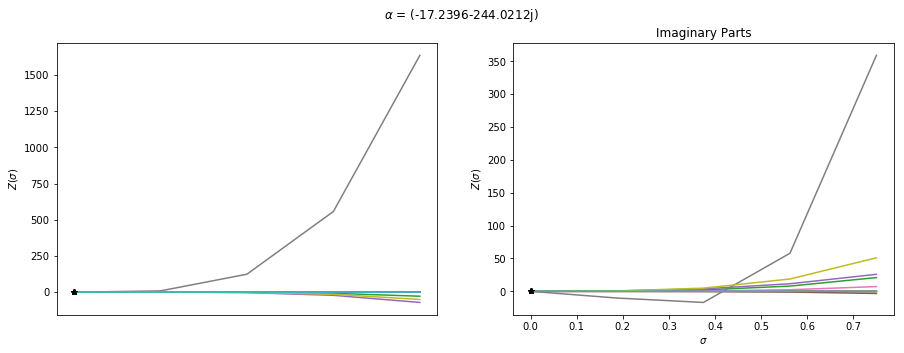

# $\Lambda$ = 114.3

1.62744289266e-13
(-9.49882546745+123.427018411j)


### $\lambda$ = -114.3j

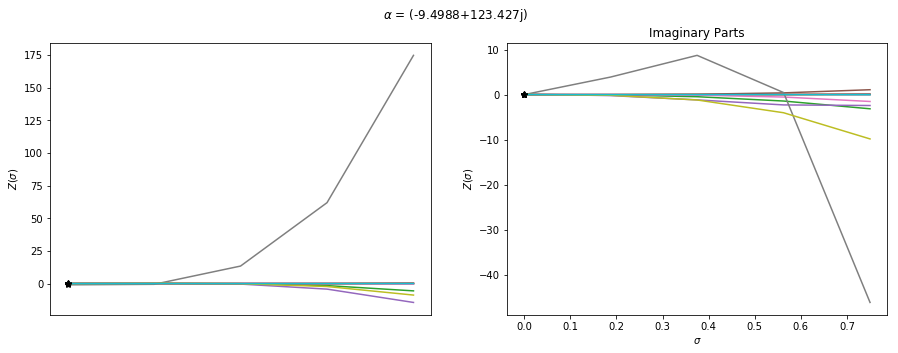

2.73952412259e-13
(-93.1181911775+85.7617974296j)


### $\lambda$ = (80.8223-80.8223j)

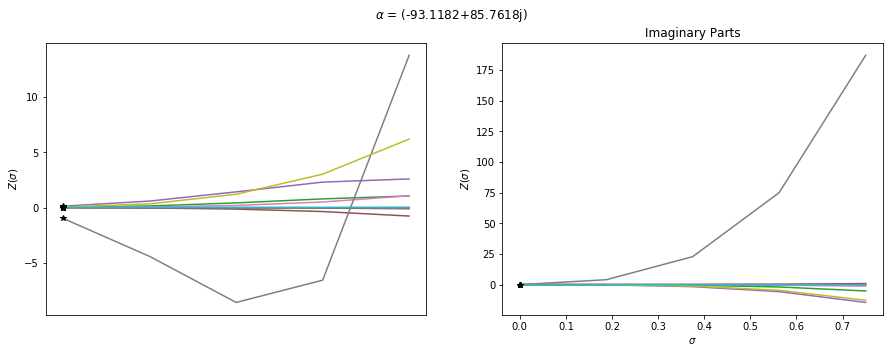

8.31434586821e-14
(-127.57808959+0j)


### $\lambda$ = (114.3+0j)

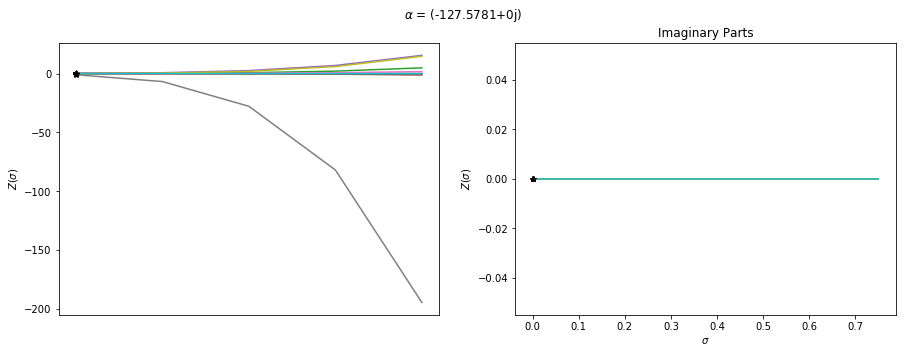

2.73952412259e-13
(-93.1181911775-85.7617974296j)


### $\lambda$ = (80.8223+80.8223j)

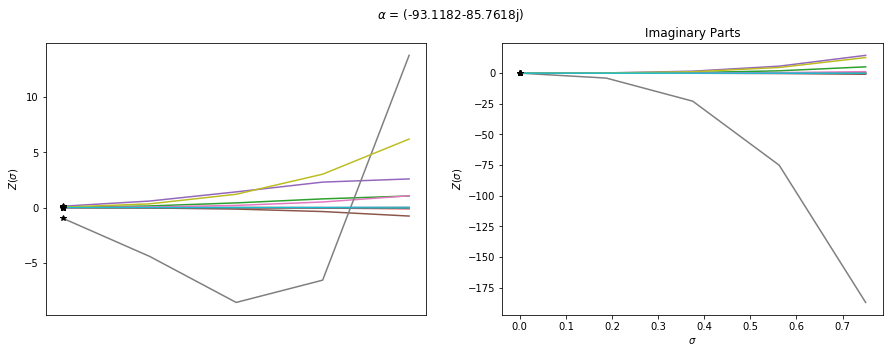

1.62744289266e-13
(-9.49882546745-123.427018411j)


### $\lambda$ = 114.3j

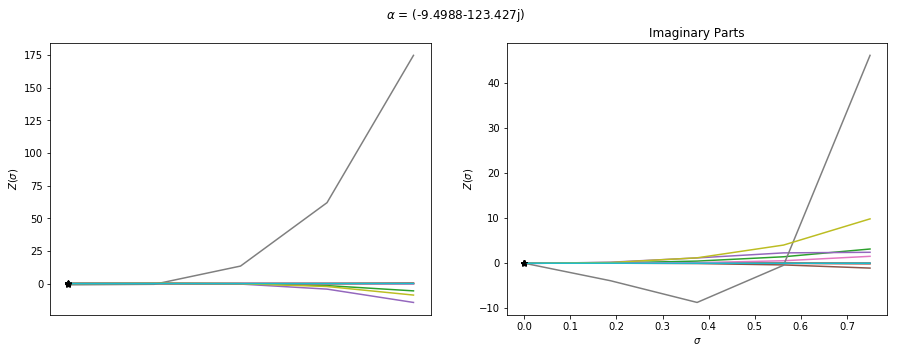

# $\Lambda$ = 100.4

5.58884027324e-14
(-7.57853483287+107.491763785j)


### $\lambda$ = -100.4j

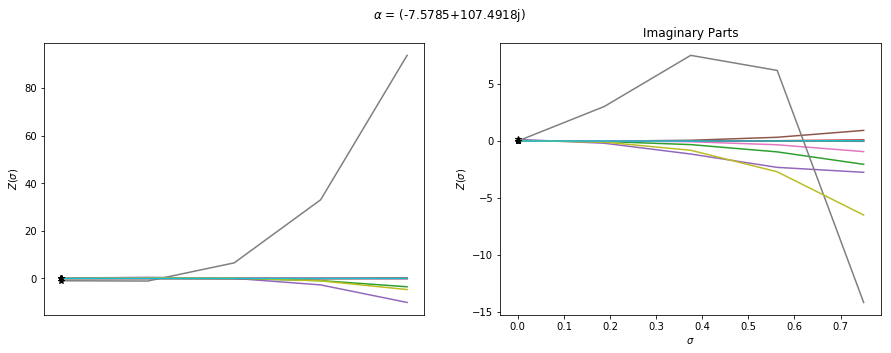

1.08404963873e-13
(-80.7421571534+74.8315220317j)


### $\lambda$ = (70.9935-70.9935j)

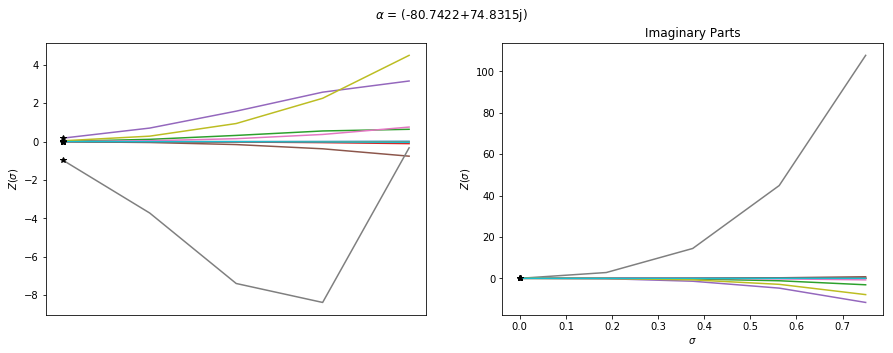

1.17712815354e-13
(-110.910688506+0j)


### $\lambda$ = (100.4+0j)

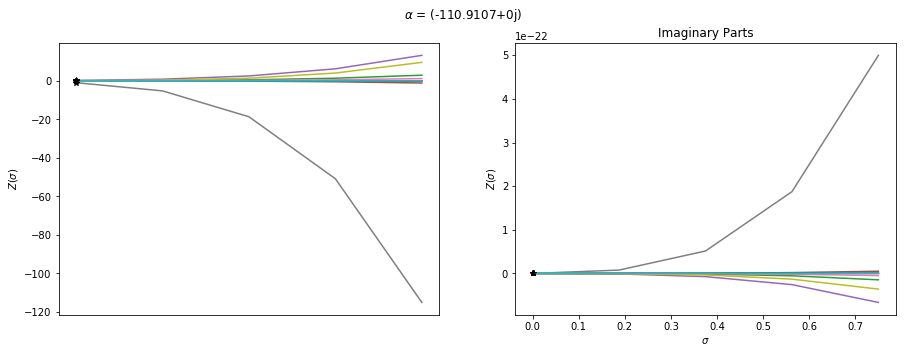

1.08404963873e-13
(-80.7421571534-74.8315220317j)


### $\lambda$ = (70.9935+70.9935j)

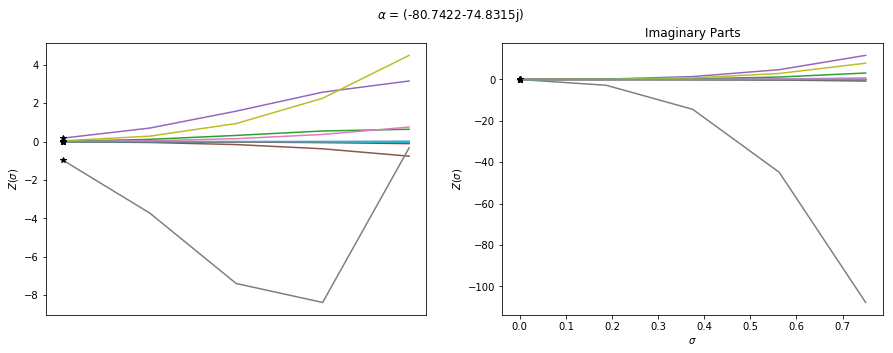

5.58884027324e-14
(-7.57853483287-107.491763785j)


### $\lambda$ = 100.4j

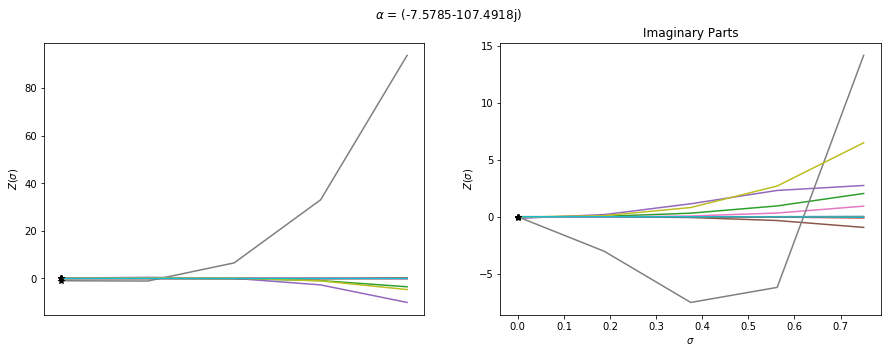

# $\Lambda$ = 175.3

1.77224609717e-13
(-8.54664738184+183.298003533j)


### $\lambda$ = -175.3j

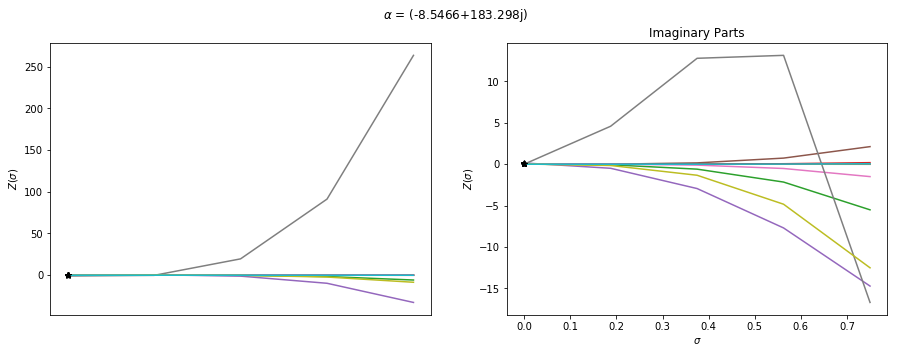

3.49214865747e-13
(-134.950157671+128.284288122j)


### $\lambda$ = (123.9558-123.9558j)

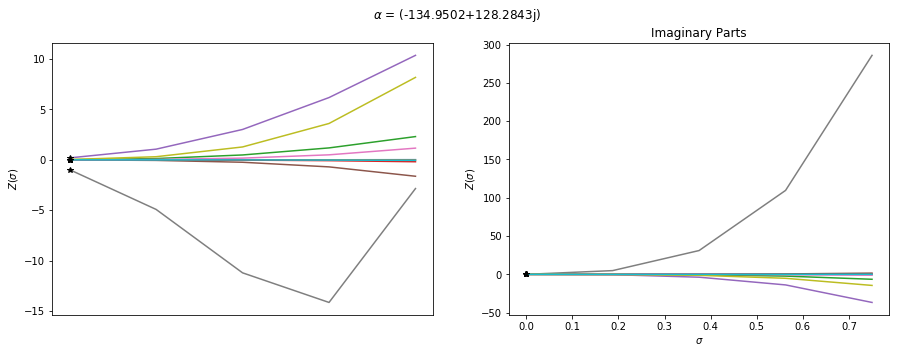

2.41301650126e-13
(-187.153861725+0j)


### $\lambda$ = (175.3+0j)

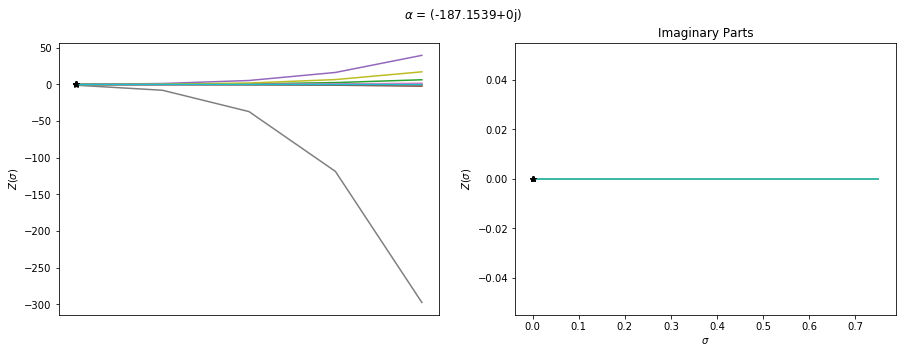

3.49214865747e-13
(-134.950157671-128.284288122j)


### $\lambda$ = (123.9558+123.9558j)

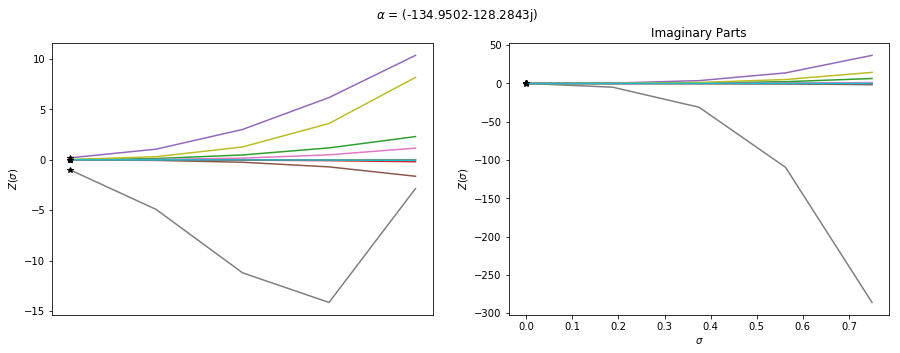

1.77224609717e-13
(-8.54664738184-183.298003533j)


### $\lambda$ = 175.3j

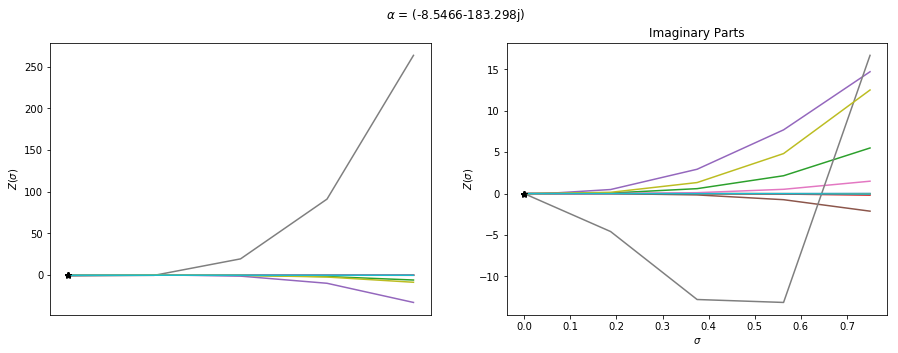

# $\Lambda$ = 391.3

2.91822864449e-13
(-10.7159607549+401.426913183j)


### $\lambda$ = -391.3j

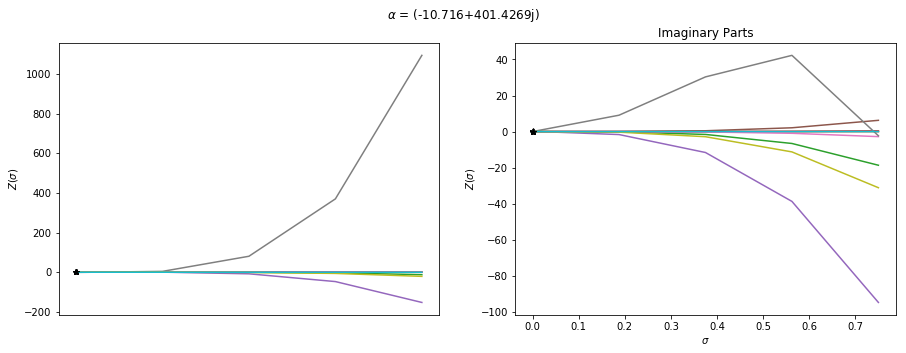

5.14587859566e-13
(-290.508039759+282.171522719j)


### $\lambda$ = (276.6909-276.6909j)

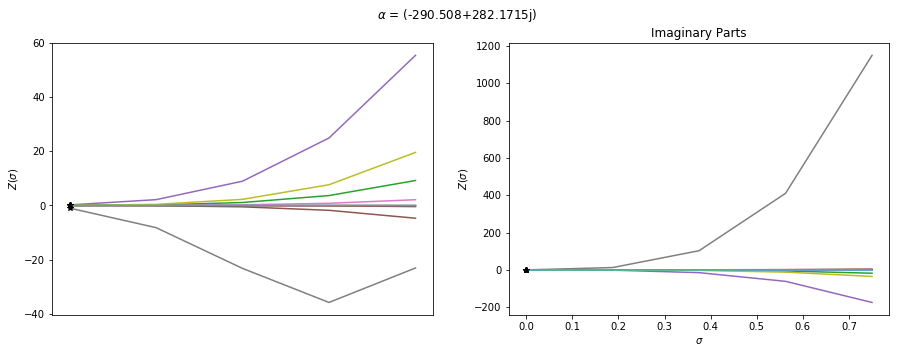

4.83810402842e-13
(-406.206154133+0j)


### $\lambda$ = (391.3+0j)

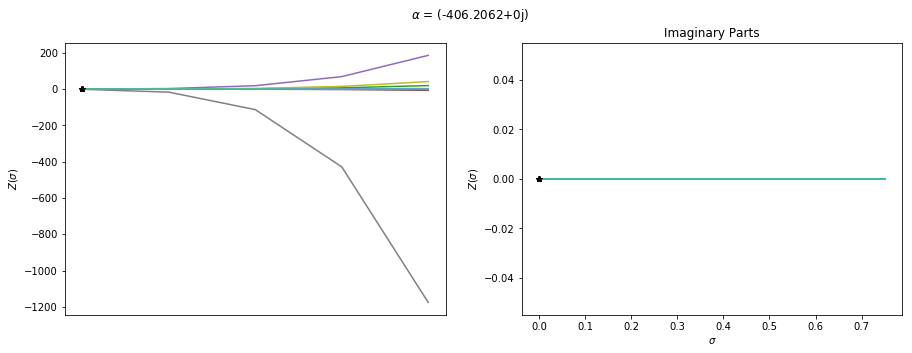

5.14587859566e-13
(-290.508039759-282.171522719j)


### $\lambda$ = (276.6909+276.6909j)

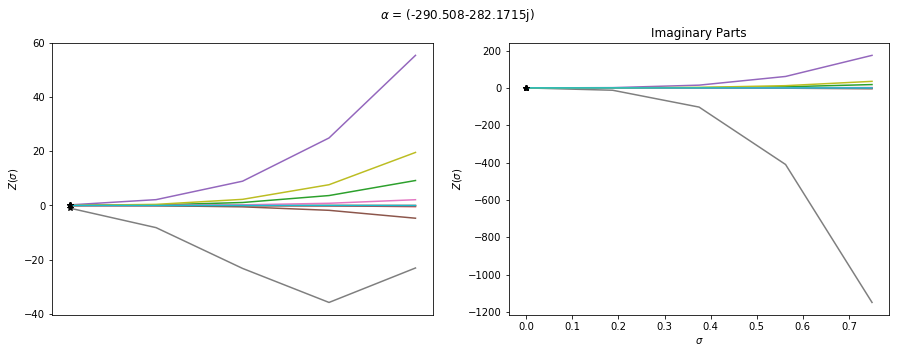

2.91822864449e-13
(-10.7159607549-401.426913183j)


### $\lambda$ = 391.3j

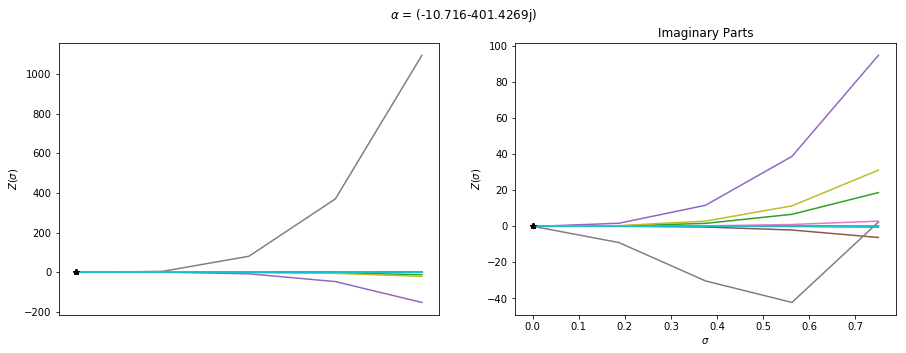

# $\Lambda$ = 236.5

5.1335786792e-13
(-18.679729915+255.297063715j)


### $\lambda$ = -236.5j

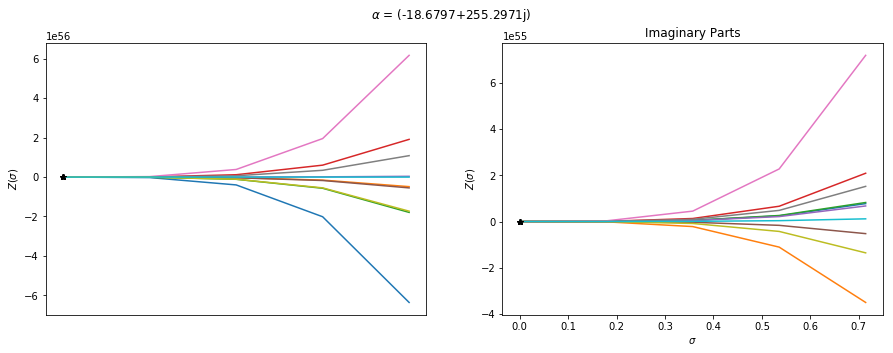

1.76030344097e-13
(-191.68074716+177.403668106j)


### $\lambda$ = (167.2308-167.2308j)

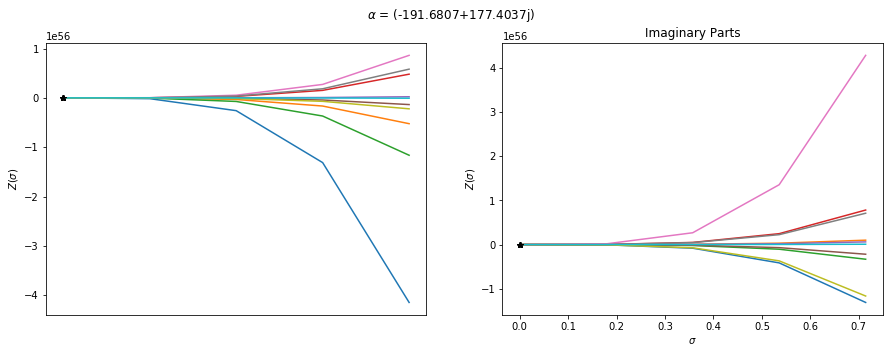

3.07987567863e-13
(-262.976233987+0j)


### $\lambda$ = (236.5+0j)

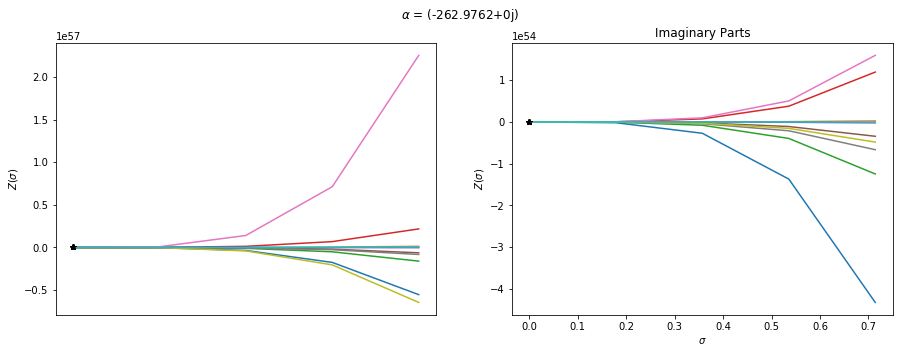

1.76030344097e-13
(-191.68074716-177.403668106j)


### $\lambda$ = (167.2308+167.2308j)

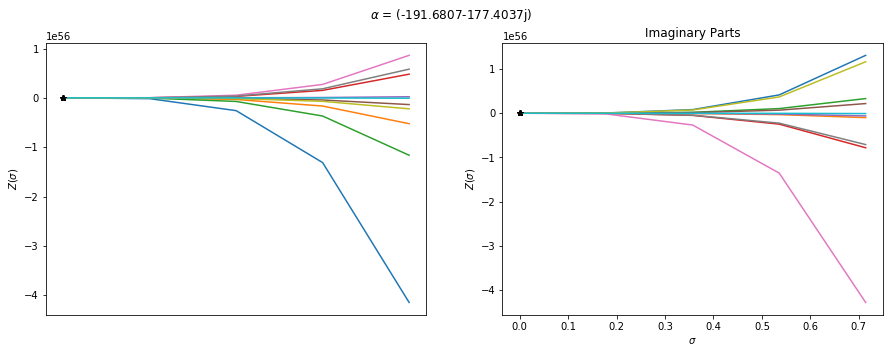

5.1335786792e-13
(-18.679729915-255.297063715j)


### $\lambda$ = 236.5j

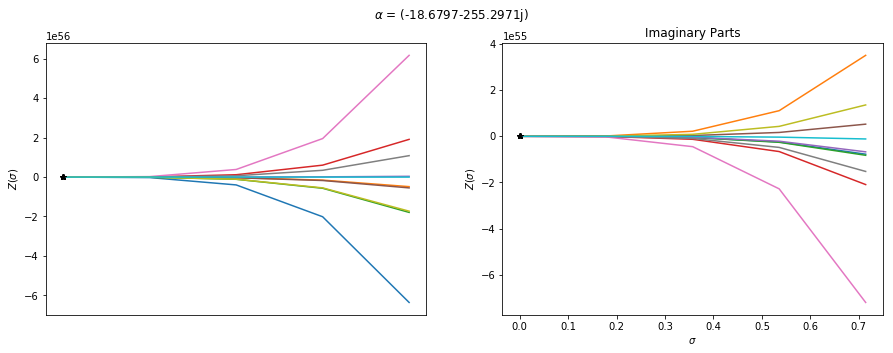

# $\Lambda$ = 103.9

6.18163844545e-14
(-9.58741080593+113.200492719j)


### $\lambda$ = -103.9j

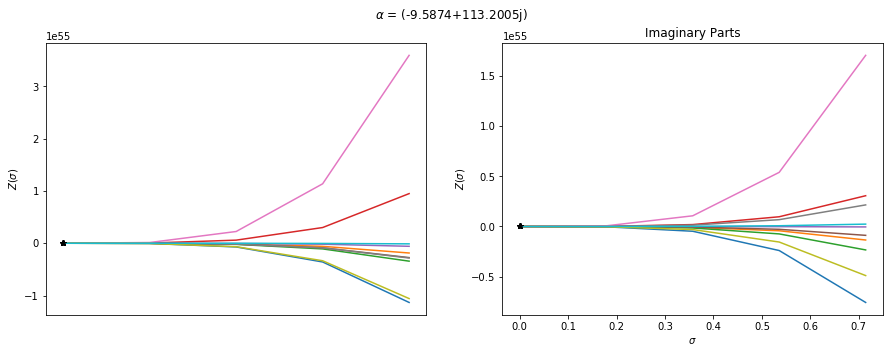

9.21547354732e-14
(-85.9073773005+78.5017767755j)


### $\lambda$ = (73.4684-73.4684j)

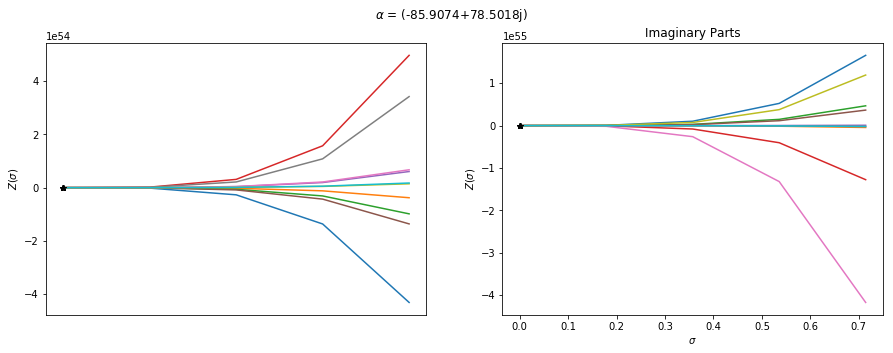

2.58850442534e-13
(-117.34032577+0j)


### $\lambda$ = (103.9+0j)

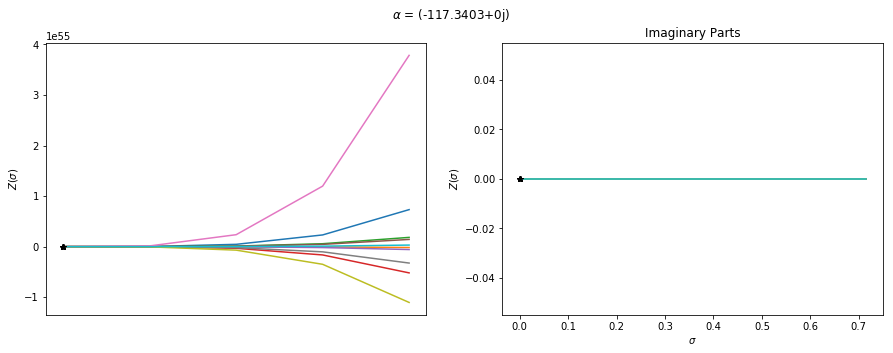

9.21547354732e-14
(-85.9073773005-78.5017767755j)


### $\lambda$ = (73.4684+73.4684j)

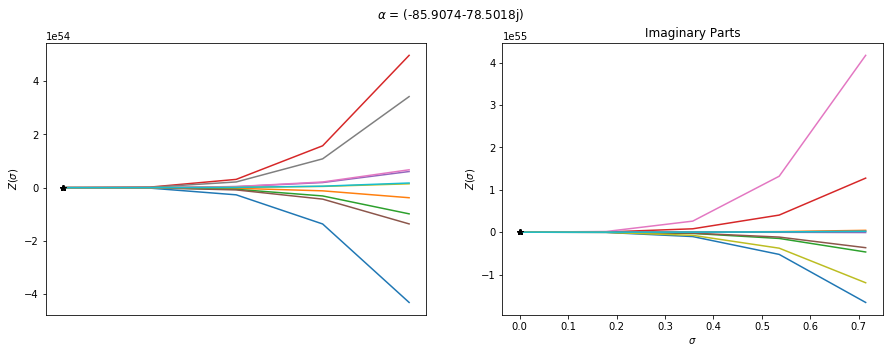

6.18163844545e-14
(-9.58741080593-113.200492719j)


### $\lambda$ = 103.9j

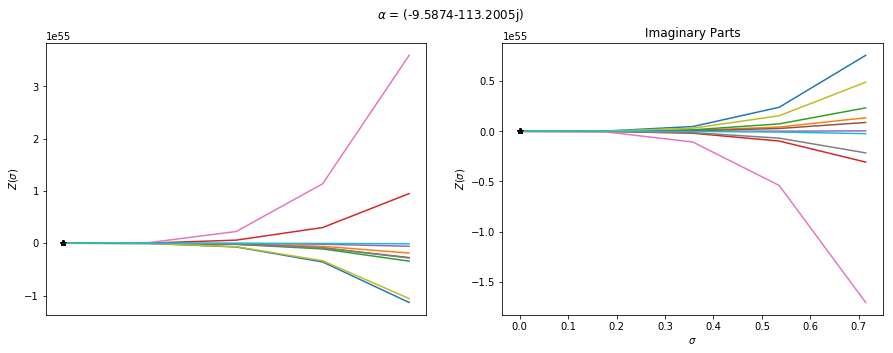

# $\Lambda$ = 85.3

1.95073289706e-13
(-7.40428524754+92.2874036265j)


### $\lambda$ = -85.3j

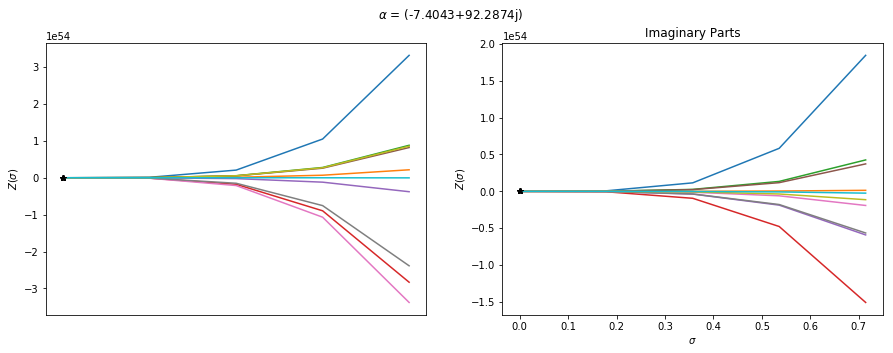

1.44626762316e-13
(-69.8590801072+64.097727806j)


### $\lambda$ = (60.3162-60.3162j)

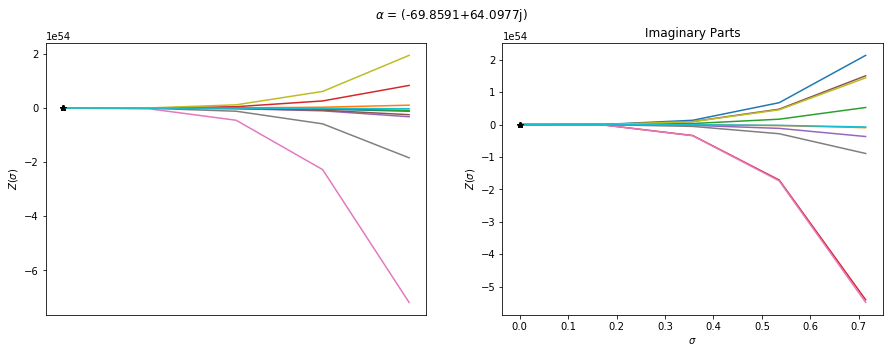

7.30016492777e-14
(-95.5938583128+0j)


### $\lambda$ = (85.3+0j)

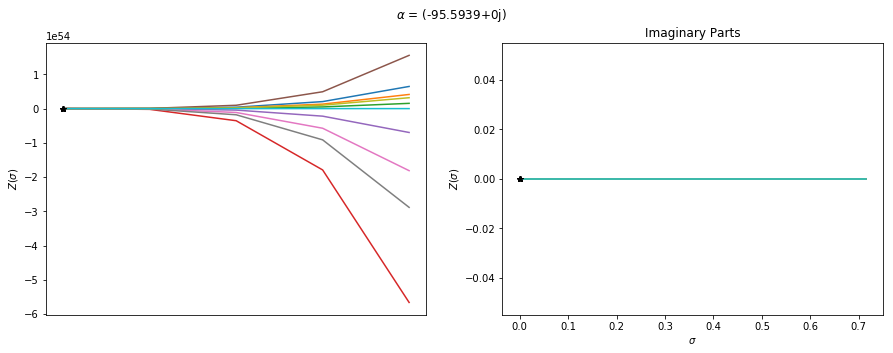

1.44626762316e-13
(-69.8590801072-64.097727806j)


### $\lambda$ = (60.3162+60.3162j)

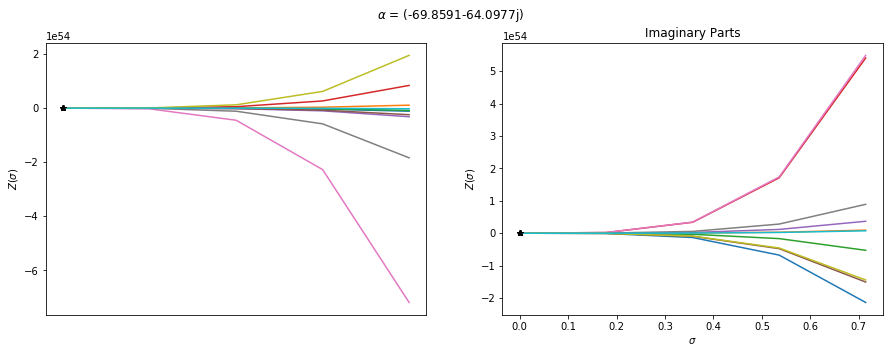

1.95073289706e-13
(-7.40428524754-92.2874036265j)


### $\lambda$ = 85.3j

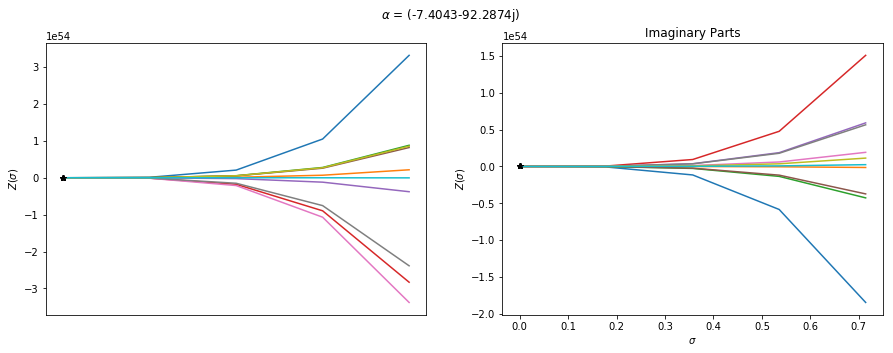

# $\Lambda$ = 142.6

1.52074170593e-13
(-8.19782164648+150.312069831j)


### $\lambda$ = -142.6j

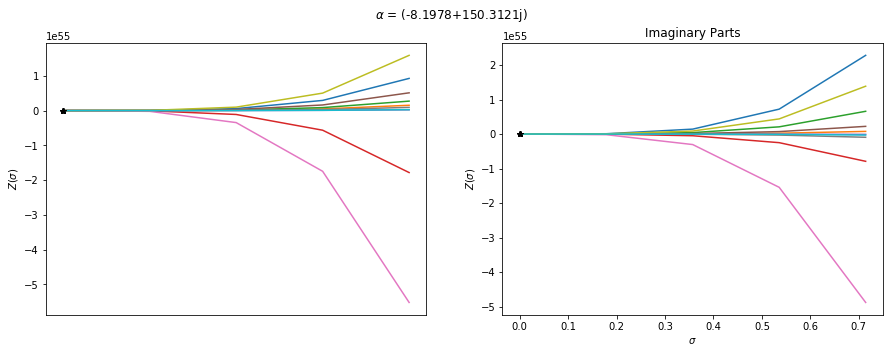

1.31982044366e-13
(-111.391175271+105.007145551j)


### $\lambda$ = (100.8334-100.8334j)

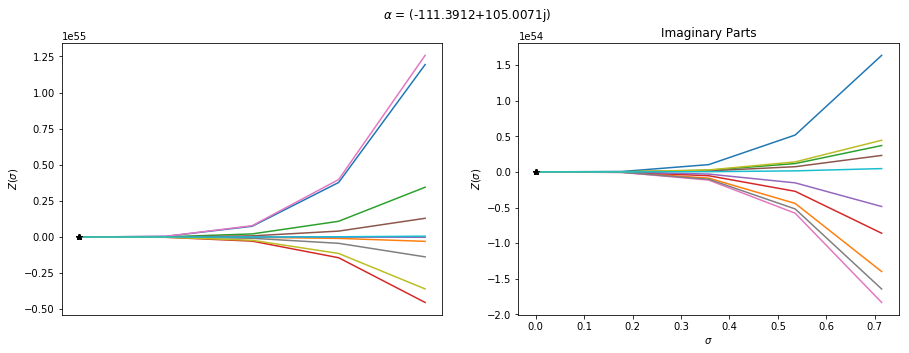

3.0606506583e-13
(-153.986453974+0j)


### $\lambda$ = (142.6+0j)

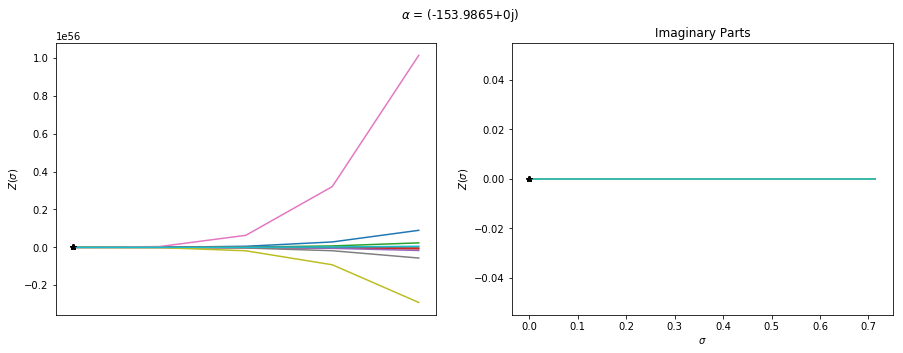

1.31982044366e-13
(-111.391175271-105.007145551j)


### $\lambda$ = (100.8334+100.8334j)

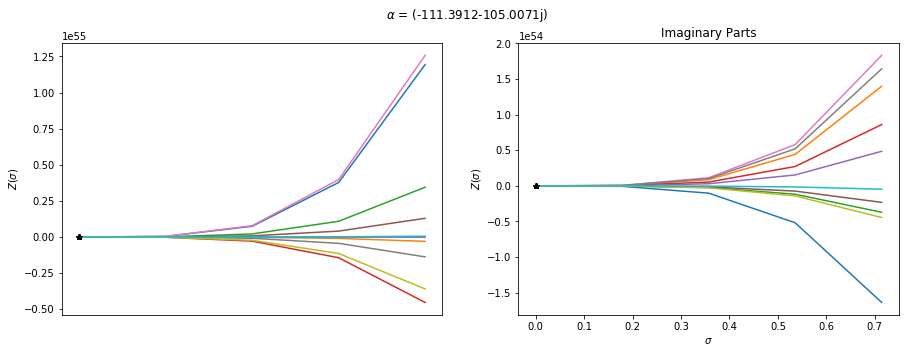

1.52074170593e-13
(-8.19782164648-150.312069831j)


### $\lambda$ = 142.6j

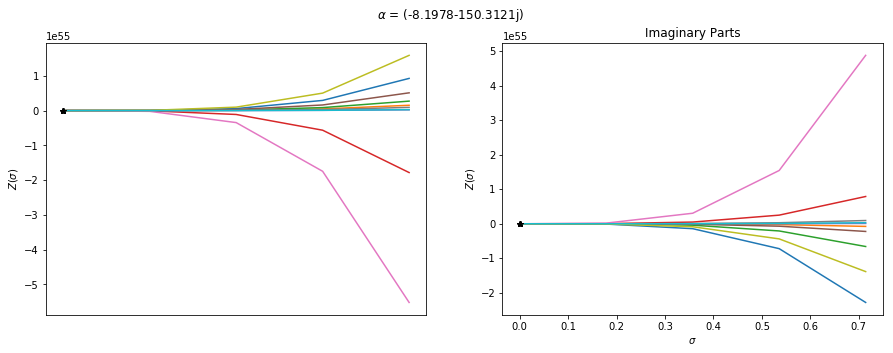

# $\Lambda$ = 307.1

1.98140532051e-13
(-10.1225260714+316.691692417j)


### $\lambda$ = -307.1j

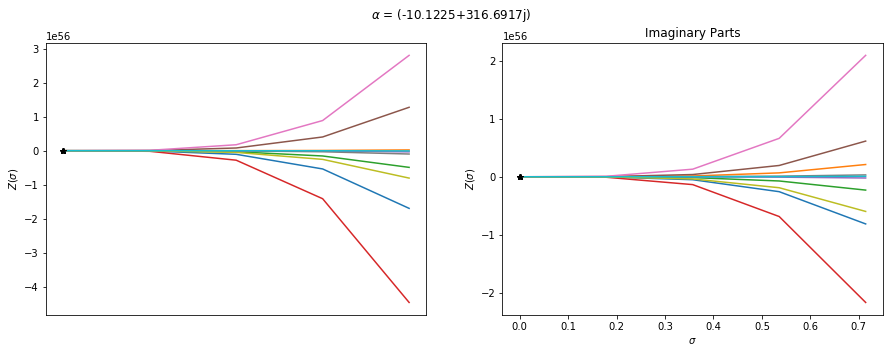

6.31047108614e-13
(-230.211813052+222.343469921j)


### $\lambda$ = (217.1525-217.1525j)

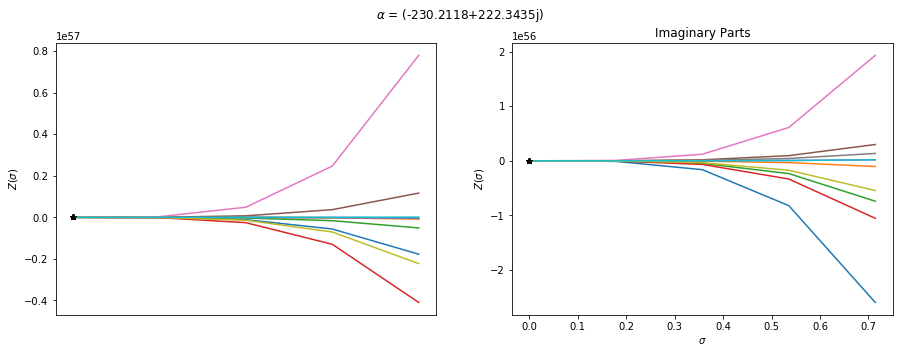

1.30245177948e-13
(-321.190589427+0j)


### $\lambda$ = (307.1+0j)

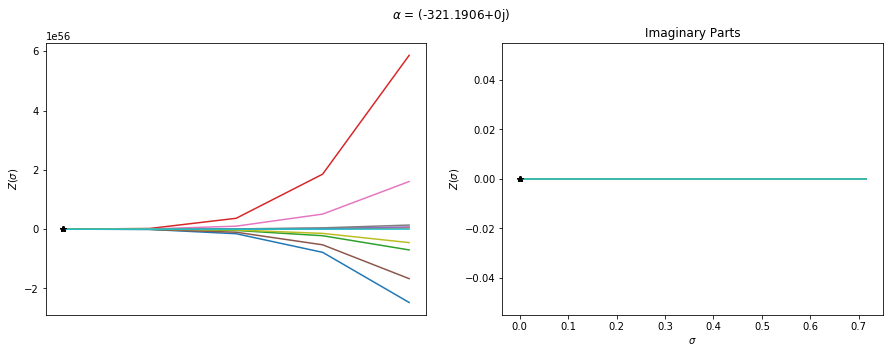

6.31047108614e-13
(-230.211813052-222.343469921j)


### $\lambda$ = (217.1525+217.1525j)

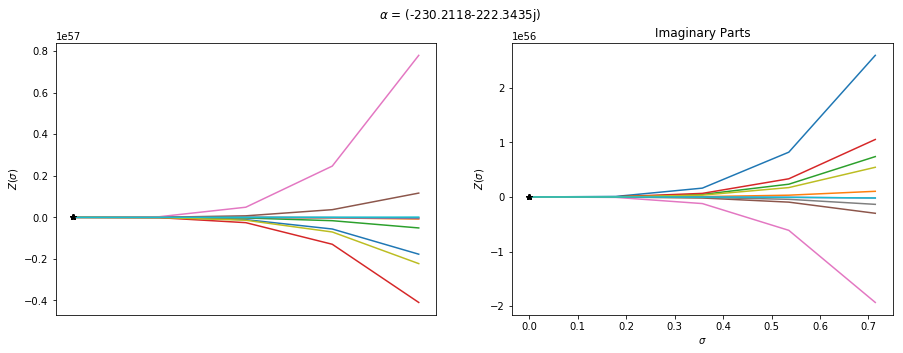

1.98140532051e-13
(-10.1225260714-316.691692417j)


### $\lambda$ = 307.1j

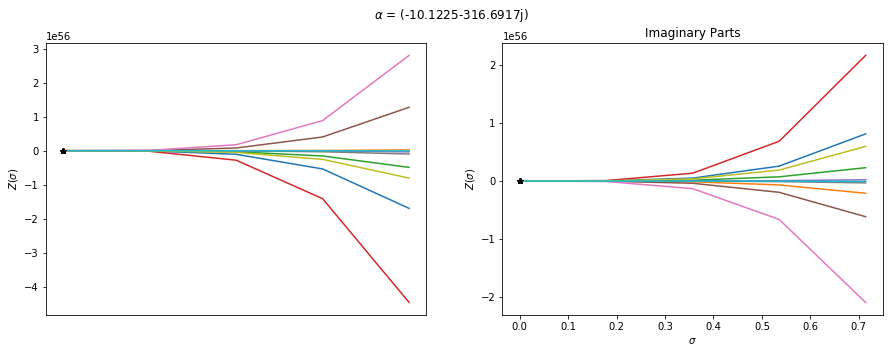

# $\Lambda$ = 253.8

2.37761810938e-13
(-20.7312463274+274.829260999j)


### $\lambda$ = -253.8j

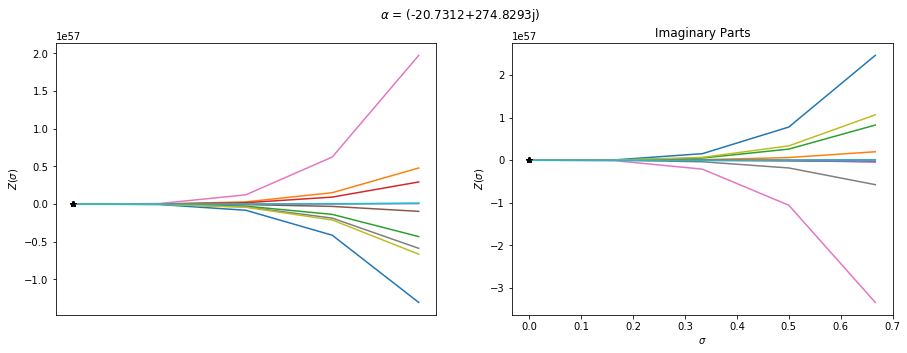

2.09881837978e-13
(-206.652503073+190.844679727j)


### $\lambda$ = (179.4637-179.4637j)

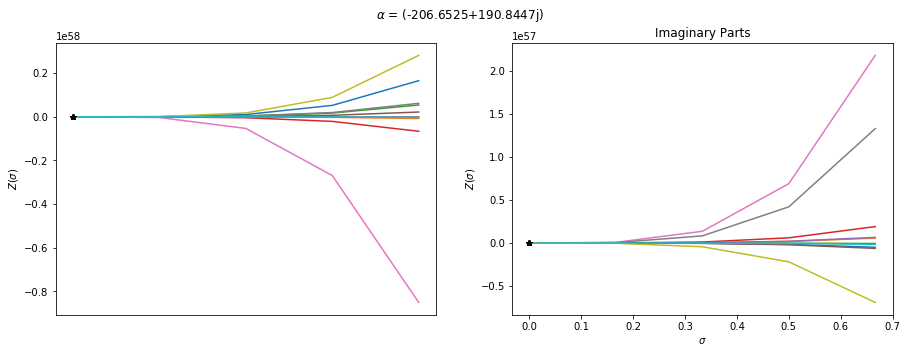

4.56945842207e-13
(-283.256384259+0j)


### $\lambda$ = (253.8+0j)

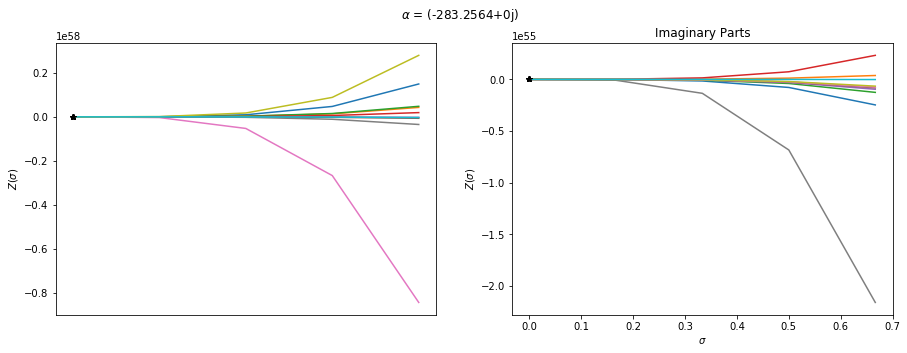

2.09881837978e-13
(-206.652503073-190.844679727j)


### $\lambda$ = (179.4637+179.4637j)

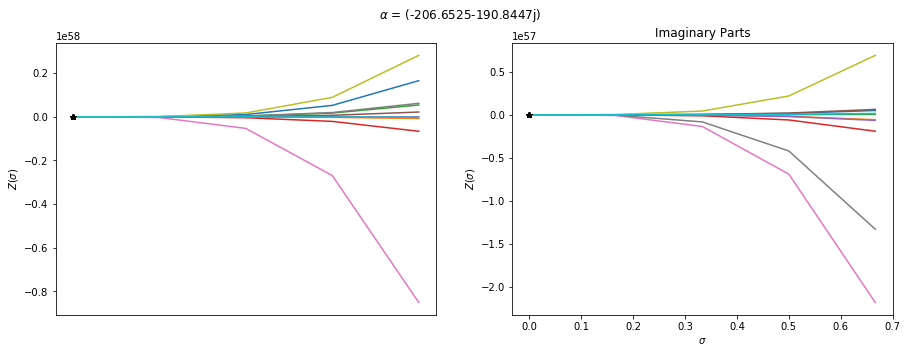

2.37761810938e-13
(-20.7312463274-274.829260999j)


### $\lambda$ = 253.8j

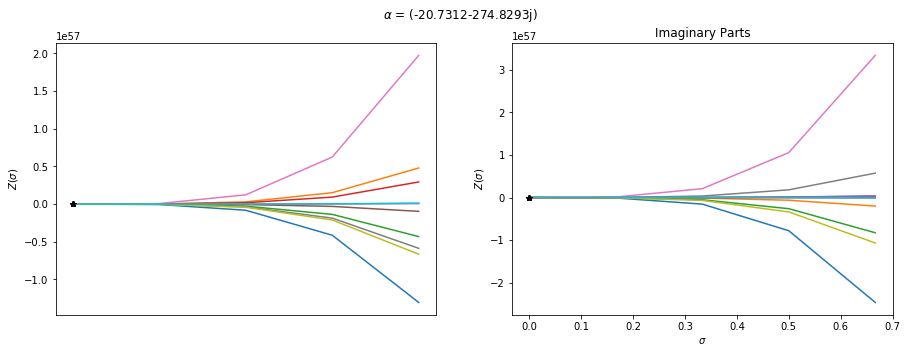

# $\Lambda$ = 100.8

8.7826311764e-14
(-10.0661667169+110.691185066j)


### $\lambda$ = -100.8j

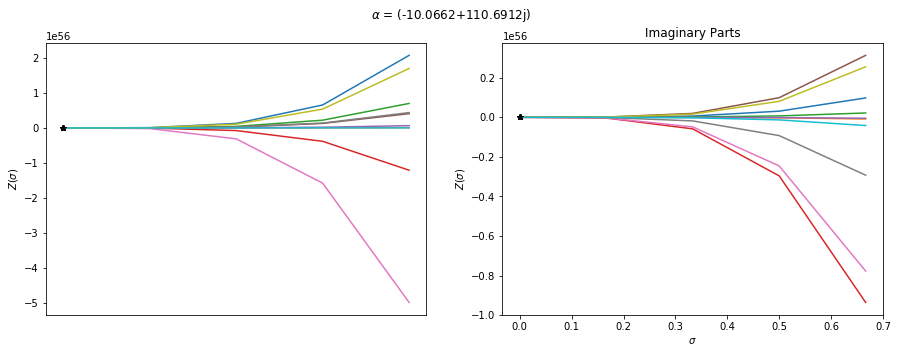

1.84558331264e-13
(-84.3773315901+76.6294392232j)


### $\lambda$ = (71.2764-71.2764j)

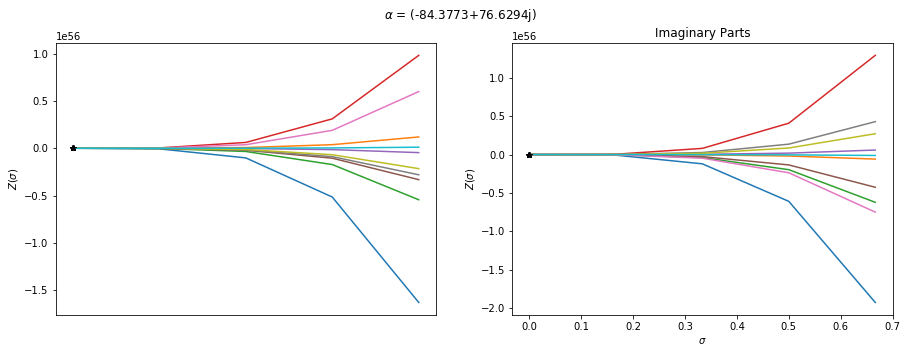

9.38786692874e-14
(-114.966647671+0j)


### $\lambda$ = (100.8+0j)

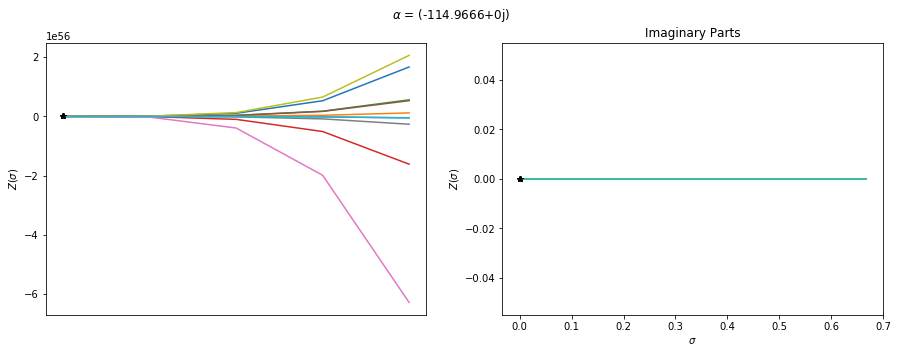

1.84558331264e-13
(-84.3773315901-76.6294392232j)


### $\lambda$ = (71.2764+71.2764j)

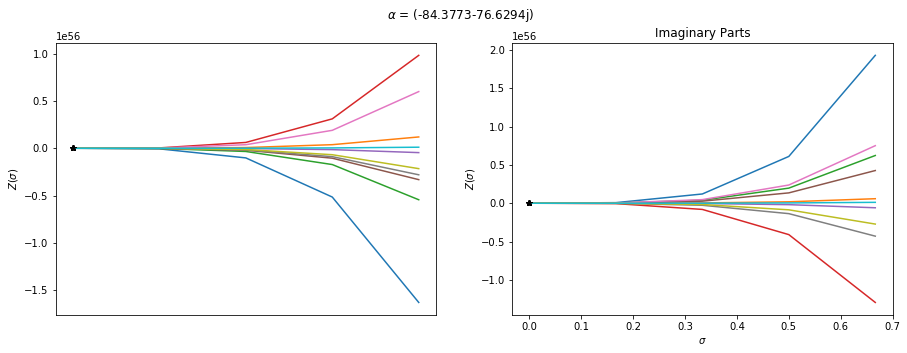

8.7826311764e-14
(-10.0661667169-110.691185066j)


### $\lambda$ = 100.8j

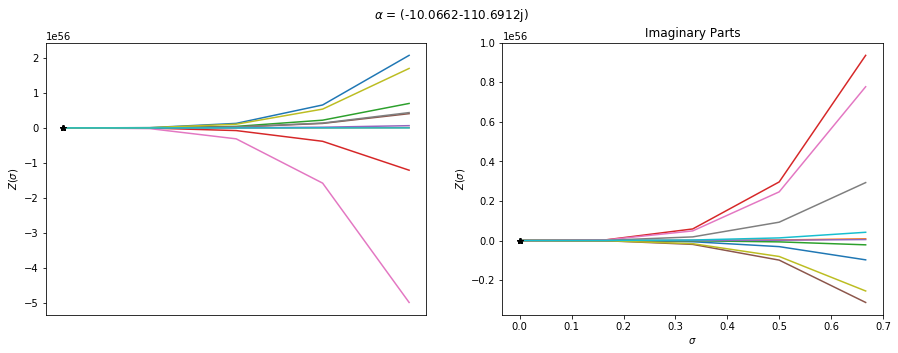

# $\Lambda$ = 73.7

1.34215713179e-13
(-7.33884457718+80.7134360734j)


### $\lambda$ = -73.7j

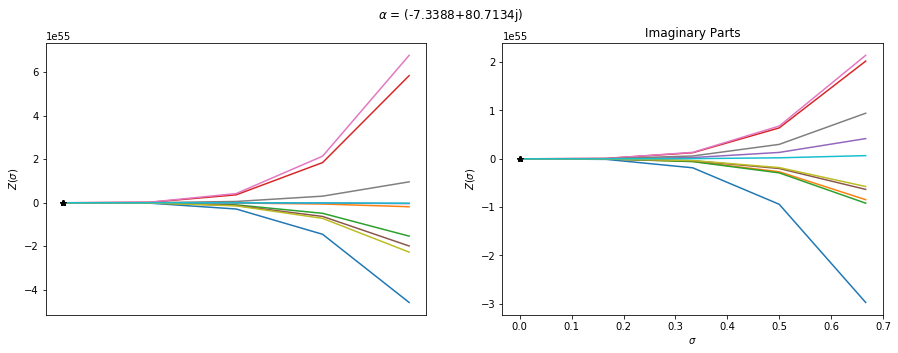

5.24758077437e-14
(-61.6003250093+55.9093814134j)


### $\lambda$ = (52.1138-52.1138j)

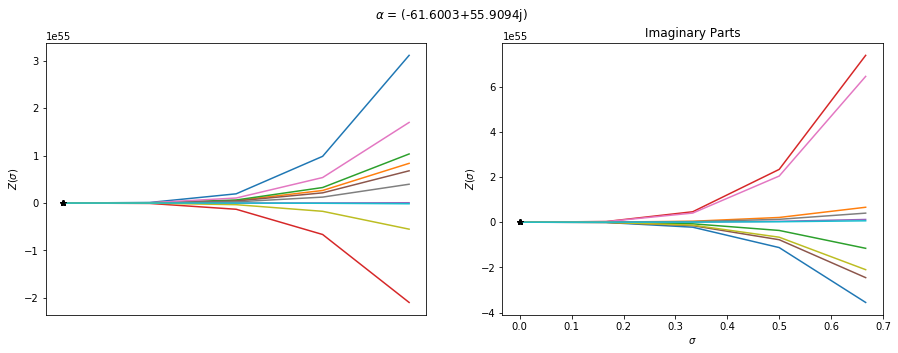

2.91220236111e-14
(-83.940744638+0j)


### $\lambda$ = (73.7+0j)

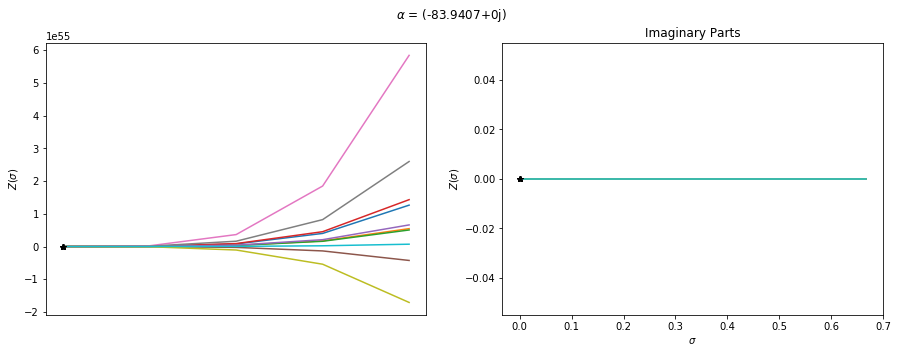

5.24758077437e-14
(-61.6003250093-55.9093814134j)


### $\lambda$ = (52.1138+52.1138j)

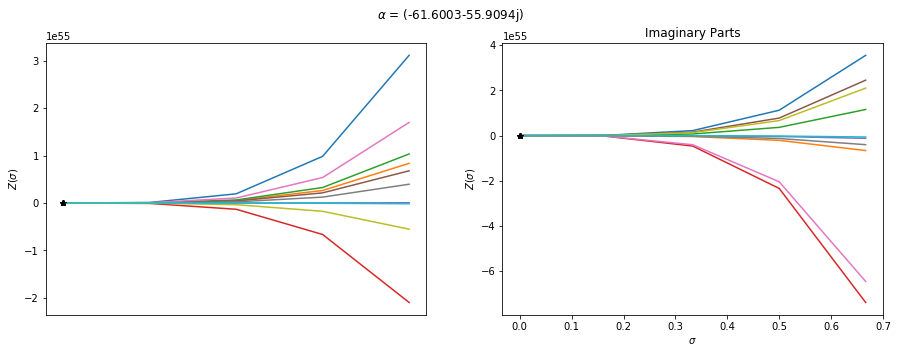

1.34215713179e-13
(-7.33884457718-80.7134360734j)


### $\lambda$ = 73.7j

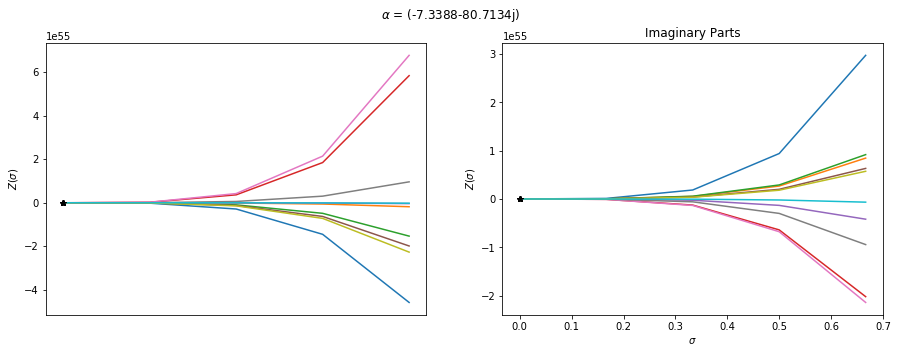

# $\Lambda$ = 113.8

9.45630243788e-14
(-7.8443426483+121.241396619j)


### $\lambda$ = -113.8j

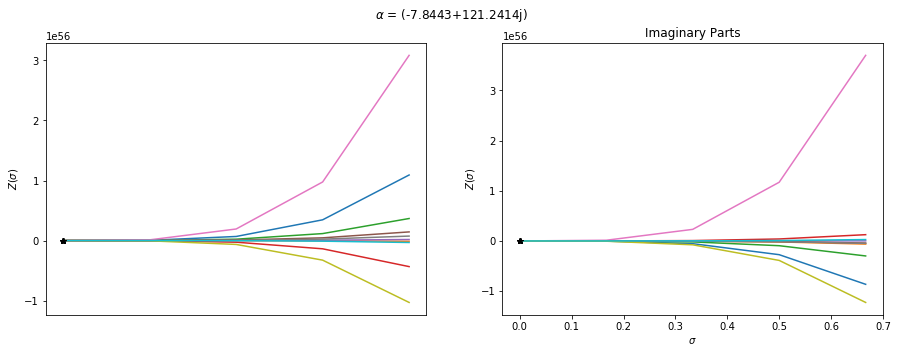

1.90274982319e-13
(-90.5902164854+84.4959783045j)


### $\lambda$ = (80.4688-80.4688j)

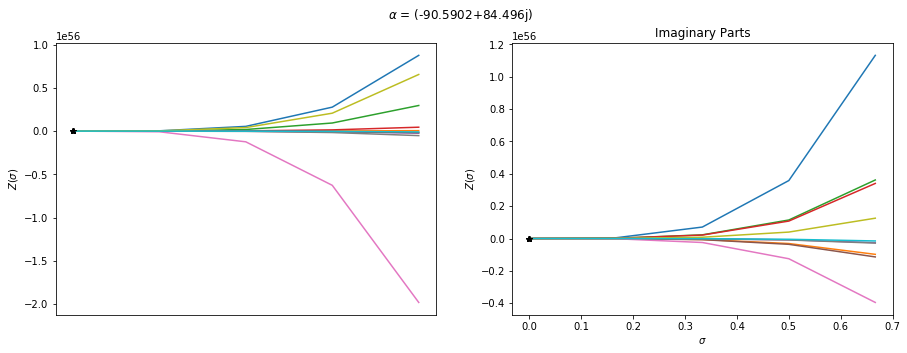

3.41117038165e-13
(-124.721095255+0j)


### $\lambda$ = (113.8+0j)

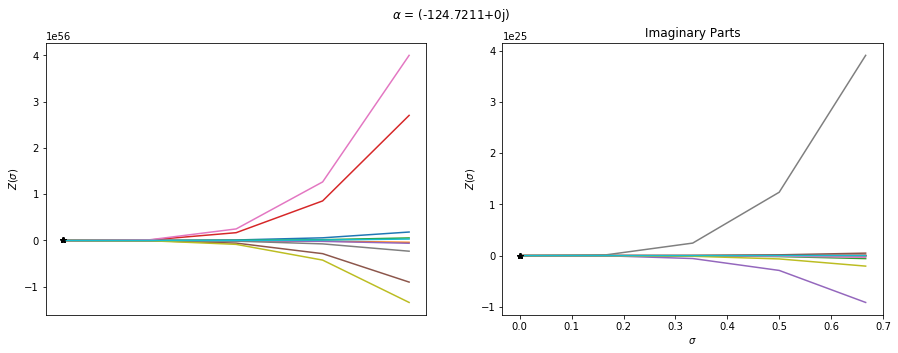

1.90274982319e-13
(-90.5902164854-84.4959783045j)


### $\lambda$ = (80.4688+80.4688j)

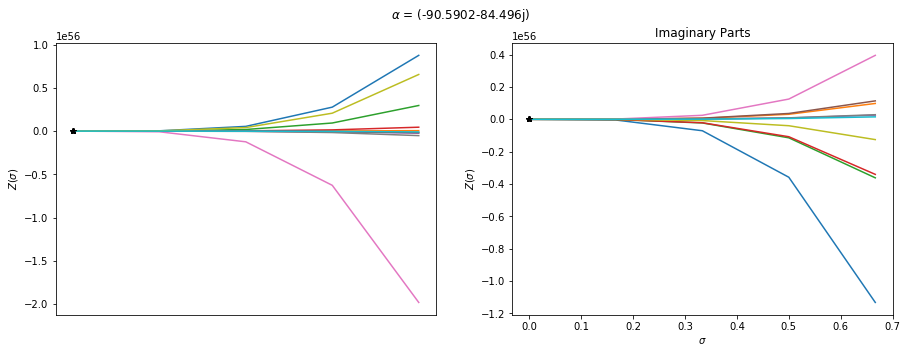

9.45630243788e-14
(-7.8443426483-121.241396619j)


### $\lambda$ = 113.8j

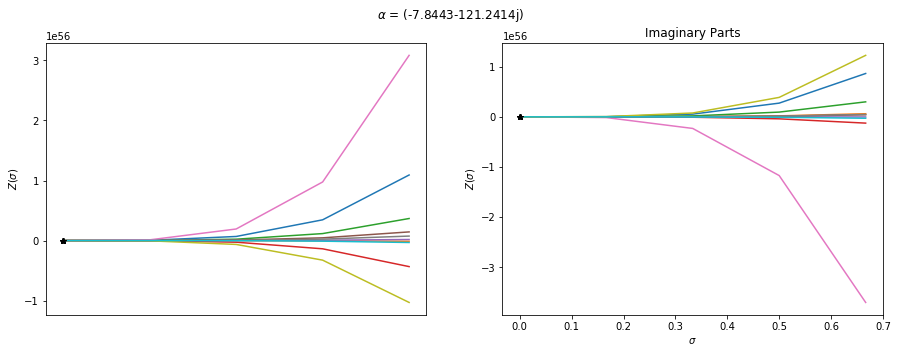

# $\Lambda$ = 229.2

3.17698674851e-13
(-9.40479696399+238.151173902j)


### $\lambda$ = -229.2j

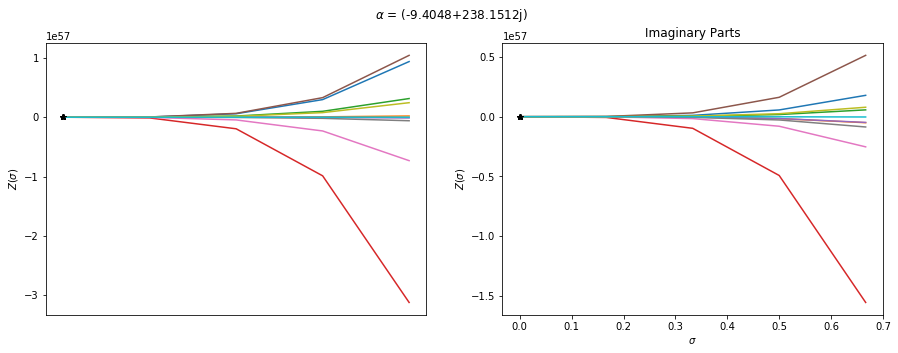

5.35031810767e-13
(-174.213803279+166.91320181j)


### $\lambda$ = (162.0689-162.0689j)

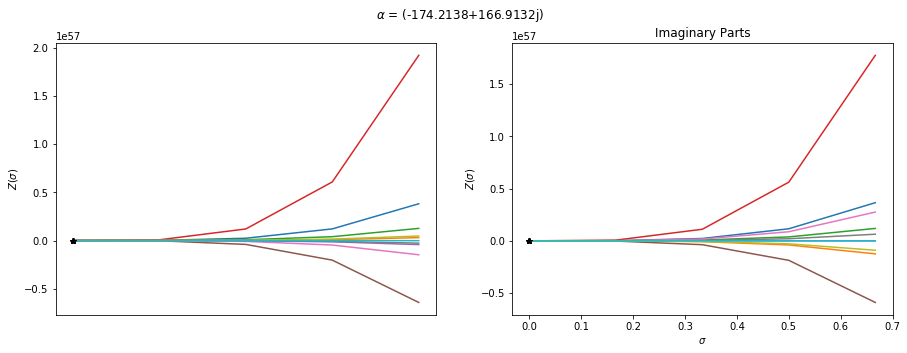

4.4028469354e-13
(-242.307140762+0j)


### $\lambda$ = (229.2+0j)

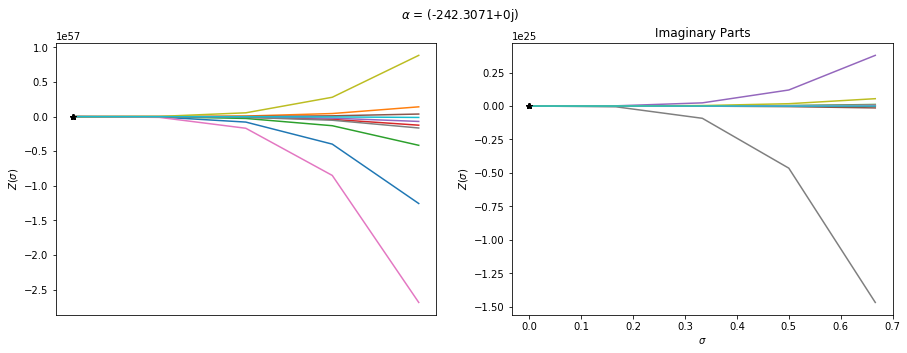

5.35031810767e-13
(-174.213803279-166.91320181j)


### $\lambda$ = (162.0689+162.0689j)

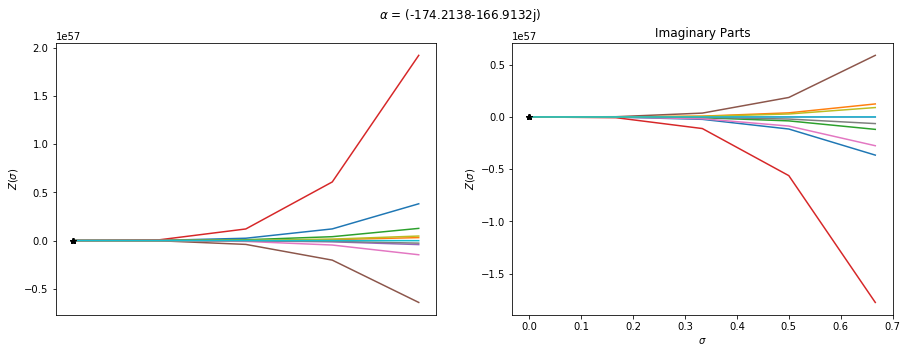

3.17698674851e-13
(-9.40479696399-238.151173902j)


### $\lambda$ = 229.2j

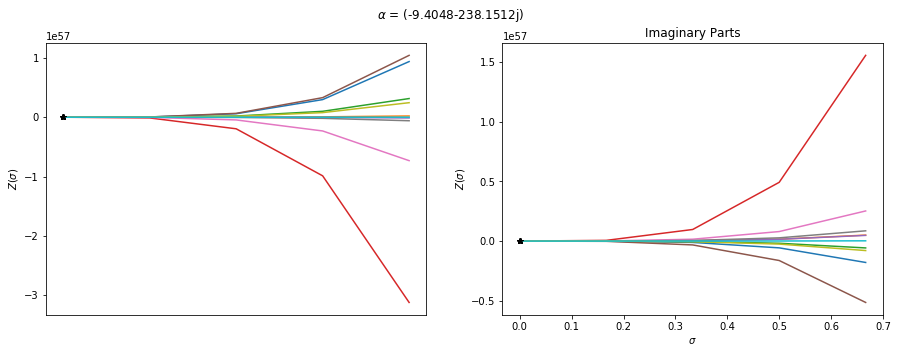

# $\Lambda$ = 274.3

1.76254320888e-13
(-22.7295975358+297.4857907j)


### $\lambda$ = -274.3j

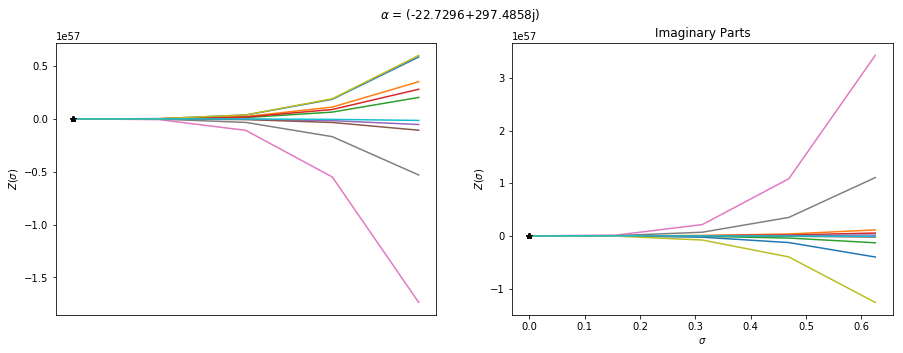

2.880549368e-13
(-223.810243172+206.507480042j)


### $\lambda$ = (193.9594-193.9594j)

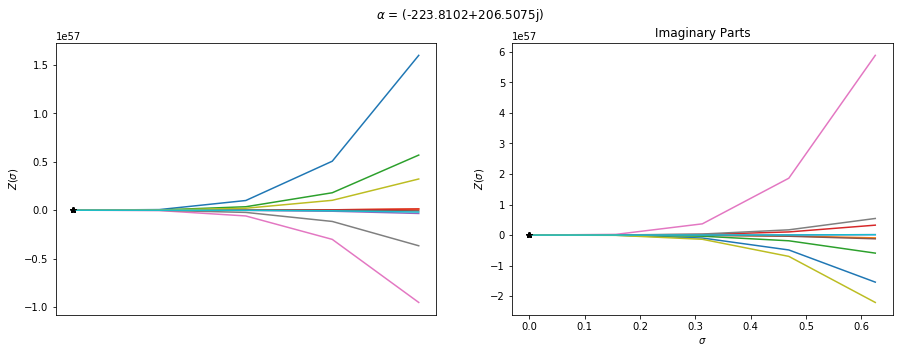

2.99656783115e-13
(-306.651493285+0j)


### $\lambda$ = (274.3+0j)

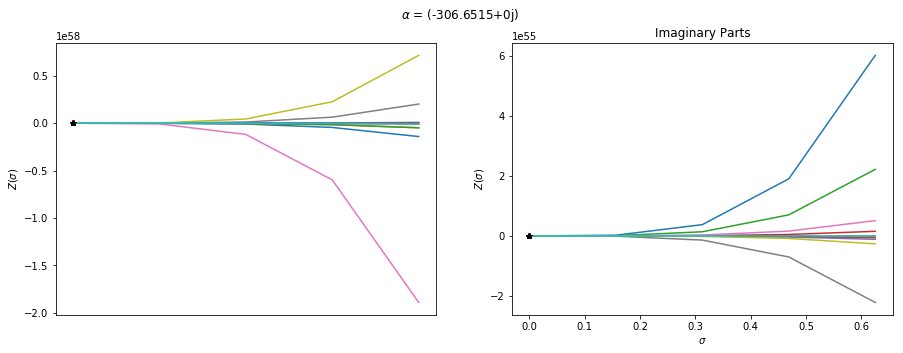

2.880549368e-13
(-223.810243172-206.507480042j)


### $\lambda$ = (193.9594+193.9594j)

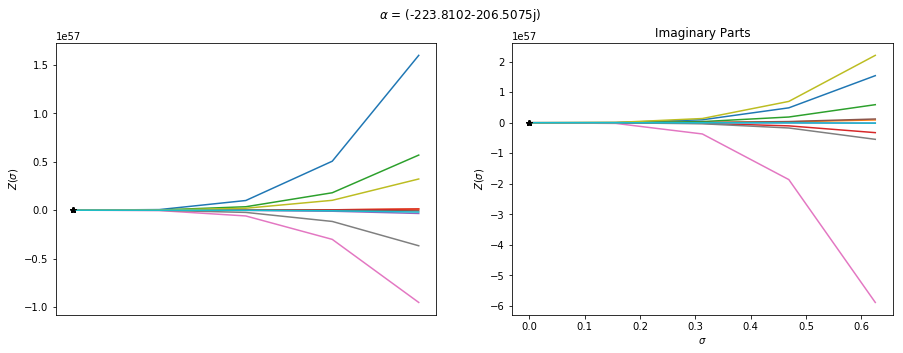

1.76254320888e-13
(-22.7295975358-297.4857907j)


### $\lambda$ = 274.3j

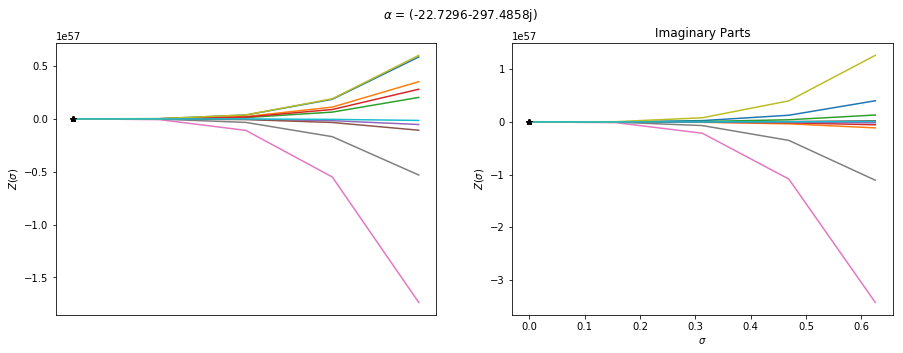

# $\Lambda$ = 106.6

9.93514687287e-14
(-10.8632903341+117.385900528j)


### $\lambda$ = -106.6j

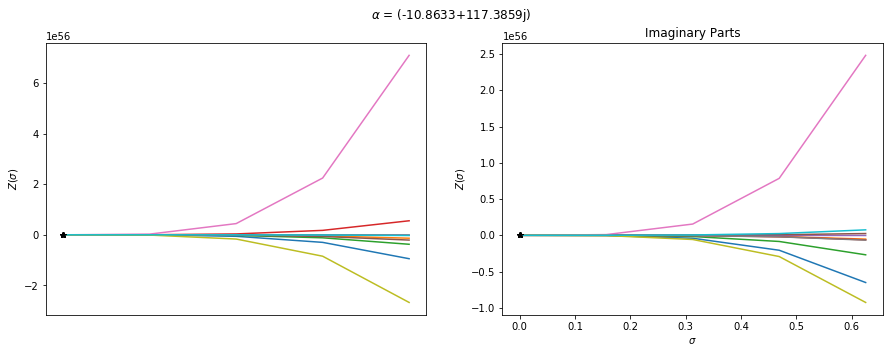

1.63520167907e-13
(-89.5519458617+81.214887033j)


### $\lambda$ = (75.3776-75.3776j)

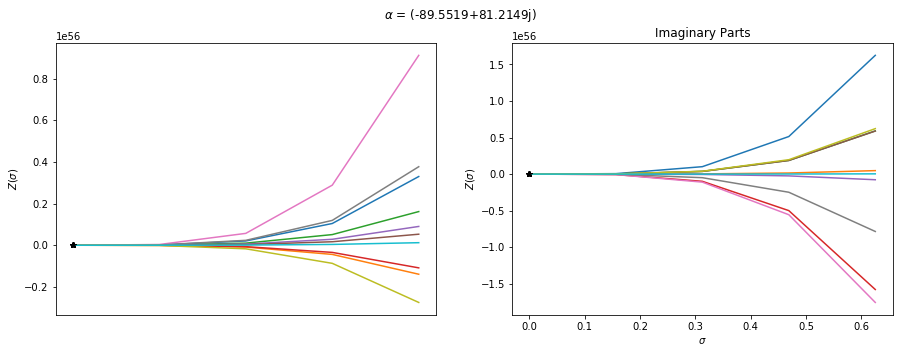

1.57861749003e-13
(-121.937051411+0j)


### $\lambda$ = (106.6+0j)

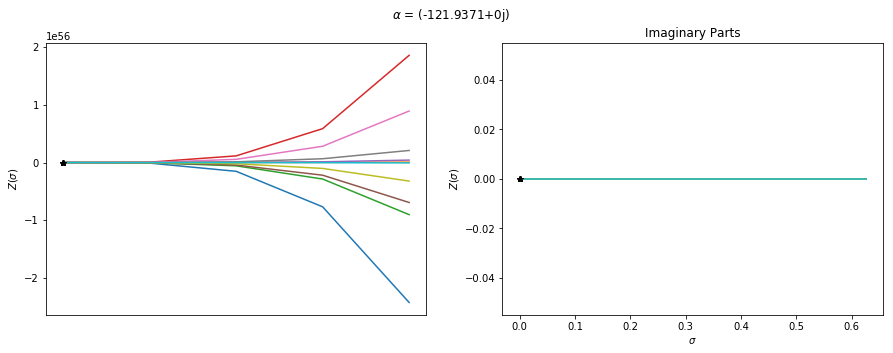

1.63520167907e-13
(-89.5519458617-81.214887033j)


### $\lambda$ = (75.3776+75.3776j)

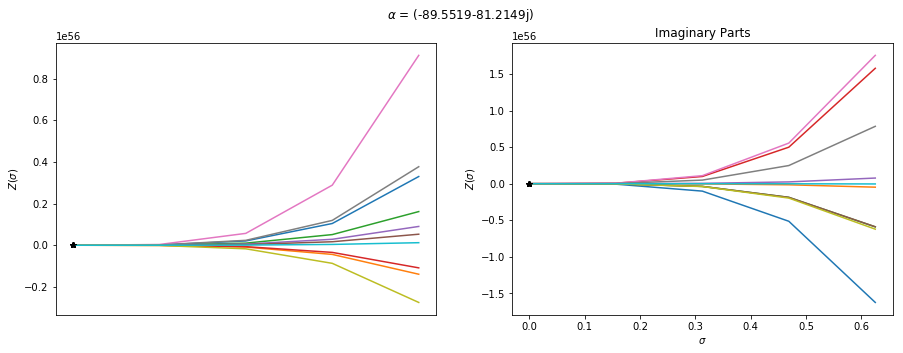

9.93514687287e-14
(-10.8632903341-117.385900528j)


### $\lambda$ = 106.6j

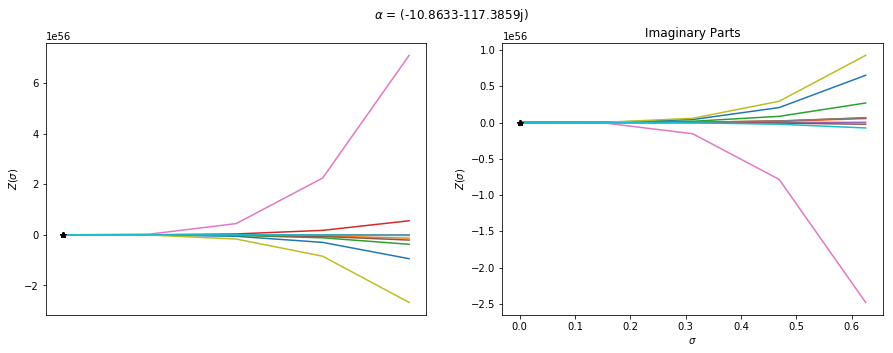

# $\Lambda$ = 69.7

1.06271612882e-13
(-7.47849514678+76.931738849j)


### $\lambda$ = -69.7j

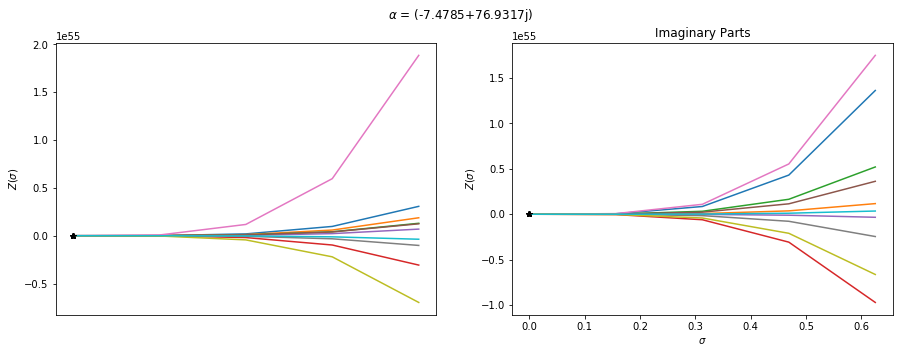

1.51189246936e-13
(-58.9798796505+53.1991089379j)


### $\lambda$ = (49.2853-49.2853j)

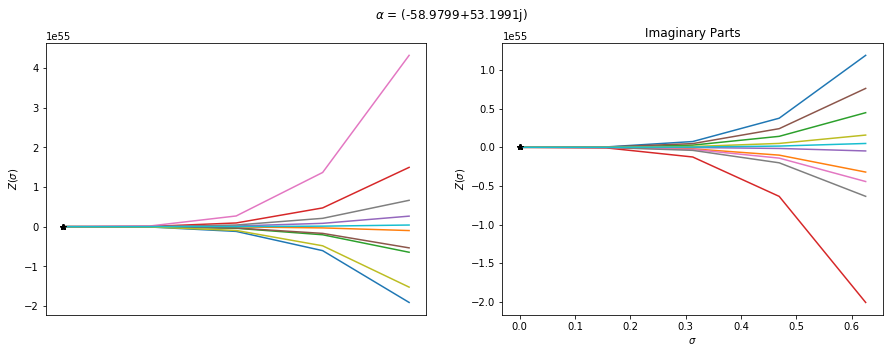

1.89315465954e-13
(-80.1727173669+0j)


### $\lambda$ = (69.7+0j)

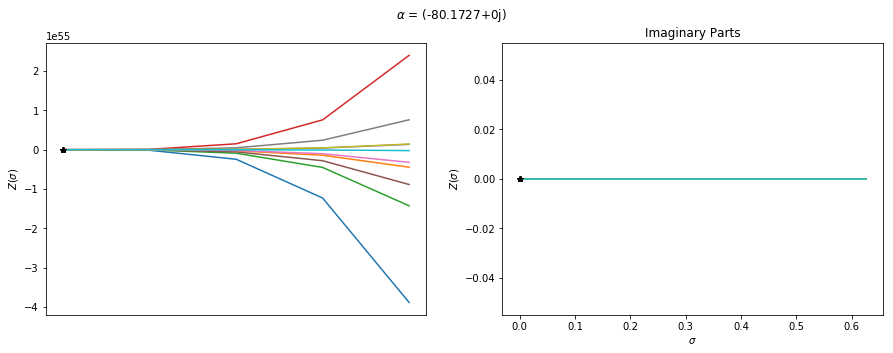

1.51189246936e-13
(-58.9798796505-53.1991089379j)


### $\lambda$ = (49.2853+49.2853j)

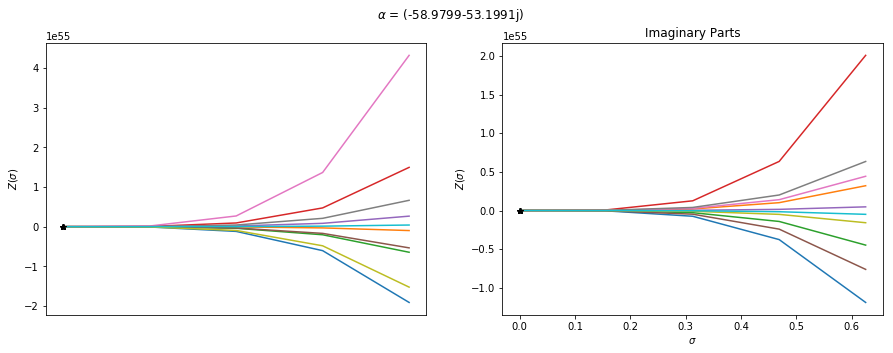

1.06271612882e-13
(-7.47849514678-76.931738849j)


### $\lambda$ = 69.7j

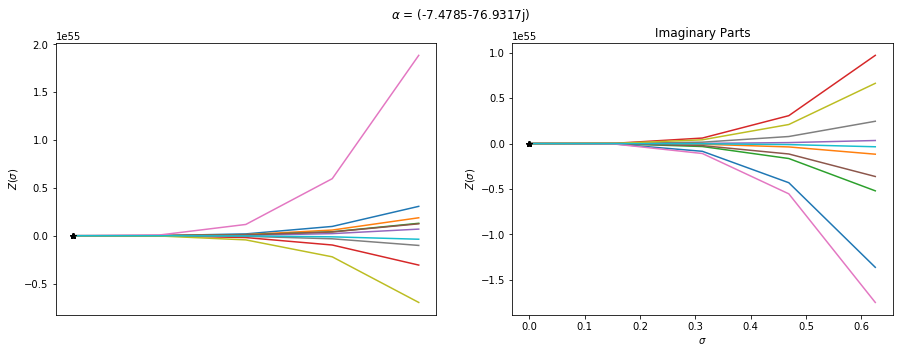

# $\Lambda$ = 98.7

1.03056853485e-13
(-7.68142685483+106.049809225j)


### $\lambda$ = -98.7j

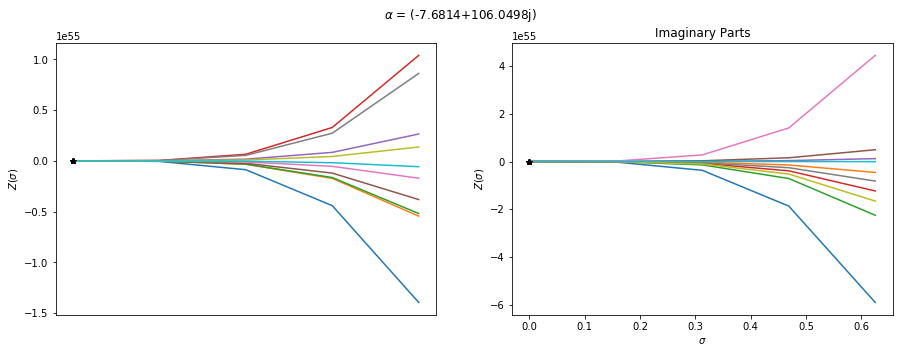

3.29826227857e-13
(-79.7224006953+73.7690981087j)


### $\lambda$ = (69.7914-69.7914j)

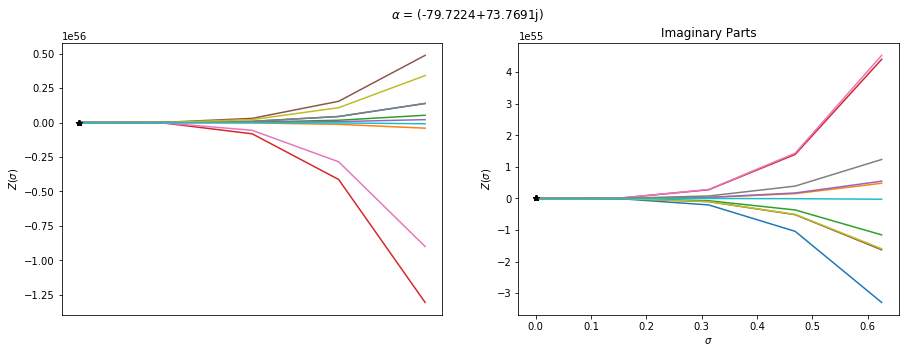

2.15907867715e-13
(-109.420904793+0j)


### $\lambda$ = (98.7+0j)

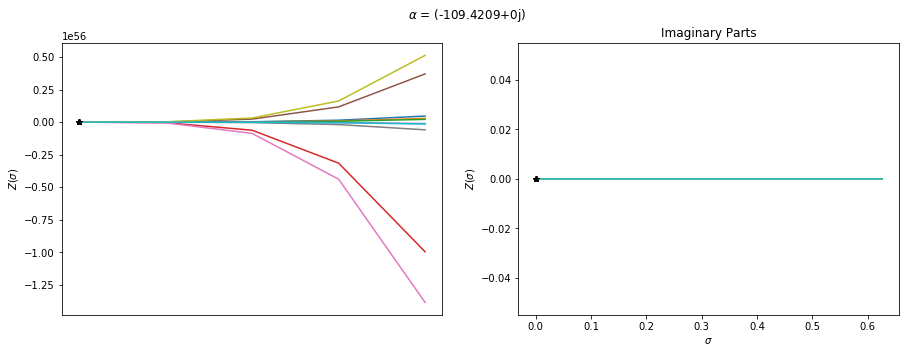

3.29826227857e-13
(-79.7224006953-73.7690981087j)


### $\lambda$ = (69.7914+69.7914j)

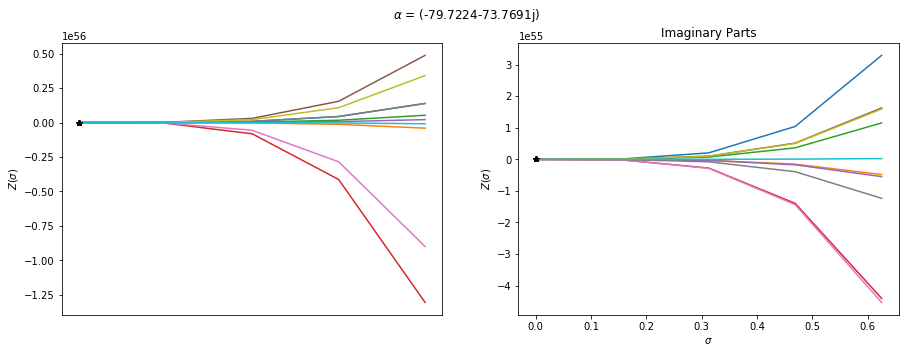

1.03056853485e-13
(-7.68142685483-106.049809225j)


### $\lambda$ = 98.7j

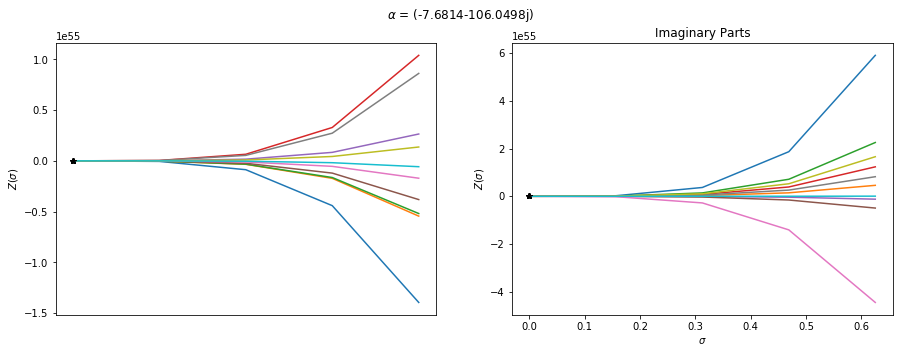

# $\Lambda$ = 183.1

1.40799493198e-13
(-8.87291125276+191.586324678j)


### $\lambda$ = -183.1j

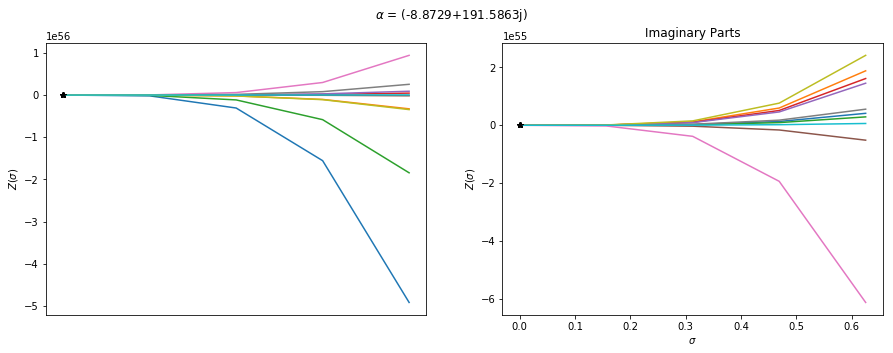

3.97917148601e-13
(-140.941684712+134.064001267j)


### $\lambda$ = (129.4713-129.4713j)

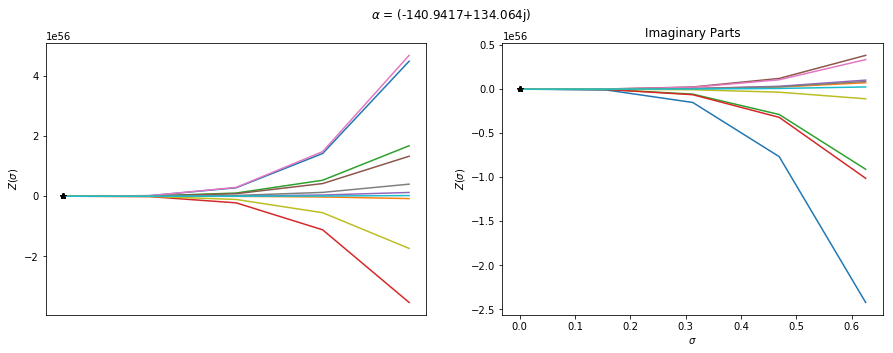

2.50373769386e-13
(-195.48256808+0j)


### $\lambda$ = (183.1+0j)

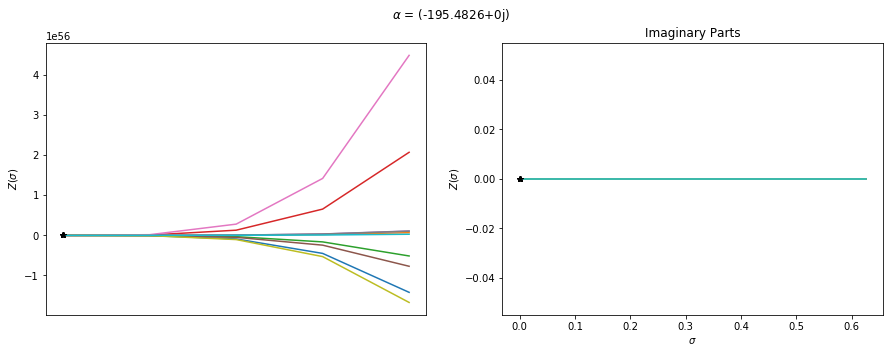

3.97917148601e-13
(-140.941684712-134.064001267j)


### $\lambda$ = (129.4713+129.4713j)

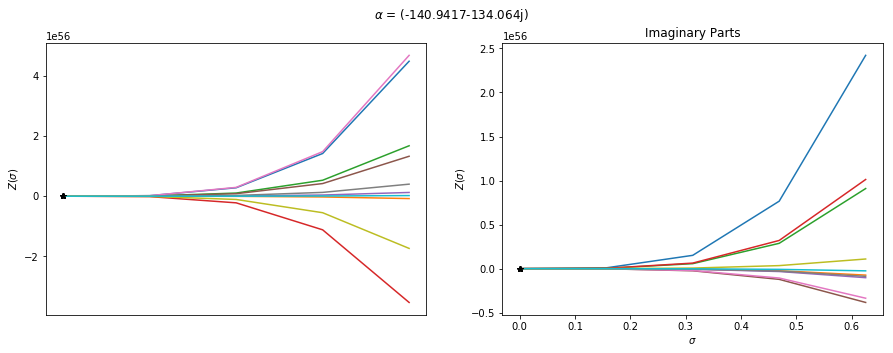

1.40799493198e-13
(-8.87291125276-191.586324678j)


### $\lambda$ = 183.1j

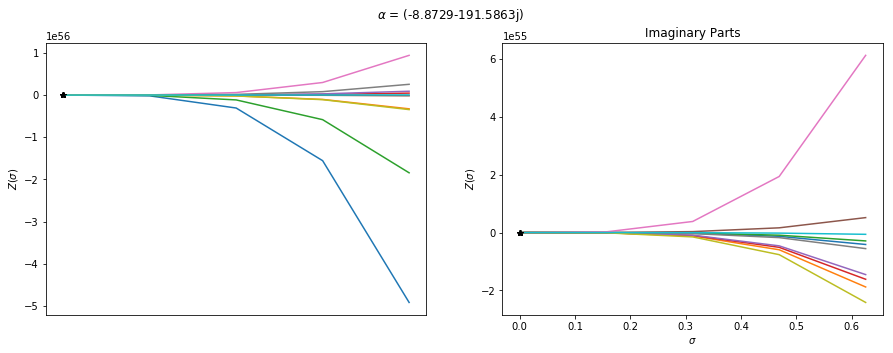

# $\Lambda$ = 300.8

4.05906053097e-13
(-24.8446537983+326.24101416j)


### $\lambda$ = -300.8j

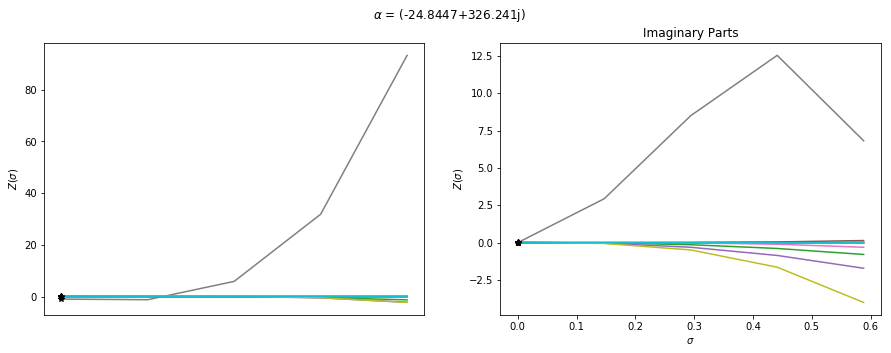

6.29539553535e-13
(-245.357101677+226.466331314j)


### $\lambda$ = (212.6977-212.6977j)

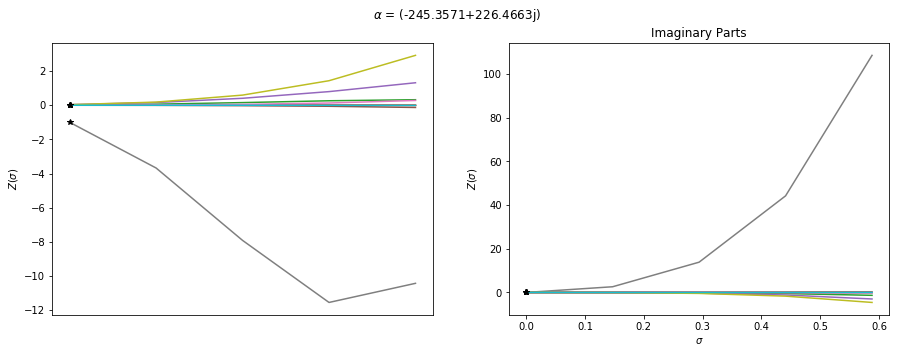

3.51355508801e-13
(-336.203535758+0j)


### $\lambda$ = (300.8+0j)

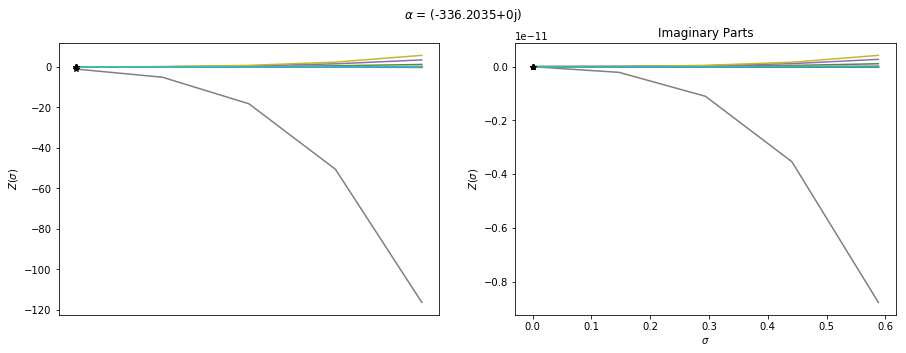

6.29539553535e-13
(-245.357101677-226.466331314j)


### $\lambda$ = (212.6977+212.6977j)

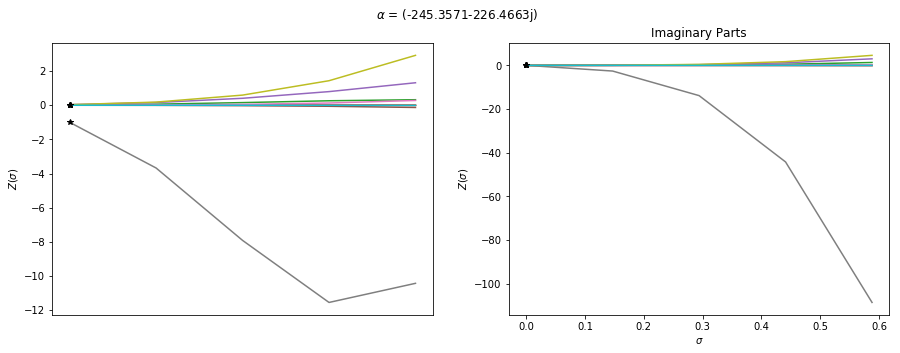

4.05906053097e-13
(-24.8446537983-326.24101416j)


### $\lambda$ = 300.8j

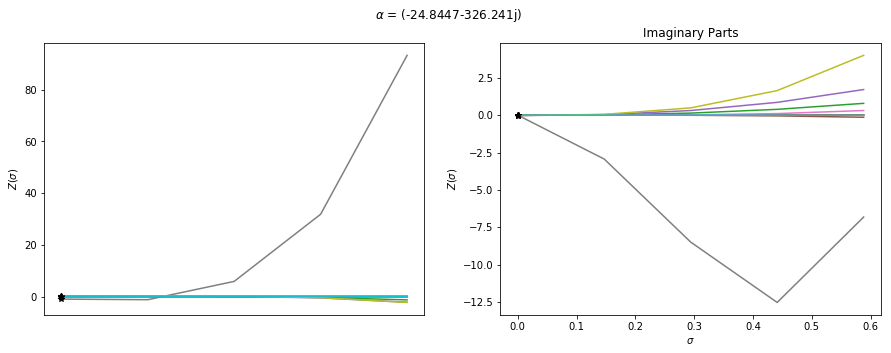

# $\Lambda$ = 117.5

8.56970474563e-14
(-11.8550343493+129.364023499j)


### $\lambda$ = -117.5j

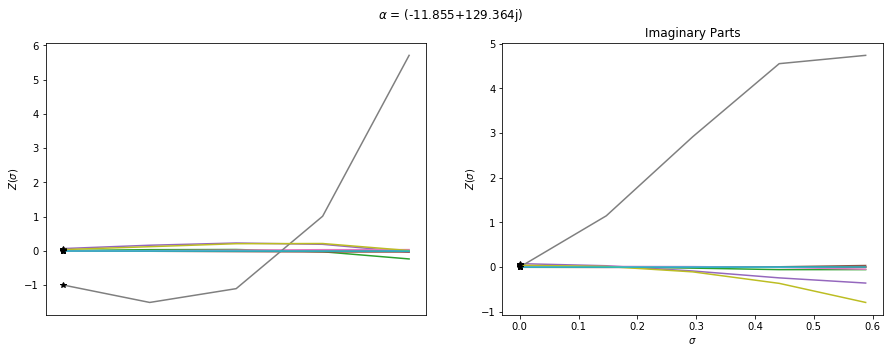

1.11886780815e-13
(-98.5833422171+89.5058350999j)


### $\lambda$ = (83.085-83.085j)

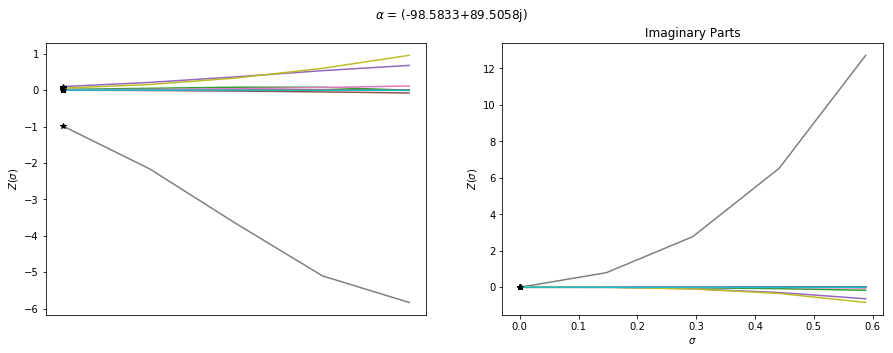

9.06244441114e-14
(-134.27762947+0j)


### $\lambda$ = (117.5+0j)

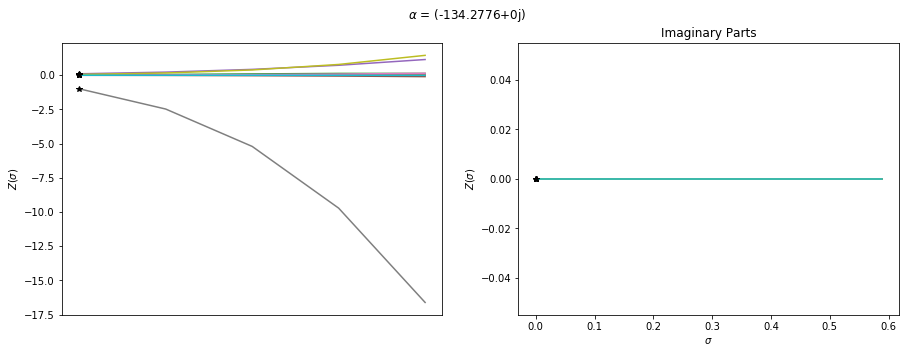

1.11886780815e-13
(-98.5833422171-89.5058350999j)


### $\lambda$ = (83.085+83.085j)

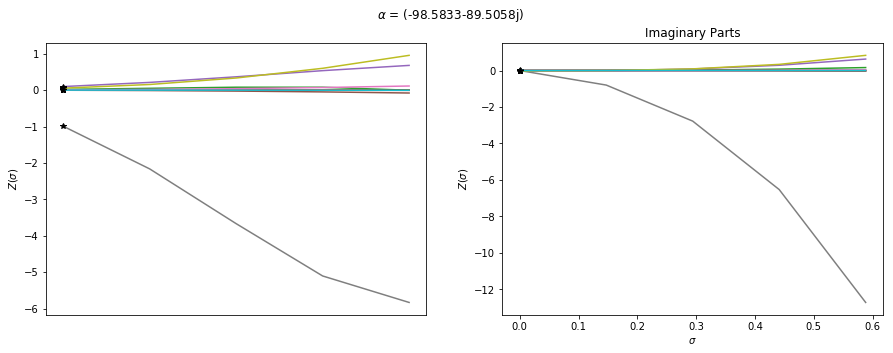

8.56970474563e-14
(-11.8550343493-129.364023499j)


### $\lambda$ = 117.5j

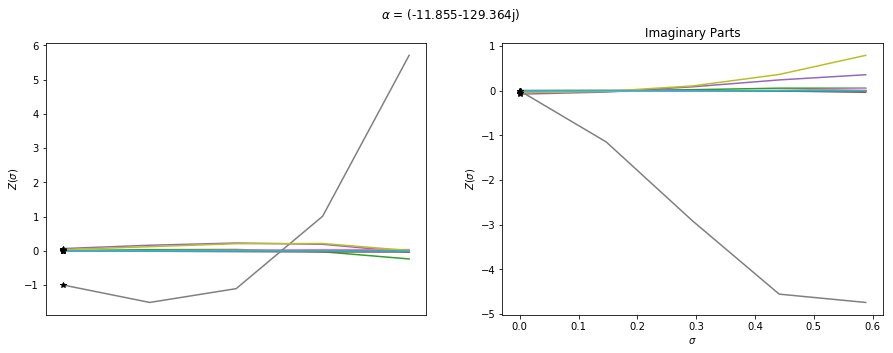

# $\Lambda$ = 70.5

7.91904661727e-14
(-7.79688712181+78.1188319849j)


### $\lambda$ = -70.5j

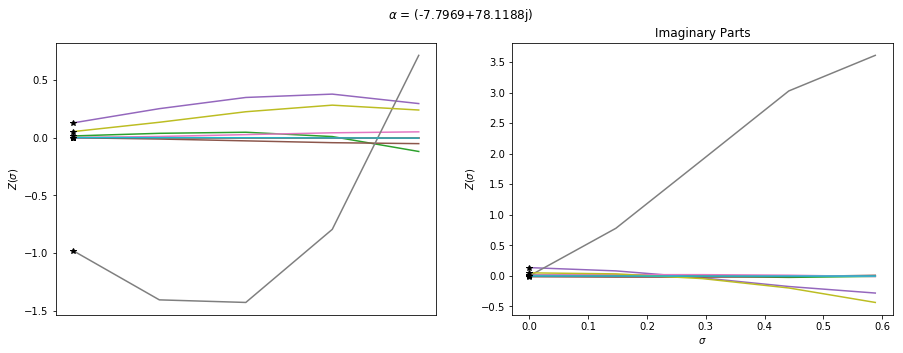

1.07174295873e-13
(-59.9840726964+53.9743000228j)


### $\lambda$ = (49.851-49.851j)

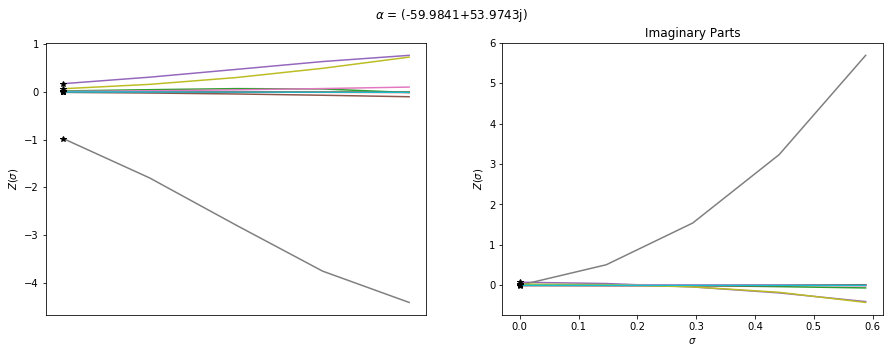

2.00681435647e-13
(-81.4533992244+0j)


### $\lambda$ = (70.5+0j)

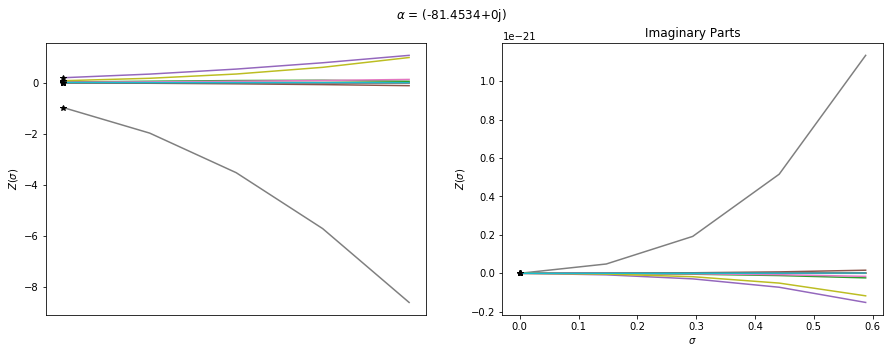

1.07174295873e-13
(-59.9840726964-53.9743000228j)


### $\lambda$ = (49.851+49.851j)

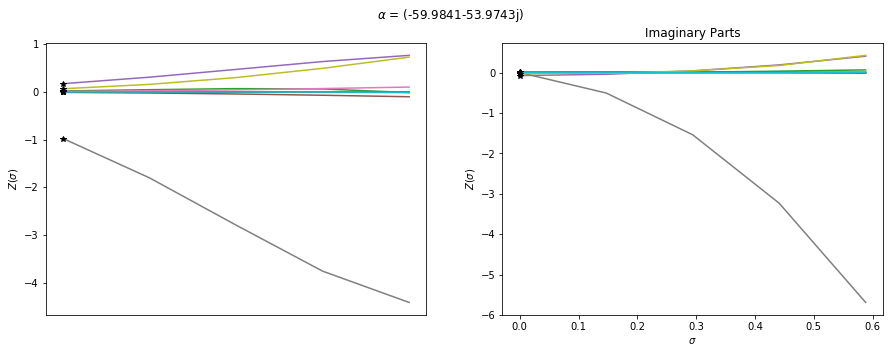

7.91904661727e-14
(-7.79688712181-78.1188319849j)


### $\lambda$ = 70.5j

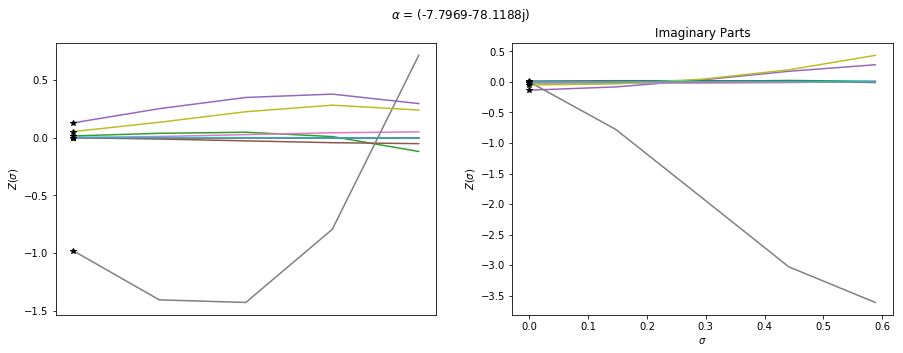

# $\Lambda$ = 91.6

9.01936351847e-14
(-7.68786172855+99.018293611j)


### $\lambda$ = -91.6j

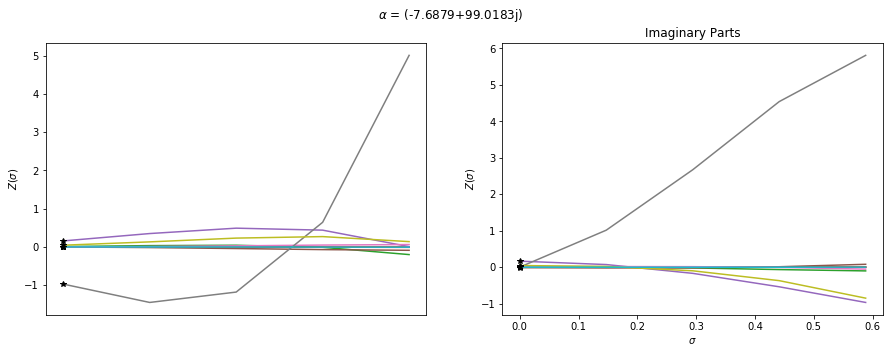

4.78858108087e-14
(-74.7300677082+68.78570578j)


### $\lambda$ = (64.771-64.771j)

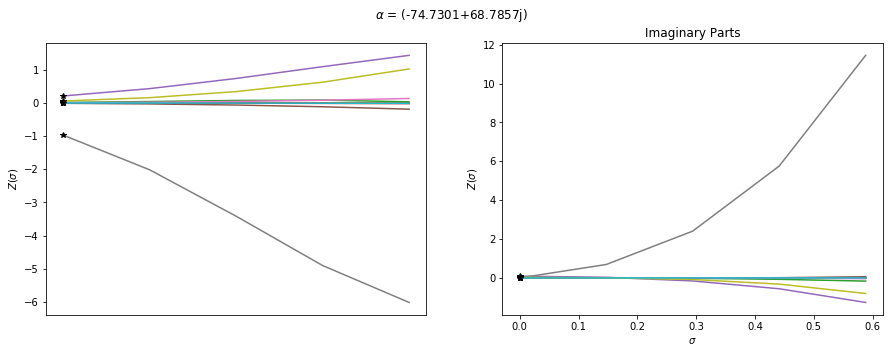

5.43278624059e-14
(-102.356645648+0j)


### $\lambda$ = (91.6+0j)

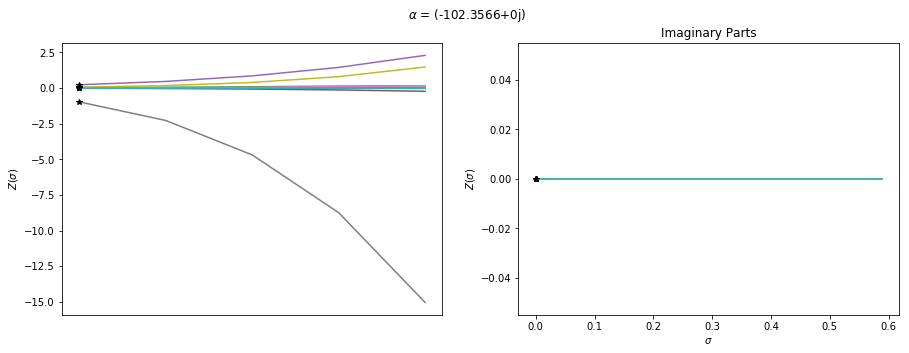

4.78858108087e-14
(-74.7300677082-68.78570578j)


### $\lambda$ = (64.771+64.771j)

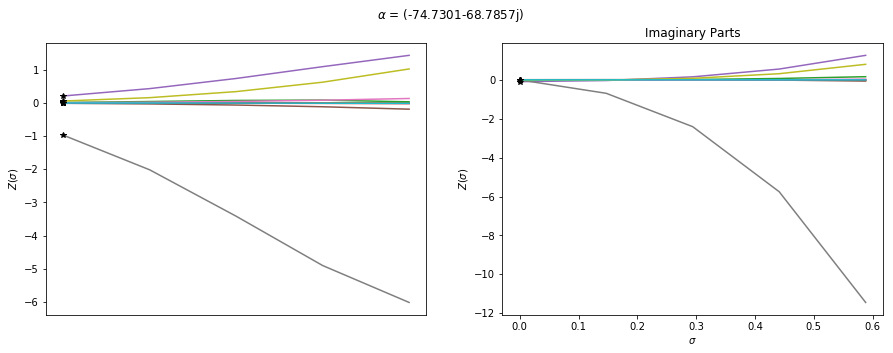

9.01936351847e-14
(-7.68786172855-99.018293611j)


### $\lambda$ = 91.6j

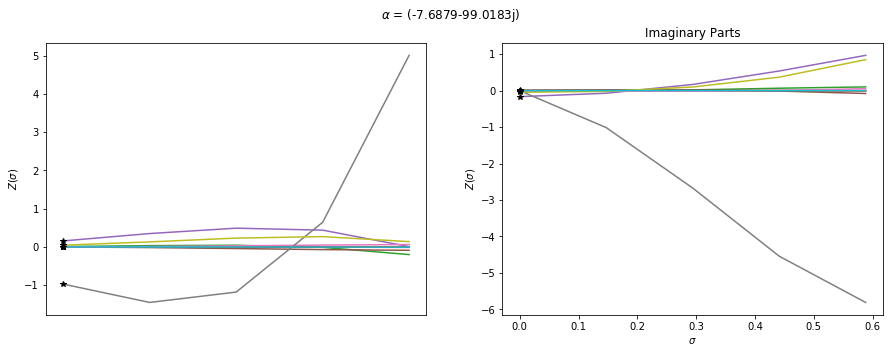

# $\Lambda$ = 154.9

3.34257650135e-13
(-8.50729176288+163.079320726j)


### $\lambda$ = -154.9j

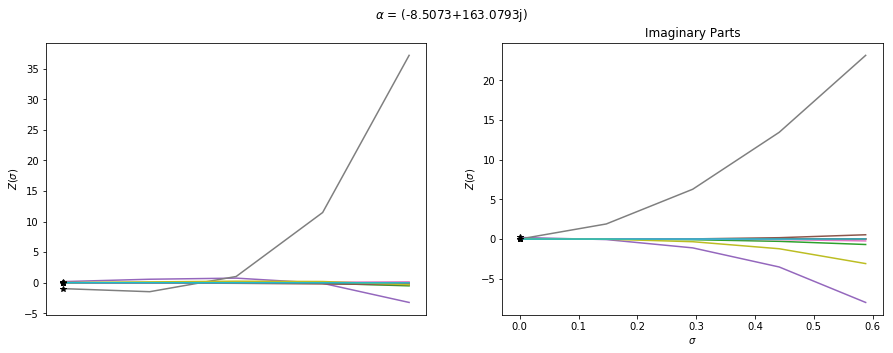

2.36830480103e-13
(-120.541608159+113.95743825j)


### $\lambda$ = (109.5308-109.5308j)

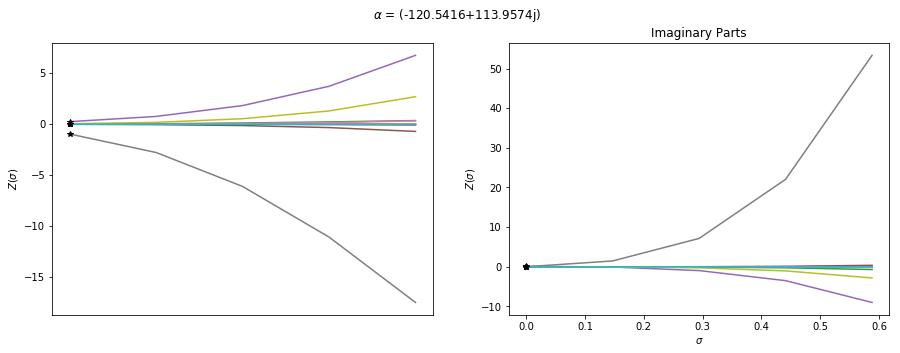

1.0125398271e-13
(-166.789879207+0j)


### $\lambda$ = (154.9+0j)

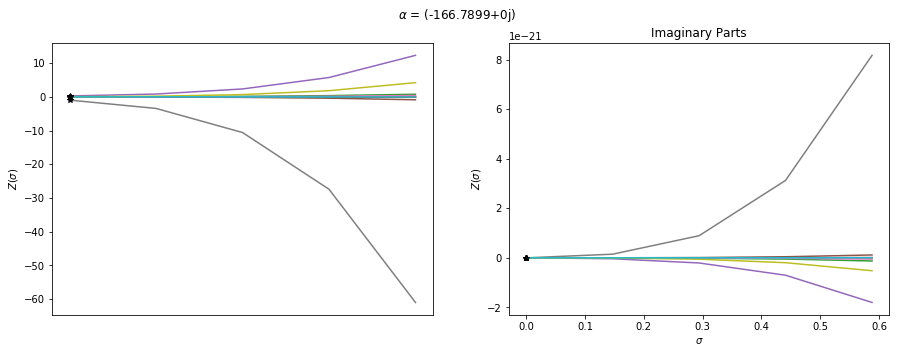

2.36830480103e-13
(-120.541608159-113.95743825j)


### $\lambda$ = (109.5308+109.5308j)

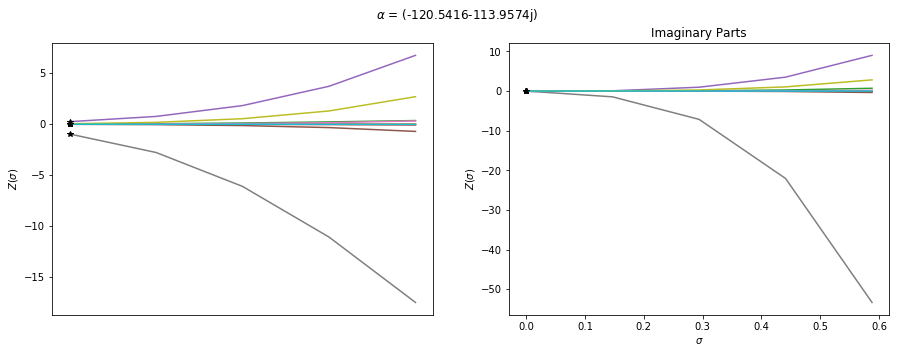

3.34257650135e-13
(-8.50729176288-163.079320726j)


### $\lambda$ = 154.9j

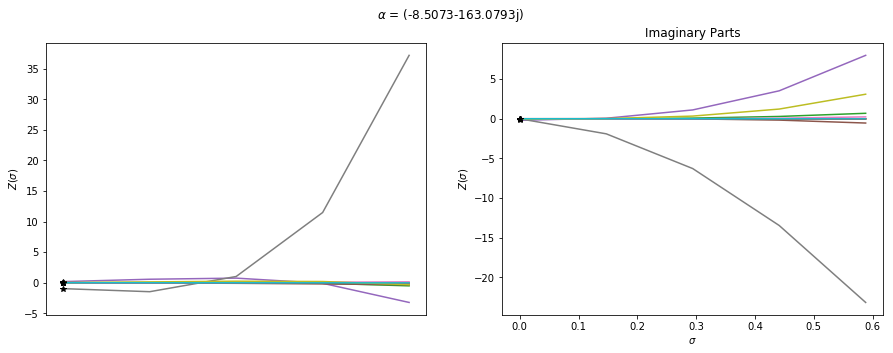

# $\Lambda$ = 347.4

1.1582473573e-13
(-27.6829595481+375.805827214j)


### $\lambda$ = -347.4j

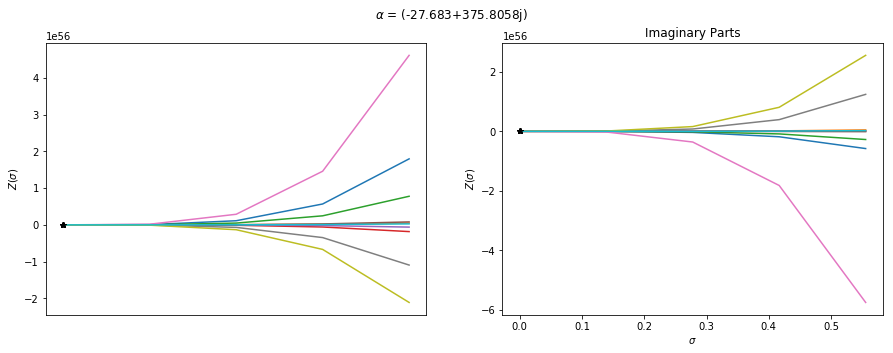

2.95574784556e-13
(-282.056778921+261.022051873j)


### $\lambda$ = (245.6489-245.6489j)

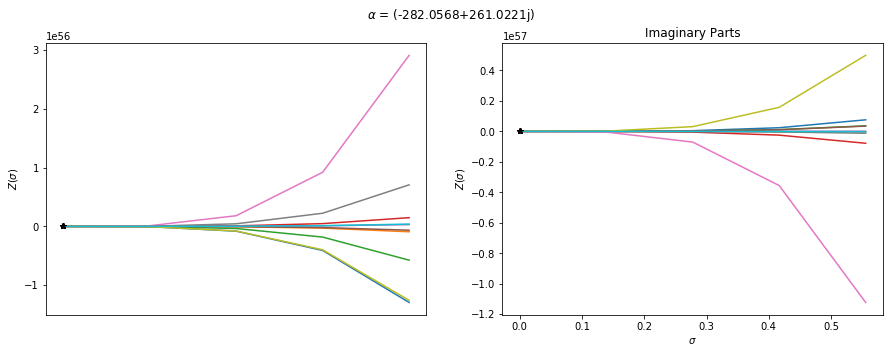

7.21046414088e-14
(-386.871655314+0j)


### $\lambda$ = (347.4+0j)

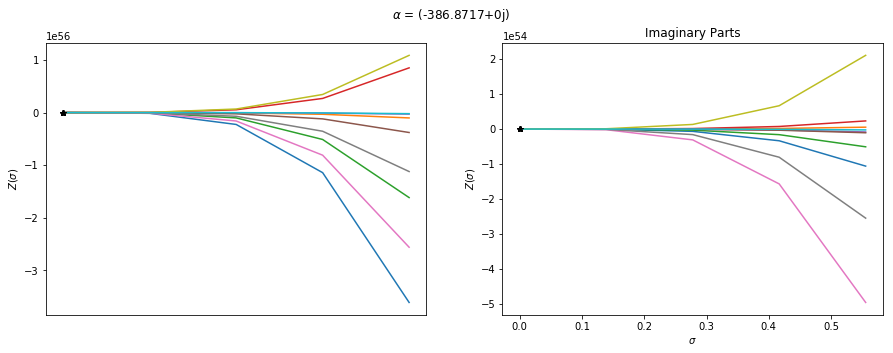

2.95574784556e-13
(-282.056778921-261.022051873j)


### $\lambda$ = (245.6489+245.6489j)

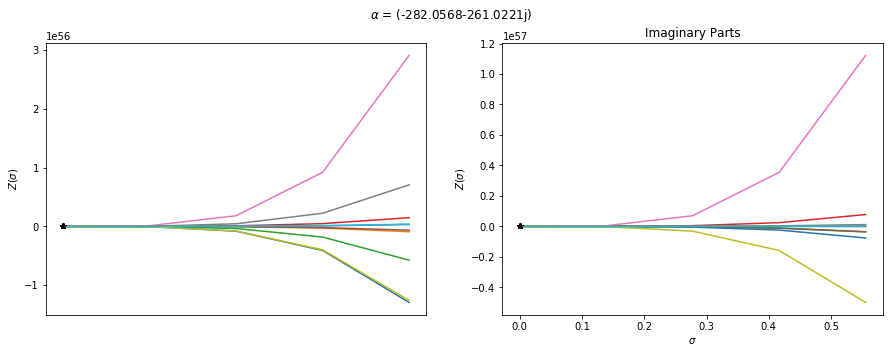

1.1582473573e-13
(-27.6829595481-375.805827214j)


### $\lambda$ = 347.4j

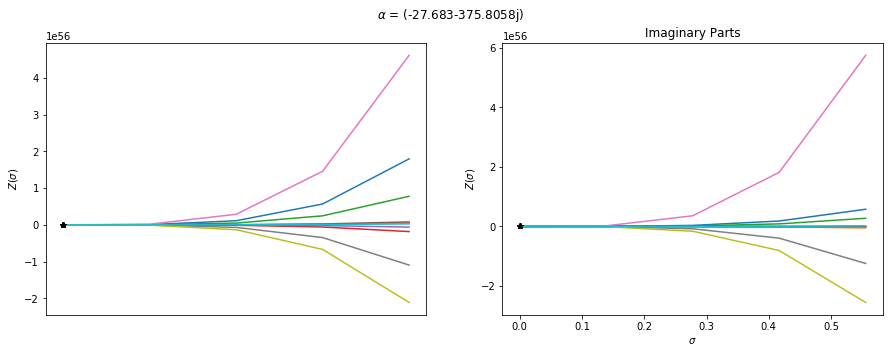

# $\Lambda$ = 131.8

2.90359079765e-13
(-12.966908997+144.853136765j)


### $\lambda$ = -131.8j

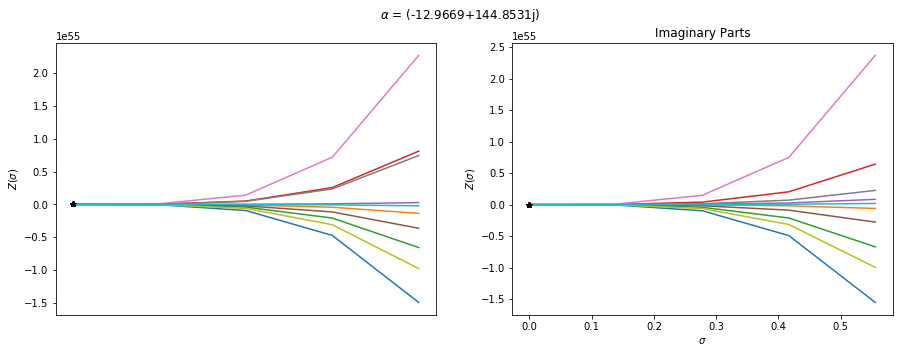

2.09716701331e-13
(-110.172738781+100.26101013j)


### $\lambda$ = (93.1967-93.1967j)

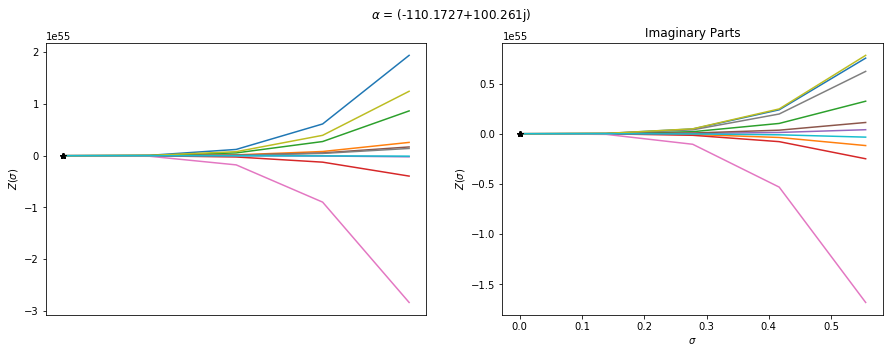

1.12484765546e-13
(-150.183882219+0j)


### $\lambda$ = (131.8+0j)

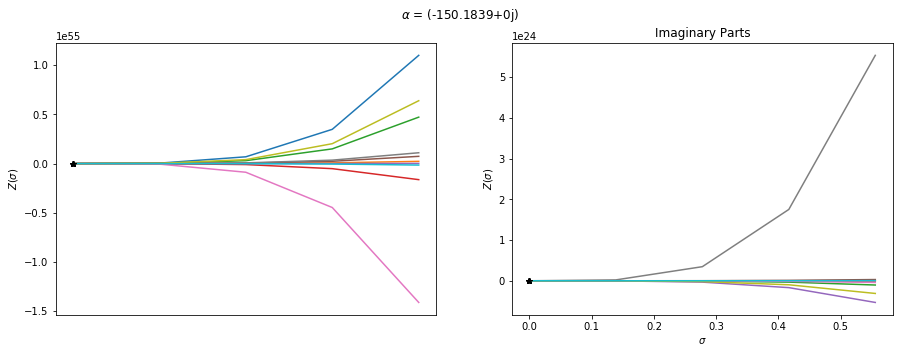

2.09716701331e-13
(-110.172738781-100.26101013j)


### $\lambda$ = (93.1967+93.1967j)

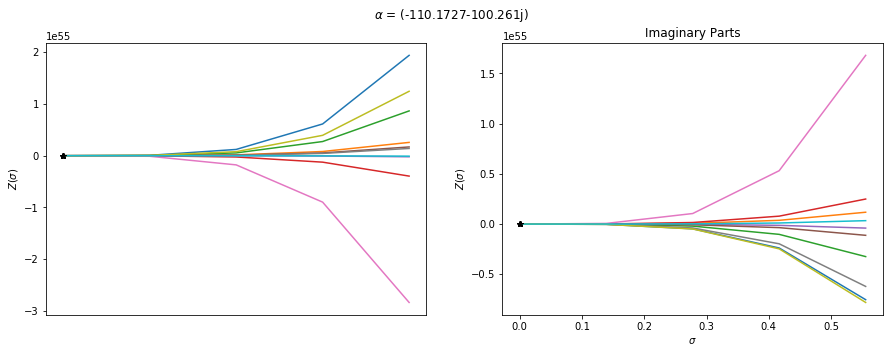

2.90359079765e-13
(-12.966908997-144.853136765j)


### $\lambda$ = 131.8j

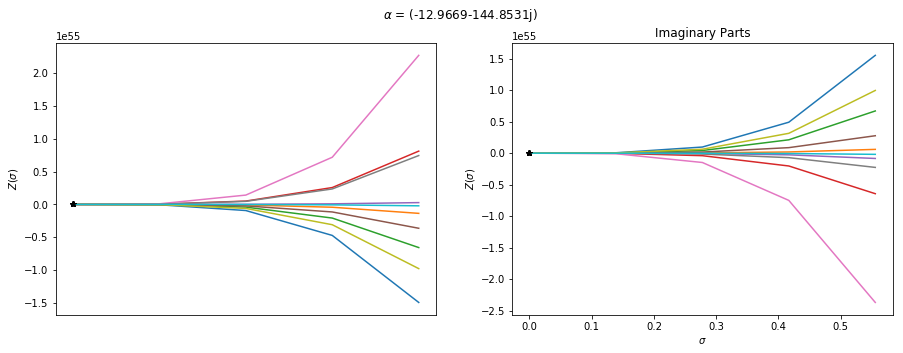

# $\Lambda$ = 74.5

1.24736104732e-13
(-8.25185213669+82.6346793258j)


### $\lambda$ = -74.5j

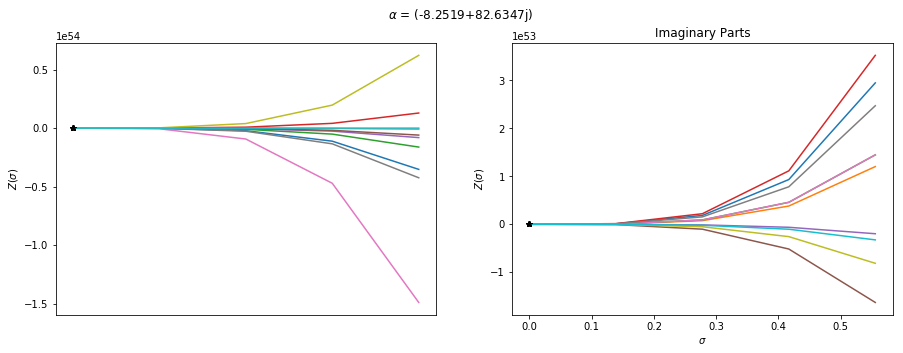

1.37143670949e-13
(-63.4269477227+57.0819130003j)


### $\lambda$ = (52.6795-52.6795j)

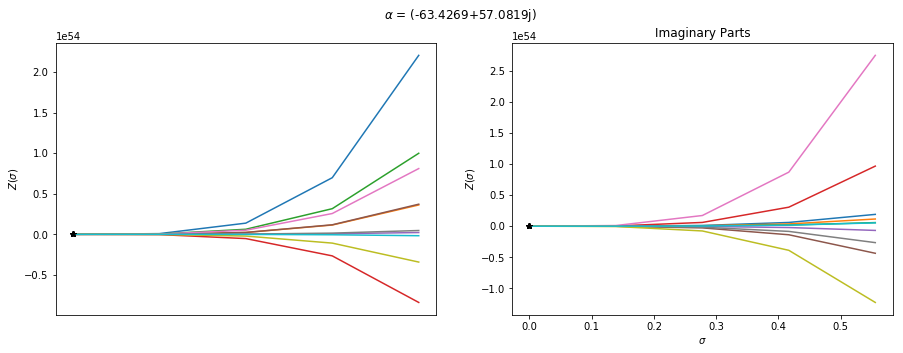

1.52351093146e-13
(-86.1238455924+0j)


### $\lambda$ = (74.5+0j)

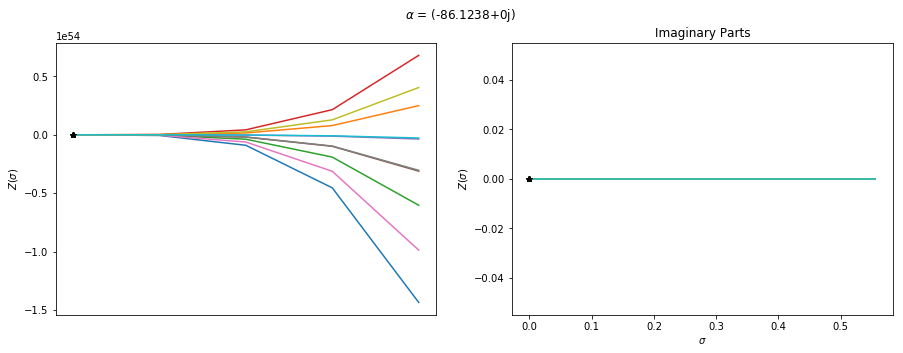

1.37143670949e-13
(-63.4269477227-57.0819130003j)


### $\lambda$ = (52.6795+52.6795j)

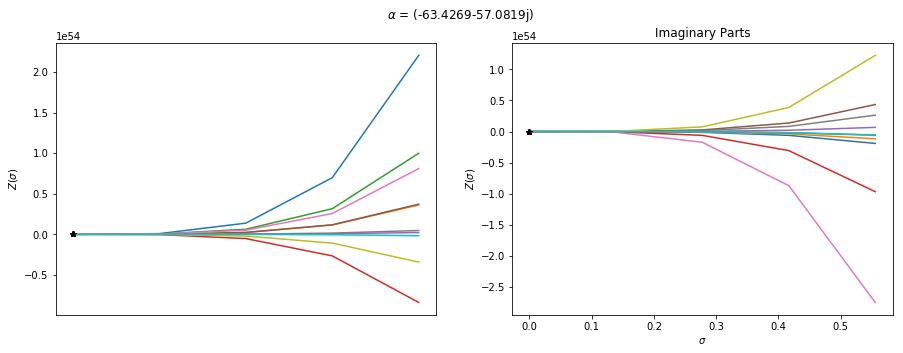

1.24736104732e-13
(-8.25185213669-82.6346793258j)


### $\lambda$ = 74.5j

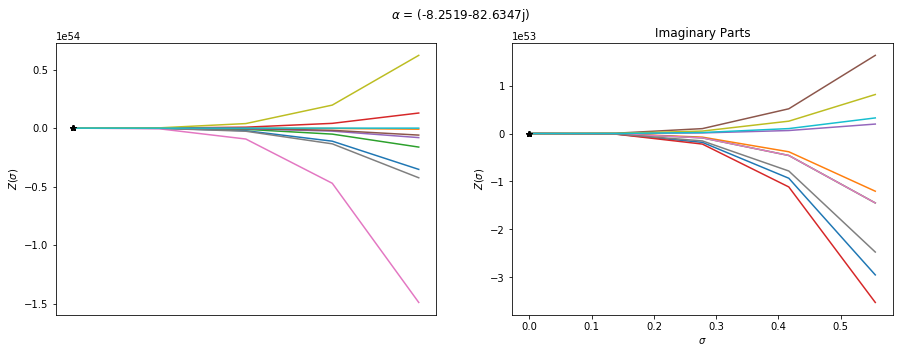

# $\Lambda$ = 89.8

1.14630659264e-13
(-7.84451669663+97.4294962022j)


### $\lambda$ = -89.8j

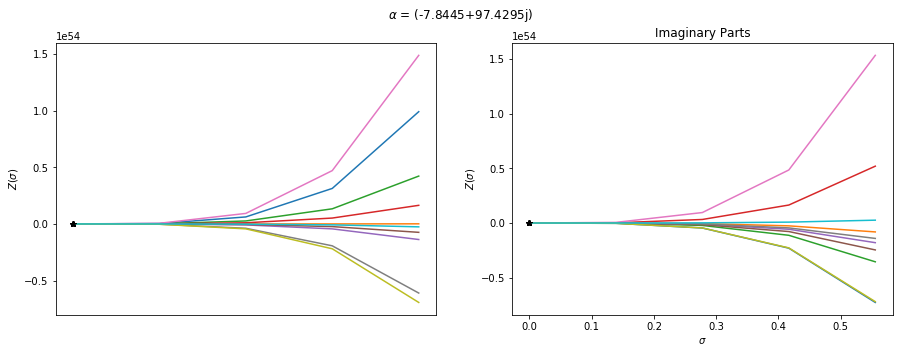

1.52440097359e-13
(-73.679475122+67.6272202261j)


### $\lambda$ = (63.4982-63.4982j)

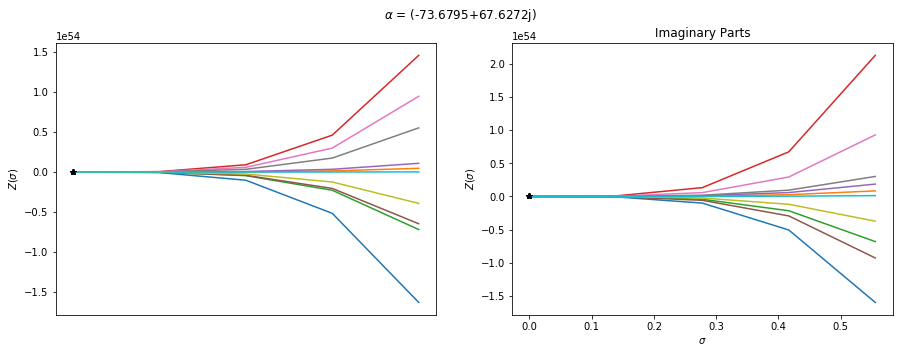

2.01621855642e-13
(-100.801859667+0j)


### $\lambda$ = (89.8+0j)

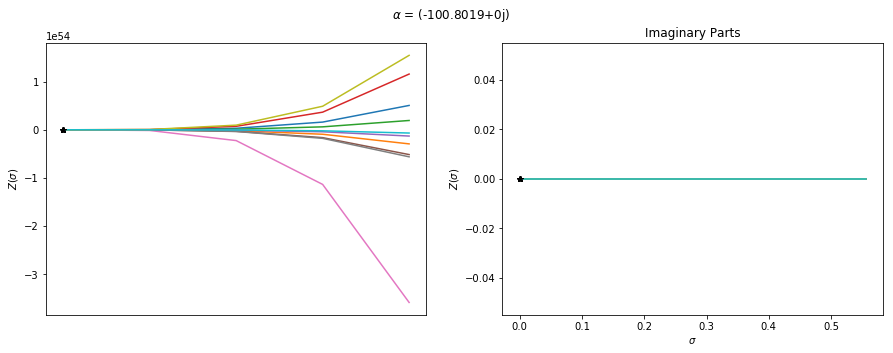

1.52440097359e-13
(-73.679475122-67.6272202261j)


### $\lambda$ = (63.4982+63.4982j)

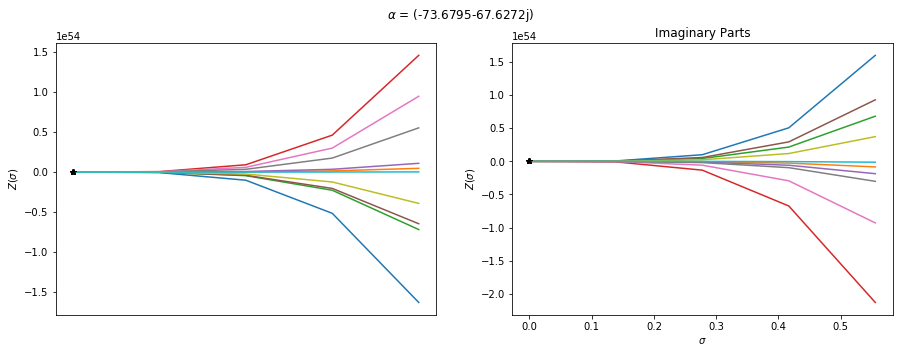

1.14630659264e-13
(-7.84451669663-97.4294962022j)


### $\lambda$ = 89.8j

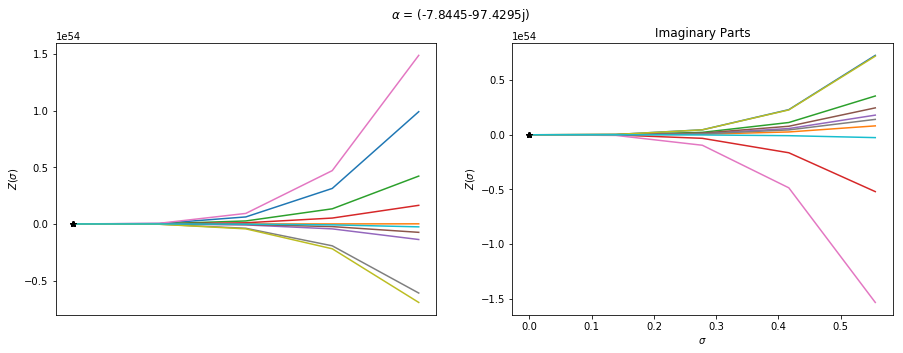

# $\Lambda$ = 138.0

1.62160318523e-13
(-8.29691485903+146.020530122j)


### $\lambda$ = -138j

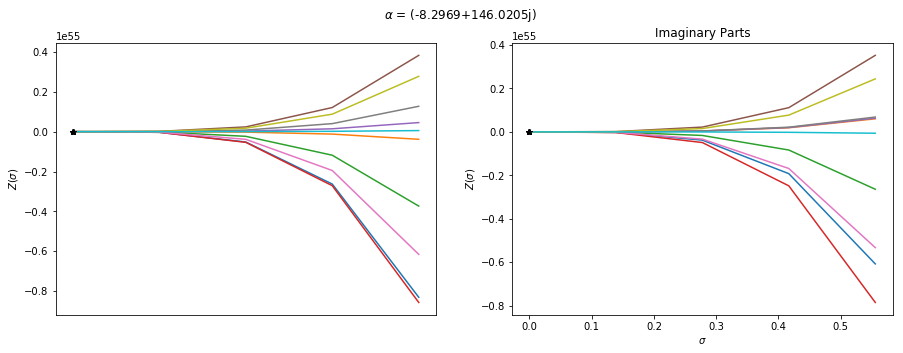

2.8735468522e-13
(-108.332665512+101.921395614j)


### $\lambda$ = (97.5807-97.5807j)

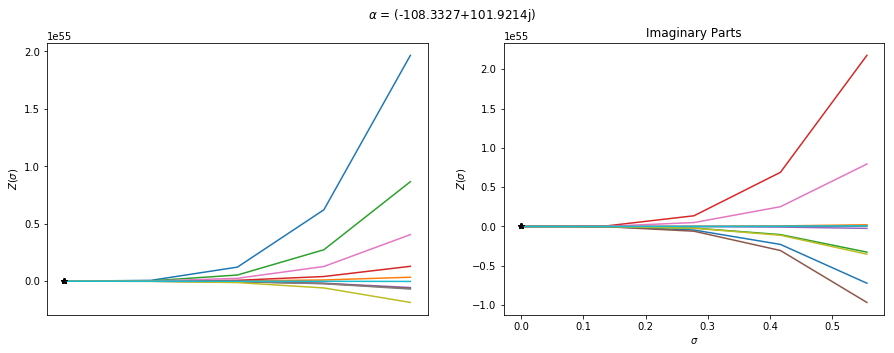

4.89280747536e-13
(-149.614024317+0j)


### $\lambda$ = (138+0j)

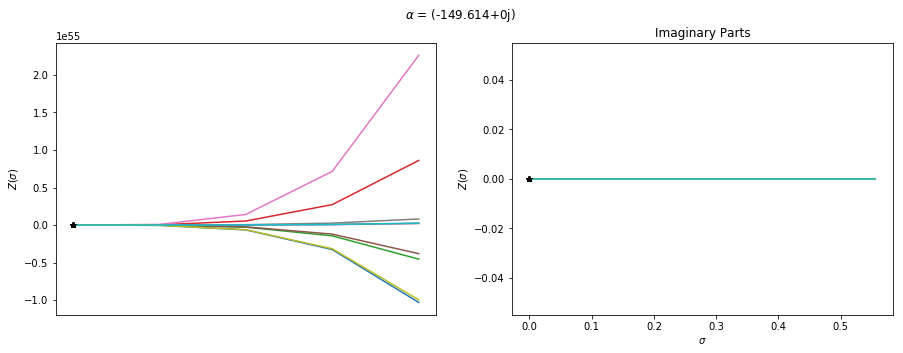

2.8735468522e-13
(-108.332665512-101.921395614j)


### $\lambda$ = (97.5807+97.5807j)

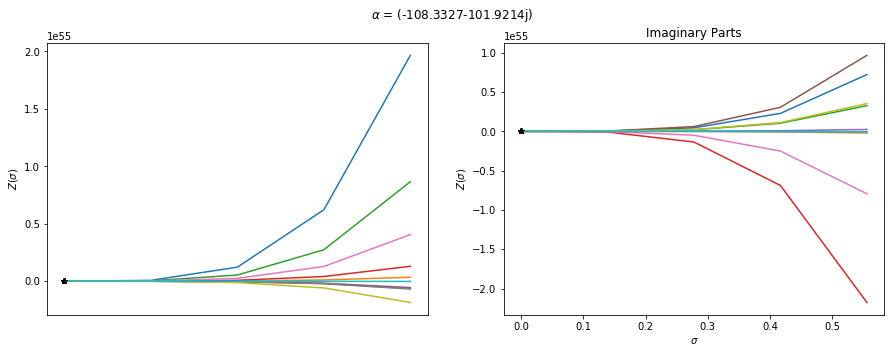

1.62160318523e-13
(-8.29691485903-146.020530122j)


### $\lambda$ = 138j

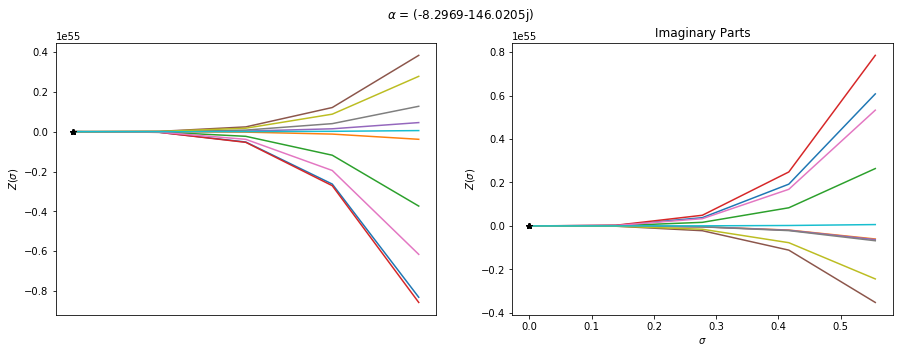

# $\Lambda$ = 397.3

4.11278706835e-13
(-30.5254471353+428.662081268j)


### $\lambda$ = -397.3j

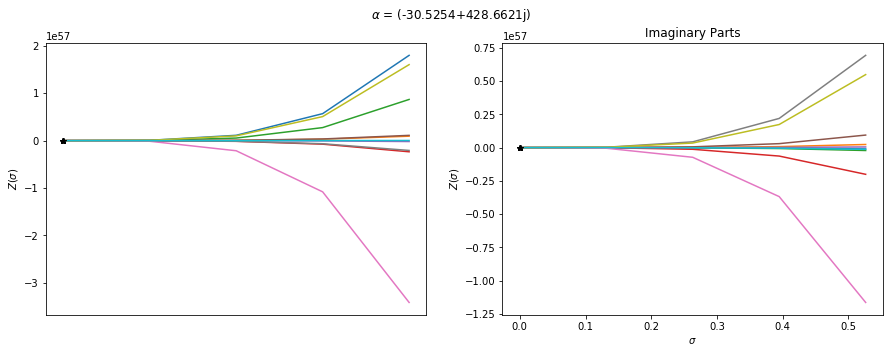

7.27410509568e-13
(-321.091155737+297.906592001j)


### $\lambda$ = (280.9335-280.9335j)

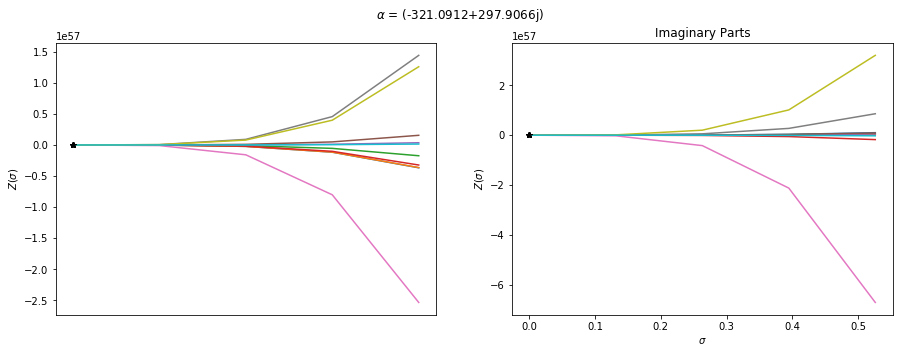

1.30208991111e-13
(-440.839991877+0j)


### $\lambda$ = (397.3+0j)

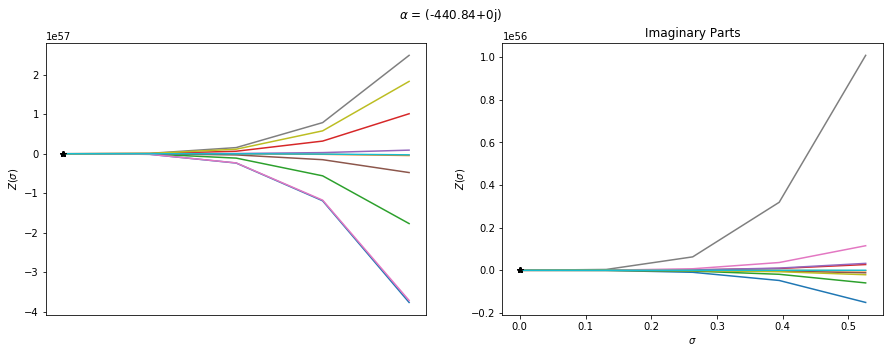

7.27410509568e-13
(-321.091155737-297.906592001j)


### $\lambda$ = (280.9335+280.9335j)

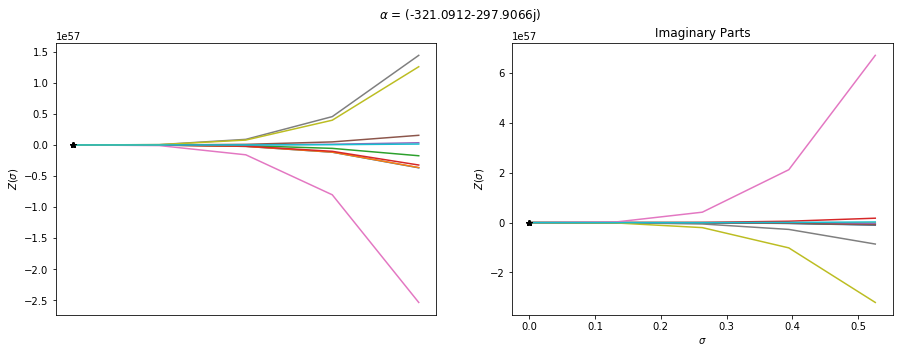

4.11278706835e-13
(-30.5254471353-428.662081268j)


### $\lambda$ = 397.3j

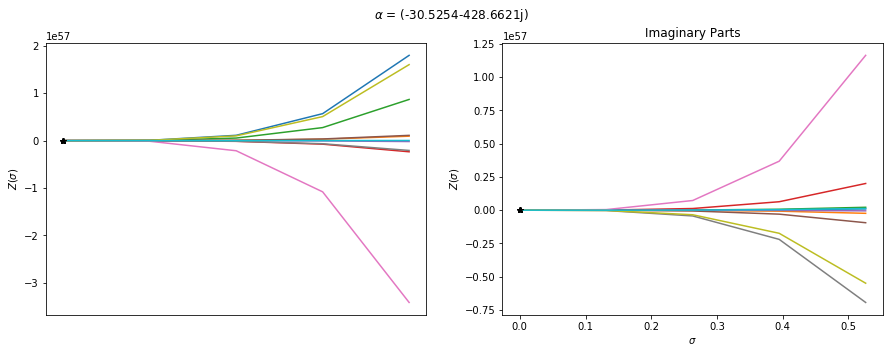

# $\Lambda$ = 148.7

4.6885782925e-13
(-14.1572151701+163.013022739j)


### $\lambda$ = -148.7j

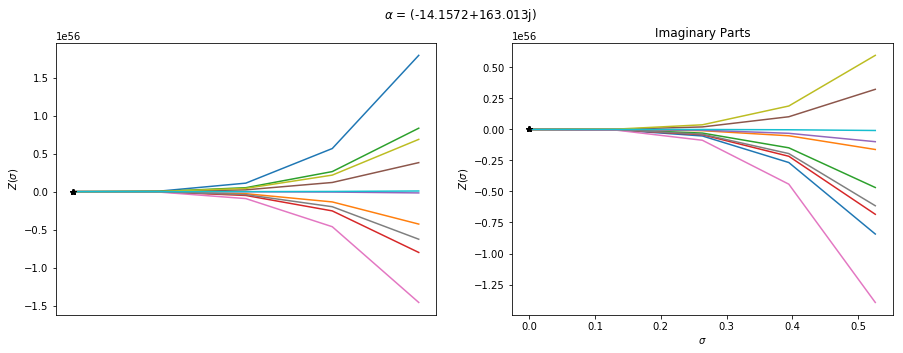

3.36444381048e-13
(-123.700459136+112.892962048j)


### $\lambda$ = (105.1468-105.1468j)

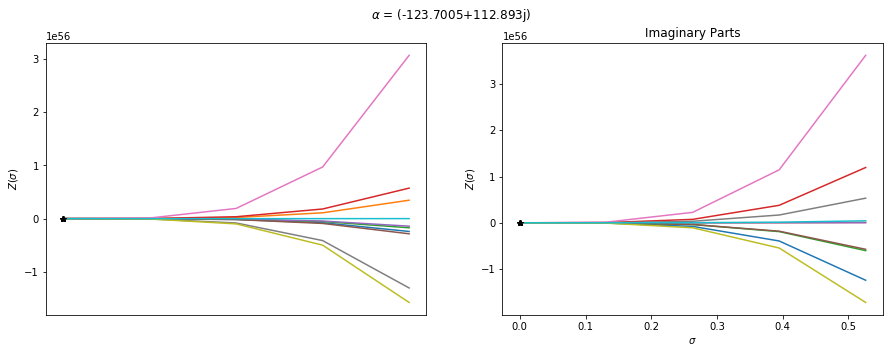

3.36239927789e-14
(-168.797502012+0j)


### $\lambda$ = (148.7+0j)

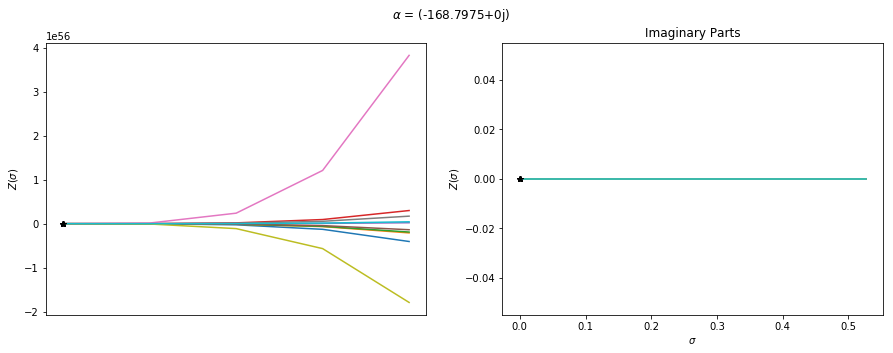

3.36444381048e-13
(-123.700459136-112.892962048j)


### $\lambda$ = (105.1468+105.1468j)

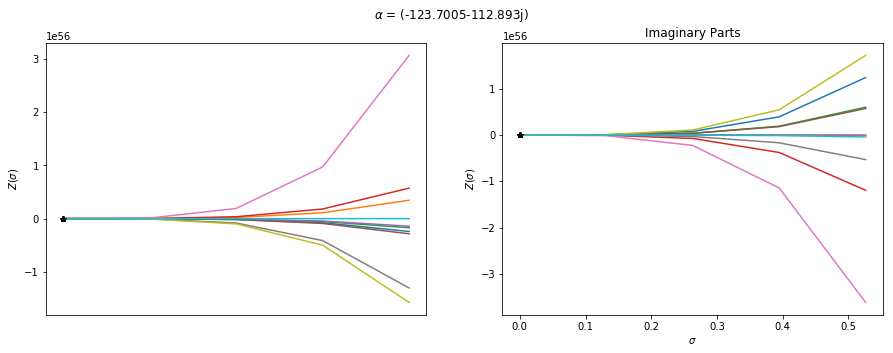

4.6885782925e-13
(-14.1572151701-163.013022739j)


### $\lambda$ = 148.7j

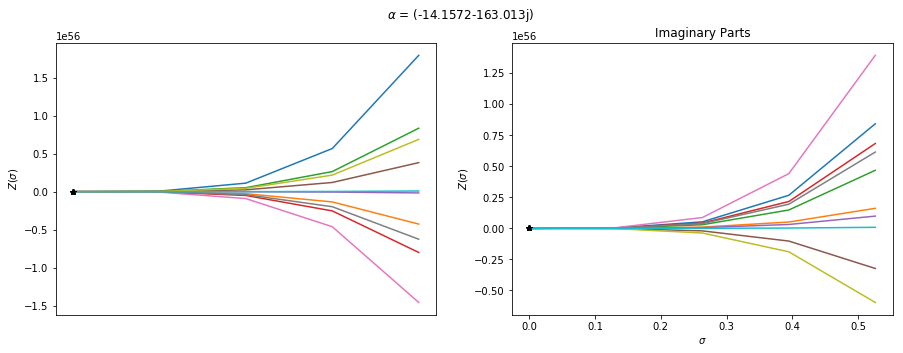

# $\Lambda$ = 80.8

3.83688213946e-14
(-8.80676825805+89.5441708572j)


### $\lambda$ = -80.8j

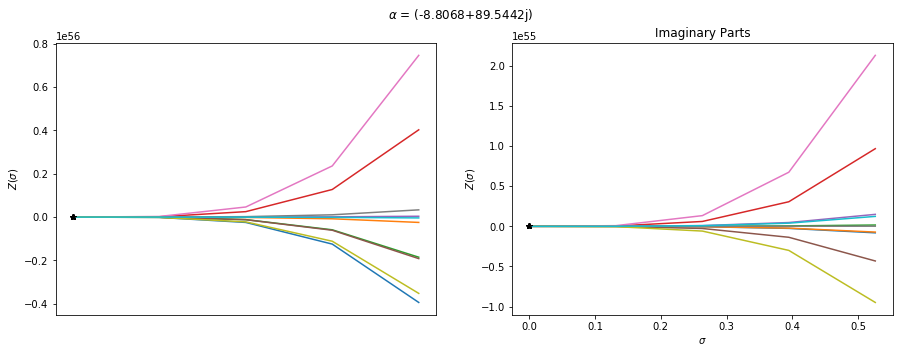

8.1921446964e-14
(-68.624659006+61.8665488502j)


### $\lambda$ = (57.1342-57.1342j)

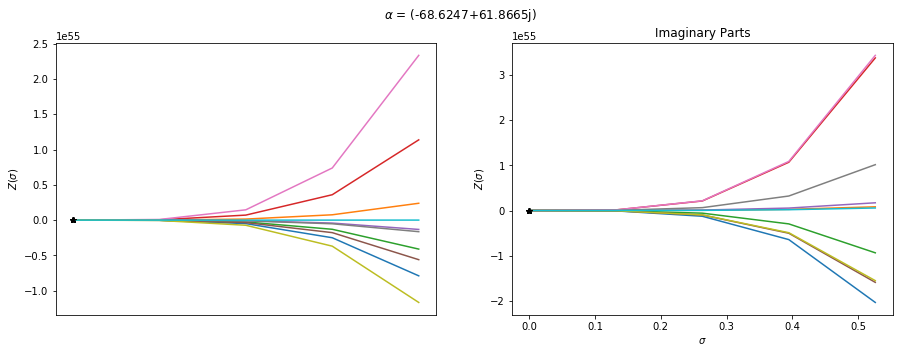

6.36723755556e-14
(-93.2328052971+1.10962684395e-16j)


### $\lambda$ = (80.8+0j)

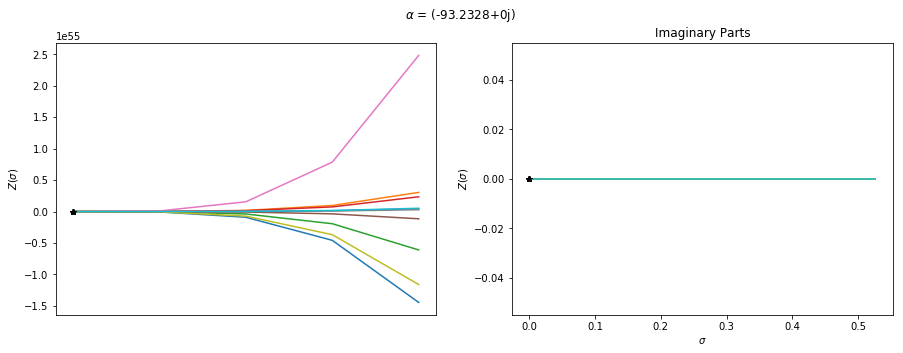

8.1921446964e-14
(-68.624659006-61.8665488502j)


### $\lambda$ = (57.1342+57.1342j)

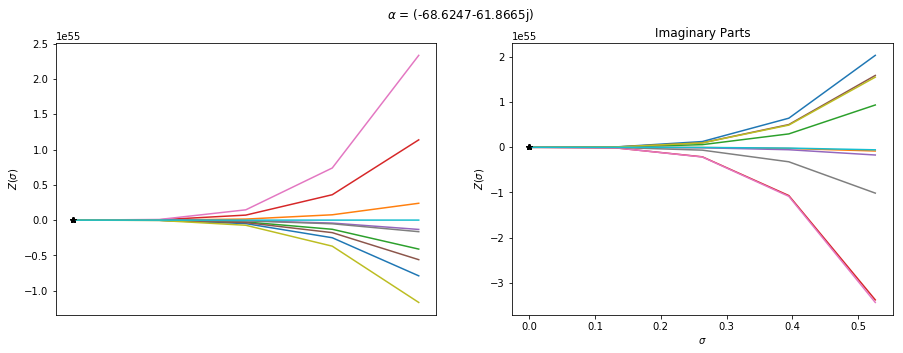

3.83688213946e-14
(-8.80676825805-89.5441708572j)


### $\lambda$ = 80.8j

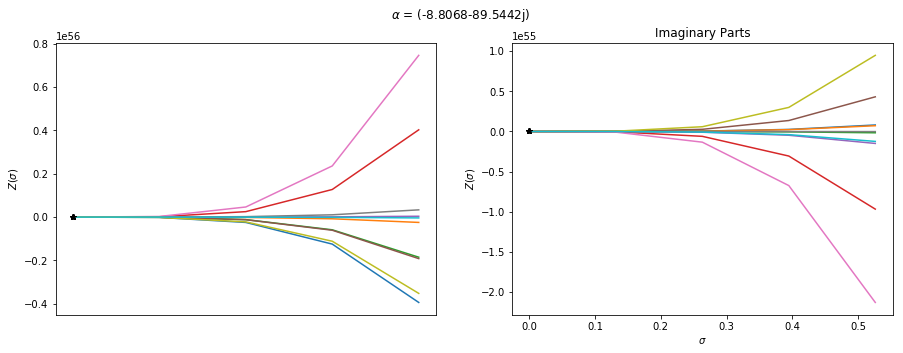

# $\Lambda$ = 91.8

6.37986717489e-14
(-8.12875244049+99.7621964722j)


### $\lambda$ = -91.8j

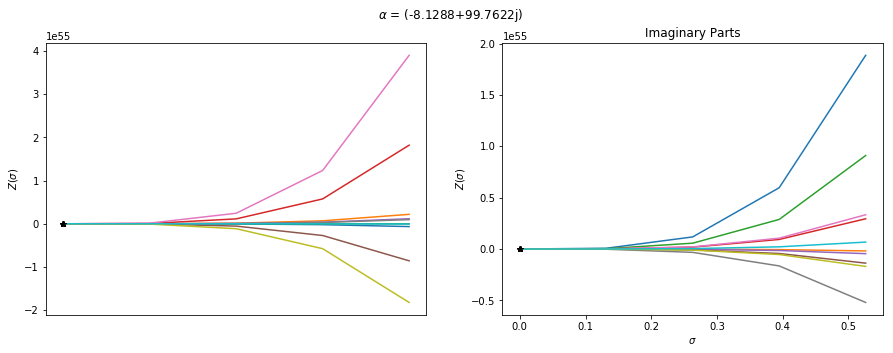

1.0304550535e-13
(-75.4807328058+69.2214954236j)


### $\lambda$ = (64.9124-64.9124j)

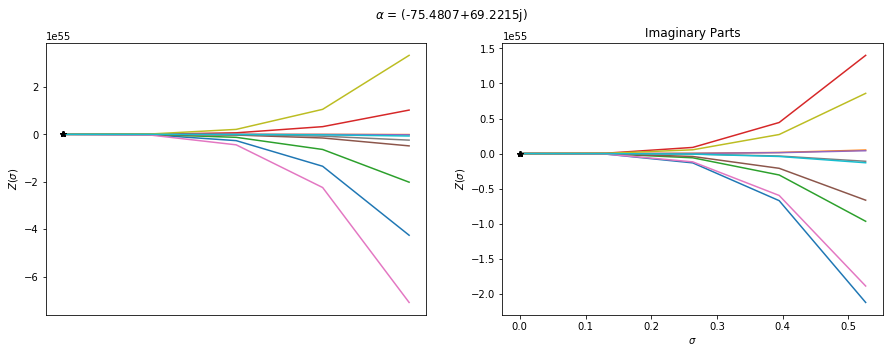

1.14219636725e-13
(-103.225003096+0j)


### $\lambda$ = (91.8+0j)

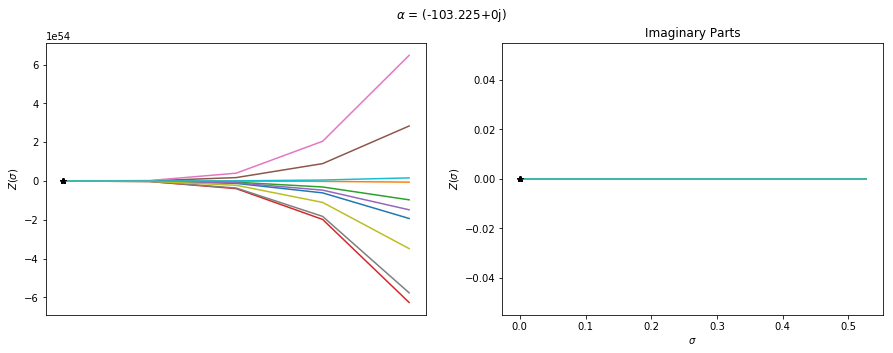

1.0304550535e-13
(-75.4807328058-69.2214954236j)


### $\lambda$ = (64.9124+64.9124j)

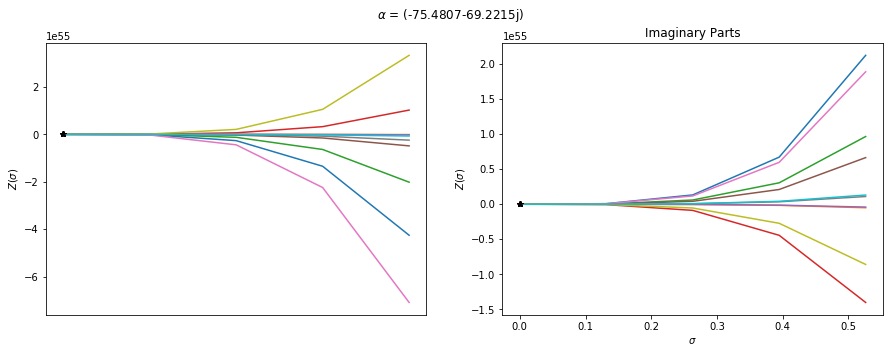

6.37986717489e-14
(-8.12875244049-99.7621964722j)


### $\lambda$ = 91.8j

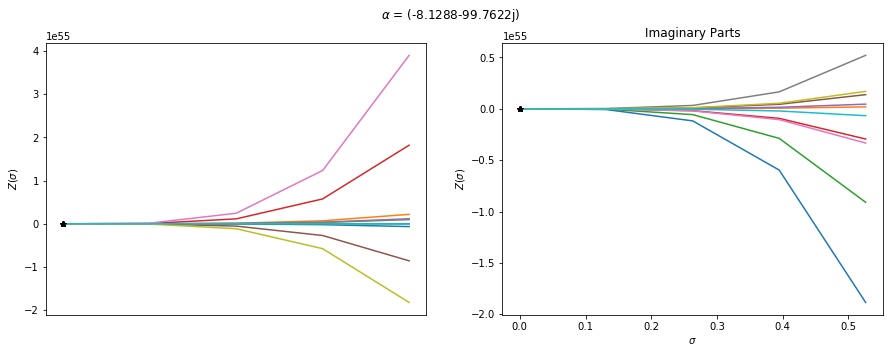

# $\Lambda$ = 128.6

1.79383088461e-13
(-8.22334247563+136.59266628j)


### $\lambda$ = -128.6j

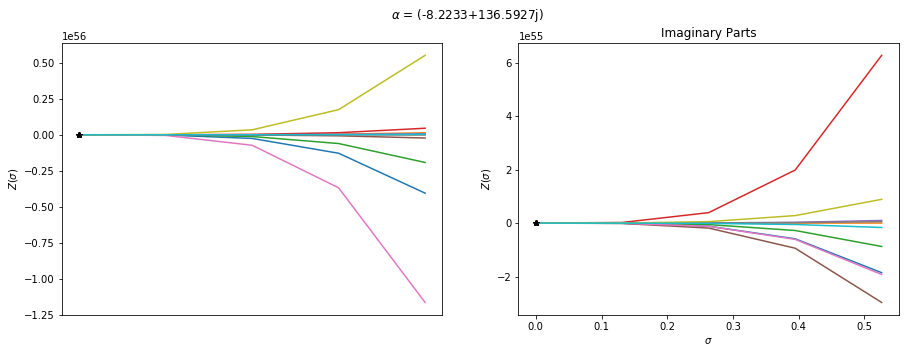

1.77930073468e-13
(-101.604076718+95.2595121975j)


### $\lambda$ = (90.9339-90.9339j)

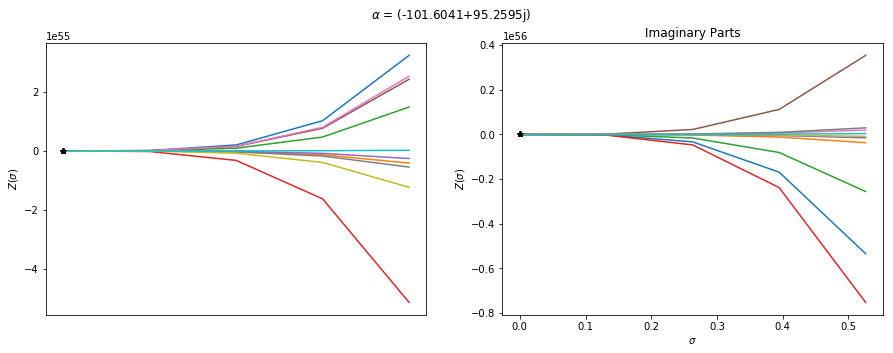

5.14852966247e-13
(-140.12935529+0j)


### $\lambda$ = (128.6+0j)

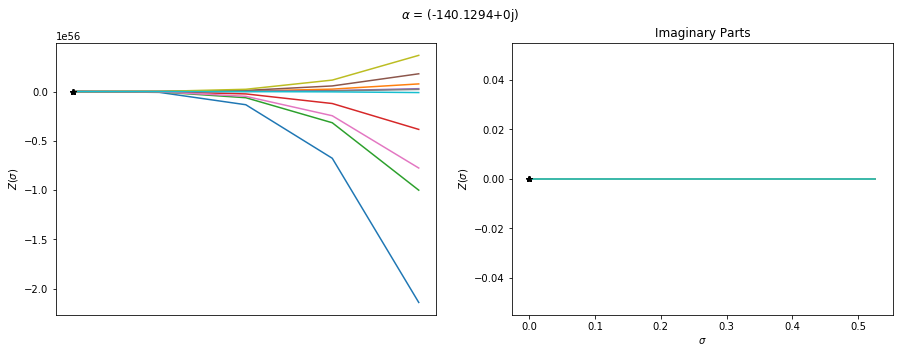

1.77930073468e-13
(-101.604076718-95.2595121975j)


### $\lambda$ = (90.9339+90.9339j)

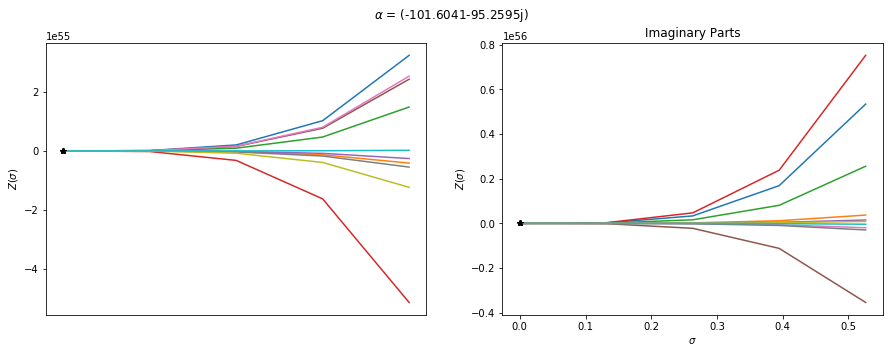

1.79383088461e-13
(-8.22334247563-136.59266628j)


### $\lambda$ = 128.6j

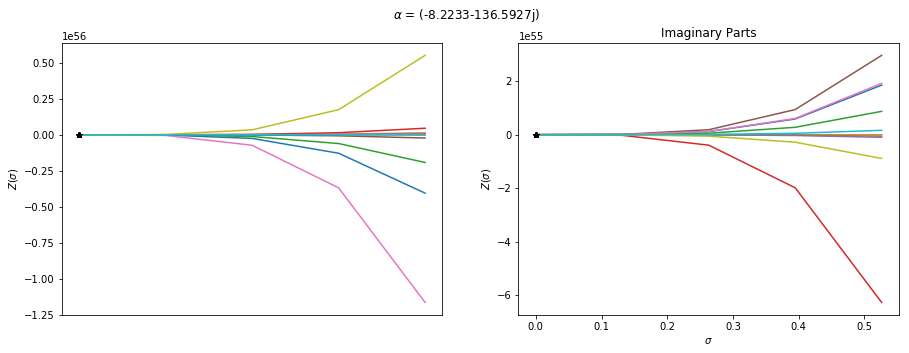

# $\Lambda$ = 450.3

5.56857455721e-13
(-33.3654132271+484.604916604j)


### $\lambda$ = -450.3j

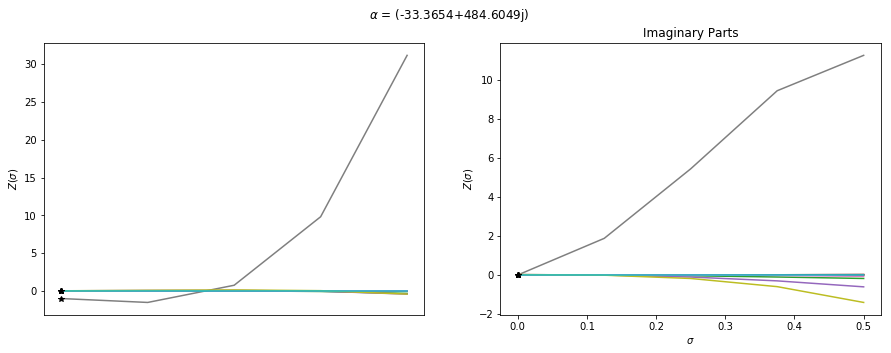

1.1546792104e-12
(-362.310684283+336.975900648j)


### $\lambda$ = (318.4102-318.4102j)

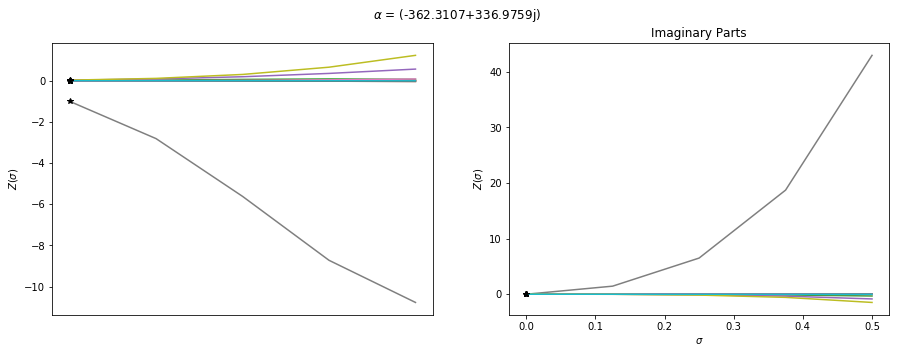

4.59293134896e-13
(-497.899919063+0j)


### $\lambda$ = (450.3+0j)

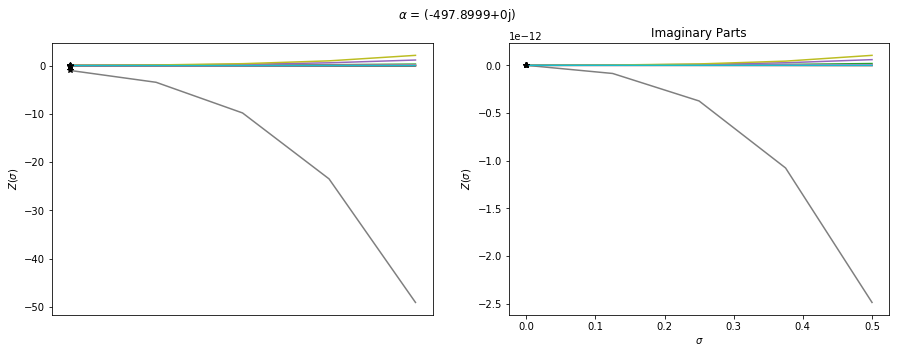

1.1546792104e-12
(-362.310684283-336.975900648j)


### $\lambda$ = (318.4102+318.4102j)

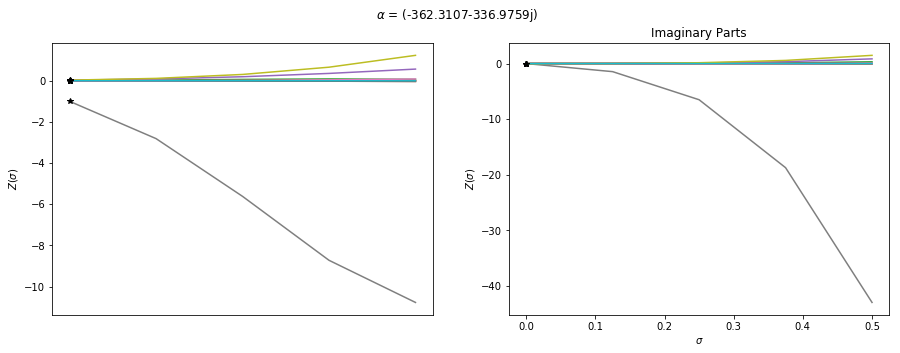

5.56857455721e-13
(-33.3654132271-484.604916604j)


### $\lambda$ = 450.3j

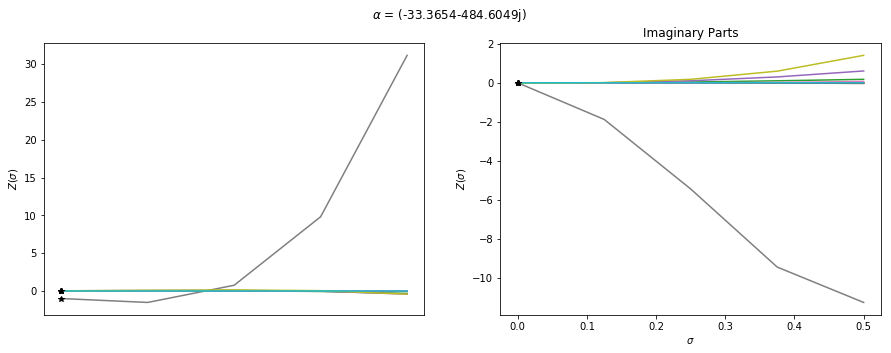

# $\Lambda$ = 167.5

9.71110874325e-14
(-15.3882239183+183.107054087j)


### $\lambda$ = -167.5j

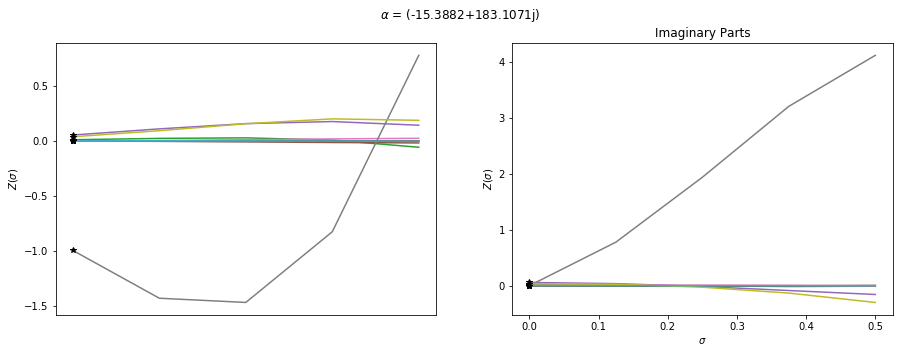

3.71124686353e-13
(-138.622626016+126.886894532j)


### $\lambda$ = (118.4404-118.4404j)

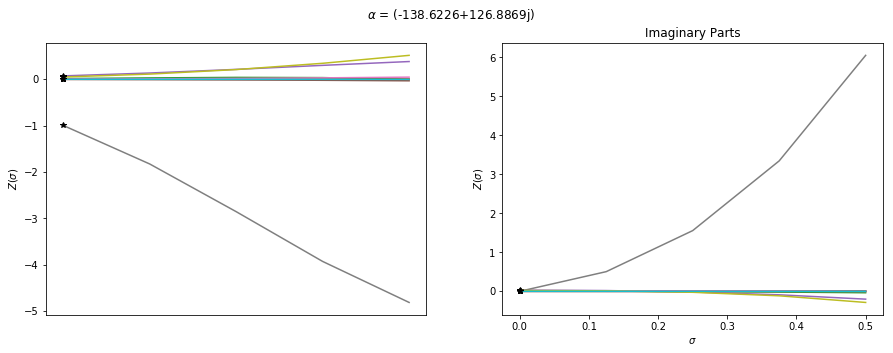

2.64122396021e-13
(-189.365662325+0j)


### $\lambda$ = (167.5+0j)

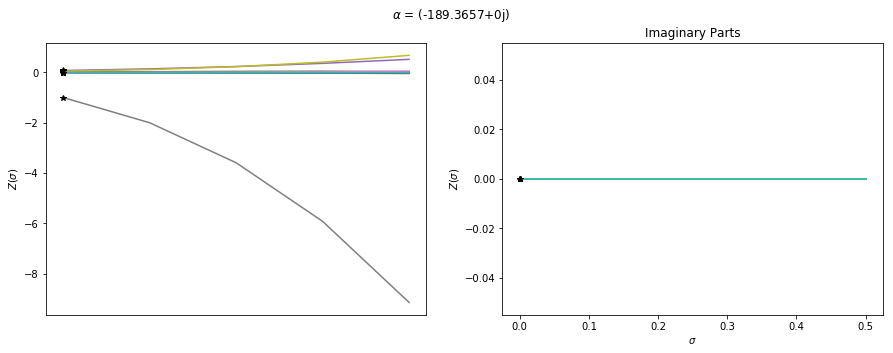

3.71124686353e-13
(-138.622626016-126.886894532j)


### $\lambda$ = (118.4404+118.4404j)

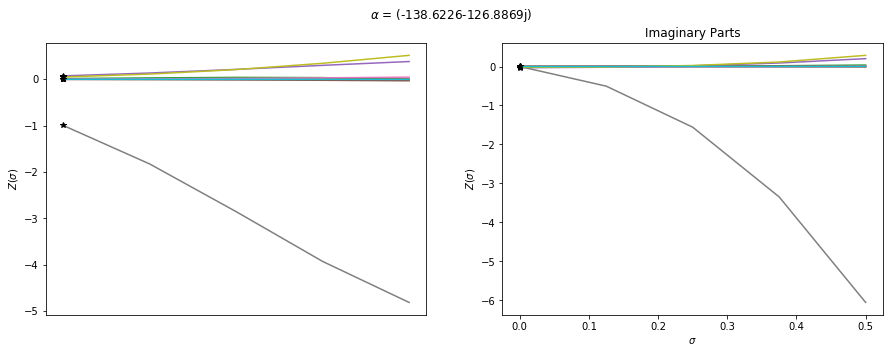

9.71110874325e-14
(-15.3882239183-183.107054087j)


### $\lambda$ = 167.5j

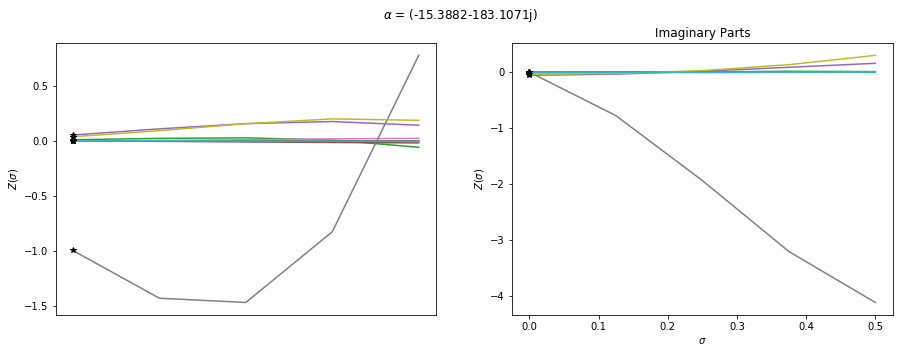

# $\Lambda$ = 88.7

4.87304136337e-14
(-9.42472655714+98.1114616973j)


### $\lambda$ = -88.7j

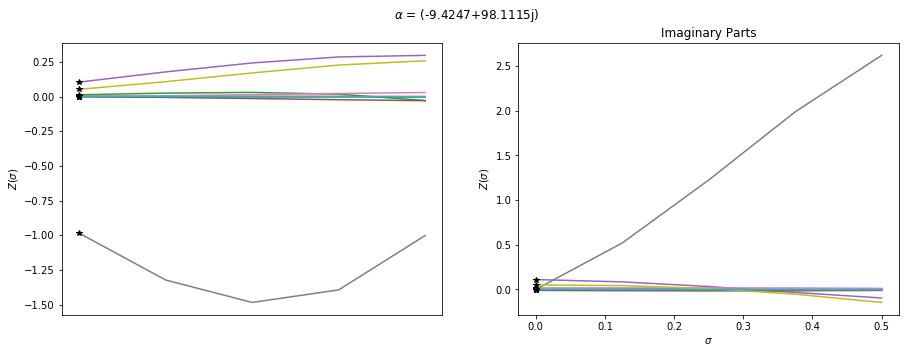

1.74673617518e-13
(-75.0343242919+67.8138336066j)


### $\lambda$ = (62.7204-62.7204j)

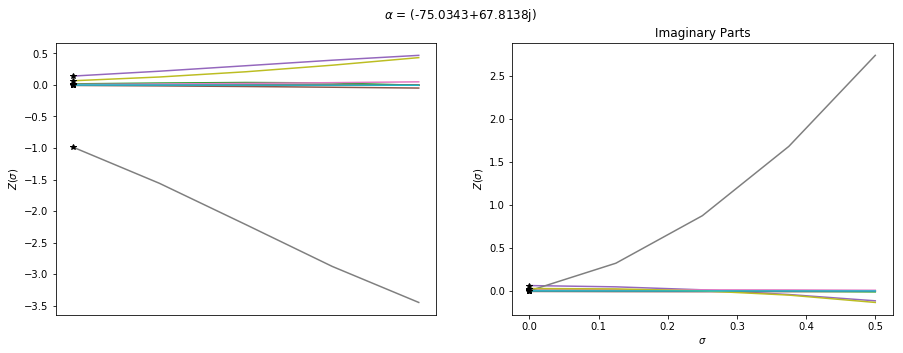

7.21286458124e-14
(-102.028508742+0j)


### $\lambda$ = (88.7+0j)

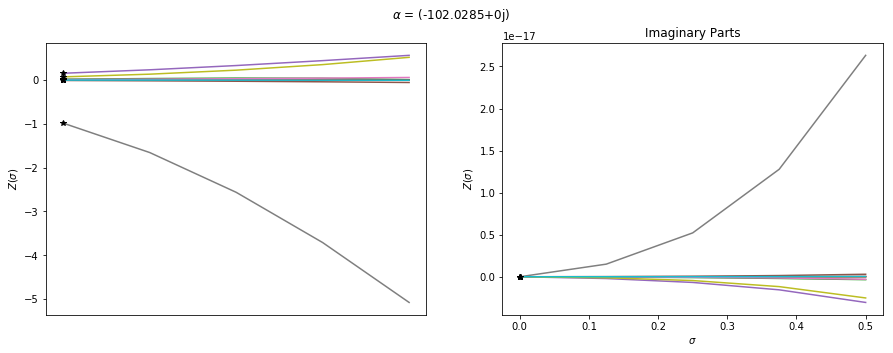

1.74673617518e-13
(-75.0343242919-67.8138336066j)


### $\lambda$ = (62.7204+62.7204j)

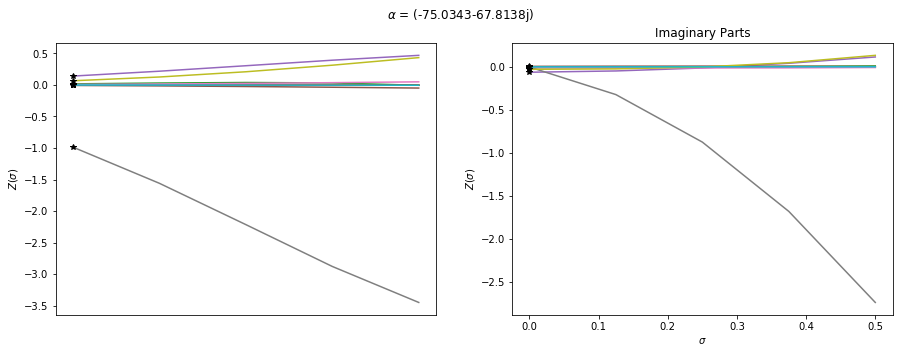

4.87304136337e-14
(-9.42472655714-98.1114616973j)


### $\lambda$ = 88.7j

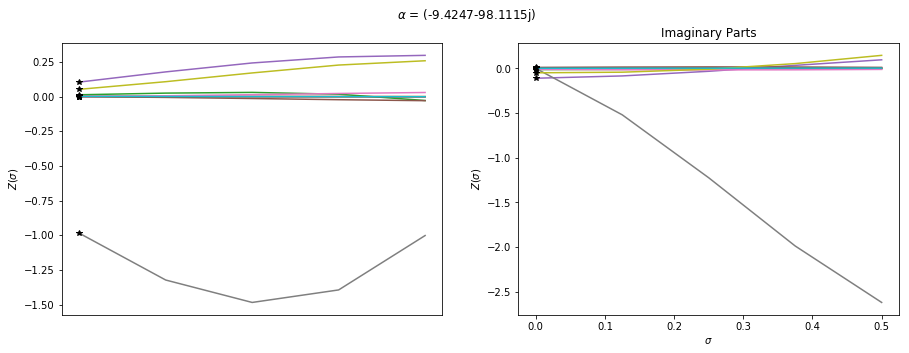

# $\Lambda$ = 96.7

1.68861790581e-13
(-8.51753722293+105.094464717j)


### $\lambda$ = -96.7j

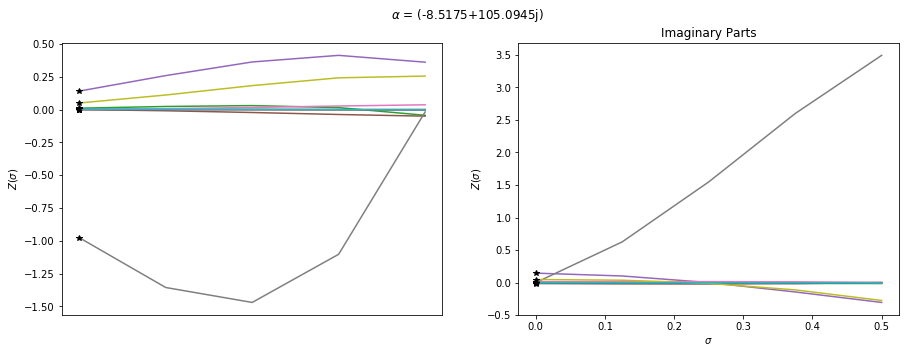

6.33135964405e-14
(-79.4676319716+72.9202659045j)


### $\lambda$ = (68.3772-68.3772j)

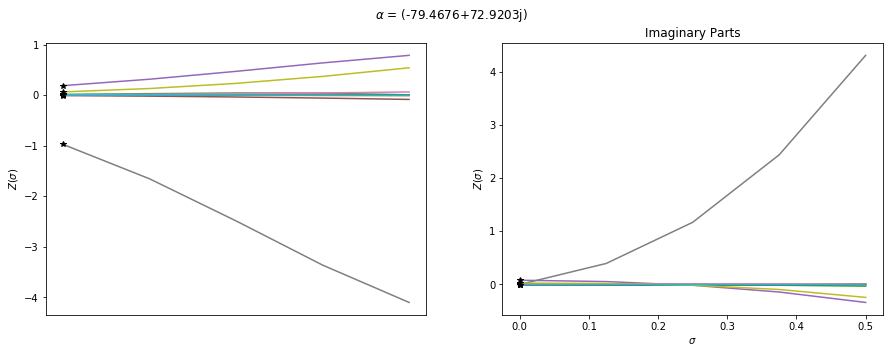

5.29801613748e-14
(-108.693882522+0j)


### $\lambda$ = (96.7+0j)

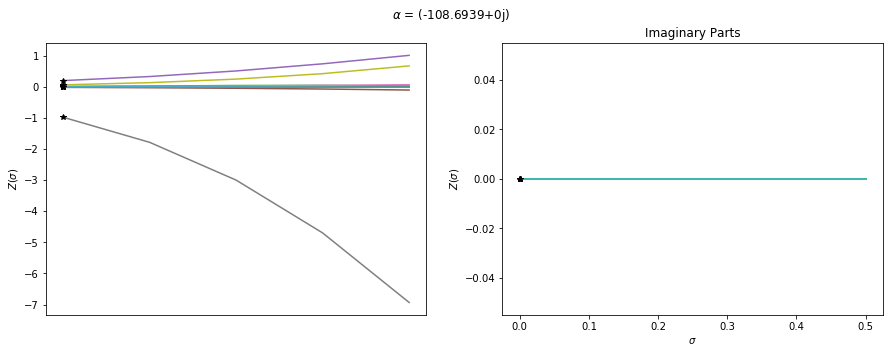

6.33135964405e-14
(-79.4676319716-72.9202659045j)


### $\lambda$ = (68.3772+68.3772j)

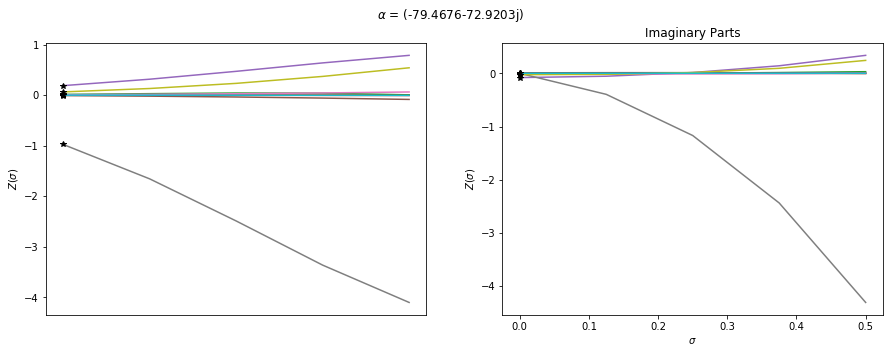

1.68861790581e-13
(-8.51753722293-105.094464717j)


### $\lambda$ = 96.7j

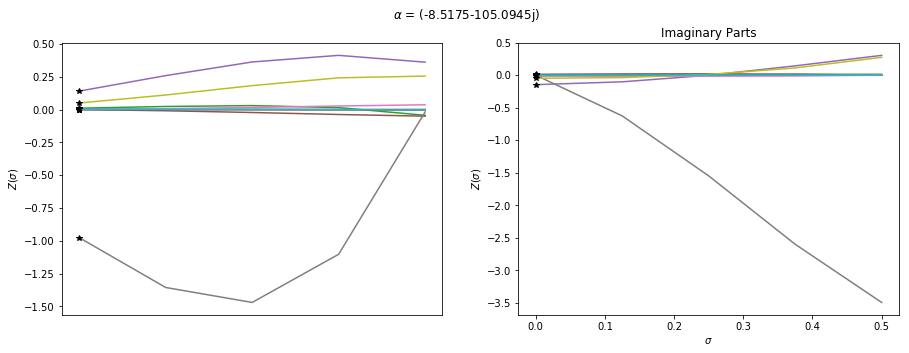

# $\Lambda$ = 124.7

7.58992531746e-14
(-8.27537991847+132.785479741j)


### $\lambda$ = -124.7j

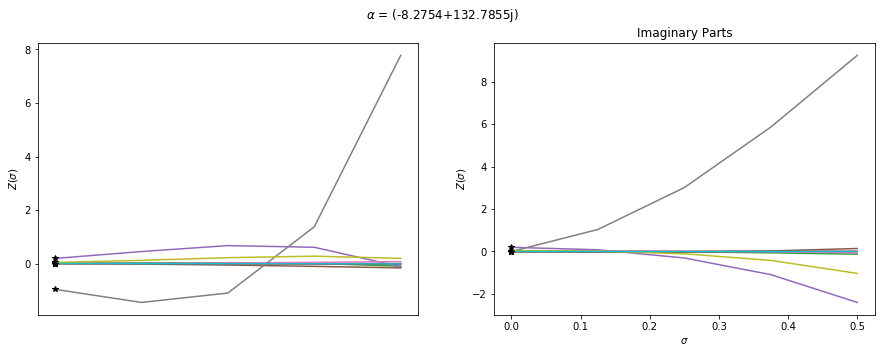

1.15462983064e-13
(-98.927255178+92.5520272955j)


### $\lambda$ = (88.1762-88.1762j)

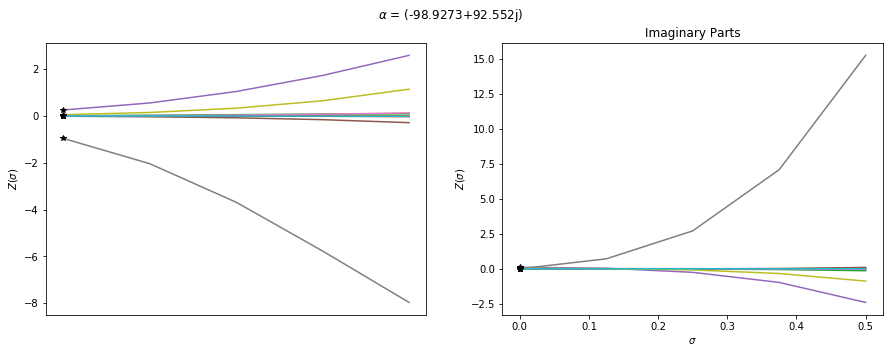

1.02544391317e-13
(-136.320383075+0j)


### $\lambda$ = (124.7+0j)

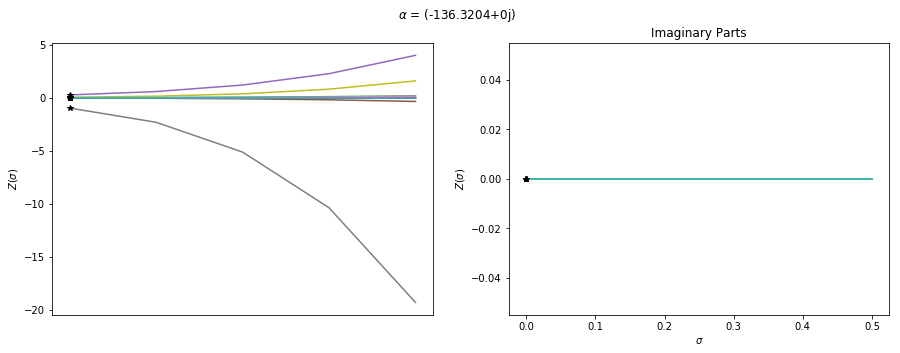

1.15462983064e-13
(-98.927255178-92.5520272955j)


### $\lambda$ = (88.1762+88.1762j)

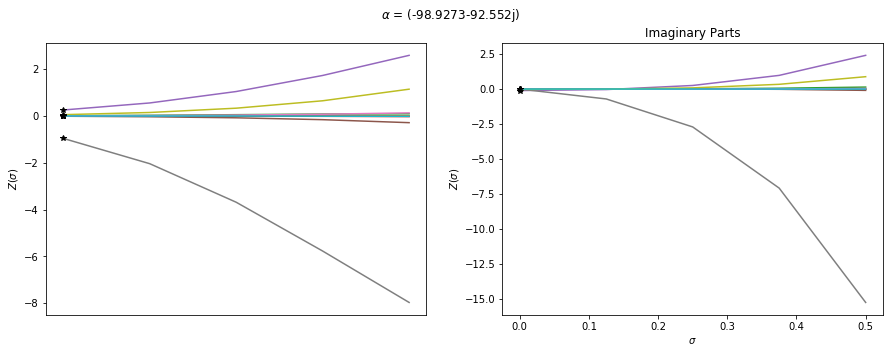

7.58992531746e-14
(-8.27537991847-132.785479741j)


### $\lambda$ = 124.7j

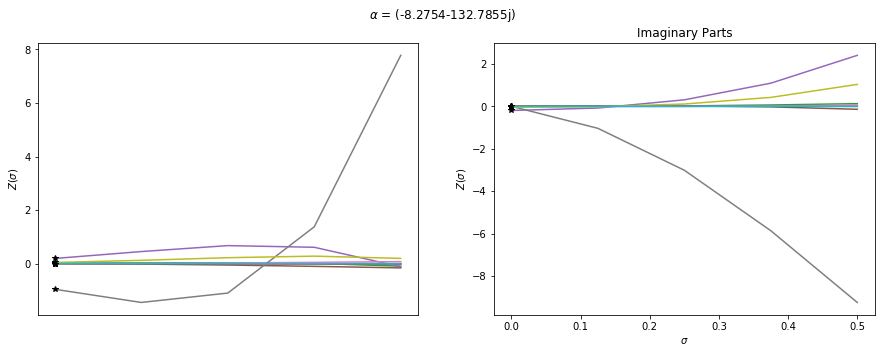

In [222]:
"""  0.2    0.5  1.0   2.0    5.0
0.2 398.6 388.8 385.3 733.8 1755.6
0.4 211.7 182.3 175.1 325.0 762.0
0.6 222.5 123.4 111.5 198.4 449.8
2/3 226.8 114.3 100.4 175.3 391.3
0.8 236.5 103.9 85.3 142.6 307.1
1.0 253.8 100.8 73.7 113.8 229.2
1.2 274.3 106.6 69.7 98.7 183.1
1.4 300.8 117.5 70.5 91.6 154.9
1.6 347.4 131.8 74.5 89.8 138.0
1.8 397.3 148.7 80.8 91.8 128.6
2.0 450.3 167.5 88.7 96.7 124.7"""

G_vals = [.2,.4,.6,2/3,.8,1,1.2,1.4,1.6,1.8,2]
nu_vals = [0.2, 0.5, 1.0, 2.0, 5.0]

vals = np.array([[398.6, 388.8, 385.3, 733.8, 1755.6],\
                 [211.7, 182.3, 175.1, 325.0, 762.0],\
                 [222.5, 123.4, 111.5, 198.4, 449.8],\
                 [226.8, 114.3, 100.4, 175.3, 391.3],\
                 [236.5, 103.9, 85.3, 142.6, 307.1],\
                 [253.8, 100.8, 73.7, 113.8, 229.2],\
                 [274.3, 106.6, 69.7, 98.7, 183.1],\
                 [300.8, 117.5, 70.5, 91.6, 154.9],\
                 [347.4, 131.8, 74.5, 89.8, 138.0],\
                 [397.3, 148.7, 80.8, 91.8, 128.6],\
                 [450.3, 167.5, 88.7, 96.7, 124.7]])

theta_vals = np.linspace(-np.pi/2,np.pi/2,5)

for i,G_val in enumerate(G_vals):
    for j,nu_val in enumerate(nu_vals):
        G = G_val
        vp = G/(G+2)
        sp = 0
        sm = 1-vp
        
        lam_bound = vals[i][j]
        display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
        for theta_val in theta_vals:
            lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

            A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val, G=G_val, nu=nu_val)
            df = e_vals + sigma*(e_min - e_vals)/sm
            
            to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
            display(Markdown('### $\lambda$ = {}'.format(to_disp)))
            
            sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
            sys_.createSys()

            sigs = np.linspace(sp,sm,5)
            W_ = np.zeros((10,len(sigs)), dtype=np.complex)
            for p,sig in enumerate(sigs):
                w_val = sys_.evalW(sig)
                W_[:,p] = w_val

            rp = round(e_vals.real,4)
            ip = round(e_vals.imag,4)
            eval = rp+ip*1j

            plt.subplot(121)
            for p in range(len(W_[:,0])):
                plt.plot(sigs[:], -W_[p][:].real,label=p+1)
                plt.plot(0,-e_vecs[p].real,'*k')

            plt.suptitle('Real Parts')
            plt.ylabel(r'$Z(\sigma)$')
            plt.xticks([], [])

            plt.subplot(122)
            for p in range(len(W_[:,0])):
                plt.plot(sigs[:], -W_[p][:].imag,label=p+1)
                plt.plot(0,-e_vecs[p].imag,'*k')
            plt.xlabel(r'$\sigma$')
            plt.ylabel(r'$Z(\sigma)$')
            plt.title('Imaginary Parts')

            plt.suptitle(r'$\alpha$ = {}'.format(eval))
            plt.show()

# $\Lambda$ = 10

3.22079972615e-14
(-4.74131762698+15.9006086404j)


### $\lambda$ = -10j

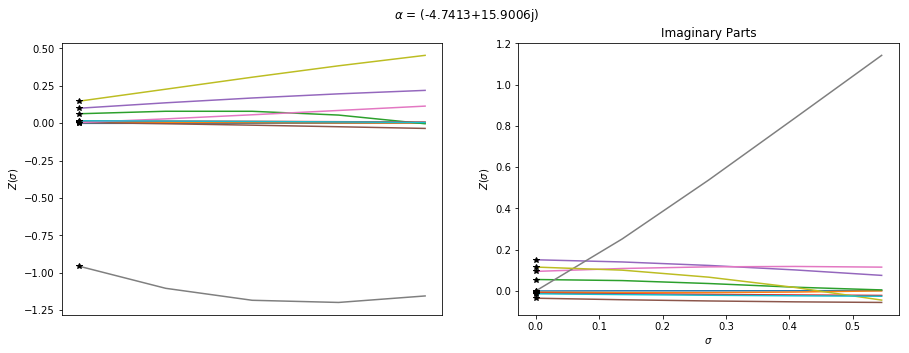

2.10683457376e-14
(-5.57299420999+15.6947687596j)


### $\lambda$ = (0.6279-9.9803j)

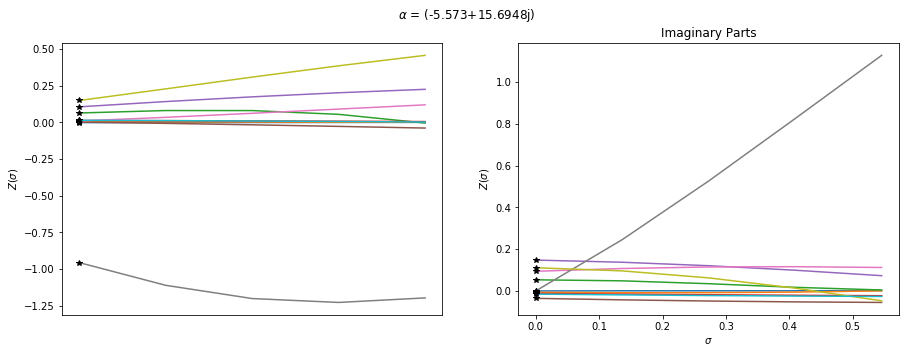

1.46612034451e-14
(-6.39533425582+15.4436899347j)


### $\lambda$ = (1.2533-9.9211j)

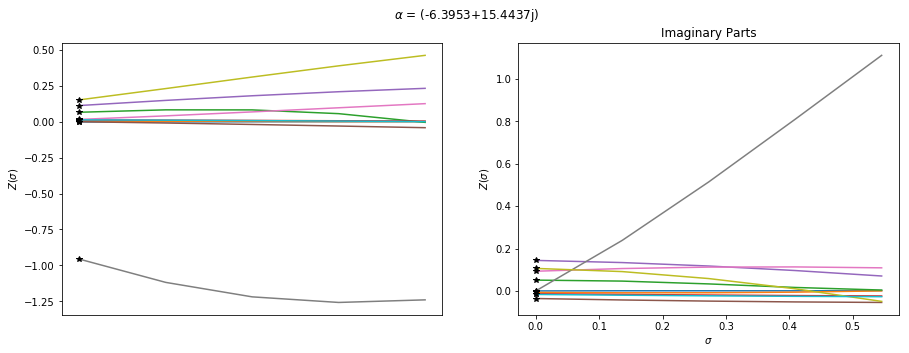

1.62647305154e-14
(-7.20569259593+15.1477951841j)


### $\lambda$ = (1.8738-9.8229j)

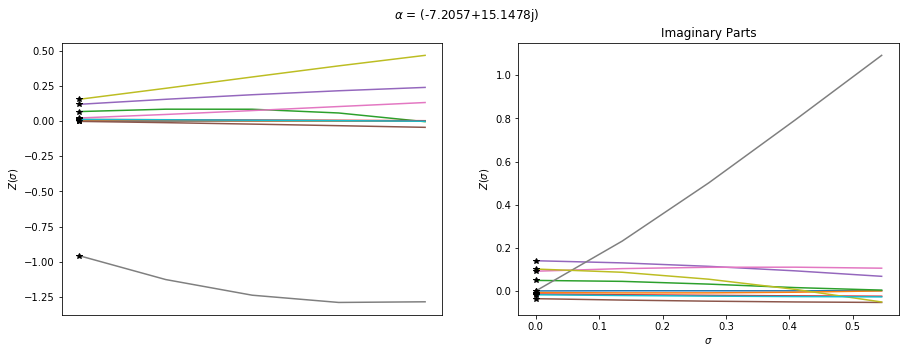

5.91735015585e-14
(-8.00145004897+14.8076688705j)


### $\lambda$ = (2.4869-9.6858j)

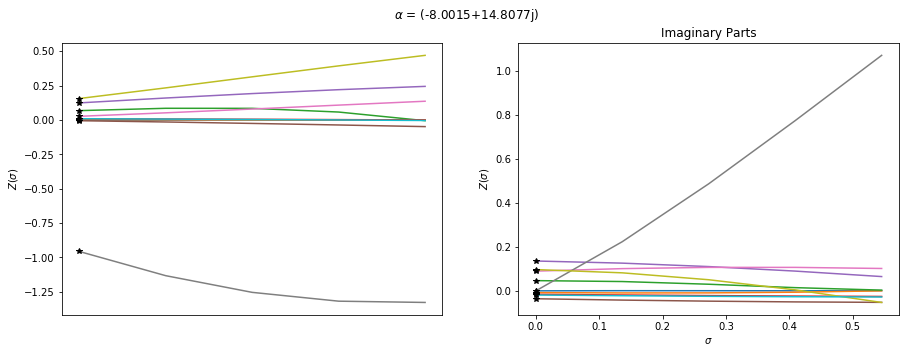

1.51952815721e-14
(-8.78002319317+14.4240548989j)


### $\lambda$ = (3.0902-9.5106j)

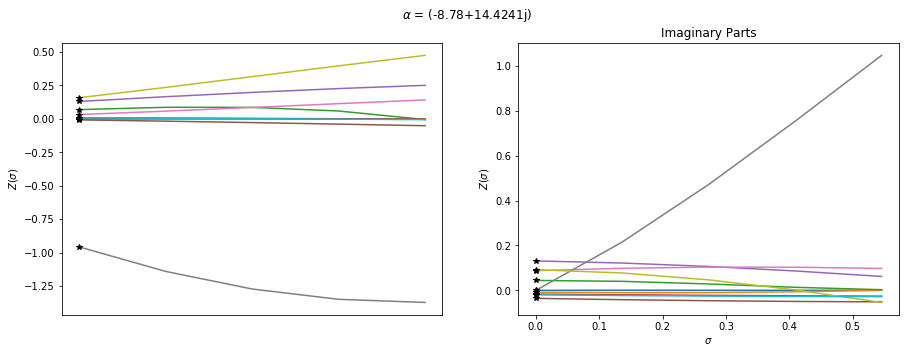

1.73622998644e-14
(-9.53887402542+13.9978543047j)


### $\lambda$ = (3.6812-9.2978j)

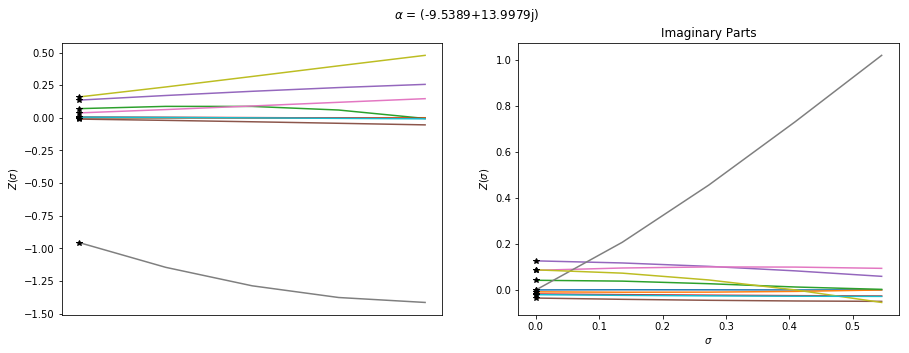

1.06060883021e-14
(-10.2755194686+13.5301222422j)


### $\lambda$ = (4.2578-9.0483j)

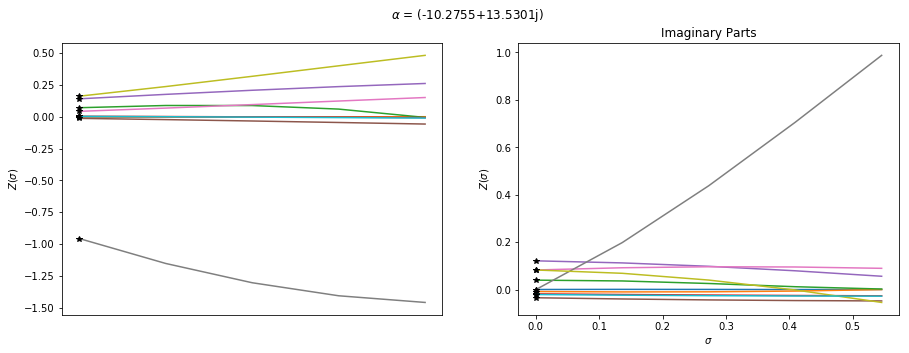

4.60786488867e-14
(-10.9875406892+13.0220643846j)


### $\lambda$ = (4.8175-8.7631j)

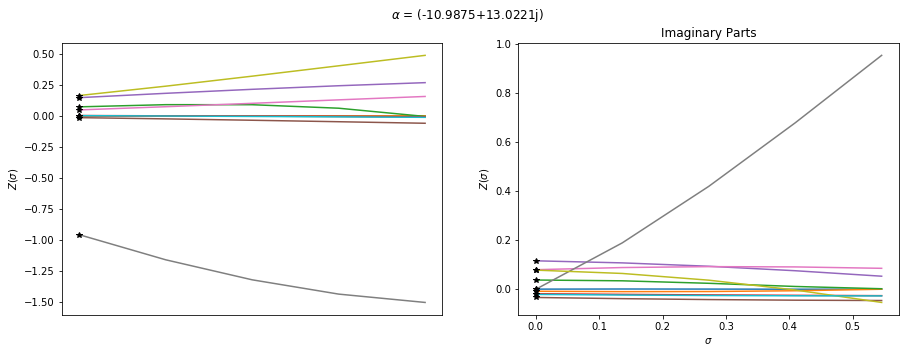

2.4674973198e-14
(-11.6725921878+12.475032749j)


### $\lambda$ = (5.3583-8.4433j)

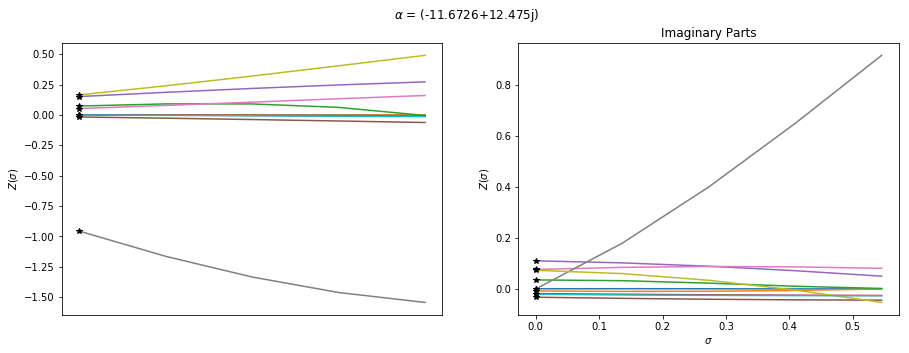

2.25893441199e-14
(-12.3284106265+11.8905209625j)


### $\lambda$ = (5.8779-8.0902j)

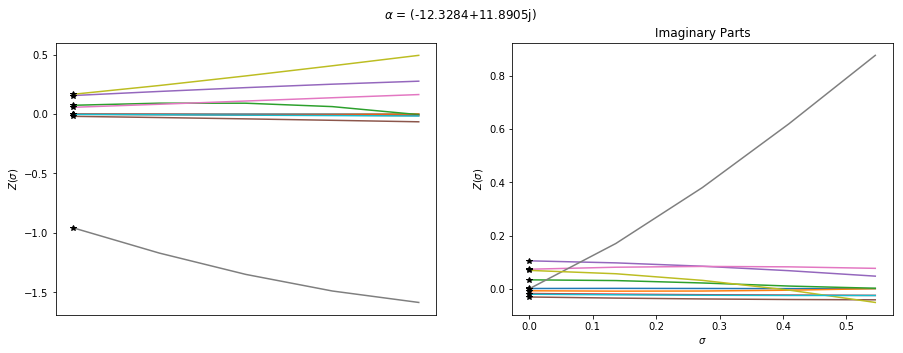

2.10085333826e-14
(-12.9528233582+11.2701589882j)


### $\lambda$ = (6.3742-7.7051j)

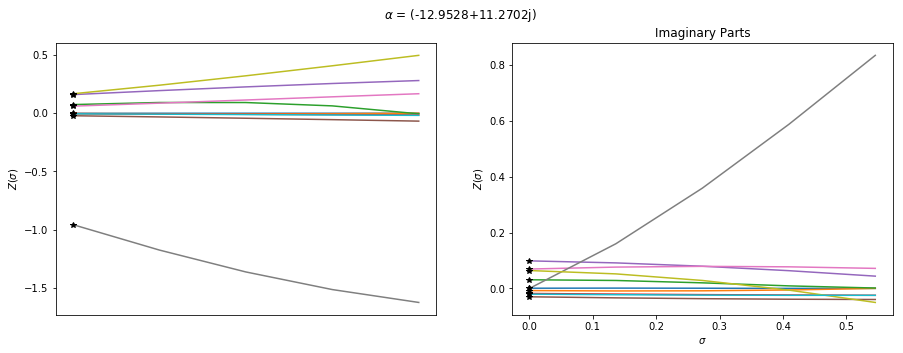

2.91416463149e-14
(-13.543756623+10.615707329j)


### $\lambda$ = (6.8455-7.2897j)

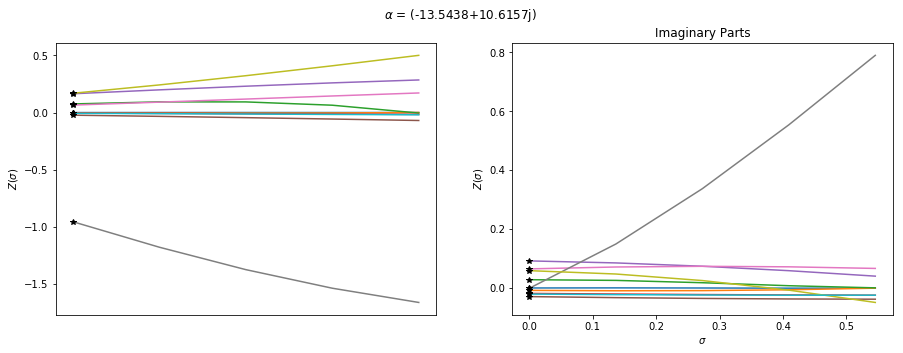

3.02672108771e-14
(-14.0992433799+9.92905073394j)


### $\lambda$ = (7.2897-6.8455j)

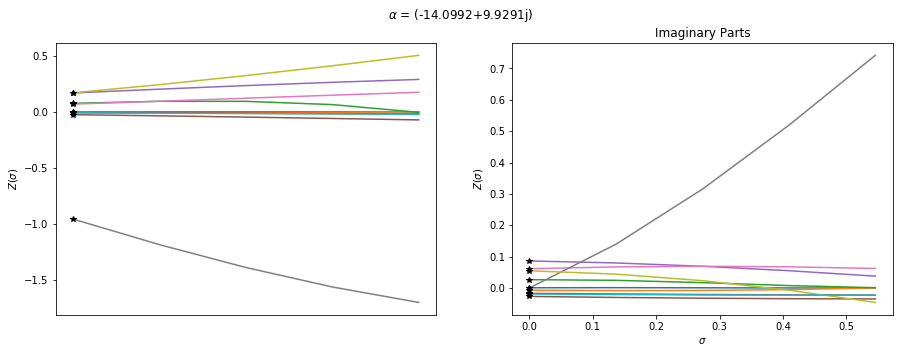

2.61272921778e-14
(-14.6174307425+9.21219142848j)


### $\lambda$ = (7.7051-6.3742j)

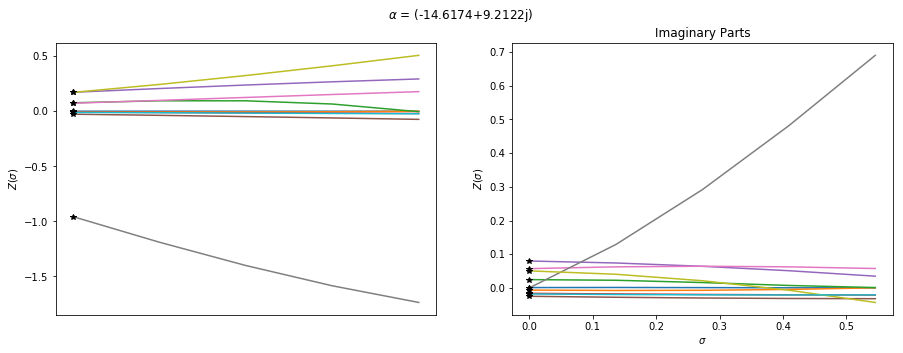

4.85009767831e-14
(-15.0965869885+8.46724189659j)


### $\lambda$ = (8.0902-5.8779j)

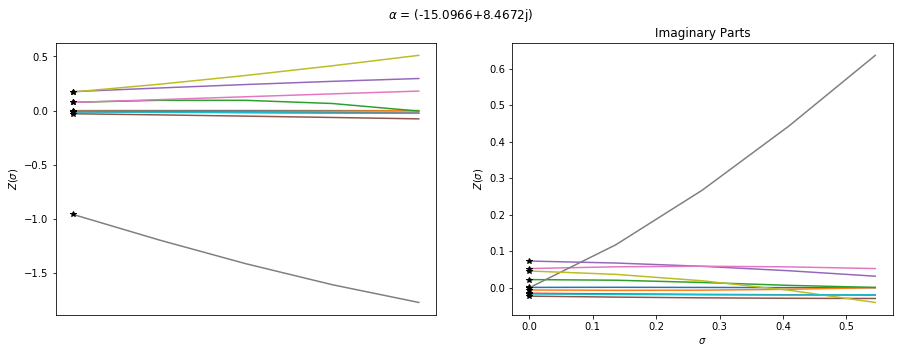

2.75236492812e-14
(-15.5351081165+7.69641724039j)


### $\lambda$ = (8.4433-5.3583j)

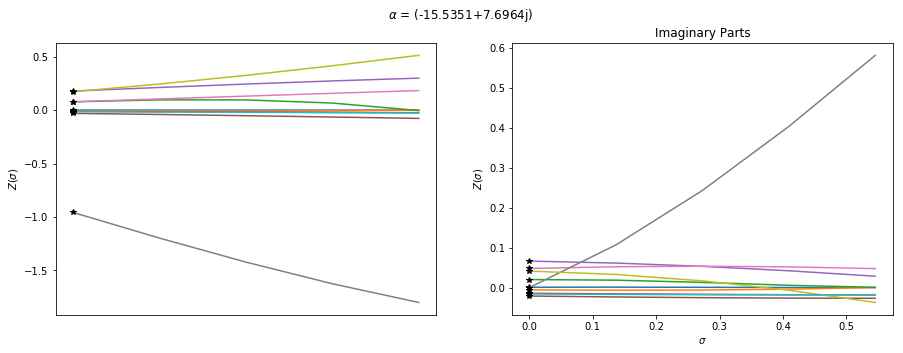

1.51893002712e-14
(-15.9315239218+6.90202714764j)


### $\lambda$ = (8.7631-4.8175j)

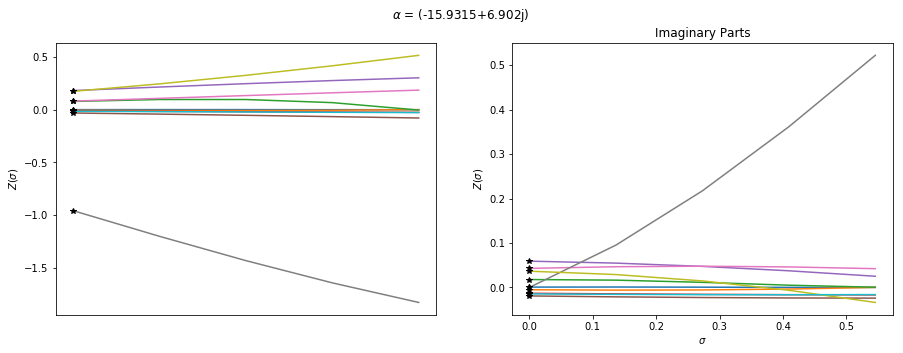

2.97345724137e-14
(-16.2845035703+6.08646749703j)


### $\lambda$ = (9.0483-4.2578j)

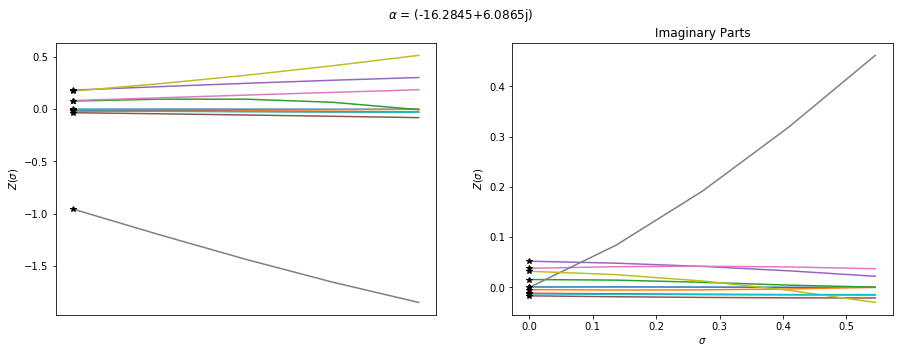

8.29791268183e-14
(-16.5928606453+5.25221163369j)


### $\lambda$ = (9.2978-3.6812j)

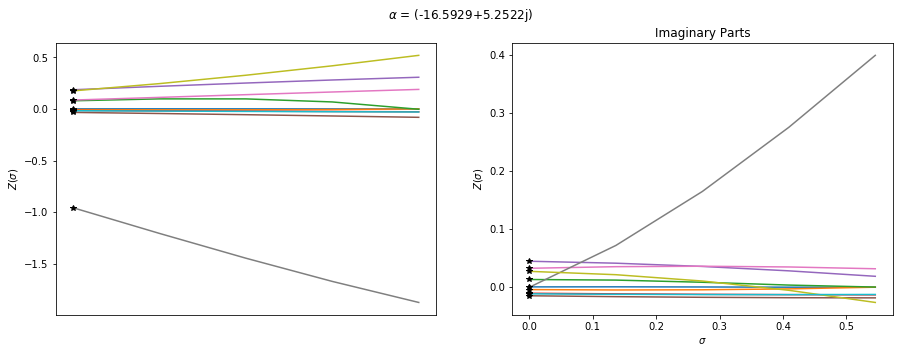

5.07494085877e-14
(-16.8555576491+4.40180134798j)


### $\lambda$ = (9.5106-3.0902j)

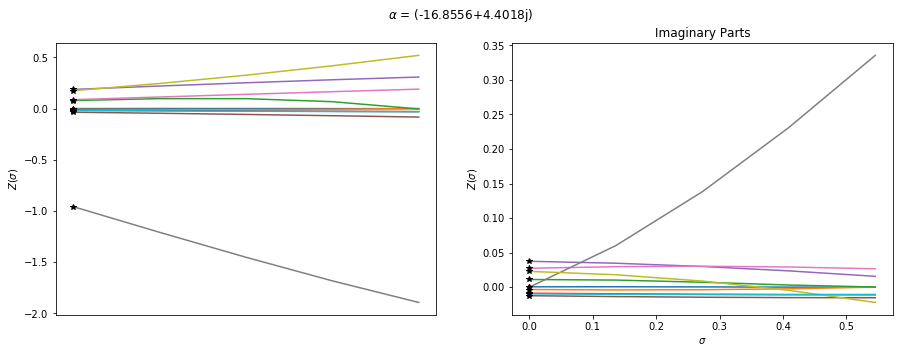

7.02469295828e-14
(-17.0717099411+3.53783759223j)


### $\lambda$ = (9.6858-2.4869j)

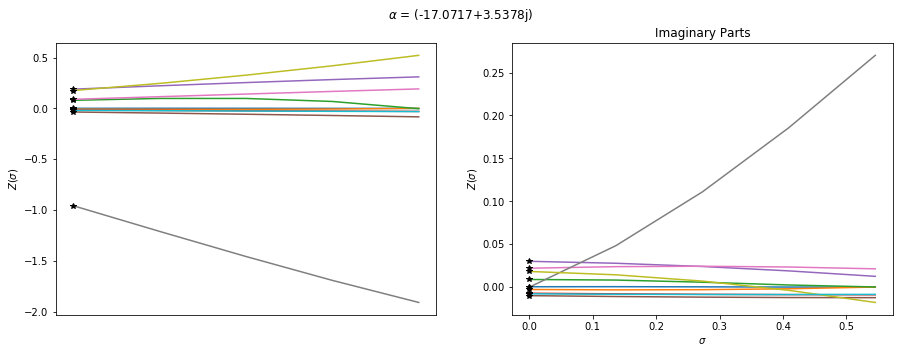

3.46828724538e-14
(-17.2405890964+2.66297097081j)


### $\lambda$ = (9.8229-1.8738j)

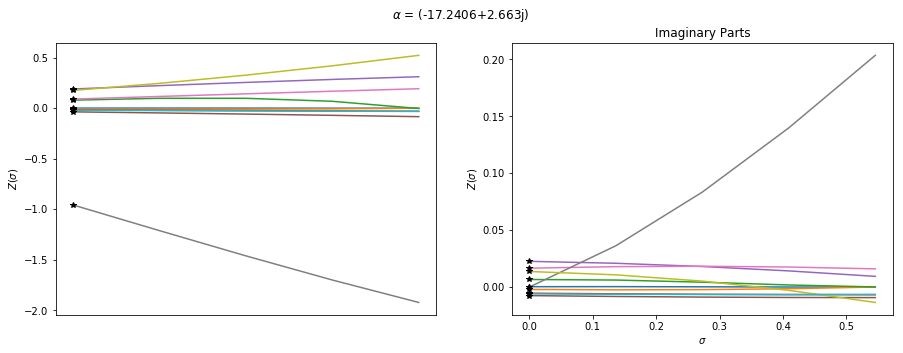

1.1809156668e-14
(-17.3616256727+1.77989203998j)


### $\lambda$ = (9.9211-1.2533j)

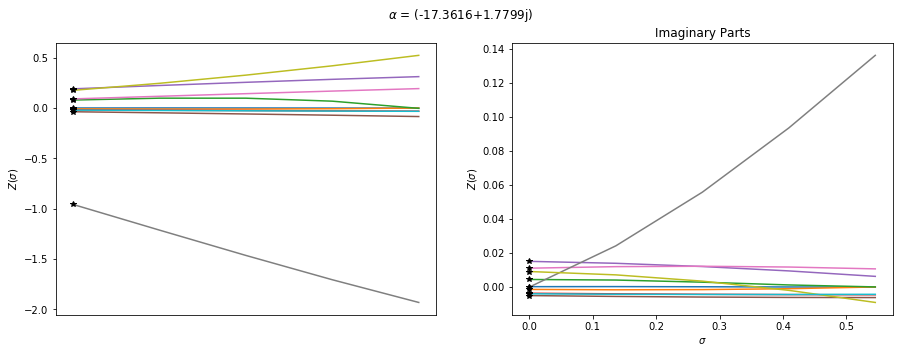

1.65841471626e-14
(-17.4344113728+0.891321454699j)


### $\lambda$ = (9.9803-0.6279j)

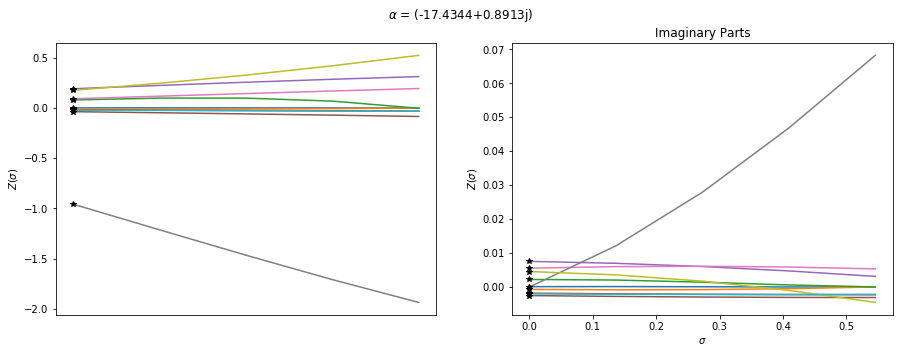

4.11263084604e-14
(-17.4587005964-3.15150656727e-15j)


### $\lambda$ = (10+0j)

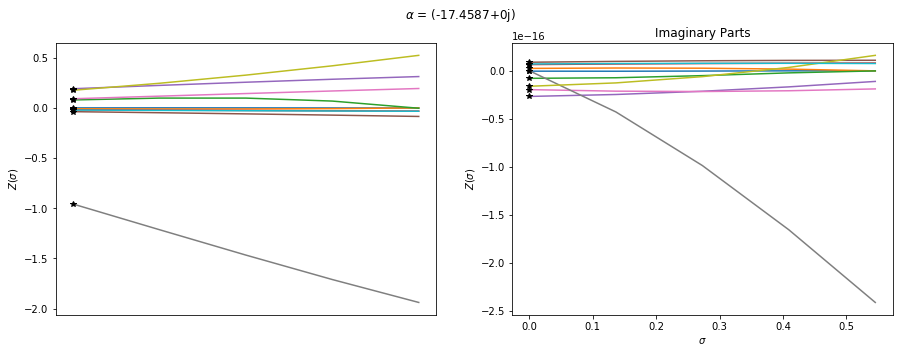

5.85662860538e-14
(-17.4344113728-0.891321454699j)


### $\lambda$ = (9.9803+0.6279j)

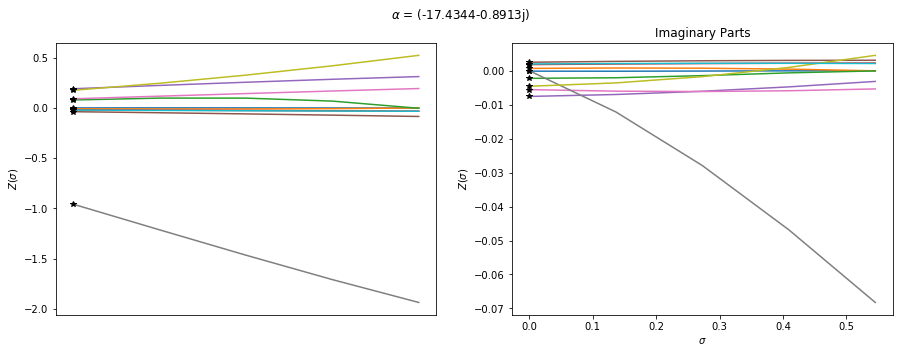

2.39857941223e-14
(-17.3616256727-1.77989203998j)


### $\lambda$ = (9.9211+1.2533j)

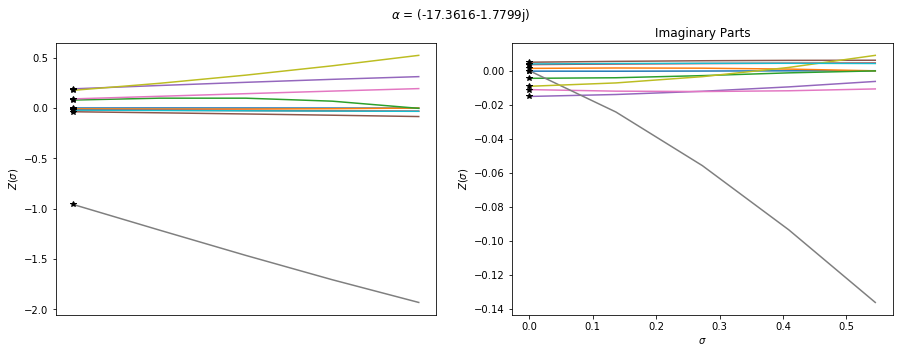

1.70925673852e-14
(-17.2405890964-2.66297097081j)


### $\lambda$ = (9.8229+1.8738j)

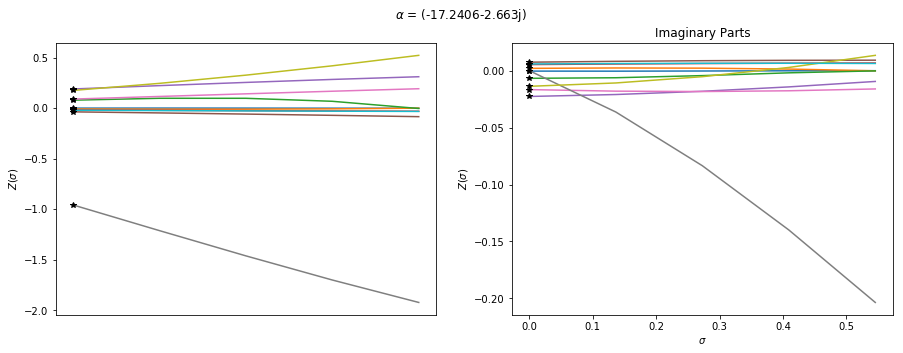

1.29865710659e-14
(-17.0717099411-3.53783759223j)


### $\lambda$ = (9.6858+2.4869j)

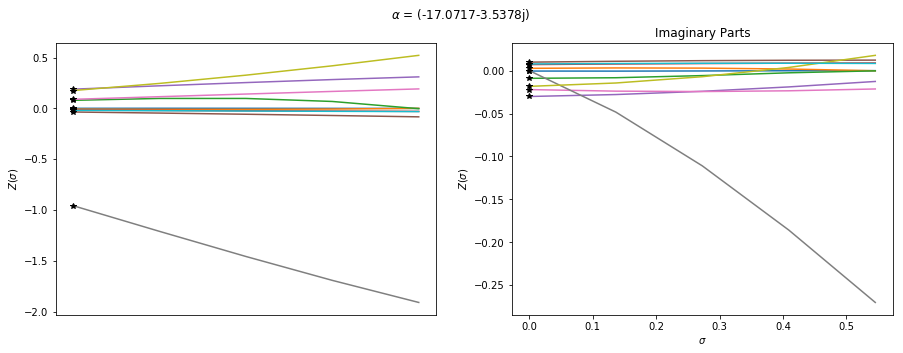

2.08338931906e-14
(-16.8555576491-4.40180134798j)


### $\lambda$ = (9.5106+3.0902j)

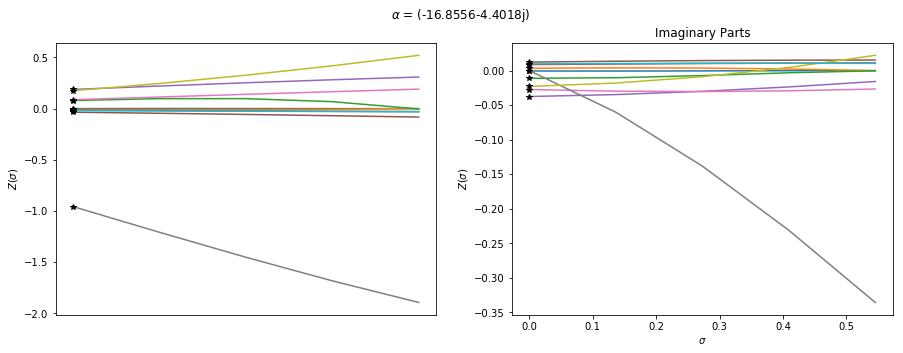

1.36733147042e-14
(-16.5928606453-5.25221163369j)


### $\lambda$ = (9.2978+3.6812j)

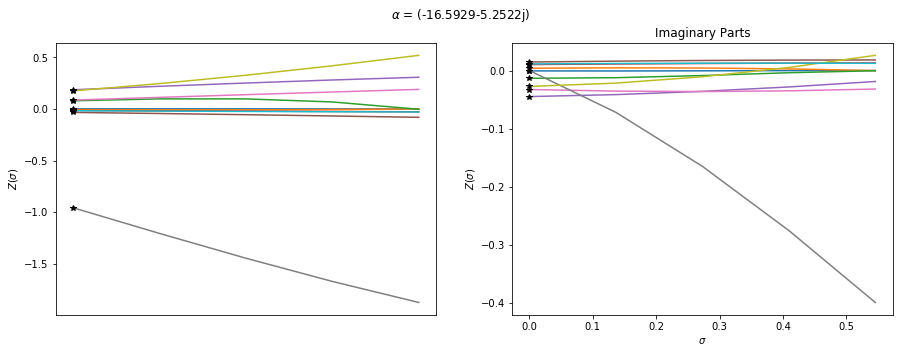

3.05772502712e-14
(-16.2845035703-6.08646749703j)


### $\lambda$ = (9.0483+4.2578j)

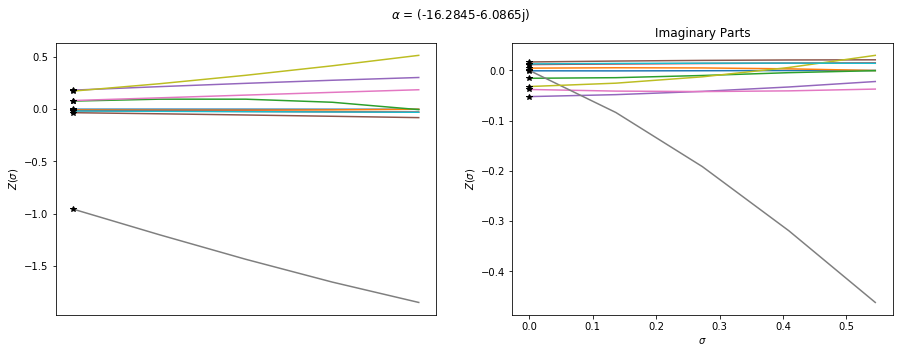

1.87385495531e-14
(-15.9315239218-6.90202714764j)


### $\lambda$ = (8.7631+4.8175j)

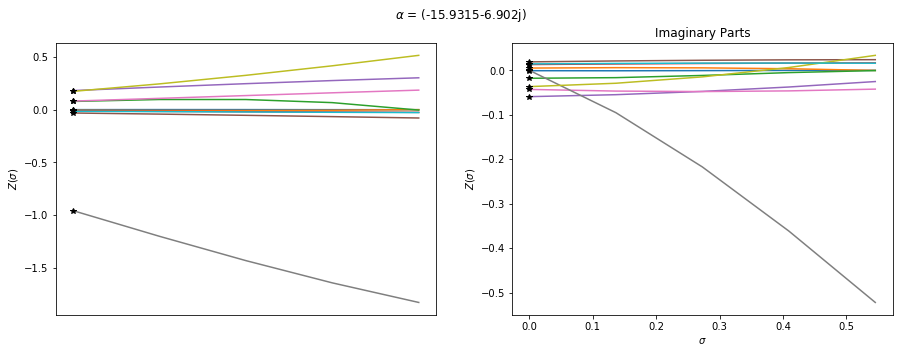

2.54772256174e-14
(-15.5351081165-7.69641724039j)


### $\lambda$ = (8.4433+5.3583j)

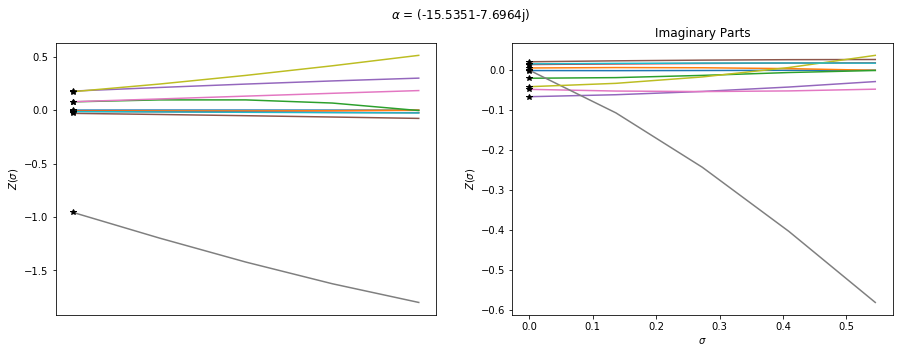

6.21429229802e-14
(-15.0965869885-8.46724189659j)


### $\lambda$ = (8.0902+5.8779j)

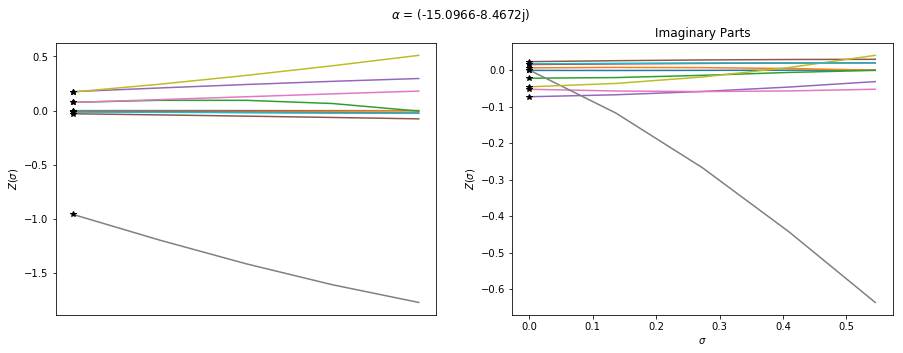

2.94207103416e-14
(-14.6174307425-9.21219142848j)


### $\lambda$ = (7.7051+6.3742j)

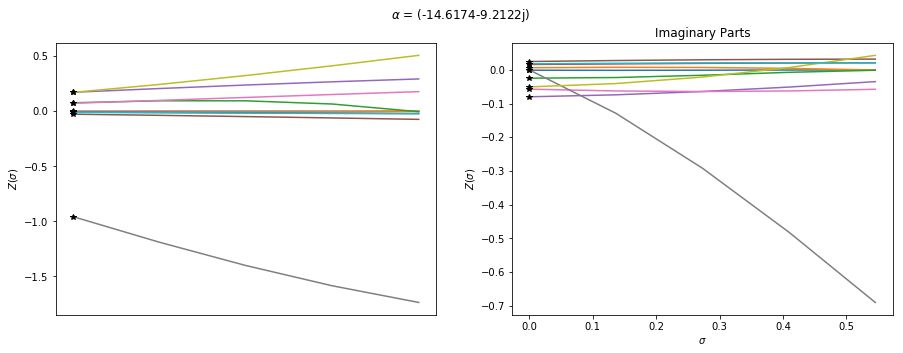

2.77385970343e-14
(-14.0992433799-9.92905073394j)


### $\lambda$ = (7.2897+6.8455j)

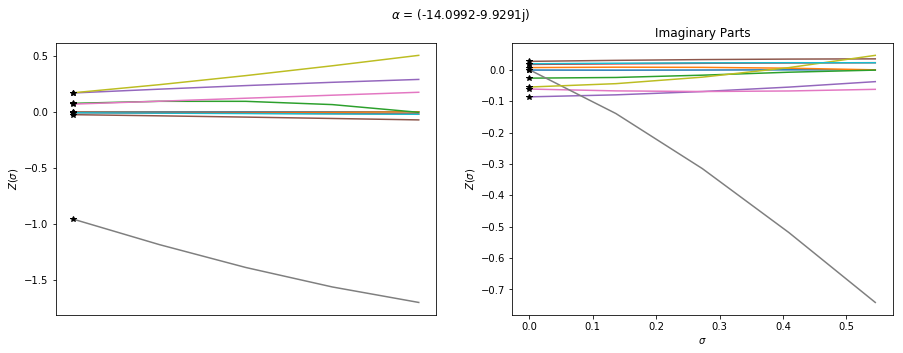

2.70051739792e-14
(-13.543756623-10.615707329j)


### $\lambda$ = (6.8455+7.2897j)

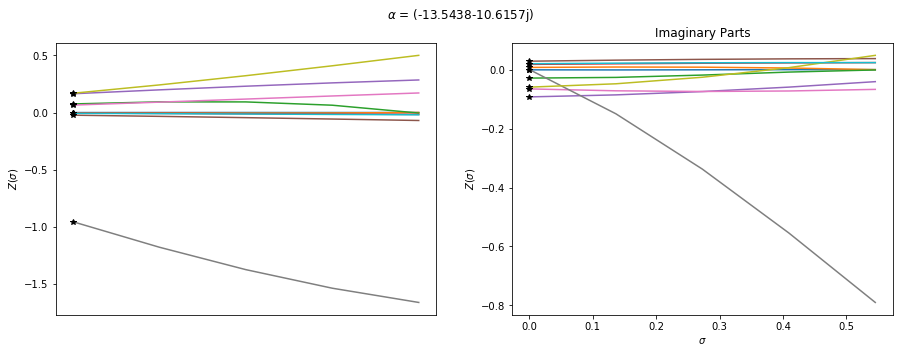

2.31237605571e-14
(-12.9528233582-11.2701589882j)


### $\lambda$ = (6.3742+7.7051j)

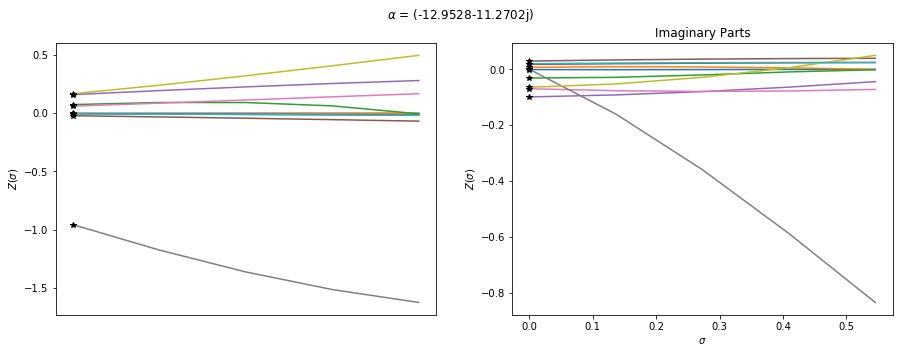

2.25893441199e-14
(-12.3284106265-11.8905209625j)


### $\lambda$ = (5.8779+8.0902j)

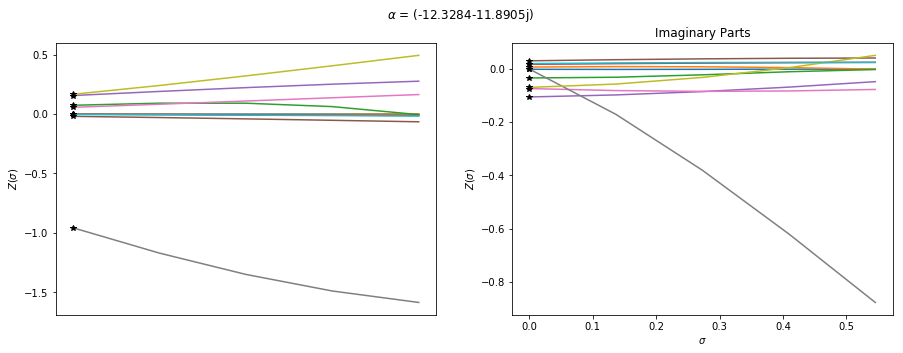

2.4674973198e-14
(-11.6725921878-12.475032749j)


### $\lambda$ = (5.3583+8.4433j)

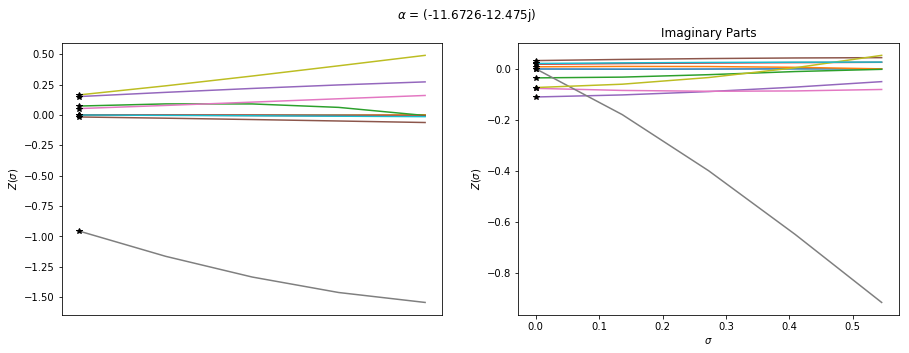

2.11522559548e-14
(-10.9875406892-13.0220643846j)


### $\lambda$ = (4.8175+8.7631j)

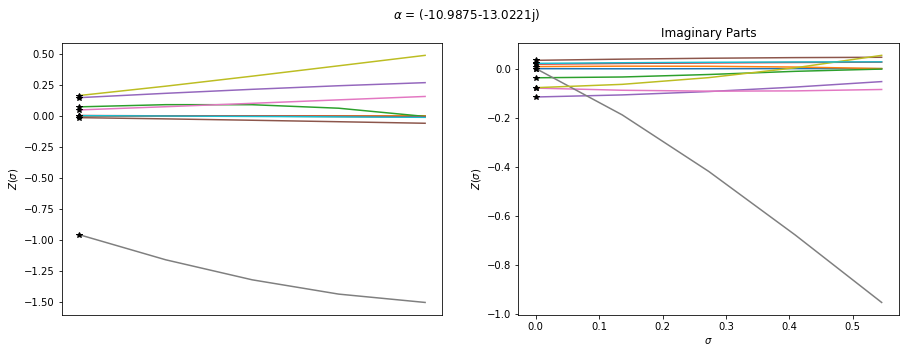

1.25276406493e-14
(-10.2755194686-13.5301222422j)


### $\lambda$ = (4.2578+9.0483j)

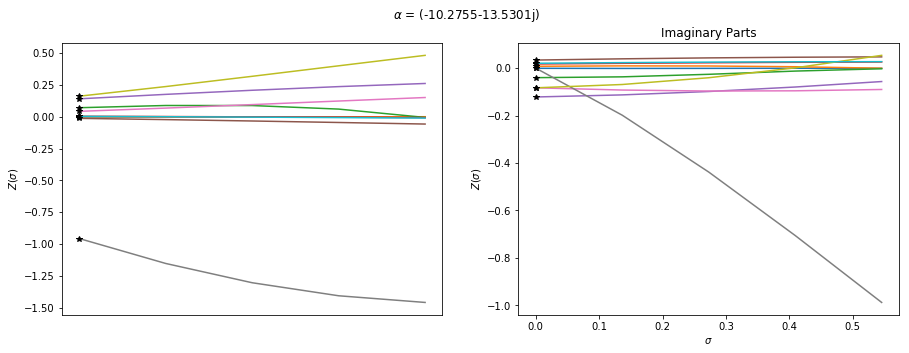

2.03562656888e-14
(-9.53887402542-13.9978543047j)


### $\lambda$ = (3.6812+9.2978j)

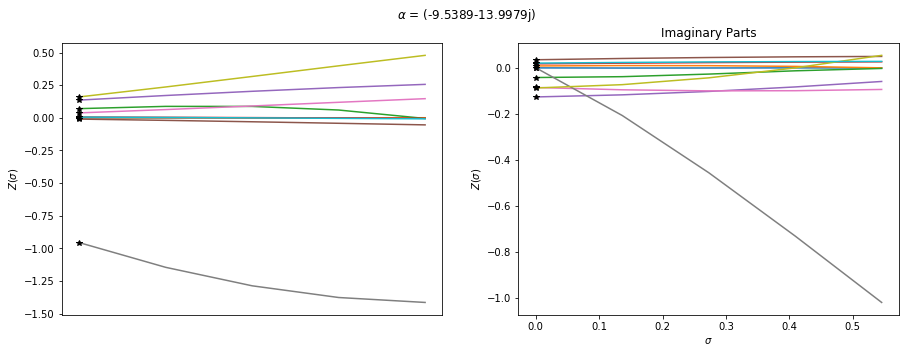

2.52957037032e-14
(-8.78002319317-14.4240548989j)


### $\lambda$ = (3.0902+9.5106j)

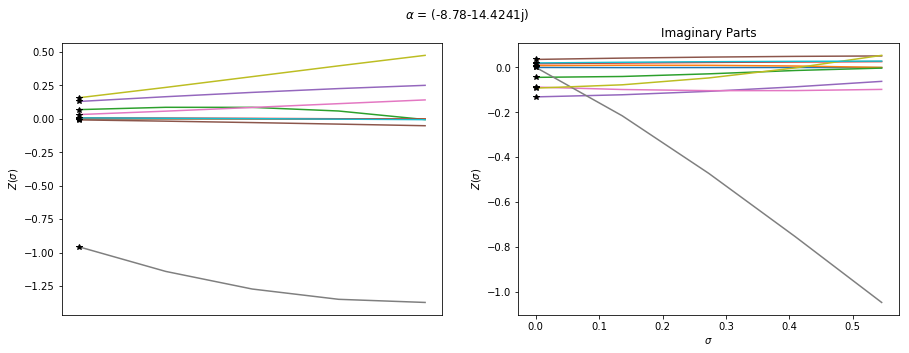

5.91735015585e-14
(-8.00145004897-14.8076688705j)


### $\lambda$ = (2.4869+9.6858j)

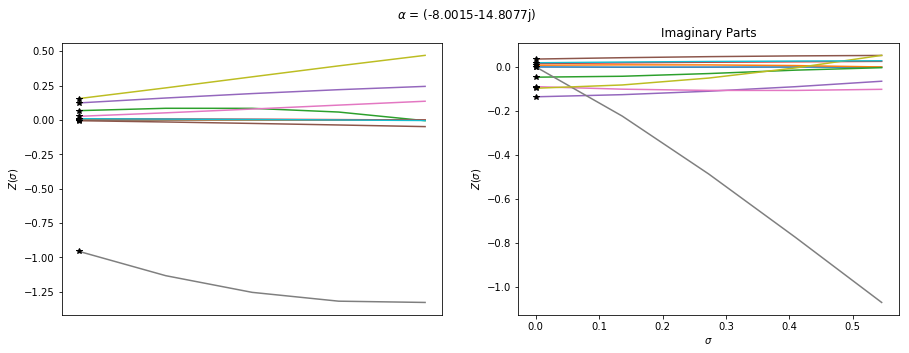

1.95875667561e-14
(-7.20569259593-15.1477951841j)


### $\lambda$ = (1.8738+9.8229j)

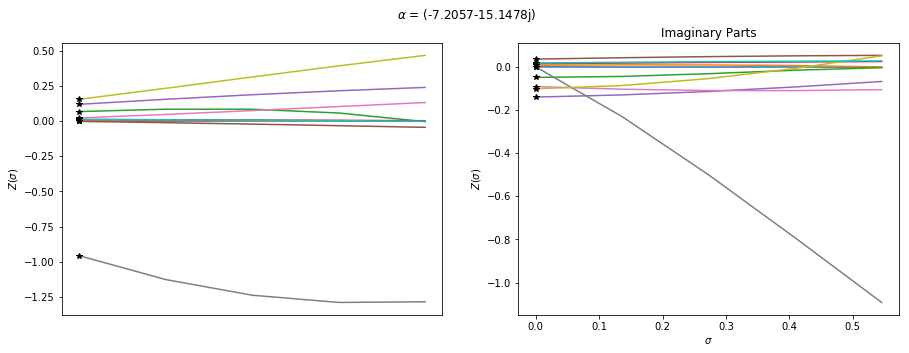

1.49632199241e-14
(-6.39533425582-15.4436899347j)


### $\lambda$ = (1.2533+9.9211j)

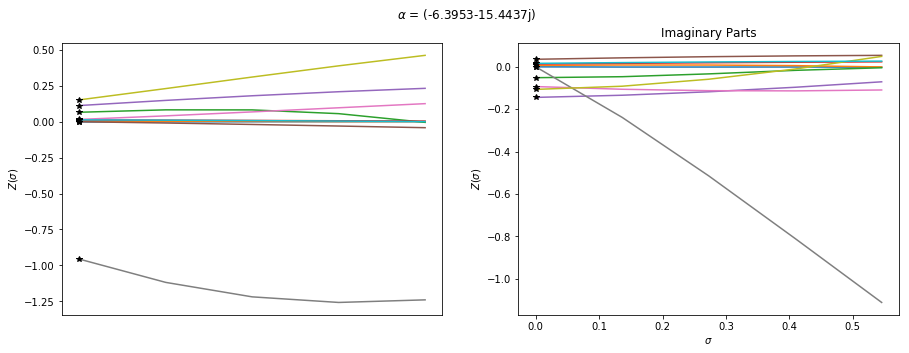

1.50578147604e-14
(-5.57299420999-15.6947687596j)


### $\lambda$ = (0.6279+9.9803j)

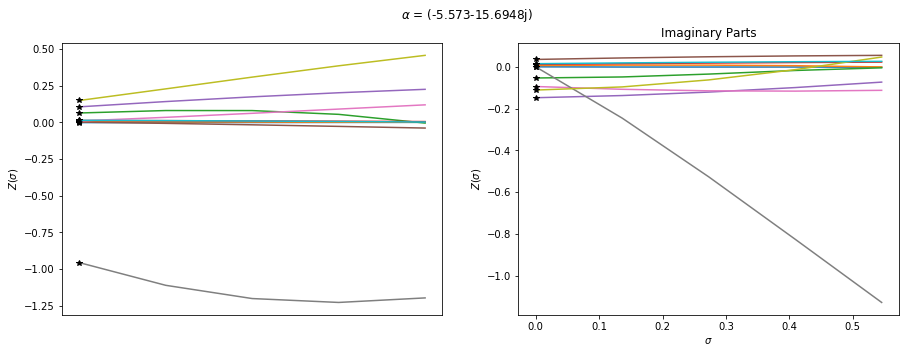

3.22079972615e-14
(-4.74131762698-15.9006086404j)


### $\lambda$ = 10j

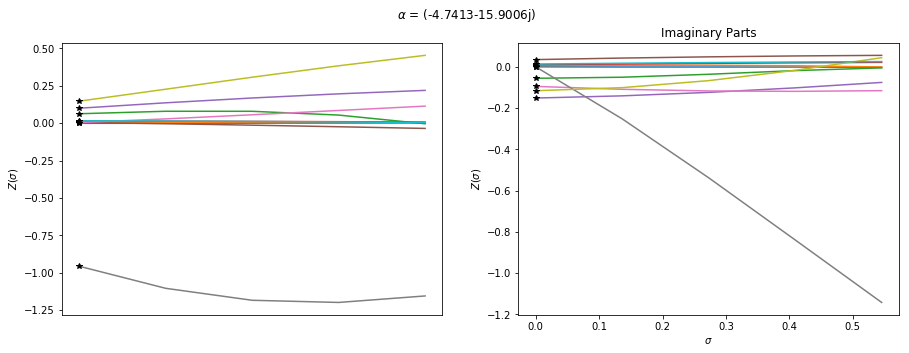

In [224]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,51)

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

lam_bound = 10
display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
for theta_val in theta_vals:
    lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

    A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
    df = e_vals + sigma*(e_min - e_vals)/sm

    to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
    display(Markdown('### $\lambda$ = {}'.format(to_disp)))

    sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
    sys_.createSys()

    sigs = np.linspace(sp,sm,5)
    W_ = np.zeros((10,len(sigs)), dtype=np.complex)
    for p,sig in enumerate(sigs):
        w_val = sys_.evalW(sig)
        W_[:,p] = w_val

    rp = round(e_vals.real,4)
    ip = round(e_vals.imag,4)
    eval = rp+ip*1j

    plt.subplot(121)
    for p in range(len(W_[:,0])):
        plt.plot(sigs[:], -W_[p][:].real,label=p+1)
        plt.plot(0,-e_vecs[p].real,'*k')

    plt.suptitle('Real Parts')
    plt.ylabel(r'$Z(\sigma)$')
    plt.xticks([], [])

    plt.subplot(122)
    for p in range(len(W_[:,0])):
        plt.plot(sigs[:], -W_[p][:].imag,label=p+1)
        plt.plot(0,-e_vecs[p].imag,'*k')
    plt.xlabel(r'$\sigma$')
    plt.ylabel(r'$Z(\sigma)$')
    plt.title('Imaginary Parts')

    plt.suptitle(r'$\alpha$ = {}'.format(eval))
    plt.show()

# $\Lambda$ = 10

3.22079972615e-14
(-4.74131762698+15.9006086404j)


### $\lambda$ = -10j

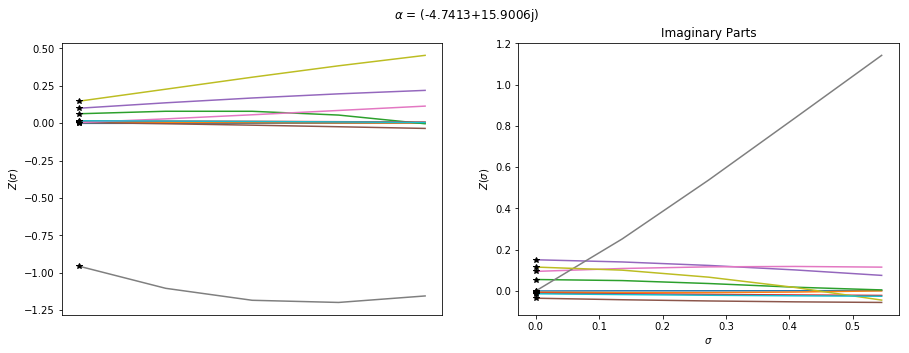

2.19270156952e-14
(-13.8260493801+10.2762821803j)


### $\lambda$ = (7.0711-7.0711j)

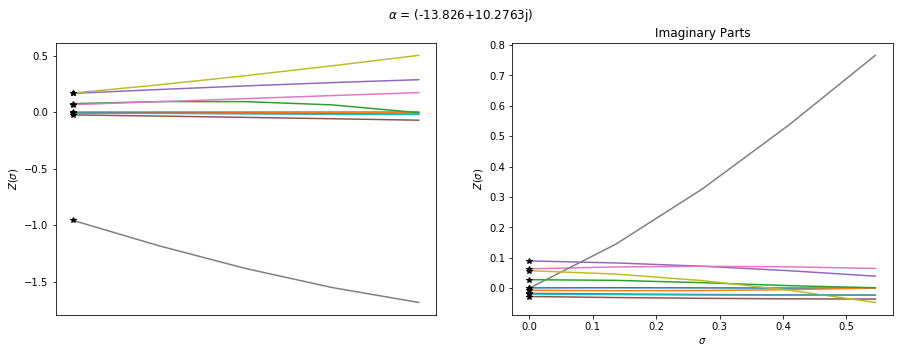

3.39622470196e-14
(-17.4587005964+0j)


### $\lambda$ = (10+0j)

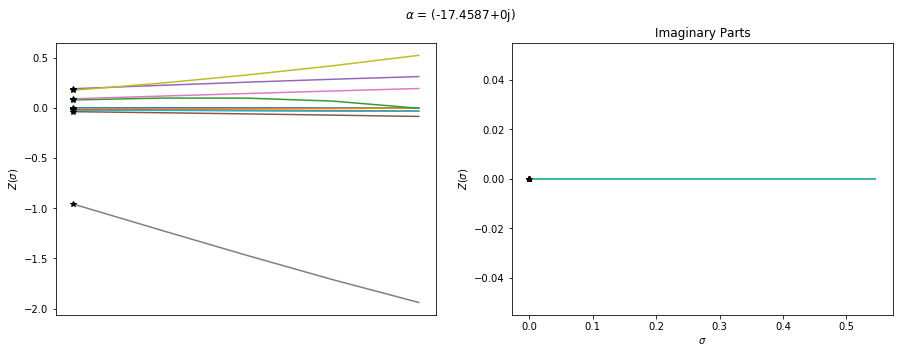

2.19270156952e-14
(-13.8260493801-10.2762821803j)


### $\lambda$ = (7.0711+7.0711j)

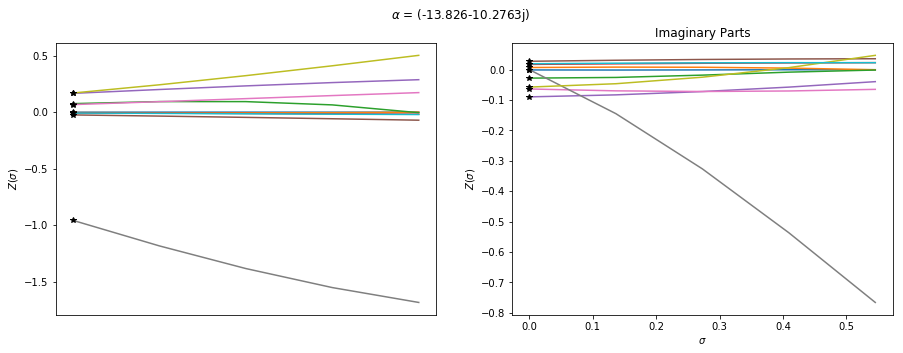

3.22079972615e-14
(-4.74131762698-15.9006086404j)


### $\lambda$ = 10j

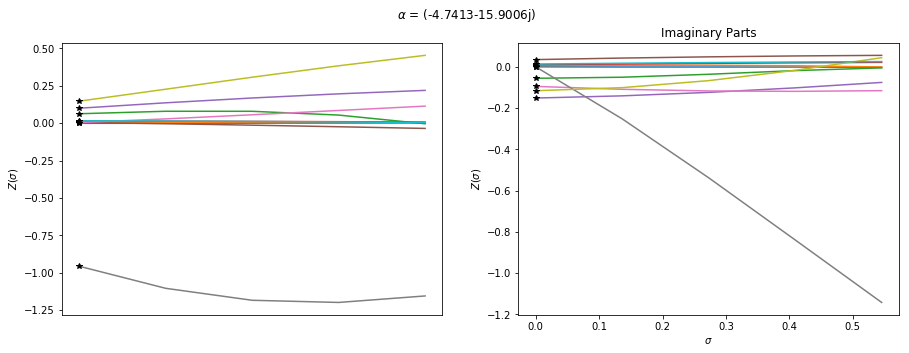

# $\Lambda$ = 12

1.90153275602e-14
(-5.30153685075+18.5278617113j)


### $\lambda$ = -12j

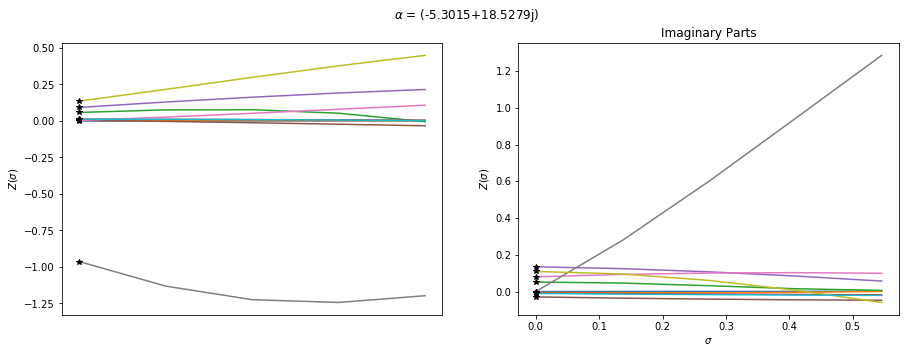

2.22738705921e-14
(-15.9805415207+12.0277504284j)


### $\lambda$ = (8.4853-8.4853j)

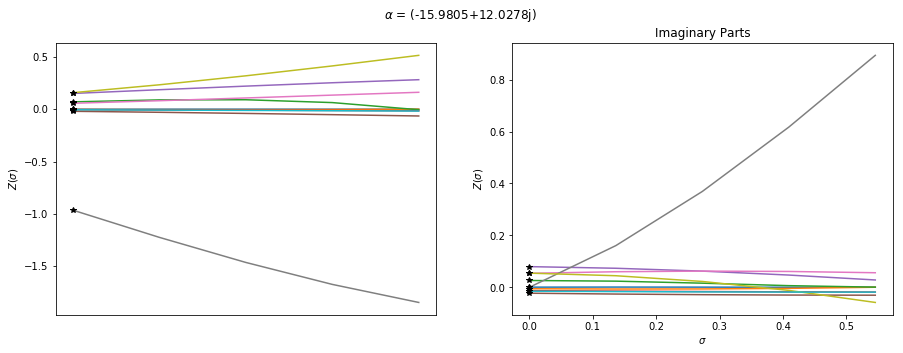

1.90895377874e-14
(-20.2627024728+0j)


### $\lambda$ = (12+0j)

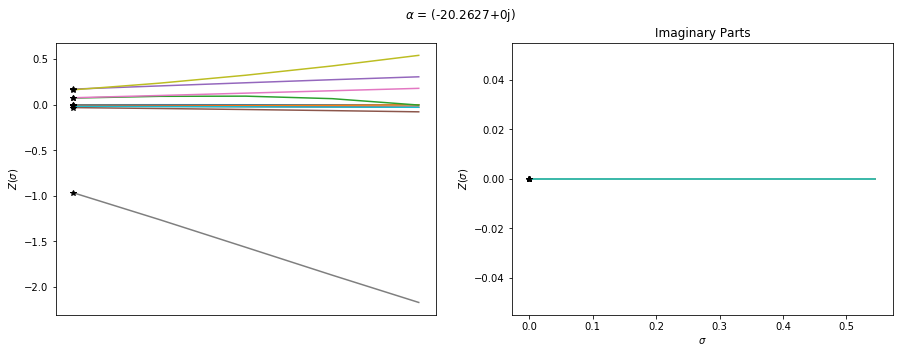

2.22738705921e-14
(-15.9805415207-12.0277504284j)


### $\lambda$ = (8.4853+8.4853j)

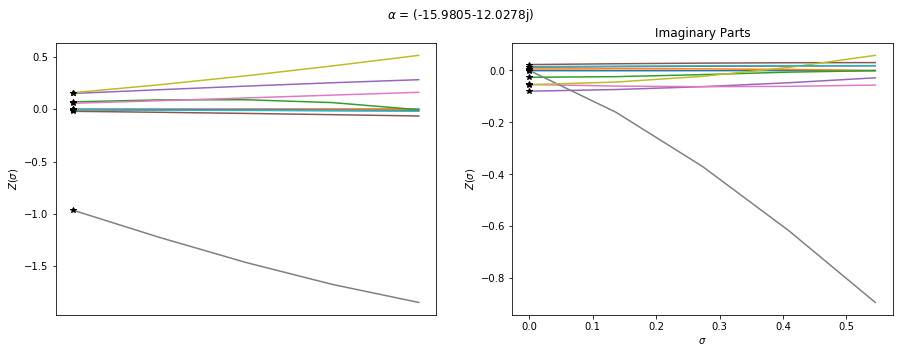

1.90153275602e-14
(-5.30153685075-18.5278617113j)


### $\lambda$ = 12j

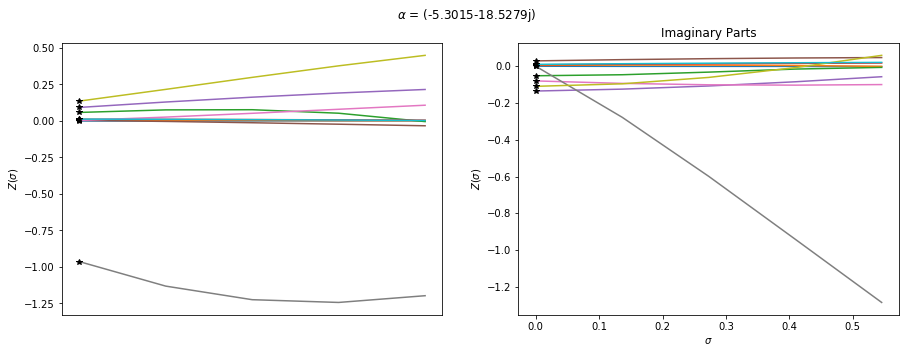

# $\Lambda$ = 14

2.93144832853e-14
(-5.82247413451+21.1014240635j)


### $\lambda$ = -14j

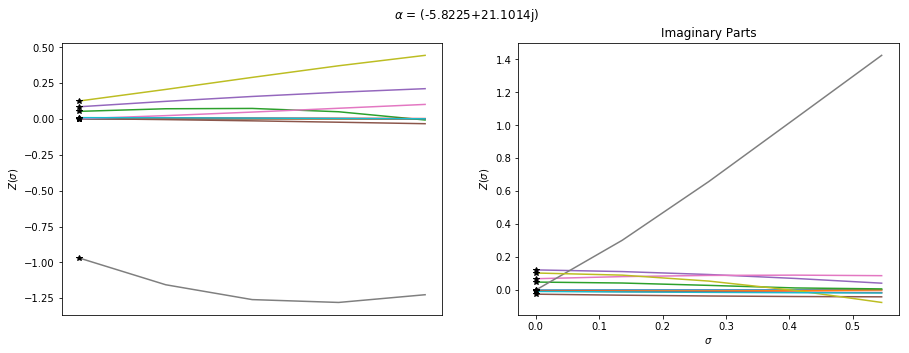

1.24646173735e-14
(-18.0811041581+13.7507826462j)


### $\lambda$ = (9.8995-9.8995j)

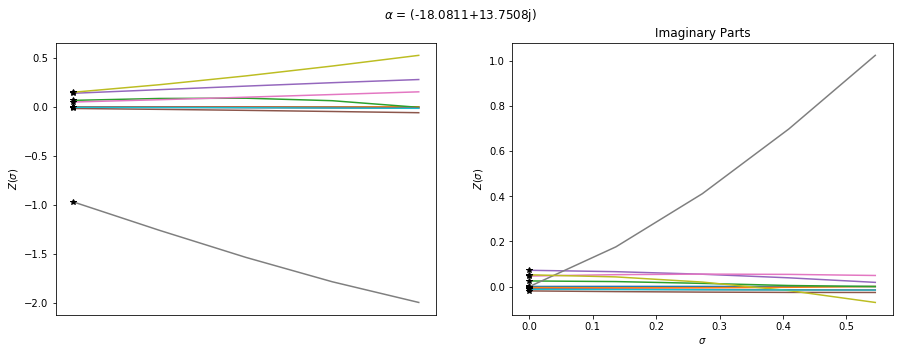

3.33800350457e-14
(-23.0075253907+0j)


### $\lambda$ = (14+0j)

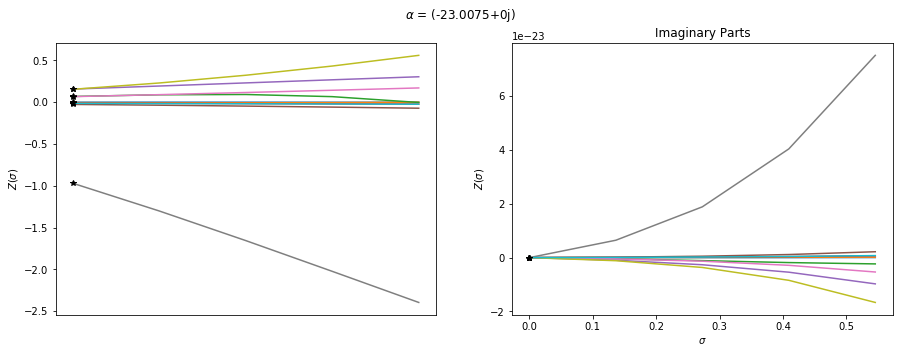

1.24646173735e-14
(-18.0811041581-13.7507826462j)


### $\lambda$ = (9.8995+9.8995j)

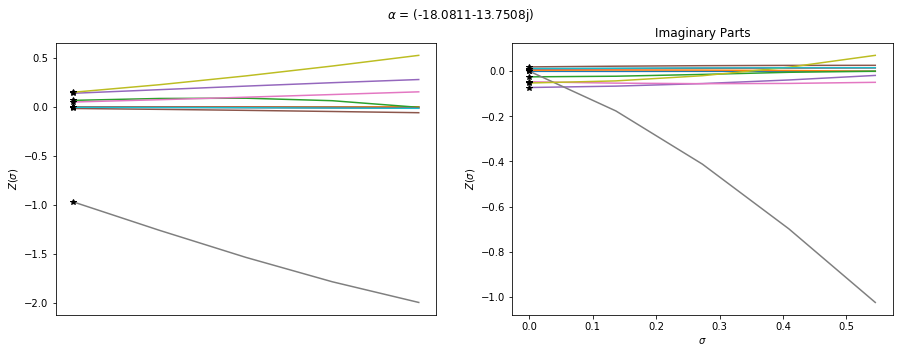

2.93144832853e-14
(-5.82247413451-21.1014240635j)


### $\lambda$ = 14j

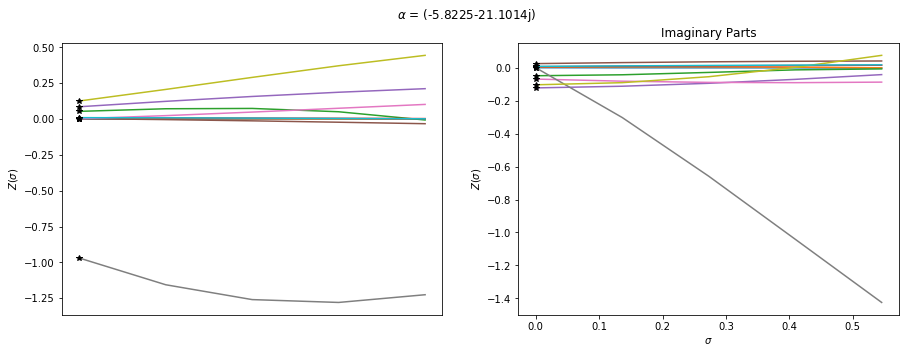

# $\Lambda$ = 16

2.04286937135e-14
(-6.31124253543+23.6329057265j)


### $\lambda$ = -16j

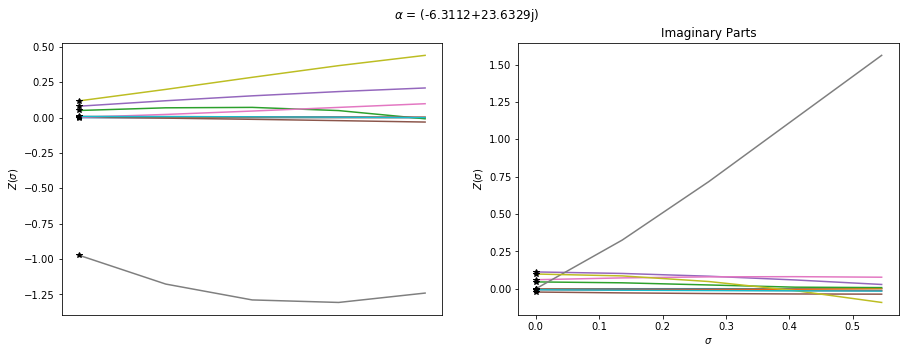

2.63457271802e-14
(-20.1380494561+15.4514416996j)


### $\lambda$ = (11.3137-11.3137j)

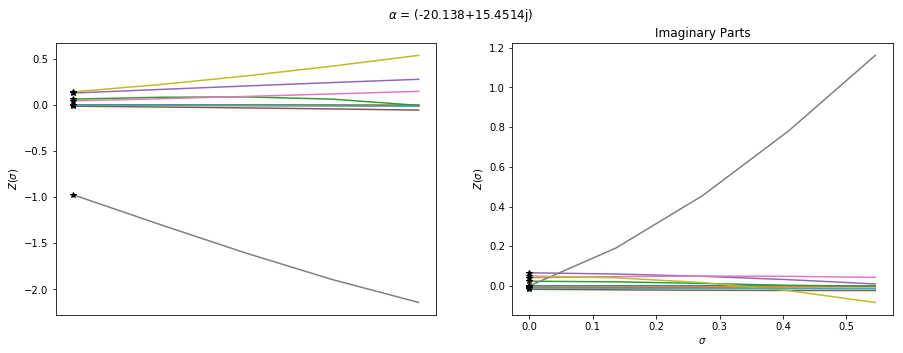

1.91988880882e-14
(-25.7046318769+0j)


### $\lambda$ = (16+0j)

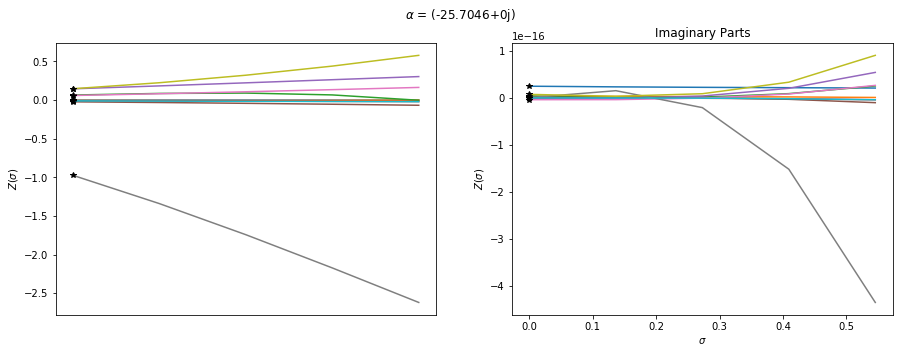

2.63457271802e-14
(-20.1380494561-15.4514416996j)


### $\lambda$ = (11.3137+11.3137j)

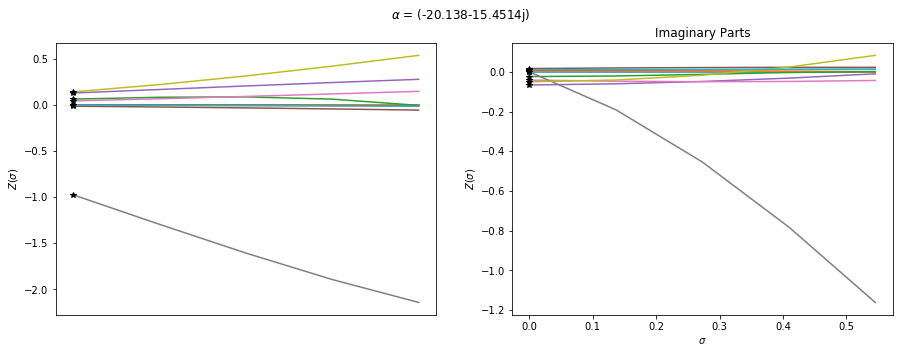

2.04286937135e-14
(-6.31124253543-23.6329057265j)


### $\lambda$ = 16j

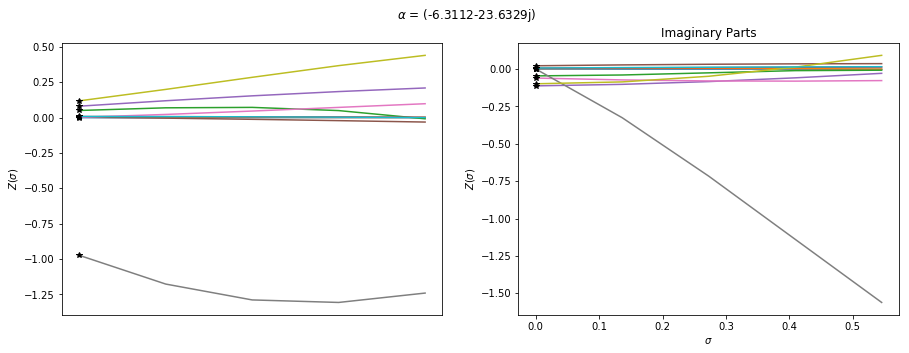

# $\Lambda$ = 18

6.1236667288e-14
(-6.7730726123+26.1302920121j)


### $\lambda$ = -18j

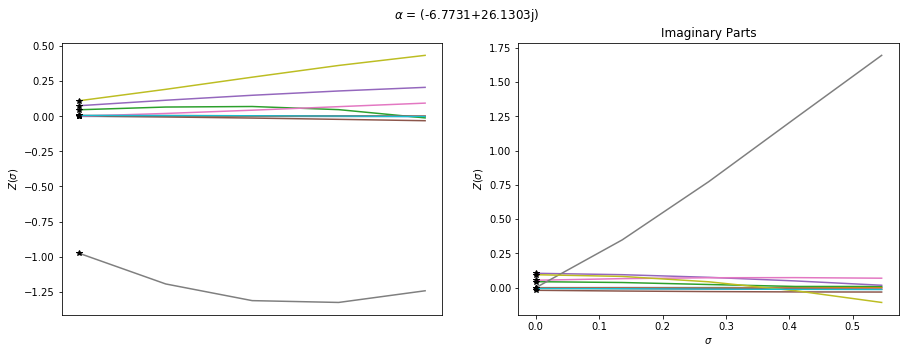

7.68958044553e-14
(-22.1587686965+17.1339201447j)


### $\lambda$ = (12.7279-12.7279j)

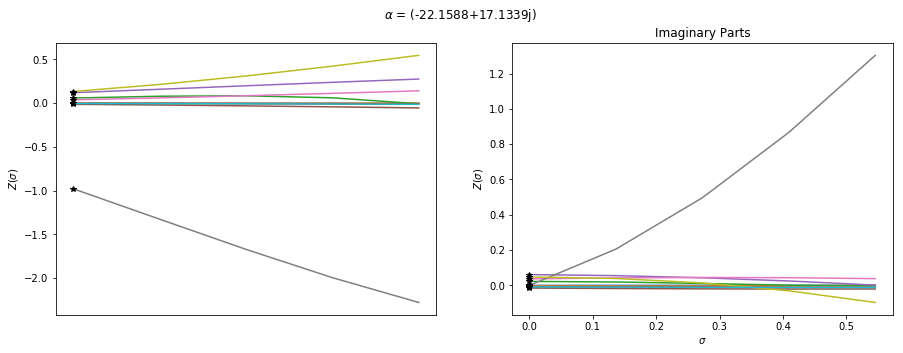

1.13487720115e-13
(-28.3621918912+0j)


### $\lambda$ = (18+0j)

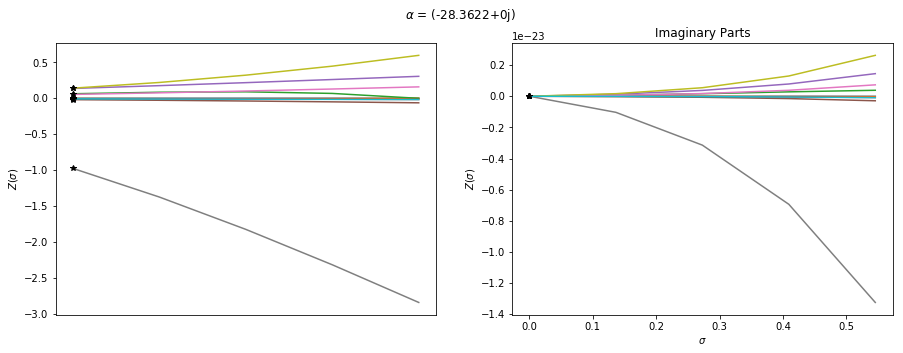

7.68958044553e-14
(-22.1587686965-17.1339201447j)


### $\lambda$ = (12.7279+12.7279j)

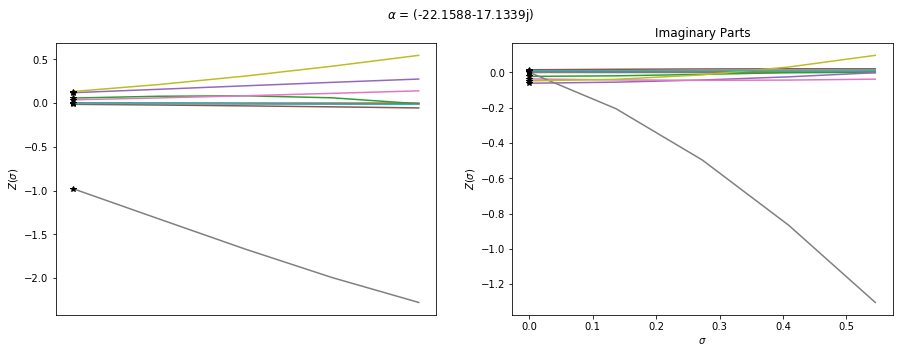

6.1236667288e-14
(-6.7730726123-26.1302920121j)


### $\lambda$ = 18j

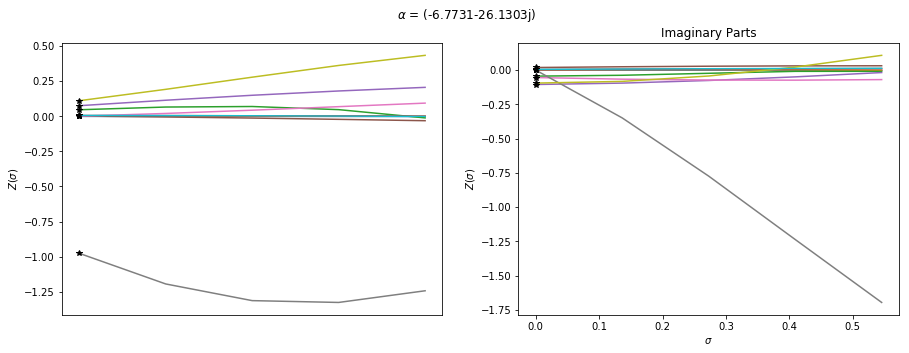

# $\Lambda$ = 20

6.22536316823e-14
(-7.21193241781+28.5993433675j)


### $\lambda$ = -20j

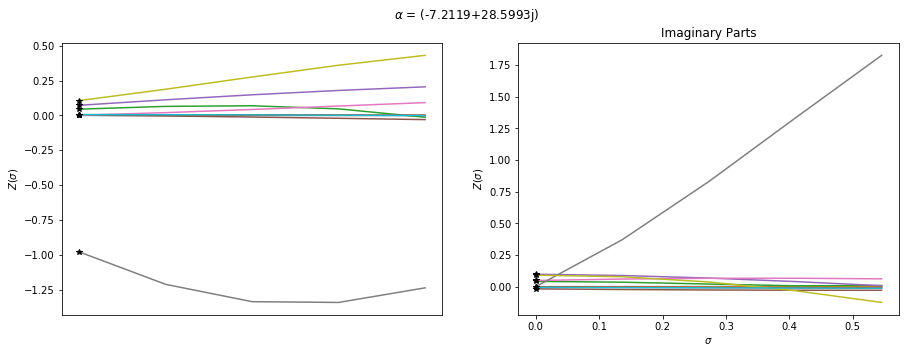

5.63885965488e-14
(-24.1487745481+18.8012554825j)


### $\lambda$ = (14.1421-14.1421j)

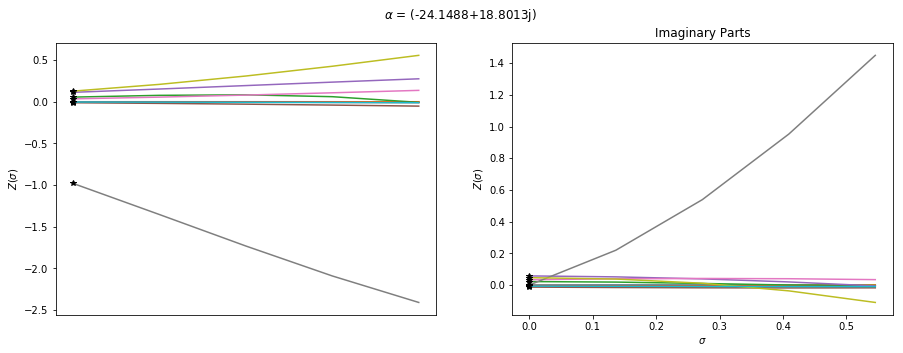

2.70864204857e-14
(-30.986274794+0j)


### $\lambda$ = (20+0j)

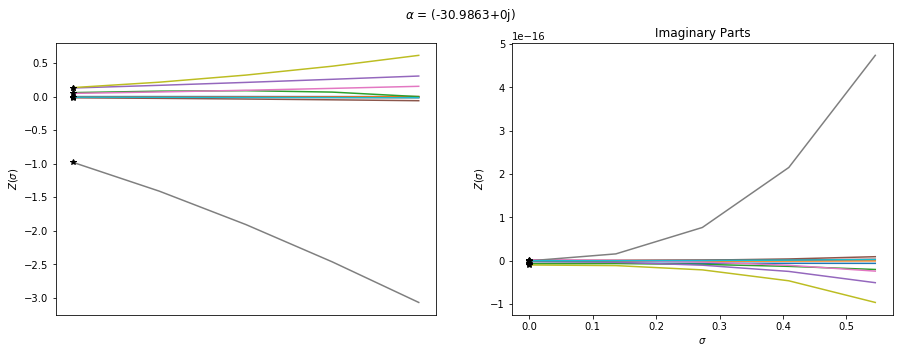

5.63885965488e-14
(-24.1487745481-18.8012554825j)


### $\lambda$ = (14.1421+14.1421j)

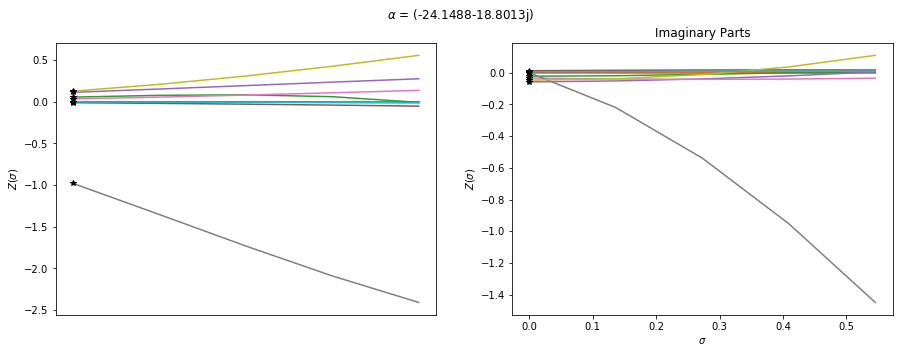

6.22536316823e-14
(-7.21193241781-28.5993433675j)


### $\lambda$ = 20j

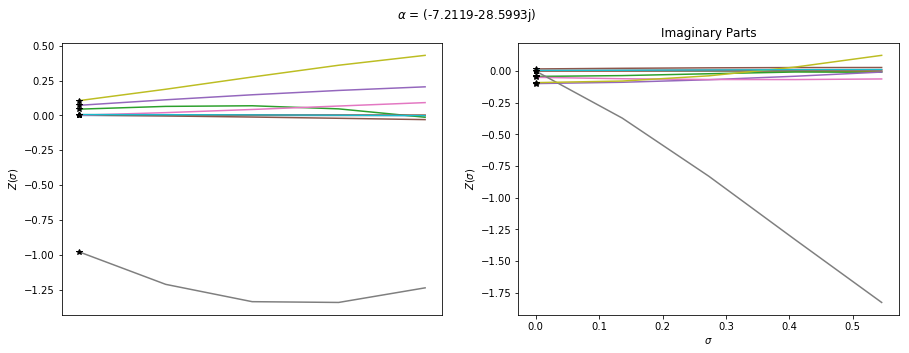

# $\Lambda$ = 22

2.00555102863e-14
(-7.63091176517+31.0443719948j)


### $\lambda$ = -22j

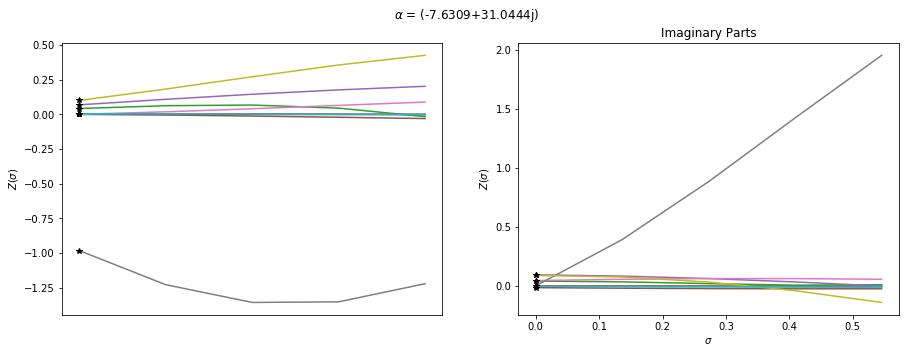

2.60741595561e-14
(-26.1123087053+20.4557294623j)


### $\lambda$ = (15.5563-15.5563j)

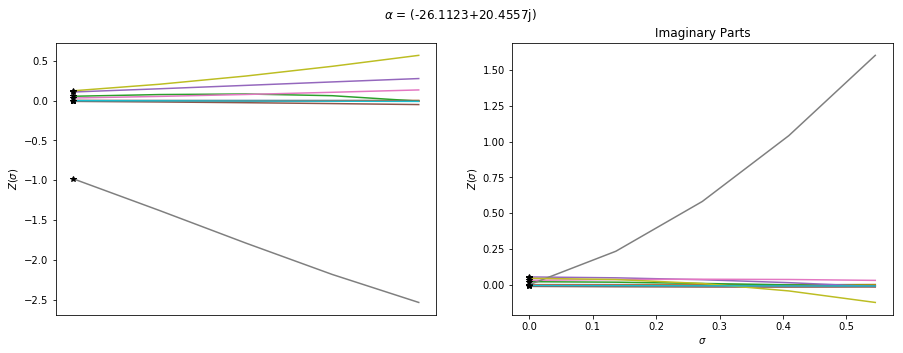

3.14607131018e-14
(-33.5815370492+0j)


### $\lambda$ = (22+0j)

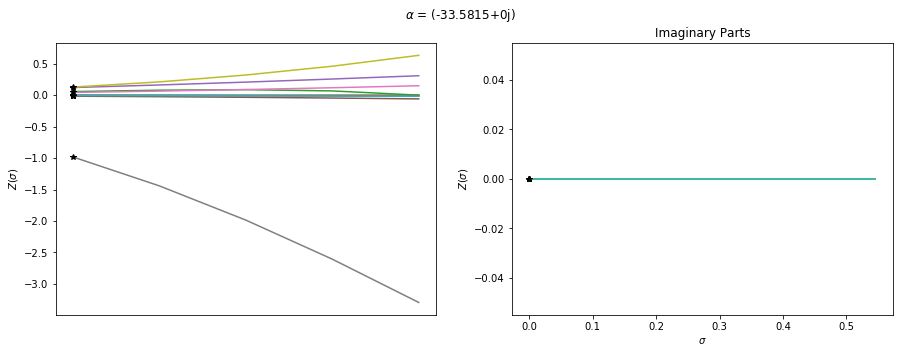

2.60741595561e-14
(-26.1123087053-20.4557294623j)


### $\lambda$ = (15.5563+15.5563j)

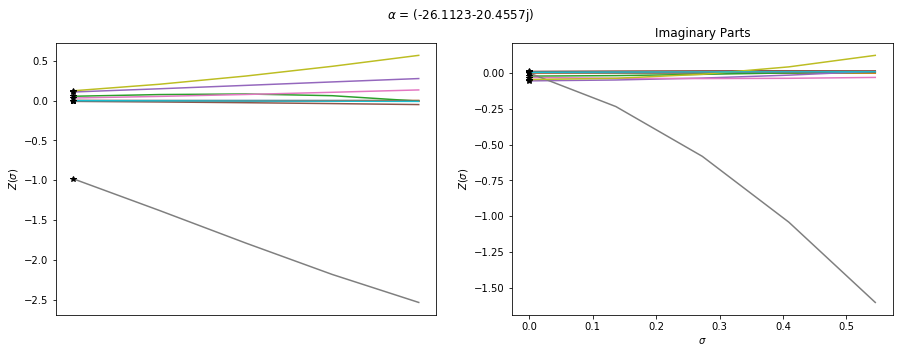

2.00555102863e-14
(-7.63091176517-31.0443719948j)


### $\lambda$ = 22j

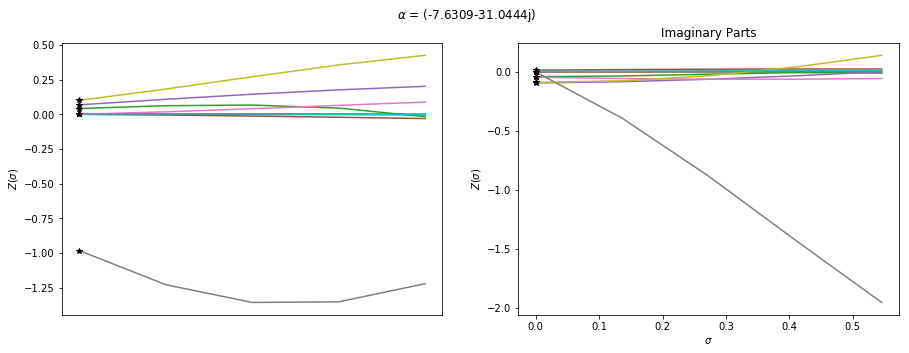

# $\Lambda$ = 24

5.63104908382e-14
(-8.03246986123+33.4687028008j)


### $\lambda$ = -24j

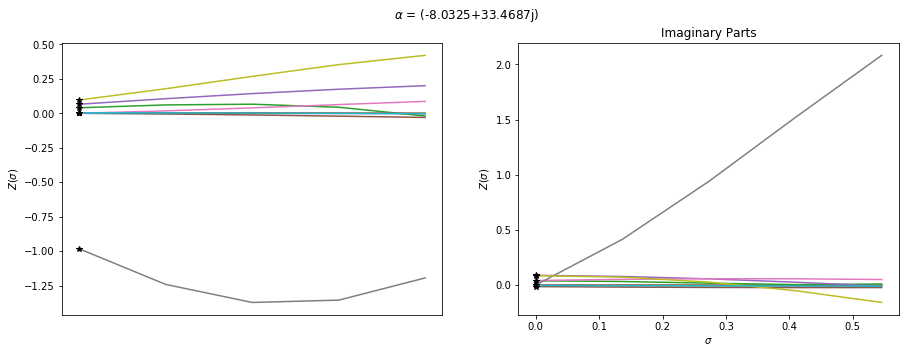

5.5713864145e-14
(-28.0527179173+22.0991064002j)


### $\lambda$ = (16.9706-16.9706j)

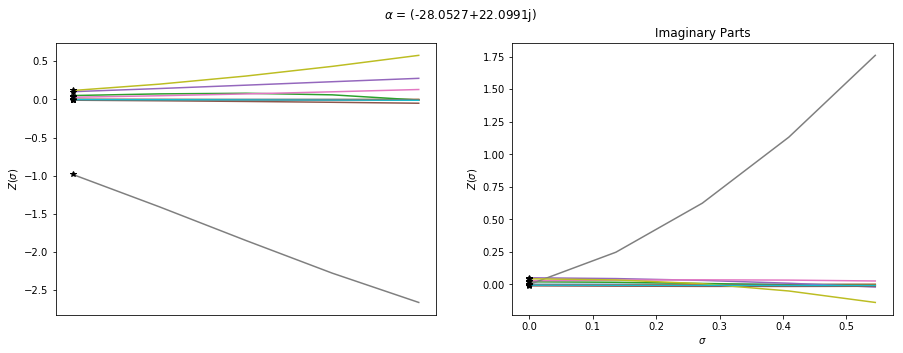

7.19496574853e-14
(-36.1516445614+0j)


### $\lambda$ = (24+0j)

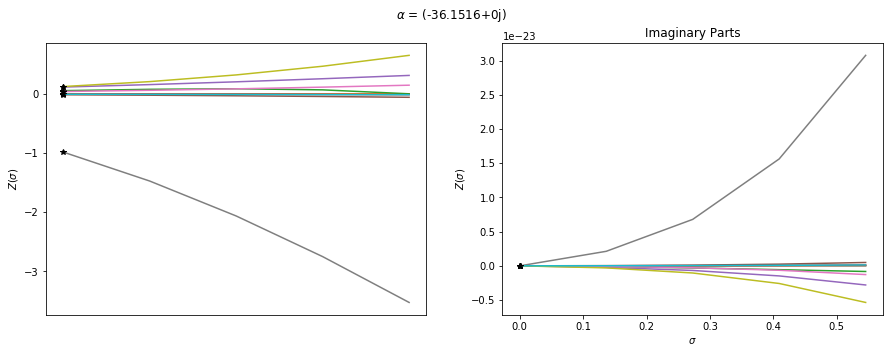

5.5713864145e-14
(-28.0527179173-22.0991064002j)


### $\lambda$ = (16.9706+16.9706j)

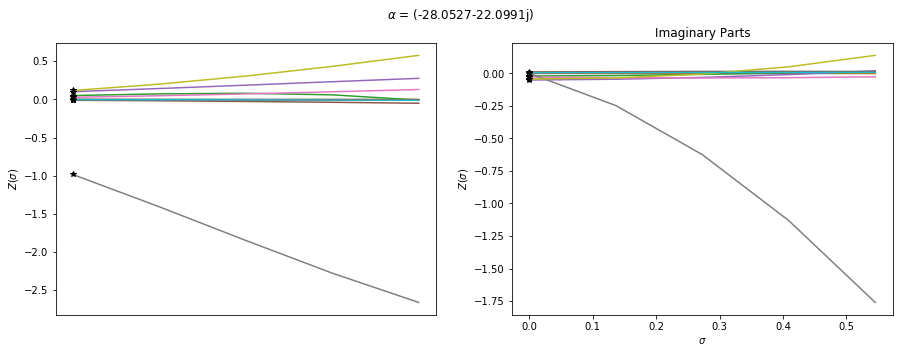

5.63104908382e-14
(-8.03246986123-33.4687028008j)


### $\lambda$ = 24j

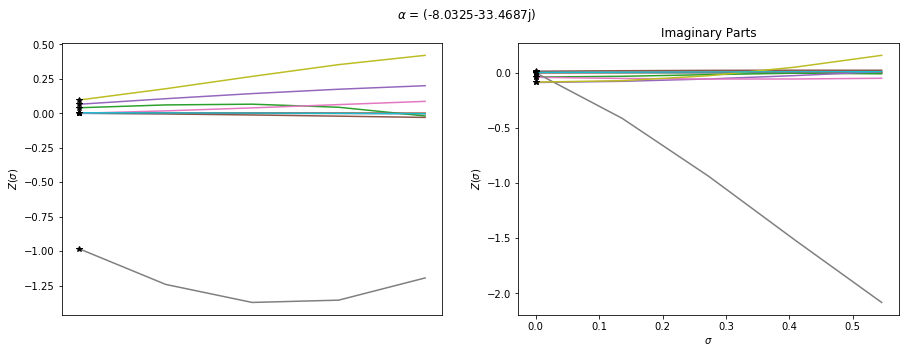

# $\Lambda$ = 26

3.07091490156e-14
(-8.41860063201+35.8749620671j)


### $\lambda$ = -26j

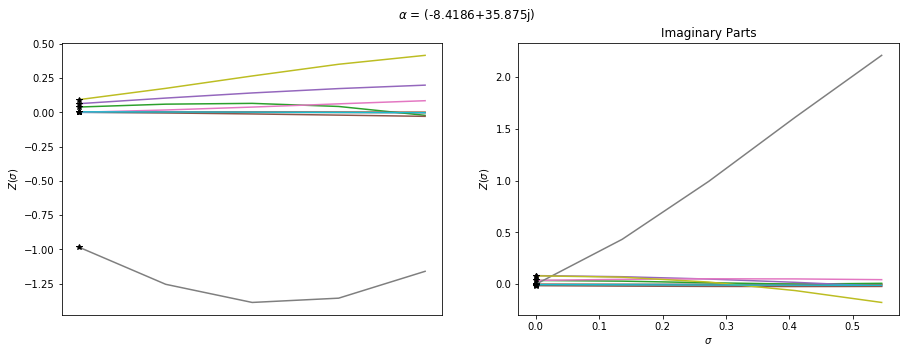

5.42261291453e-14
(-29.9726979934+23.7327831447j)


### $\lambda$ = (18.3848-18.3848j)

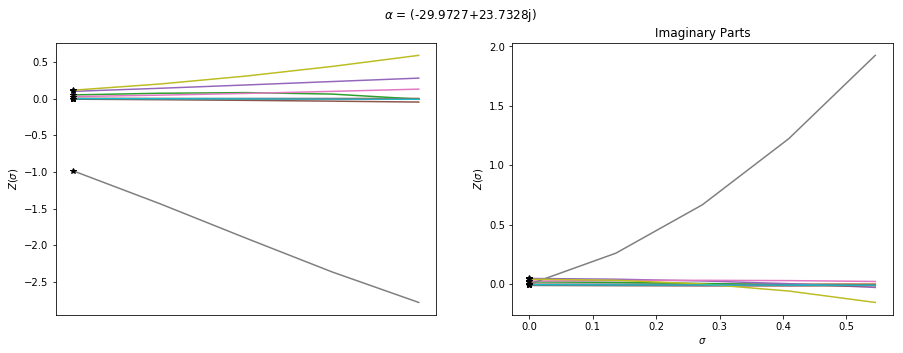

3.75474226306e-14
(-38.6995451543+0j)


### $\lambda$ = (26+0j)

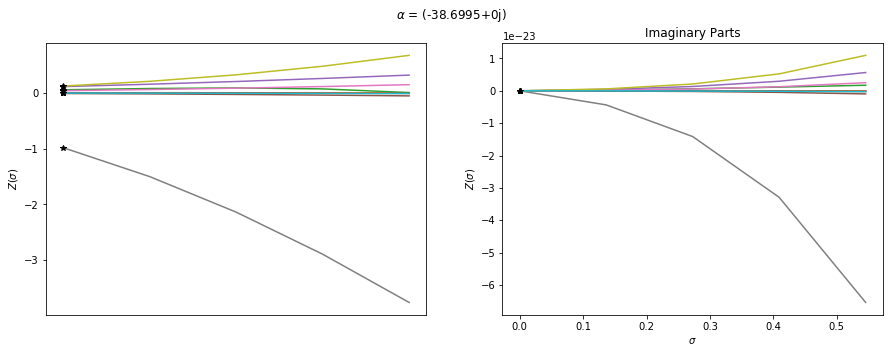

5.42261291453e-14
(-29.9726979934-23.7327831447j)


### $\lambda$ = (18.3848+18.3848j)

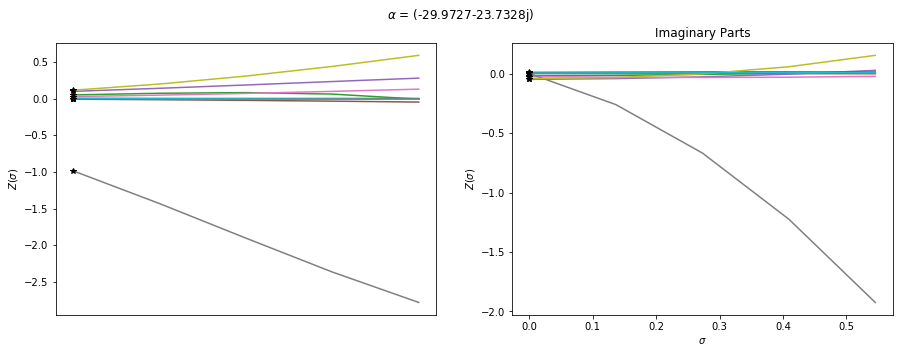

3.07091490156e-14
(-8.41860063201-35.8749620671j)


### $\lambda$ = 26j

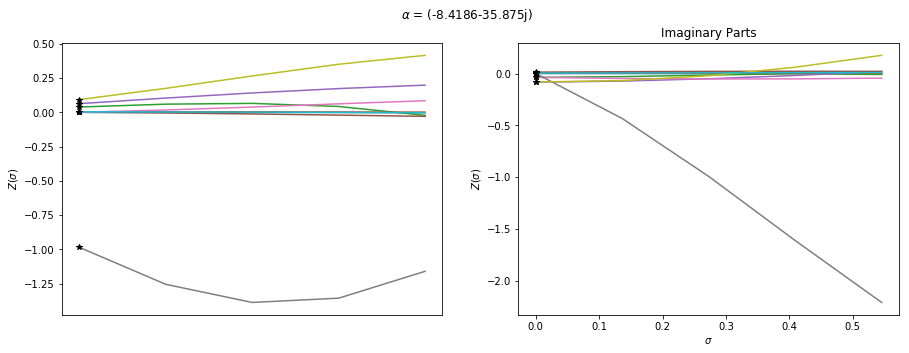

# $\Lambda$ = 28

3.26089935234e-14
(-8.79094658473+38.2652662977j)


### $\lambda$ = -28j

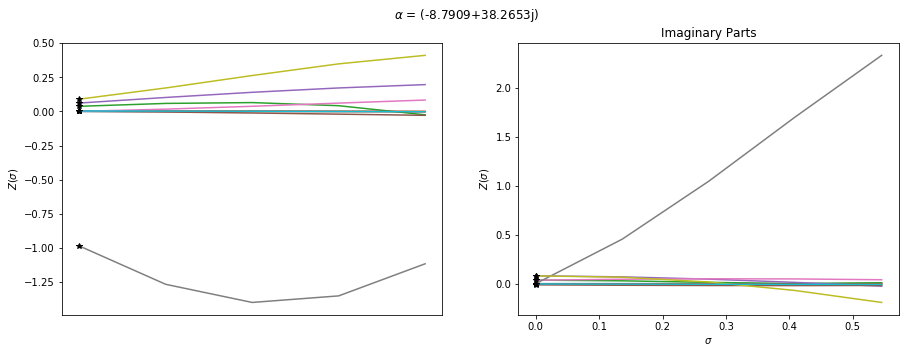

1.94120383576e-13
(-31.8744583864+25.357887591j)


### $\lambda$ = (19.799-19.799j)

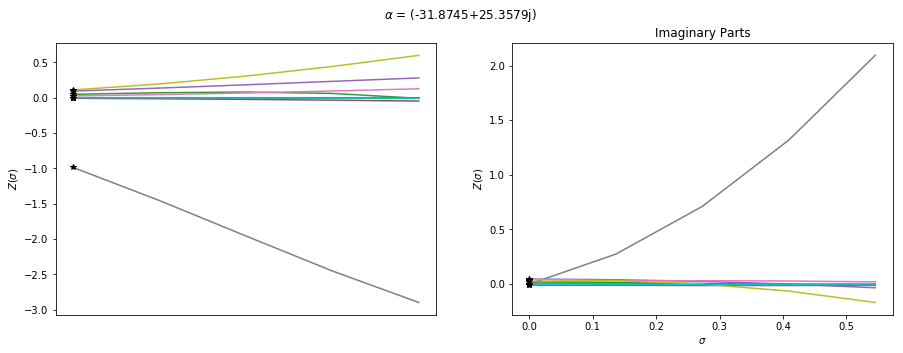

8.01130784165e-14
(-41.2276515368+0j)


### $\lambda$ = (28+0j)

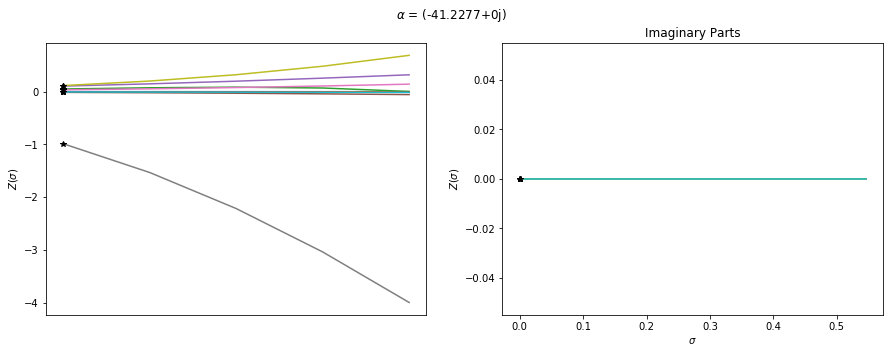

1.94120383576e-13
(-31.8744583864-25.357887591j)


### $\lambda$ = (19.799+19.799j)

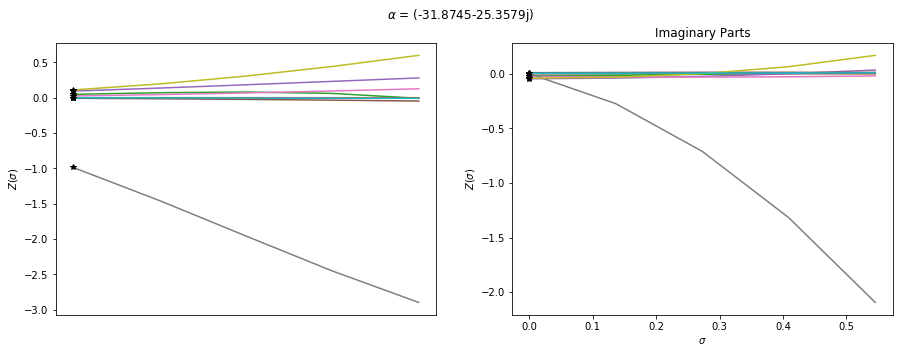

3.26089935234e-14
(-8.79094658473-38.2652662977j)


### $\lambda$ = 28j

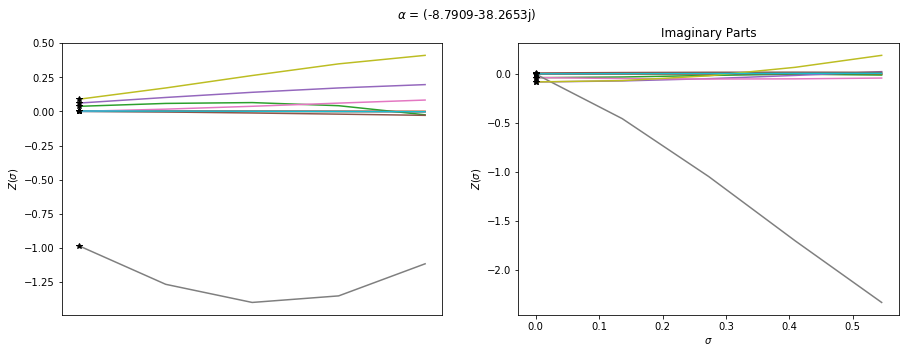

# $\Lambda$ = 30

4.8016118828e-14
(-9.15087938574+40.6413503227j)


### $\lambda$ = -30j

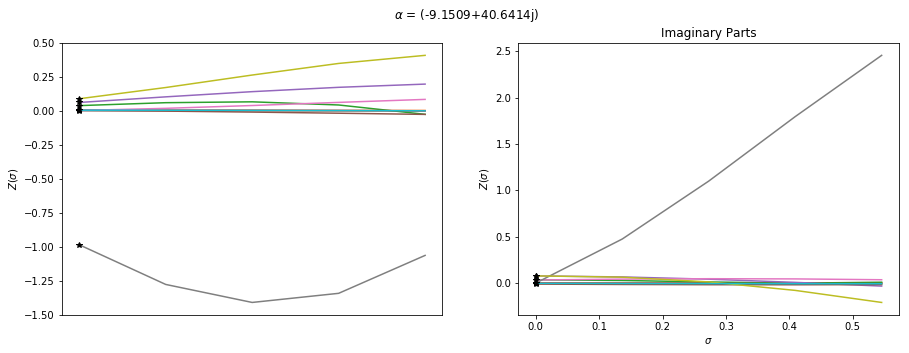

1.4464298768e-13
(-33.7598368434+26.9753457461j)


### $\lambda$ = (21.2132-21.2132j)

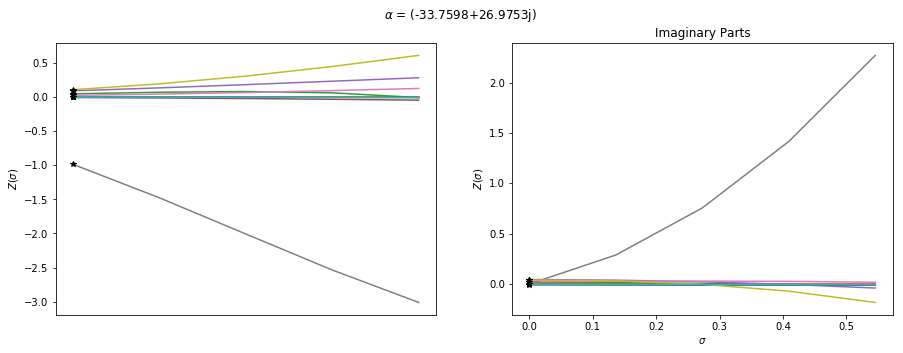

9.34517599239e-14
(-43.7379683075+0j)


### $\lambda$ = (30+0j)

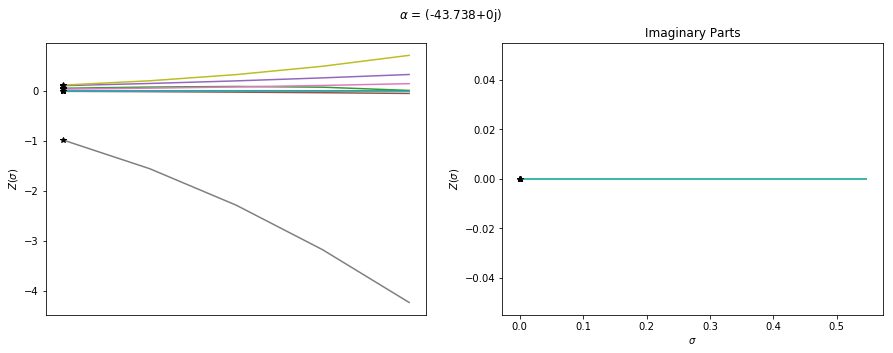

1.4464298768e-13
(-33.7598368434-26.9753457461j)


### $\lambda$ = (21.2132+21.2132j)

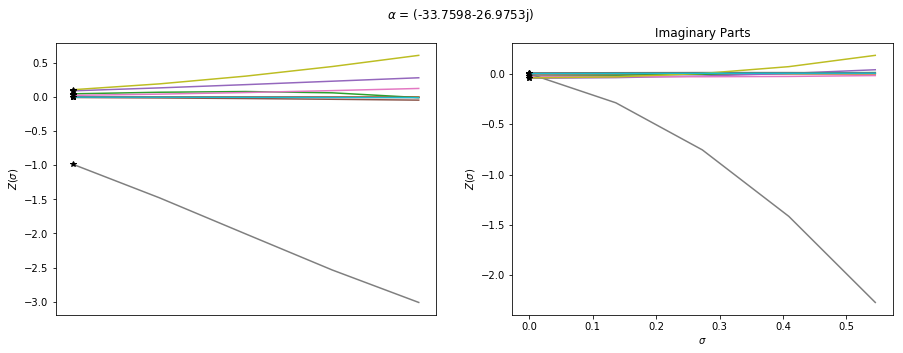

4.8016118828e-14
(-9.15087938574-40.6413503227j)


### $\lambda$ = 30j

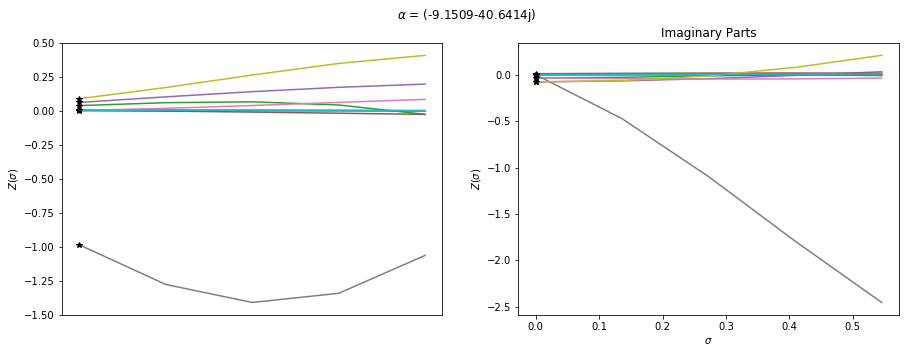

In [226]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,5)
lam_bounds = list(range(10,31,2))

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

for ind in range(len(lam_bounds)):
    lam_bound = lam_bounds[ind]
    display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
    for theta_val in theta_vals:
        lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

        A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
        df = e_vals + sigma*(e_min - e_vals)/sm

        to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
        display(Markdown('### $\lambda$ = {}'.format(to_disp)))

        sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
        sys_.createSys()

        sigs = np.linspace(sp,sm,5)
        W_ = np.zeros((10,len(sigs)), dtype=np.complex)
        for p,sig in enumerate(sigs):
            w_val = sys_.evalW(sig)
            W_[:,p] = w_val

        rp = round(e_vals.real,4)
        ip = round(e_vals.imag,4)
        eval = rp+ip*1j

        plt.subplot(121)
        for p in range(len(W_[:,0])):
            plt.plot(sigs[:], -W_[p][:].real,label=p+1)
            plt.plot(0,-e_vecs[p].real,'*k')

        plt.suptitle('Real Parts')
        plt.ylabel(r'$Z(\sigma)$')
        plt.xticks([], [])

        plt.subplot(122)
        for p in range(len(W_[:,0])):
            plt.plot(sigs[:], -W_[p][:].imag,label=p+1)
            plt.plot(0,-e_vecs[p].imag,'*k')
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$Z(\sigma)$')
        plt.title('Imaginary Parts')

        plt.suptitle(r'$\alpha$ = {}'.format(eval))
        plt.show()

In [230]:
np.linalg.eig(np.array([[-10,10,0],[1,-1,6*np.sqrt(2)],[-6*np.sqrt(2),-6*np.sqrt(2),-8/3]]))[0]

array([-13.85457791 +0.j        ,   0.09395562+10.19450522j,
         0.09395562-10.19450522j])

In [232]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,5)
lam_bounds = list(range(10,101,5))

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

real_results = np.zeros((5,len(lam_bounds)))
imag_results = np.zeros((5,len(lam_bounds)))

j = -1
for ind in range(len(lam_bounds)):
    j += 1
    lam_bound = lam_bounds[ind]
    display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
    i = 0
    for theta_val in theta_vals:
        lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

        A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
        df = e_vals + sigma*(e_min - e_vals)/sm

        to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
        display(Markdown('### $\lambda$ = {}'.format(to_disp)))

        sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
        sys_.createSys()

        #sigs = np.linspace(sp,sm,5)
        w_val = sys_.evalW(sm)
        #W_ = np.zeros((10,1), dtype=np.complex)
        #for p,sig in enumerate(sigs):
        #    w_val = sys_.evalW(sig)
        #    W_[:,p] = w_val
        w_real = [np.abs(w_val[i].real) for i in range(10)]
        print(np.max(w_real))
        
        real_results[i,j] = np.max(w_real)

        """rp = round(e_vals.real,4)
        ip = round(e_vals.imag,4)
        eval = rp+ip*1j

        plt.subplot(121)
        for p in range(len(W_[:,0])):
            plt.plot(sigs[:], -W_[p][:].real,label=p+1)
            plt.plot(0,-e_vecs[p].real,'*k')

        plt.suptitle('Real Parts')
        plt.ylabel(r'$Z(\sigma)$')
        plt.xticks([], [])

        plt.subplot(122)
        for p in range(len(W_[:,0])):
            plt.plot(sigs[:], -W_[p][:].imag,label=p+1)
            plt.plot(0,-e_vecs[p].imag,'*k')
        plt.xlabel(r'$\sigma$')
        plt.ylabel(r'$Z(\sigma)$')
        plt.title('Imaginary Parts')

        plt.suptitle(r'$\alpha$ = {}'.format(eval))
        plt.show()"""
        
        w_imag = [np.abs(w_val[i].imag) for i in range(10)]
        print(np.max(w_imag))
        
        imag_results[i,j] = np.max(w_imag)
        
        i+=1

# $\Lambda$ = 10

### $\lambda$ = -10j

1.15448442262
1.14187046782


### $\lambda$ = (7.0711-7.0711j)

1.68261865347
0.765990621342


### $\lambda$ = (10+0j)

1.93796526343
0.0


### $\lambda$ = (7.0711+7.0711j)

1.68261865347
0.765990621342


### $\lambda$ = 10j

1.15448442262
1.14187046782


# $\Lambda$ = 15

### $\lambda$ = -15j

1.23457488582
1.49331890435


### $\lambda$ = (10.6066-10.6066j)

2.07023219945
1.09255058787


### $\lambda$ = (15+0j)

2.50839500484
2.94413255188e-16


### $\lambda$ = (10.6066+10.6066j)

2.07023219945
1.09255058787


### $\lambda$ = 15j

1.23457488582
1.49331890435


# $\Lambda$ = 20

### $\lambda$ = -20j

1.23691857101
1.82624808054


### $\lambda$ = (14.1421-14.1421j)

2.40884030001
1.44995336208


### $\lambda$ = (20+0j)

3.06773663986
4.73761944597e-16


### $\lambda$ = (14.1421+14.1421j)

2.40884030001
1.44995336208


### $\lambda$ = 20j

1.23691857101
1.82624808054


# $\Lambda$ = 25

### $\lambda$ = -25j

1.17803119394
2.14563281312


### $\lambda$ = (17.6777-17.6777j)

2.71954407306
1.84168271771


### $\lambda$ = (25+0j)

3.63869996891
1.3267320766e-23


### $\lambda$ = (17.6777+17.6777j)

2.71954407306
1.84168271771


### $\lambda$ = 25j

1.17803119394
2.14563281312


# $\Lambda$ = 30

### $\lambda$ = -30j

1.06472587952
2.45434687574


### $\lambda$ = (21.2132-21.2132j)

3.01157845585
2.26967866518


### $\lambda$ = (30+0j)

4.2314469887
0.0


### $\lambda$ = (21.2132+21.2132j)

3.01157845585
2.26967866518


### $\lambda$ = 30j

1.06472587952
2.45434687574


# $\Lambda$ = 35

### $\lambda$ = -35j

0.900501724834
2.75426174442


### $\lambda$ = (24.7487-24.7487j)

3.28991002729
2.73520346103


### $\lambda$ = (35+0j)

4.85153885371
1.04728715422e-23


### $\lambda$ = (24.7487+24.7487j)

3.28991002729
2.73520346103


### $\lambda$ = 35j

0.900501724834
2.75426174442


# $\Lambda$ = 40

### $\lambda$ = -40j

0.687403469204
3.04668543249


### $\lambda$ = (28.2843-28.2843j)

3.55756397026
3.2391493723


### $\lambda$ = (40+0j)

5.50241478174
0.0


### $\lambda$ = (28.2843+28.2843j)

3.55756397026
3.2391493723


### $\lambda$ = 40j

0.687403469204
3.04668543249


# $\Lambda$ = 45

### $\lambda$ = -45j

0.426731992149
3.33257890961


### $\lambda$ = (31.8198-31.8198j)

3.81654351099
3.78218227386


### $\lambda$ = (45+0j)

6.18638420186
0.0


### $\lambda$ = (31.8198+31.8198j)

3.81654351099
3.78218227386


### $\lambda$ = 45j

0.426731992149
3.33257890961


# $\Lambda$ = 50

### $\lambda$ = -50j

0.343647749131
3.61267541218


### $\lambda$ = (35.3553-35.3553j)

4.0682571135
4.36481895869


### $\lambda$ = (50+0j)

6.90509240547
8.14963587792e-23


### $\lambda$ = (35.3553+35.3553j)

4.0682571135
4.36481895869


### $\lambda$ = 50j

0.343647749131
3.61267541218


# $\Lambda$ = 55

### $\lambda$ = -55j

0.325280276577
3.88755137358


### $\lambda$ = (38.8909-38.8909j)

4.31374075009
4.98747272725


### $\lambda$ = (55+0j)

7.65976490081
0.0


### $\lambda$ = (38.8909+38.8909j)

4.31374075009
4.98747272725


### $\lambda$ = 55j

0.325280276577
3.88755137358


# $\Lambda$ = 60

### $\lambda$ = -60j

0.633132374757
4.15767105922


### $\lambda$ = (42.4264-42.4264j)

4.55378366645
5.6504820729


### $\lambda$ = (60+0j)

8.45134672536
7.38672696766e-23


### $\lambda$ = (42.4264+42.4264j)

4.55378366645
5.6504820729


### $\lambda$ = 60j

0.633132374757
4.15767105922


# $\Lambda$ = 65

### $\lambda$ = -65j

1.0774703895
4.42341595272


### $\lambda$ = (45.9619-45.9619j)

4.78900430262
6.35412964644


### $\lambda$ = (65+0j)

9.28058713295
0.0


### $\lambda$ = (45.9619+45.9619j)

4.78900430262
6.35412964644


### $\lambda$ = 65j

1.0774703895
4.42341595272


# $\Lambda$ = 70

### $\lambda$ = -70j

1.56682561844
4.68510483273


### $\lambda$ = (49.4975-49.4975j)

5.01989854944
7.09865529819


### $\lambda$ = (70+0j)

10.1480937761
0.0


### $\lambda$ = (49.4975+49.4975j)

5.01989854944
7.09865529819


### $\lambda$ = 70j

1.56682561844
4.68510483273


# $\Lambda$ = 75

### $\lambda$ = -75j

2.10099355399
4.94300792195


### $\lambda$ = (53.033-53.033j)

5.24687173841
7.88426534183


### $\lambda$ = (75+0j)

11.0543688498
0.0


### $\lambda$ = (53.033+53.033j)

5.24687173841
7.88426534183


### $\lambda$ = 75j

2.10099355399
4.94300792195


# $\Lambda$ = 80

### $\lambda$ = -80j

2.67981196998
5.19735712546


### $\lambda$ = (56.5685-56.5685j)

5.47026060231
8.71113931564


### $\lambda$ = (80+0j)

11.9998340543
0.0


### $\lambda$ = (56.5685+56.5685j)

5.47026060231
8.71113931564


### $\lambda$ = 80j

2.67981196998
5.19735712546


# $\Lambda$ = 85

### $\lambda$ = -85j

3.30315057038
5.44835360996


### $\lambda$ = (60.1041-60.1041j)

5.69034880289
9.57943503256


### $\lambda$ = (85+0j)

12.9848483496
3.57547804832e-22


### $\lambda$ = (60.1041+60.1041j)

5.69034880289
9.57943503256


### $\lambda$ = 85j

3.30315057038
5.44835360996


# $\Lambda$ = 90

### $\lambda$ = -90j

3.97090360428
5.69617352706


### $\lambda$ = (63.6396-63.6396j)

5.90737819068
10.4892924283


### $\lambda$ = (90+0j)

14.0097209042
0.0


### $\lambda$ = (63.6396+63.6396j)

5.90737819068
10.4892924283


### $\lambda$ = 90j

3.97090360428
5.69617352706


# $\Lambda$ = 95

### $\lambda$ = -95j

4.68298448165
5.94097241119


### $\lambda$ = (67.1751-67.1751j)

6.12155715068
11.4408365452


### $\lambda$ = (95+0j)

15.0747207472
6.07392738332e-22


### $\lambda$ = (67.1751+67.1751j)

6.12155715068
11.4408365452


### $\lambda$ = 95j

4.68298448165
5.94097241119


# $\Lambda$ = 100

### $\lambda$ = -100j

5.43932177258
6.18288861168


### $\lambda$ = (70.7107-70.7107j)

6.33306690739
12.434179882


### $\lambda$ = (100+0j)

16.1800840999
4.50165772679e-22


### $\lambda$ = (70.7107+70.7107j)

6.33306690739
12.434179882


### $\lambda$ = 100j

5.43932177258
6.18288861168


In [242]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,5)
lam_bounds = list(range(10,501,5))

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

real_results = np.zeros((5,len(lam_bounds)))
imag_results = np.zeros((5,len(lam_bounds)))

j = -1
for ind in range(len(lam_bounds)):
    j += 1
    lam_bound = lam_bounds[ind]
    display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
    i = 0
    for theta_val in theta_vals:
        lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

        A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
        df = e_vals + sigma*(e_min - e_vals)/sm

        to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
        display(Markdown('### $\lambda$ = {}'.format(to_disp)))

        sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
        sys_.createSys()

        #sigs = np.linspace(sp,sm,5)
        w_val = sys_.evalW(sm)
        #W_ = np.zeros((10,1), dtype=np.complex)
        #for p,sig in enumerate(sigs):
        #    w_val = sys_.evalW(sig)
        #    W_[:,p] = w_val
        w_real = [np.abs(w_val[i].real) for i in range(10)]
        print(np.max(w_real))
        real_results[i,j] = np.max(w_real)
        
        w_imag = [np.abs(w_val[i].imag) for i in range(10)]
        print(np.max(w_imag))        
        imag_results[i,j] = np.max(w_imag)
        
        i+=1

# $\Lambda$ = 10

### $\lambda$ = -10j

1.15448442262
1.14187046782


### $\lambda$ = (7.0711-7.0711j)

1.68261865347
0.765990621342


### $\lambda$ = (10+0j)

1.93796526343
0.0


### $\lambda$ = (7.0711+7.0711j)

1.68261865347
0.765990621342


### $\lambda$ = 10j

1.15448442262
1.14187046782


# $\Lambda$ = 15

### $\lambda$ = -15j

1.23457488582
1.49331890435


### $\lambda$ = (10.6066-10.6066j)

2.07023219945
1.09255058787


### $\lambda$ = (15+0j)

2.50839500484
2.94413255188e-16


### $\lambda$ = (10.6066+10.6066j)

2.07023219945
1.09255058787


### $\lambda$ = 15j

1.23457488582
1.49331890435


# $\Lambda$ = 20

### $\lambda$ = -20j

1.23691857101
1.82624808054


### $\lambda$ = (14.1421-14.1421j)

2.40884030001
1.44995336208


### $\lambda$ = (20+0j)

3.06773663986
4.73761944597e-16


### $\lambda$ = (14.1421+14.1421j)

2.40884030001
1.44995336208


### $\lambda$ = 20j

1.23691857101
1.82624808054


# $\Lambda$ = 25

### $\lambda$ = -25j

1.17803119394
2.14563281312


### $\lambda$ = (17.6777-17.6777j)

2.71954407306
1.84168271771


### $\lambda$ = (25+0j)

3.63869996891
1.3267320766e-23


### $\lambda$ = (17.6777+17.6777j)

2.71954407306
1.84168271771


### $\lambda$ = 25j

1.17803119394
2.14563281312


# $\Lambda$ = 30

### $\lambda$ = -30j

1.06472587952
2.45434687574


### $\lambda$ = (21.2132-21.2132j)

3.01157845585
2.26967866518


### $\lambda$ = (30+0j)

4.2314469887
0.0


### $\lambda$ = (21.2132+21.2132j)

3.01157845585
2.26967866518


### $\lambda$ = 30j

1.06472587952
2.45434687574


# $\Lambda$ = 35

### $\lambda$ = -35j

0.900501724834
2.75426174442


### $\lambda$ = (24.7487-24.7487j)

3.28991002729
2.73520346103


### $\lambda$ = (35+0j)

4.85153885371
1.04728715422e-23


### $\lambda$ = (24.7487+24.7487j)

3.28991002729
2.73520346103


### $\lambda$ = 35j

0.900501724834
2.75426174442


# $\Lambda$ = 40

### $\lambda$ = -40j

0.687403469204
3.04668543249


### $\lambda$ = (28.2843-28.2843j)

3.55756397026
3.2391493723


### $\lambda$ = (40+0j)

5.50241478174
0.0


### $\lambda$ = (28.2843+28.2843j)

3.55756397026
3.2391493723


### $\lambda$ = 40j

0.687403469204
3.04668543249


# $\Lambda$ = 45

### $\lambda$ = -45j

0.426731992149
3.33257890961


### $\lambda$ = (31.8198-31.8198j)

3.81654351099
3.78218227386


### $\lambda$ = (45+0j)

6.18638420186
0.0


### $\lambda$ = (31.8198+31.8198j)

3.81654351099
3.78218227386


### $\lambda$ = 45j

0.426731992149
3.33257890961


# $\Lambda$ = 50

### $\lambda$ = -50j

0.343647749131
3.61267541218


### $\lambda$ = (35.3553-35.3553j)

4.0682571135
4.36481895869


### $\lambda$ = (50+0j)

6.90509240547
8.14963587792e-23


### $\lambda$ = (35.3553+35.3553j)

4.0682571135
4.36481895869


### $\lambda$ = 50j

0.343647749131
3.61267541218


# $\Lambda$ = 55

### $\lambda$ = -55j

0.325280276577
3.88755137358


### $\lambda$ = (38.8909-38.8909j)

4.31374075009
4.98747272725


### $\lambda$ = (55+0j)

7.65976490081
0.0


### $\lambda$ = (38.8909+38.8909j)

4.31374075009
4.98747272725


### $\lambda$ = 55j

0.325280276577
3.88755137358


# $\Lambda$ = 60

### $\lambda$ = -60j

0.633132374757
4.15767105922


### $\lambda$ = (42.4264-42.4264j)

4.55378366645
5.6504820729


### $\lambda$ = (60+0j)

8.45134672536
7.38672696766e-23


### $\lambda$ = (42.4264+42.4264j)

4.55378366645
5.6504820729


### $\lambda$ = 60j

0.633132374757
4.15767105922


# $\Lambda$ = 65

### $\lambda$ = -65j

1.0774703895
4.42341595272


### $\lambda$ = (45.9619-45.9619j)

4.78900430262
6.35412964644


### $\lambda$ = (65+0j)

9.28058713295
0.0


### $\lambda$ = (45.9619+45.9619j)

4.78900430262
6.35412964644


### $\lambda$ = 65j

1.0774703895
4.42341595272


# $\Lambda$ = 70

### $\lambda$ = -70j

1.56682561844
4.68510483273


### $\lambda$ = (49.4975-49.4975j)

5.01989854944
7.09865529819


### $\lambda$ = (70+0j)

10.1480937761
0.0


### $\lambda$ = (49.4975+49.4975j)

5.01989854944
7.09865529819


### $\lambda$ = 70j

1.56682561844
4.68510483273


# $\Lambda$ = 75

### $\lambda$ = -75j

2.10099355399
4.94300792195


### $\lambda$ = (53.033-53.033j)

5.24687173841
7.88426534183


### $\lambda$ = (75+0j)

11.0543688498
0.0


### $\lambda$ = (53.033+53.033j)

5.24687173841
7.88426534183


### $\lambda$ = 75j

2.10099355399
4.94300792195


# $\Lambda$ = 80

### $\lambda$ = -80j

2.67981196998
5.19735712546


### $\lambda$ = (56.5685-56.5685j)

5.47026060231
8.71113931564


### $\lambda$ = (80+0j)

11.9998340543
0.0


### $\lambda$ = (56.5685+56.5685j)

5.47026060231
8.71113931564


### $\lambda$ = 80j

2.67981196998
5.19735712546


# $\Lambda$ = 85

### $\lambda$ = -85j

3.30315057038
5.44835360996


### $\lambda$ = (60.1041-60.1041j)

5.69034880289
9.57943503256


### $\lambda$ = (85+0j)

12.9848483496
3.57547804832e-22


### $\lambda$ = (60.1041+60.1041j)

5.69034880289
9.57943503256


### $\lambda$ = 85j

3.30315057038
5.44835360996


# $\Lambda$ = 90

### $\lambda$ = -90j

3.97090360428
5.69617352706


### $\lambda$ = (63.6396-63.6396j)

5.90737819068
10.4892924283


### $\lambda$ = (90+0j)

14.0097209042
0.0


### $\lambda$ = (63.6396+63.6396j)

5.90737819068
10.4892924283


### $\lambda$ = 90j

3.97090360428
5.69617352706


# $\Lambda$ = 95

### $\lambda$ = -95j

4.68298448165
5.94097241119


### $\lambda$ = (67.1751-67.1751j)

6.12155715068
11.4408365452


### $\lambda$ = (95+0j)

15.0747207472
6.07392738332e-22


### $\lambda$ = (67.1751+67.1751j)

6.12155715068
11.4408365452


### $\lambda$ = 95j

4.68298448165
5.94097241119


# $\Lambda$ = 100

### $\lambda$ = -100j

5.43932177258
6.18288861168


### $\lambda$ = (70.7107-70.7107j)

6.33306690739
12.434179882


### $\lambda$ = (100+0j)

16.1800840999
4.50165772679e-22


### $\lambda$ = (70.7107+70.7107j)

6.33306690739
12.434179882


### $\lambda$ = 100j

5.43932177258
6.18288861168


# $\Lambda$ = 105

### $\lambda$ = -105j

6.2398561848
6.42204600846


### $\lambda$ = (74.2462-74.2462j)

6.5420663692
13.469424269


### $\lambda$ = (105+0j)

17.3260200408
0.0


### $\lambda$ = (74.2462+74.2462j)

6.5420663692
13.469424269


### $\lambda$ = 105j

6.2398561848
6.42204600846


# $\Lambda$ = 110

### $\lambda$ = -110j

7.08453824617
6.65855618757


### $\lambda$ = (77.7817-77.7817j)

6.74869590659
14.5466623843


### $\lambda$ = (110+0j)

18.5127149468
0.0


### $\lambda$ = (77.7817+77.7817j)

6.74869590659
14.5466623843


### $\lambda$ = 110j

7.08453824617
6.65855618757


# $\Lambda$ = 115

### $\lambda$ = -115j

7.97332650437
6.89252020362


### $\lambda$ = (81.3173-81.3173j)

6.95308033839
15.6659789912


### $\lambda$ = (115+0j)

19.7403360228
1.26643555069e-21


### $\lambda$ = (81.3173+81.3173j)

6.95308033839
15.6659789912


### $\lambda$ = 115j

7.97332650437
6.89252020362


# $\Lambda$ = 120

### $\lambda$ = -120j

8.90618611161
7.12403002209


### $\lambda$ = (84.8528-84.8528j)

7.15533132092
16.8274519607


### $\lambda$ = (120+0j)

21.0090341398
0.0


### $\lambda$ = (84.8528+84.8528j)

7.15533132092
16.8274519607


### $\lambda$ = 120j

8.90618611161
7.12403002209


# $\Lambda$ = 125

### $\lambda$ = -125j

9.88308770019
7.3531697108


### $\lambda$ = (88.3883-88.3883j)

7.35554928001
18.0311531219


### $\lambda$ = (125+0j)

22.318946142
0.0


### $\lambda$ = (88.3883+88.3883j)

7.35554928001
18.0311531219


### $\lambda$ = 125j

9.88308770019
7.3531697108


# $\Lambda$ = 130

### $\lambda$ = -130j

10.9040064804
7.58001643221


### $\lambda$ = (91.9239-91.9239j)

7.55382498912
19.2771489763


### $\lambda$ = (130+0j)

23.6701967409
0.0


### $\lambda$ = (91.9239+91.9239j)

7.55382498912
19.2771489763


### $\lambda$ = 130j

10.9040064804
7.58001643221


# $\Lambda$ = 135

### $\lambda$ = -135j

11.9689215105
7.80464127644


### $\lambda$ = (95.4594-95.4594j)

7.75024086998
20.5655013019


### $\lambda$ = (135+0j)

25.0629000849
0.0


### $\lambda$ = (95.4594+95.4594j)

7.75024086998
20.5655013019


### $\lambda$ = 135j

11.9689215105
7.80464127644


# $\Lambda$ = 140

### $\lambda$ = -140j

13.0778151013
8.02710996578


### $\lambda$ = (98.9949-98.9949j)

7.94487207341
21.896267668


### $\lambda$ = (140+0j)

26.4971610688
8.08067068079e-22


### $\lambda$ = (98.9949+98.9949j)

7.94487207341
21.896267668


### $\lambda$ = 140j

13.0778151013
8.02710996578


# $\Lambda$ = 145

### $\lambda$ = -145j

14.2306723266
8.24748345398


### $\lambda$ = (102.5305-102.5305j)

8.13778738431
23.2695018766


### $\lambda$ = (145+0j)

27.9730764369
8.21082028563e-22


### $\lambda$ = (102.5305+102.5305j)

8.13778738431
23.2695018766


### $\lambda$ = 145j

14.2306723266
8.24748345398


# $\Lambda$ = 150

### $\lambda$ = -150j

15.4274806181
8.46581843977


### $\lambda$ = (106.066-106.066j)

8.32904998495
24.6852543424


### $\lambda$ = (150+0j)

29.4907357174
5.46469894411e-23


### $\lambda$ = (106.066+106.066j)

8.32904998495
24.6852543424


### $\lambda$ = 150j

15.4274806181
8.46581843977


# $\Lambda$ = 155

### $\lambda$ = -155j

16.6682294284
8.68216780888


### $\lambda$ = (109.6016-109.6016j)

8.51871810263
26.1435724231


### $\lambda$ = (155+0j)

31.0502220188
0.0


### $\lambda$ = (109.6016+109.6016j)

8.51871810263
26.1435724231


### $\lambda$ = 155j

16.6682294284
8.68216780888


# $\Lambda$ = 160

### $\lambda$ = -160j

17.9529099488
8.89658101681


### $\lambda$ = (113.1371-113.1371j)

8.70684556266
27.6445007071


### $\lambda$ = (160+0j)

32.6516127139
0.0


### $\lambda$ = (113.1371+113.1371j)

8.70684556266
27.6445007071


### $\lambda$ = 160j

17.9529099488
8.89658101681


# $\Lambda$ = 165

### $\lambda$ = -165j

19.2815148711
9.10910442188


### $\lambda$ = (116.6726-116.6726j)

8.89348226345
29.188081265


### $\lambda$ = (165+0j)

34.2949800291
0.0


### $\lambda$ = (116.6726+116.6726j)

8.89348226345
29.188081265


### $\lambda$ = 165j

19.2815148711
9.10910442188


# $\Lambda$ = 170

### $\lambda$ = -170j

20.654038187
9.31978157632


### $\lambda$ = (120.2082-120.2082j)

9.07867458626
30.7743538715


### $\lambda$ = (170+0j)

35.9803915562
0.0


### $\lambda$ = (120.2082+120.2082j)

9.07867458626
30.7743538715


### $\lambda$ = 170j

20.654038187
9.31978157632


# $\Lambda$ = 175

### $\lambda$ = -175j

22.070475017
9.5286534819


### $\lambda$ = (123.7437-123.7437j)

9.26246575088
32.4033562009


### $\lambda$ = (175+0j)

37.7079106979
0.0


### $\lambda$ = (123.7437+123.7437j)

9.26246575088
32.4033562009


### $\lambda$ = 175j

22.070475017
9.5286534819


# $\Lambda$ = 180

### $\lambda$ = -180j

23.5308214643
9.73575881511


### $\lambda$ = (127.2792-127.2792j)

9.44489612531
34.0751240008


### $\lambda$ = (180+0j)

39.4775970575
0.0


### $\lambda$ = (127.2792+127.2792j)

9.44489612531
34.0751240008


### $\lambda$ = 180j

23.5308214643
9.73575881511


# $\Lambda$ = 185

### $\lambda$ = -185j

25.0350744899
9.94113412667


### $\lambda$ = (130.8148-130.8148j)

9.62600349709
35.7896912468


### $\lambda$ = (185+0j)

41.2895067821
0.0


### $\lambda$ = (130.8148+130.8148j)

9.62600349709
35.7896912468


### $\lambda$ = 185j

25.0350744899
9.94113412667


# $\Lambda$ = 190

### $\lambda$ = -190j

26.5832318049
10.1448140184


### $\lambda$ = (134.3503-134.3503j)

9.80582331134
37.5470902802


### $\lambda$ = (190+0j)

43.1436928656
0.0


### $\lambda$ = (134.3503+134.3503j)

9.80582331134
37.5470902802


### $\lambda$ = 190j

26.5832318049
10.1448140184


# $\Lambda$ = 195

### $\lambda$ = -195j

28.1752917779
10.3468313012


### $\lambda$ = (137.8858-137.8858j)

9.98438888108
39.3473519318


### $\lambda$ = (195+0j)

45.0402054158
0.0


### $\lambda$ = (137.8858+137.8858j)

9.98438888108
39.3473519318


### $\lambda$ = 195j

28.1752917779
10.3468313012


# $\Lambda$ = 200

### $\lambda$ = -200j

29.8112533542
10.5472171361


### $\lambda$ = (141.4214-141.4214j)

10.1617315731
41.1905056332


### $\lambda$ = (200+0j)

46.9790918937
0.0


### $\lambda$ = (141.4214+141.4214j)

10.1617315731
41.1905056332


### $\lambda$ = 200j

29.8112533542
10.5472171361


# $\Lambda$ = 205

### $\lambda$ = -205j

31.4911159859
10.7460011604


### $\lambda$ = (144.9569-144.9569j)

10.3378809733
43.0765795171


### $\lambda$ = (205+0j)

48.9603973253
0.0


### $\lambda$ = (144.9569+144.9569j)

10.3378809733
43.0765795171


### $\lambda$ = 205j

31.4911159859
10.7460011604


# $\Lambda$ = 210

### $\lambda$ = -210j

33.2148795711
10.9432116018


### $\lambda$ = (148.4924-148.4924j)

10.5128650339
45.005600508


### $\lambda$ = (210+0j)

50.9841644926
0.0


### $\lambda$ = (148.4924+148.4924j)

10.5128650339
45.005600508


### $\lambda$ = 210j

33.2148795711
10.9432116018


# $\Lambda$ = 215

### $\lambda$ = -215j

34.9825444008
11.1388753814


### $\lambda$ = (152.028-152.028j)

10.6867102051
46.9775944038


### $\lambda$ = (215+0j)

53.0504341038
0.0


### $\lambda$ = (152.028+152.028j)

10.6867102051
46.9775944038


### $\lambda$ = 215j

34.9825444008
11.1388753814


# $\Lambda$ = 220

### $\lambda$ = -220j

36.7941111122
11.3330182055


### $\lambda$ = (155.5635-155.5635j)

10.8594415528
48.9925859515


### $\lambda$ = (220+0j)

55.1592449474
0.0


### $\lambda$ = (155.5635+155.5635j)

10.8594415528
48.9925859515


### $\lambda$ = 220j

36.7941111122
11.3330182055


# $\Lambda$ = 225

### $\lambda$ = -225j

38.6495806474
11.5256646503


### $\lambda$ = (159.099-159.099j)

11.0310828651
51.0505989143


### $\lambda$ = (225+0j)

57.3106340307
1.62637789785e-22


### $\lambda$ = (159.099+159.099j)

11.0310828651
51.0505989143


### $\lambda$ = 225j

38.6495806474
11.5256646503


# $\Lambda$ = 230

### $\lambda$ = -230j

40.5489542181
11.7168382386


### $\lambda$ = (162.6346-162.6346j)

11.2016567476
53.1516561344


### $\lambda$ = (230+0j)

59.5046367056
0.0


### $\lambda$ = (162.6346+162.6346j)

11.2016567476
53.1516561344


### $\lambda$ = 230j

40.5489542181
11.7168382386


# $\Lambda$ = 235

### $\lambda$ = -235j

42.4922332729
11.9065615087


### $\lambda$ = (166.1701-166.1701j)

11.3711847097
55.2957795893


### $\lambda$ = (235+0j)

61.741286782
0.0


### $\lambda$ = (166.1701+166.1701j)

11.3711847097
55.2957795893


### $\lambda$ = 235j

42.4922332729
11.9065615087


# $\Lambda$ = 240

### $\lambda$ = -240j

44.4794194702
12.0948560788


### $\lambda$ = (169.7056-169.7056j)

11.5396872429
57.4829904444


### $\lambda$ = (240+0j)

64.0206166321
0.0


### $\lambda$ = (169.7056+169.7056j)

11.5396872429
57.4829904444


### $\lambda$ = 240j

44.4794194702
12.0948560788


# $\Lambda$ = 245

### $\lambda$ = -245j

46.5105146528
12.281742704


### $\lambda$ = (173.2412-173.2412j)

11.707183892
59.7133091007


### $\lambda$ = (245+0j)

66.3426572841
0.0


### $\lambda$ = (173.2412+173.2412j)

11.707183892
59.7133091007


### $\lambda$ = 245j

46.5105146528
12.281742704


# $\Lambda$ = 250

### $\lambda$ = -250j

48.5855208256
12.4672413308


### $\lambda$ = (176.7767-176.7767j)

11.8736933195
61.9867552385


### $\lambda$ = (250+0j)

68.7074385085
0.0


### $\lambda$ = (176.7767+176.7767j)

11.8736933195
61.9867552385


### $\lambda$ = 250j

48.5855208256
12.4672413308


# $\Lambda$ = 255

### $\lambda$ = -255j

50.7044401368
12.6513711449


### $\lambda$ = (180.3122-180.3122j)

12.0392333646
64.303347859


### $\lambda$ = (255+0j)

71.1149888975
3.98399861903e-21


### $\lambda$ = (180.3122+180.3122j)

12.0392333646
64.303347859


### $\lambda$ = 255j

50.7044401368
12.6513711449


# $\Lambda$ = 260

### $\lambda$ = -260j

52.8672748599
12.8341506171


### $\lambda$ = (183.8478-183.8478j)

12.203821097
66.6631053208


### $\lambda$ = (260+0j)

73.565335937
0.0


### $\lambda$ = (183.8478+183.8478j)

12.203821097
66.6631053208


### $\lambda$ = 260j

52.8672748599
12.8341506171


# $\Lambda$ = 265

### $\lambda$ = -265j

55.0740273783
13.0155975438


### $\lambda$ = (187.3833-187.3833j)

12.3674728658
69.0660453753


### $\lambda$ = (265+0j)

76.0585060727
0.0


### $\lambda$ = (187.3833+187.3833j)

12.3674728658
69.0660453753


### $\lambda$ = 265j

55.0740273783
13.0155975438


# $\Lambda$ = 270

### $\lambda$ = -270j

57.3247001714
13.1957290864


### $\lambda$ = (190.9188-190.9188j)

12.5302043449
71.5121851993


### $\lambda$ = (270+0j)

78.5945247718
0.0


### $\lambda$ = (190.9188+190.9188j)

12.5302043449
71.5121851993


### $\lambda$ = 270j

57.3247001714
13.1957290864


# $\Lambda$ = 275

### $\lambda$ = -275j

59.6192958027
13.3745618054


### $\lambda$ = (194.4544-194.4544j)

12.6920305751
74.001541423


### $\lambda$ = (275+0j)

81.1734165788
0.0


### $\lambda$ = (194.4544+194.4544j)

12.6920305751
74.001541423


### $\lambda$ = 275j

59.6192958027
13.3745618054


# $\Lambda$ = 280

### $\lambda$ = -280j

61.957816908
13.5521116939


### $\lambda$ = (197.9899-197.9899j)

12.8529660014
76.5341301604


### $\lambda$ = (280+0j)

83.7952051686
0.0


### $\lambda$ = (197.9899+197.9899j)

12.8529660014
76.5341301604


### $\lambda$ = 280j

61.957816908
13.5521116939


# $\Lambda$ = 285

### $\lambda$ = -285j

64.3402661861
13.7283942085


### $\lambda$ = (201.5254-201.5254j)

13.013024508
79.1099670333


### $\lambda$ = (285+0j)

86.459913393
0.0


### $\lambda$ = (201.5254+201.5254j)

13.013024508
79.1099670333


### $\lambda$ = 285j

64.3402661861
13.7283942085


# $\Lambda$ = 290

### $\lambda$ = -290j

66.7666463899
13.9034242959


### $\lambda$ = (205.061-205.061j)

13.1722194519
81.7290671962


### $\lambda$ = (290+0j)

89.167563327
0.0


### $\lambda$ = (205.061+205.061j)

13.1722194519
81.7290671962


### $\lambda$ = 290j

66.7666463899
13.9034242959


# $\Lambda$ = 295

### $\lambda$ = -295j

69.2369603181
14.0772164208


### $\lambda$ = (208.5965-208.5965j)

13.3305636917
84.3914453584


### $\lambda$ = (295+0j)

91.9181763093
0.0


### $\lambda$ = (208.5965+208.5965j)

13.3305636917
84.3914453584


### $\lambda$ = 295j

69.2369603181
14.0772164208


# $\Lambda$ = 300

### $\lambda$ = -300j

71.7512108081
14.2497845891


### $\lambda$ = (212.132-212.132j)

13.4880696163
87.0971158059


### $\lambda$ = (300+0j)

94.7117729804
0.0


### $\lambda$ = (212.132+212.132j)

13.4880696163
87.0971158059


### $\lambda$ = 300j

71.7512108081
14.2497845891


# $\Lambda$ = 305

### $\lambda$ = -305j

74.3094007303
14.4211423717


### $\lambda$ = (215.6676-215.6676j)

13.6447491702
89.8460924197


### $\lambda$ = (305+0j)

97.5483733194
5.15130456302e-21


### $\lambda$ = (215.6676+215.6676j)

13.6447491702
89.8460924197


### $\lambda$ = 305j

74.3094007303
14.4211423717


# $\Lambda$ = 310

### $\lambda$ = -310j

76.9115329816
14.5913029245


### $\lambda$ = (219.2031-219.2031j)

13.8006138773
92.6383886953


### $\lambda$ = (310+0j)

100.427996676
0.0


### $\lambda$ = (219.2031+219.2031j)

13.8006138773
92.6383886953


### $\lambda$ = 310j

76.9115329816
14.5913029245


# $\Lambda$ = 315

### $\lambda$ = -315j

79.5576104805
14.7602790103


### $\lambda$ = (222.7386-222.7386j)

13.9556748634
95.4740177599


### $\lambda$ = (315+0j)

103.350661804
8.2705923547e-21


### $\lambda$ = (222.7386+222.7386j)

13.9556748634
95.4740177599


### $\lambda$ = 315j

79.5576104805
14.7602790103


# $\Lambda$ = 320

### $\lambda$ = -320j

82.2476361621
14.9280830142


### $\lambda$ = (226.2742-226.2742j)

14.1099428773
98.3529923882


### $\lambda$ = (320+0j)

106.316386887
0.0


### $\lambda$ = (226.2742+226.2742j)

14.1099428773
98.3529923882


### $\lambda$ = 320j

82.2476361621
14.9280830142


# $\Lambda$ = 325

### $\lambda$ = -325j

84.9816129749
15.0947269643


### $\lambda$ = (229.8097-229.8097j)

14.2634283092
101.275325018


### $\lambda$ = (325+0j)

109.325189567
6.22740244889e-21


### $\lambda$ = (229.8097+229.8097j)

14.2634283092
101.275325018


### $\lambda$ = 325j

84.9816129749
15.0947269643


# $\Lambda$ = 330

### $\lambda$ = -330j

87.7595438761
15.2602225468


### $\lambda$ = (233.3452-233.3452j)

14.416141209
104.241027765


### $\lambda$ = (330+0j)

112.377086971
0.0


### $\lambda$ = (233.3452+233.3452j)

14.416141209
104.241027765


### $\lambda$ = 330j

87.7595438761
15.2602225468


# $\Lambda$ = 335

### $\lambda$ = -335j

90.5814318285
15.4245811203


### $\lambda$ = (236.8808-236.8808j)

14.5680913035
107.250112434


### $\lambda$ = (335+0j)

115.472095734
0.0


### $\lambda$ = (236.8808+236.8808j)

14.5680913035
107.250112434


### $\lambda$ = 335j

90.5814318285
15.4245811203


# $\Lambda$ = 340

### $\lambda$ = -340j

93.4472797975
15.5878137316


### $\lambda$ = (240.4163-240.4163j)

14.7192880121
110.302590536


### $\lambda$ = (340+0j)

118.61023202
0.0


### $\lambda$ = (240.4163+240.4163j)

14.7192880121
110.302590536


### $\lambda$ = 340j

93.4472797975
15.5878137316


# $\Lambda$ = 345

### $\lambda$ = -345j

96.3570907487
15.7499311289


### $\lambda$ = (243.9518-243.9518j)

14.8697404609
113.398473297


### $\lambda$ = (345+0j)

121.791511545
0.0


### $\lambda$ = (243.9518+243.9518j)

14.8697404609
113.398473297


### $\lambda$ = 345j

96.3570907487
15.7499311289


# $\Lambda$ = 350

### $\lambda$ = -350j

99.3108676448
15.9109437743


### $\lambda$ = (247.4874-247.4874j)

15.0194574969
116.537771668


### $\lambda$ = (350+0j)

125.015949594
0.0


### $\lambda$ = (247.4874+247.4874j)

15.0194574969
116.537771668


### $\lambda$ = 350j

99.3108676448
15.9109437743


# $\Lambda$ = 355

### $\lambda$ = -355j

102.308613444
16.0708618561


### $\lambda$ = (251.0229-251.0229j)

15.1684477014
119.720496342


### $\lambda$ = (355+0j)

128.283561045
0.0


### $\lambda$ = (251.0229+251.0229j)

15.1684477014
119.720496342


### $\lambda$ = 355j

102.308613444
16.0708618561


# $\Lambda$ = 360

### $\lambda$ = -360j

105.350331097
16.2296953


### $\lambda$ = (254.5584-254.5584j)

15.3167194011
122.946657755


### $\lambda$ = (360+0j)

131.594360379
0.0


### $\lambda$ = (254.5584+254.5584j)

15.3167194011
122.946657755


### $\lambda$ = 360j

105.350331097
16.2296953


# $\Lambda$ = 365

### $\lambda$ = -365j

108.436023547
16.3874537786


### $\lambda$ = (258.094-258.094j)

15.4642806806
126.216266104


### $\lambda$ = (365+0j)

134.948361703
0.0


### $\lambda$ = (258.094+258.094j)

15.4642806806
126.216266104


### $\lambda$ = 365j

108.436023547
16.3874537786


# $\Lambda$ = 370

### $\lambda$ = -370j

111.565693727
16.5441467264


### $\lambda$ = (261.6295-261.6295j)

15.6111393916
129.529331353


### $\lambda$ = (370+0j)

138.345578761
0.0


### $\lambda$ = (261.6295+261.6295j)

15.6111393916
129.529331353


### $\lambda$ = 370j

111.565693727
16.5441467264


# $\Lambda$ = 375

### $\lambda$ = -375j

114.739344558
16.6997833415


### $\lambda$ = (265.165-265.165j)

15.7573031668
132.88586324


### $\lambda$ = (375+0j)

141.78602495
0.0


### $\lambda$ = (265.165+265.165j)

15.7573031668
132.88586324


### $\lambda$ = 375j

114.739344558
16.6997833415


# $\Lambda$ = 380

### $\lambda$ = -380j

117.956978948
16.8543726012


### $\lambda$ = (268.7006-268.7006j)

15.9027794229
136.285871287


### $\lambda$ = (380+0j)

145.269713337
4.41116813703e-22


### $\lambda$ = (268.7006+268.7006j)

15.9027794229
136.285871287


### $\lambda$ = 380j

117.956978948
16.8543726012


# $\Lambda$ = 385

### $\lambda$ = -385j

121.218599792
17.0079232682


### $\lambda$ = (272.2361-272.2361j)

16.0475753754
139.729364807


### $\lambda$ = (385+0j)

148.796656669
0.0


### $\lambda$ = (272.2361+272.2361j)

16.0475753754
139.729364807


### $\lambda$ = 385j

121.218599792
17.0079232682


# $\Lambda$ = 390

### $\lambda$ = -390j

124.524209969
17.1604438993


### $\lambda$ = (275.7716-275.7716j)

16.1916980465
143.216352914


### $\lambda$ = (390+0j)

152.366867384
0.0


### $\lambda$ = (275.7716+275.7716j)

16.1916980465
143.216352914


### $\lambda$ = 390j

124.524209969
17.1604438993


# $\Lambda$ = 395

### $\lambda$ = -395j

127.873812342
17.3119428513


### $\lambda$ = (279.3072-279.3072j)

16.3351542691
146.746844526


### $\lambda$ = (395+0j)

155.980357626
1.03183226779e-21


### $\lambda$ = (279.3072+279.3072j)

16.3351542691
146.746844526


### $\lambda$ = 395j

127.873812342
17.3119428513


# $\Lambda$ = 400

### $\lambda$ = -400j

131.26740976
17.4624282911


### $\lambda$ = (282.8427-282.8427j)

16.4779506988
150.320848373


### $\lambda$ = (400+0j)

159.637139255
0.0


### $\lambda$ = (282.8427+282.8427j)

16.4779506988
150.320848373


### $\lambda$ = 400j

131.26740976
17.4624282911


# $\Lambda$ = 405

### $\lambda$ = -405j

134.705005052
17.6119082009


### $\lambda$ = (286.3782-286.3782j)

16.6200938181
153.938373007


### $\lambda$ = (405+0j)

163.337223857
0.0


### $\lambda$ = (286.3782+286.3782j)

16.6200938181
153.938373007


### $\lambda$ = 405j

134.705005052
17.6119082009


# $\Lambda$ = 410

### $\lambda$ = -410j

138.186601029
17.7603903852


### $\lambda$ = (289.9138-289.9138j)

16.7615899454
157.599426804


### $\lambda$ = (410+0j)

167.080622754
1.78620845079e-21


### $\lambda$ = (289.9138+289.9138j)

16.7615899454
157.599426804


### $\lambda$ = 410j

138.186601029
17.7603903852


# $\Lambda$ = 415

### $\lambda$ = -415j

141.712200485
17.9078824766


### $\lambda$ = (293.4493-293.4493j)

16.9024452401
161.304017969


### $\lambda$ = (415+0j)

170.867347017
4.96425977069e-21


### $\lambda$ = (293.4493+293.4493j)

16.9024452401
161.304017969


### $\lambda$ = 415j

141.712200485
17.9078824766


# $\Lambda$ = 420

### $\lambda$ = -420j

145.281806194
18.0543919435


### $\lambda$ = (296.9848-296.9848j)

17.042665709
165.052154545


### $\lambda$ = (420+0j)

174.697407468
0.0


### $\lambda$ = (296.9848+296.9848j)

17.042665709
165.052154545


### $\lambda$ = 420j

145.281806194
18.0543919435


# $\Lambda$ = 425

### $\lambda$ = -425j

148.89542091
18.1999260946


### $\lambda$ = (300.5204-300.5204j)

17.1822572126
168.843844418


### $\lambda$ = (425+0j)

178.570814696
0.0


### $\lambda$ = (300.5204+300.5204j)

17.1822572126
168.843844418


### $\lambda$ = 425j

148.89542091
18.1999260946


# $\Lambda$ = 430

### $\lambda$ = -430j

152.553047371
18.3444920831


### $\lambda$ = (304.0559-304.0559j)

17.3212254689
172.67909532


### $\lambda$ = (430+0j)

182.48757906
0.0


### $\lambda$ = (304.0559+304.0559j)

17.3212254689
172.67909532


### $\lambda$ = 430j

152.553047371
18.3444920831


# $\Lambda$ = 435

### $\lambda$ = -435j

156.25468829
18.488096915


### $\lambda$ = (307.5914-307.5914j)

17.4595760606
176.557914834


### $\lambda$ = (435+0j)

186.447710702
0.0


### $\lambda$ = (307.5914+307.5914j)

17.4595760606
176.557914834


### $\lambda$ = 435j

156.25468829
18.488096915


# $\Lambda$ = 440

### $\lambda$ = -440j

160.000346364
18.630747452


### $\lambda$ = (311.127-311.127j)

17.5973144404
180.480310401


### $\lambda$ = (440+0j)

190.451219547
0.0


### $\lambda$ = (311.127+311.127j)

17.5973144404
180.480310401


### $\lambda$ = 440j

160.000346364
18.630747452


# $\Lambda$ = 445

### $\lambda$ = -445j

163.790024265
18.7724504144


### $\lambda$ = (314.6625-314.6625j)

17.7344459338
184.446289321


### $\lambda$ = (445+0j)

194.49811532
9.32447100488e-21


### $\lambda$ = (314.6625+314.6625j)

17.7344459338
184.446289321


### $\lambda$ = 445j

163.790024265
18.7724504144


# $\Lambda$ = 450

### $\lambda$ = -450j

167.62372465
18.9132123905


### $\lambda$ = (318.1981-318.1981j)

17.8709757446
188.455858762


### $\lambda$ = (450+0j)

198.588407542
0.0


### $\lambda$ = (318.1981+318.1981j)

17.8709757446
188.455858762


### $\lambda$ = 450j

167.62372465
18.9132123905


# $\Lambda$ = 455

### $\lambda$ = -455j

171.50145015
19.0530398363


### $\lambda$ = (321.7336-321.7336j)

18.0069089569
192.509025759


### $\lambda$ = (455+0j)

202.722105546
6.05881375228e-21


### $\lambda$ = (321.7336+321.7336j)

18.0069089569
192.509025759


### $\lambda$ = 455j

171.50145015
19.0530398363


# $\Lambda$ = 460

### $\lambda$ = -460j

175.423203379
19.1919390842


### $\lambda$ = (325.2691-325.2691j)

18.1422505477
196.605797218


### $\lambda$ = (460+0j)

206.899218475
0.0


### $\lambda$ = (325.2691+325.2691j)

18.1422505477
196.605797218


### $\lambda$ = 460j

175.423203379
19.1919390842


# $\Lambda$ = 465

### $\lambda$ = -465j

179.388986927
19.3299163402


### $\lambda$ = (328.8047-328.8047j)

18.2770053772
200.746179927


### $\lambda$ = (465+0j)

211.119755297
0.0


### $\lambda$ = (328.8047+328.8047j)

18.2770053772
200.746179927


### $\lambda$ = 465j

179.388986927
19.3299163402


# $\Lambda$ = 470

### $\lambda$ = -470j

183.398803365
19.4669776943


### $\lambda$ = (332.3402-332.3402j)

18.4111782047
204.930180551


### $\lambda$ = (470+0j)

215.383724802
0.0


### $\lambda$ = (332.3402+332.3402j)

18.4111782047
204.930180551


### $\lambda$ = 470j

183.398803365
19.4669776943


# $\Lambda$ = 475

### $\lambda$ = -475j

187.452655244
19.603129123


### $\lambda$ = (335.8757-335.8757j)

18.5447736845
209.157805639


### $\lambda$ = (475+0j)

219.691135612
2.0428127711e-22


### $\lambda$ = (335.8757+335.8757j)

18.5447736845
209.157805639


### $\lambda$ = 475j

187.452655244
19.603129123


# $\Lambda$ = 480

### $\lambda$ = -480j

191.550545091
19.7383764889


### $\lambda$ = (339.4113-339.4113j)

18.6777963749
213.429061628


### $\lambda$ = (480+0j)

224.041996188
0.0


### $\lambda$ = (339.4113+339.4113j)

18.6777963749
213.429061628


### $\lambda$ = 480j

191.550545091
19.7383764889


# $\Lambda$ = 485

### $\lambda$ = -485j

195.692475415
19.8727255474


### $\lambda$ = (342.9468-342.9468j)

18.8102507359
217.743954845


### $\lambda$ = (485+0j)

228.436314827
0.0


### $\lambda$ = (342.9468+342.9468j)

18.8102507359
217.743954845


### $\lambda$ = 485j

195.692475415
19.8727255474


# $\Lambda$ = 490

### $\lambda$ = -490j

199.878448702
20.0061819483


### $\lambda$ = (346.4823-346.4823j)

18.942141135
222.102491512


### $\lambda$ = (490+0j)

232.874099677
0.0


### $\lambda$ = (346.4823+346.4823j)

18.942141135
222.102491512


### $\lambda$ = 490j

199.878448702
20.0061819483


# $\Lambda$ = 495

### $\lambda$ = -495j

204.10846742
20.1387512414


### $\lambda$ = (350.0179-350.0179j)

19.0734718541
226.504677742


### $\lambda$ = (495+0j)

237.355358736
7.92011322242e-22


### $\lambda$ = (350.0179+350.0179j)

19.0734718541
226.504677742


### $\lambda$ = 495j

204.10846742
20.1387512414


# $\Lambda$ = 500

### $\lambda$ = -500j

208.382534012
20.2704388753


### $\lambda$ = (353.5534-353.5534j)

19.2042470843
230.950519555


### $\lambda$ = (500+0j)

241.880099855
0.0


### $\lambda$ = (353.5534+353.5534j)

19.2042470843
230.950519555


### $\lambda$ = 500j

208.382534012
20.2704388753


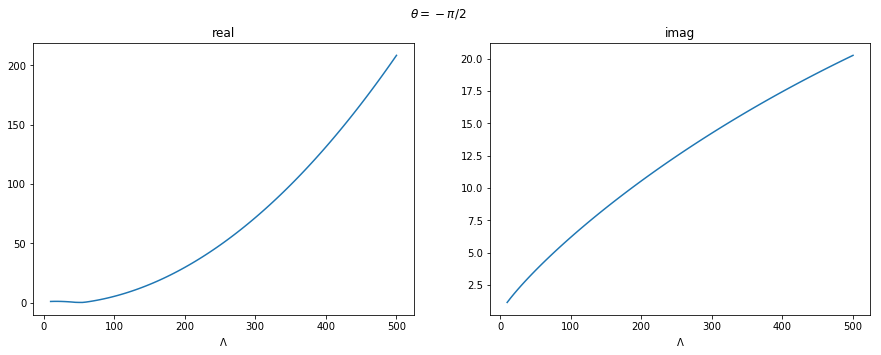

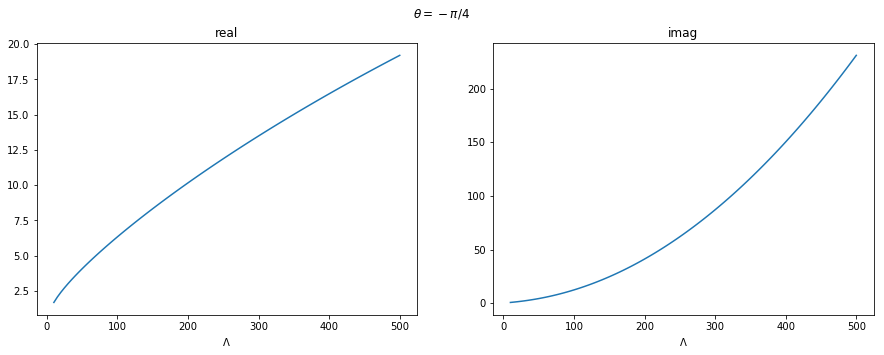

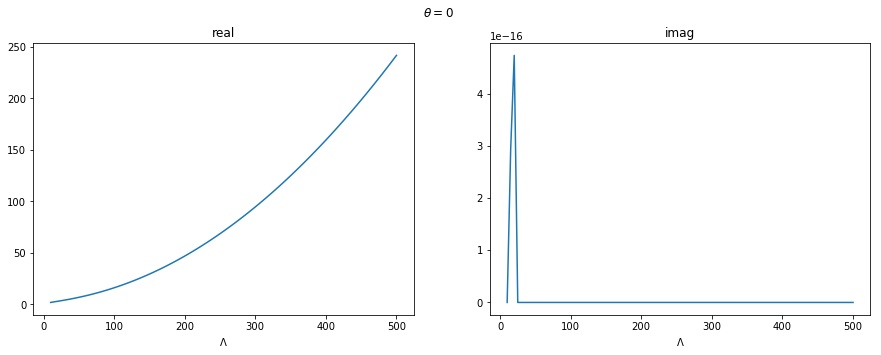

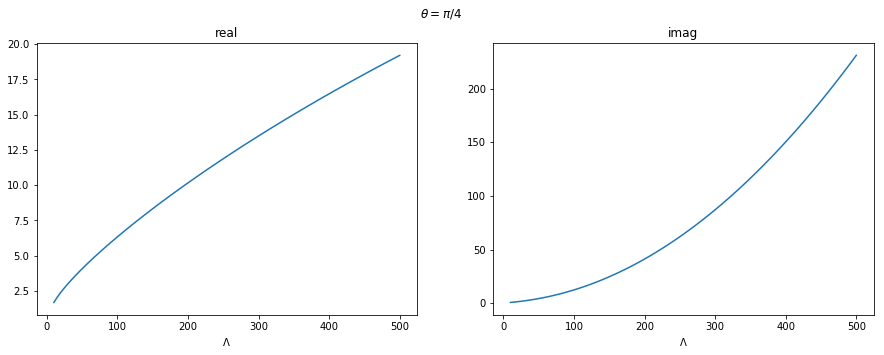

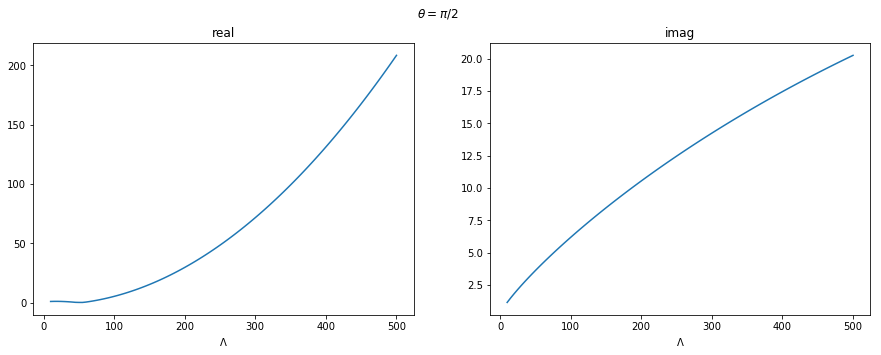

In [244]:
angles = [r'$\theta = -\pi/2$',r'$\theta = -\pi/4$',r'$\theta = 0$',r'$\theta = \pi/4$',r'$\theta = \pi/2$']

for i in range(5):
    plt.subplot(121)
    plt.plot(lam_bounds,real_results[i,:])
    plt.xlabel(r'$\Lambda$')
    plt.title('real')
    
    plt.subplot(122)
    plt.plot(lam_bounds,imag_results[i,:])
    plt.title('imag')
    plt.xlabel(r'$\Lambda$')
    
    plt.suptitle(angles[i])
    plt.show()

In [252]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,5)
lam_bounds = list(range(10,501,10))

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

real_results = np.zeros((5,len(lam_bounds),10))
imag_results = np.zeros((5,len(lam_bounds),10))

j = -1
for ind in tqdm(range(len(lam_bounds))):
    j += 1
    lam_bound = lam_bounds[ind]
    #display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
    i = 0
    for theta_val in theta_vals:
        lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

        A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
        df = e_vals + sigma*(e_min - e_vals)/sm

        to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
        #display(Markdown('### $\lambda$ = {}'.format(to_disp)))

        sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
        sys_.createSys()

        w_val = sys_.evalW(sm)
        
        w_real = [w_val[i].real for i in range(10)]
        real_results[i,j,:] = w_real#np.max(w_real)
        
        w_imag = [w_val[i].imag for i in range(10)]
        imag_results[i,j,:] = w_imag#np.max(w_imag)
        
        i+=1

100%|██████████| 50/50 [50:43<00:00, 60.87s/it]


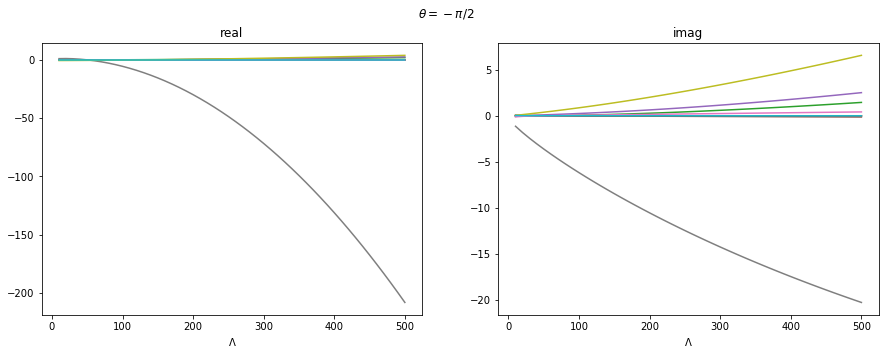

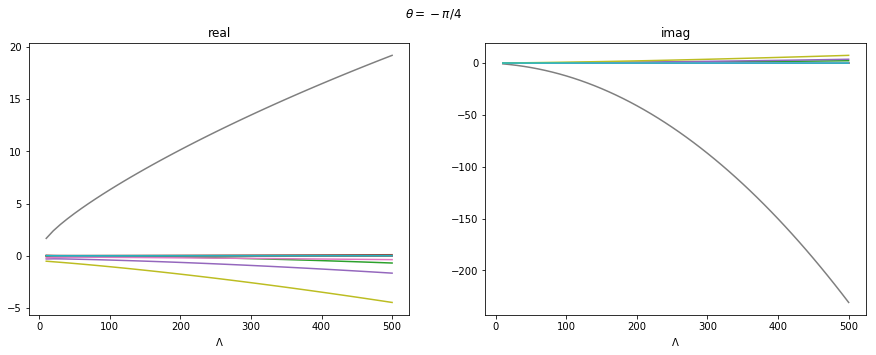

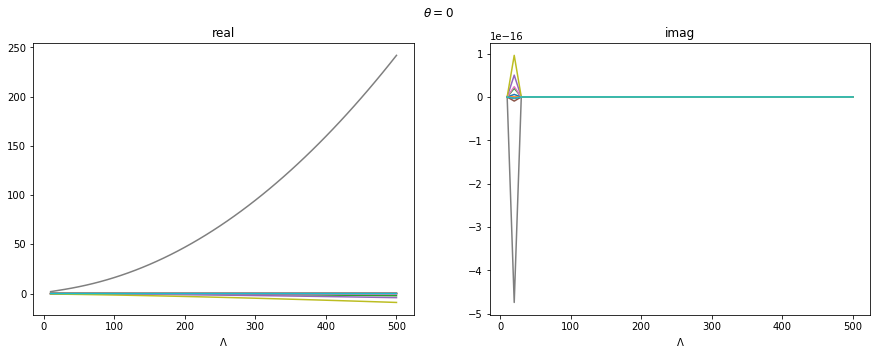

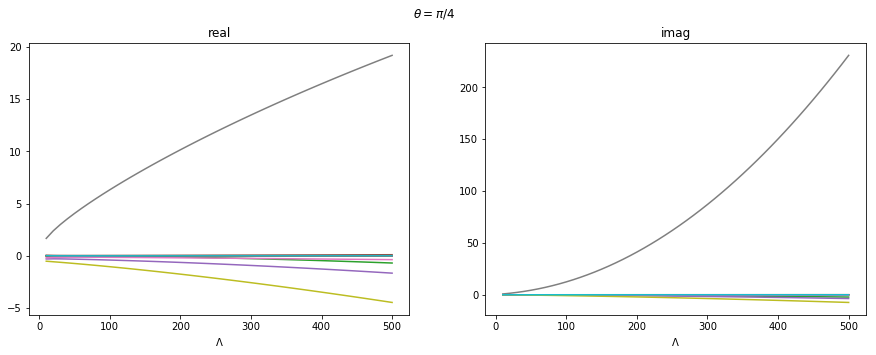

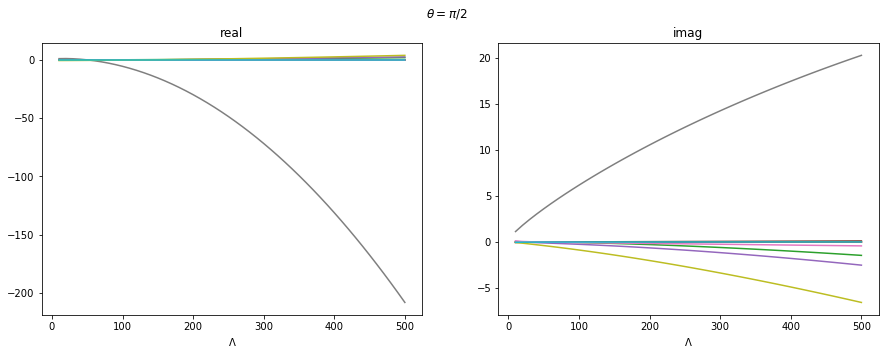

In [273]:
angles = [r'$\theta = -\pi/2$',r'$\theta = -\pi/4$',r'$\theta = 0$',r'$\theta = \pi/4$',r'$\theta = \pi/2$']

for i in range(5):
    plt.subplot(121)
    for k in range(10):
        plt.plot(lam_bounds,real_results[i,:,k],label=k)
    plt.xlabel(r'$\Lambda$')
    #plt.legend()
    plt.title('real')
    
    plt.subplot(122)
    for k in range(10):
        plt.plot(lam_bounds,imag_results[i,:,k])
    plt.title('imag')
    plt.xlabel(r'$\Lambda$')
    
    plt.suptitle(angles[i])
    plt.show()

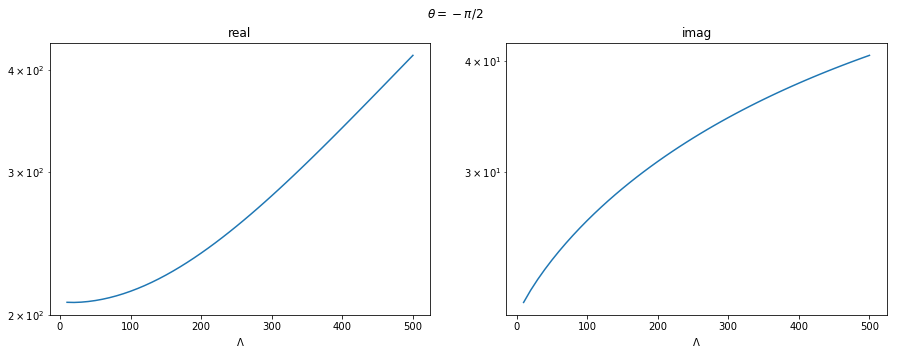

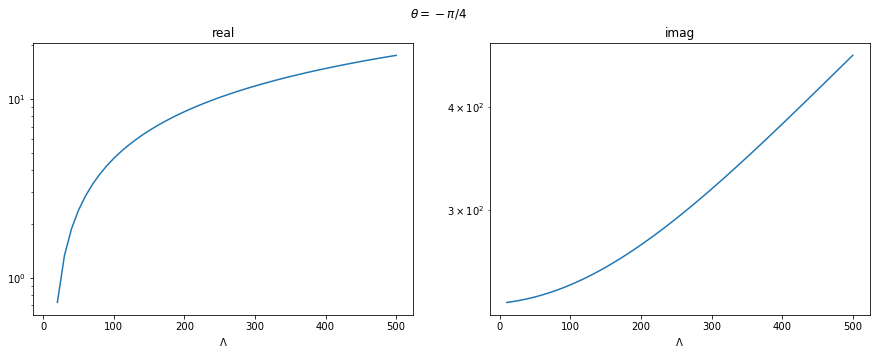

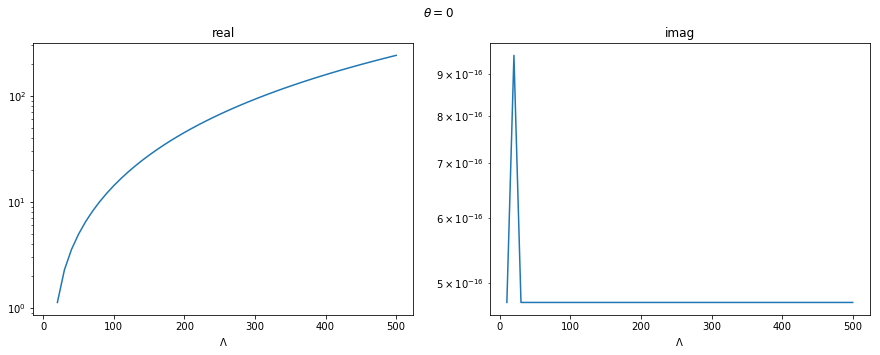

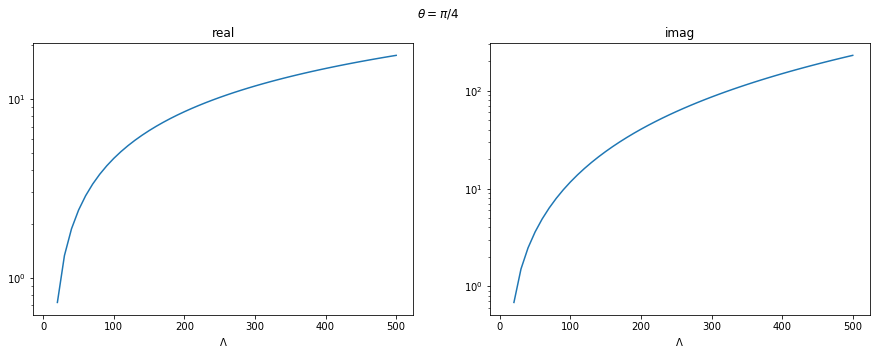

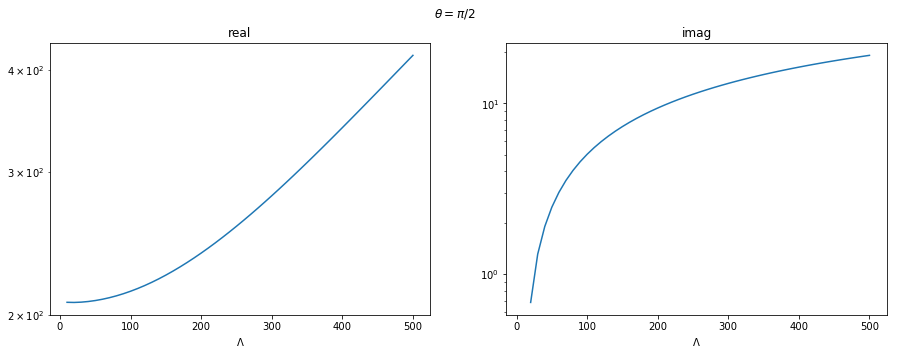

In [274]:
angles = [r'$\theta = -\pi/2$',r'$\theta = -\pi/4$',r'$\theta = 0$',r'$\theta = \pi/4$',r'$\theta = \pi/2$']

for i in range(5):
    plt.subplot(121)
    #for k in range(10):
    #    plt.plot(lam_bounds,real_results[i,:,k],label=k)
    if real_results[i,-1,7] > 0:
        toplot = real_results[i,:,7] - np.min(real_results[i,:,7])
    else:
        toplot = - (real_results[i,:,7] + np.min(real_results[i,:,7]))
    plt.semilogy(lam_bounds,toplot)
    plt.xlabel(r'$\Lambda$')
    #plt.legend()
    plt.title('real')
    
    plt.subplot(122)
    #for k in range(10):
    #    plt.plot(lam_bounds,imag_results[i,:,k])
    if imag_results[i,-1,7] > 0:
        toplot = imag_results[i,:,7] - np.min(imag_results[i,:,7])
    else:
        toplot = - (imag_results[i,:,7] + np.min(imag_results[i,:,7]))
    plt.semilogy(lam_bounds,toplot)
    plt.title('imag')
    plt.xlabel(r'$\Lambda$')
    
    plt.suptitle(angles[i])
    plt.show()

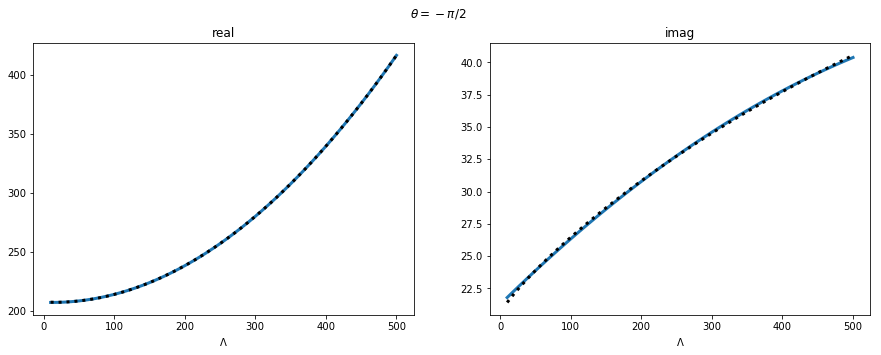

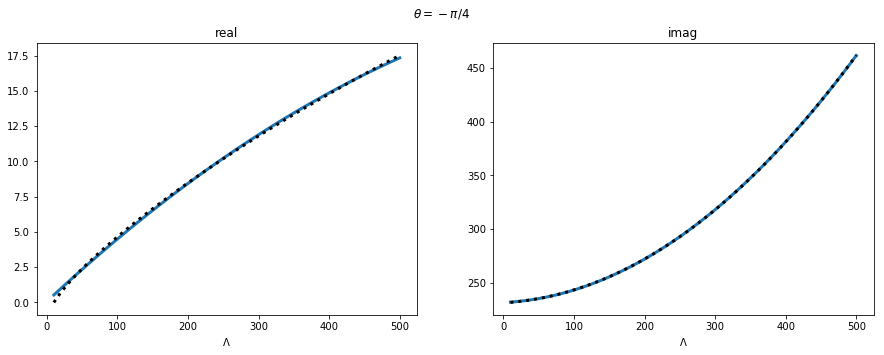

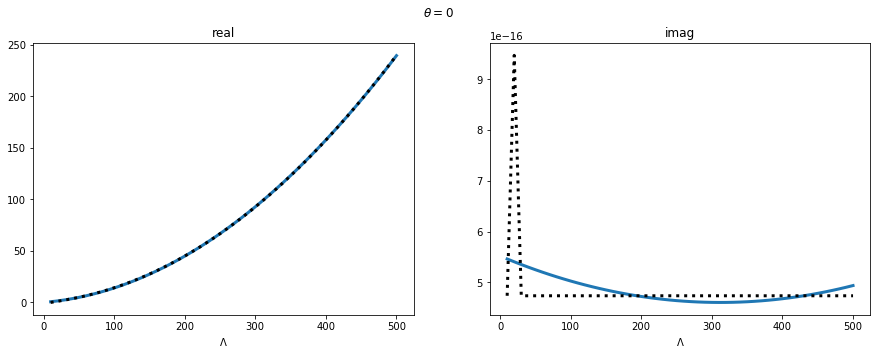

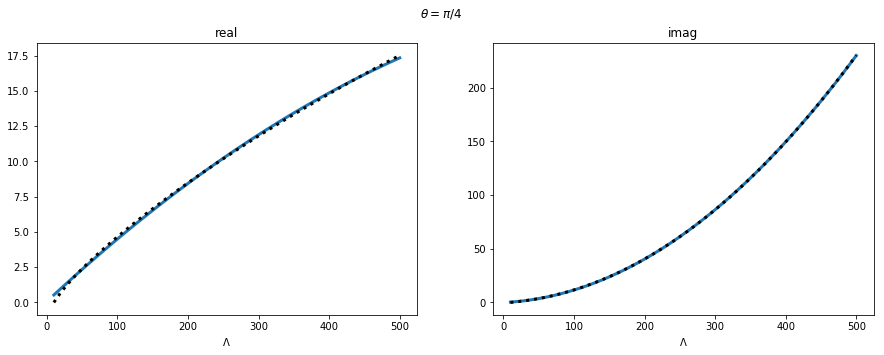

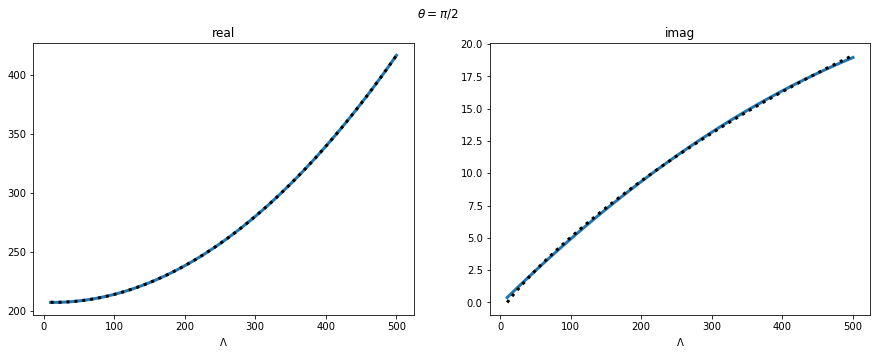

In [287]:
angles = [r'$\theta = -\pi/2$',r'$\theta = -\pi/4$',r'$\theta = 0$',r'$\theta = \pi/4$',r'$\theta = \pi/2$']

for i in range(5):
    plt.subplot(121)
    #for k in range(10):
    #    plt.plot(lam_bounds,real_results[i,:,k],label=k)
    if real_results[i,-1,7] > 0:
        toplot = real_results[i,:,7] - np.min(real_results[i,:,7])
    else:
        toplot = - (real_results[i,:,7] + np.min(real_results[i,:,7]))
        
    coefs = np.polyfit(lam_bounds,toplot,2)
    f = np.poly1d(coefs)
    
    plt.plot(lam_bounds,f(lam_bounds),linewidth=3)
    plt.plot(lam_bounds,toplot,':k',linewidth=3)
    plt.xlabel(r'$\Lambda$')
    #plt.legend()
    plt.title('real')
    
    plt.subplot(122)
    #for k in range(10):
    #    plt.plot(lam_bounds,imag_results[i,:,k])
    if imag_results[i,-1,7] > 0:
        toplot = imag_results[i,:,7] - np.min(imag_results[i,:,7])
    else:
        toplot = - (imag_results[i,:,7] + np.min(imag_results[i,:,7]))
        
    coefs = np.polyfit(lam_bounds,toplot,2)
    f = np.poly1d(coefs)
    
    plt.plot(lam_bounds,f(lam_bounds),linewidth=3)
    plt.plot(lam_bounds,toplot,':k', linewidth=3)
    #plt.legend()
    plt.title('imag')
    plt.xlabel(r'$\Lambda$')
    
    plt.suptitle(angles[i])
    plt.show()

In [ ]:
theta_vals = np.linspace(-np.pi/2,np.pi/2,5)
lam_bounds = list(range(10,501,10))

G = 5/3
vp = G/(G+2)
sp = 0
sm = 1-vp

real_results = np.zeros((5,len(lam_bounds),10))
imag_results = np.zeros((5,len(lam_bounds),10))

j = -1
for ind in tqdm(range(len(lam_bounds))):
    j += 1
    lam_bound = lam_bounds[ind]
    #display(Markdown('# $\Lambda$ = {}'.format(lam_bound)))
    i = 0
    for theta_val in theta_vals:
        lam_val = lam_bound*(np.cos(theta_val) + 1j*np.sin(theta_val))

        A, u_x, e_vals, e_vecs, e_min = solve_lifted_evans(lam_val)
        df = e_vals + sigma*(e_min - e_vals)/sm

        to_disp = round(lam_val.real,4) + round(lam_val.imag,4)*1j
        #display(Markdown('### $\lambda$ = {}'.format(to_disp)))

        sys_ = SystemSolve(10, 5, A, u_x, df, e_vecs, False, True)
        sys_.createSys()

        w_val = sys_.evalW(sm)
        
        w_real = [w_val[i].real for i in range(10)]
        real_results[i,j,:] = w_real#np.max(w_real)
        
        w_imag = [w_val[i].imag for i in range(10)]
        imag_results[i,j,:] = w_imag#np.max(w_imag)
        
        i+=1